## TOC:
* [Reading CVS files](#first-bullet)
* [Luminosity section](#second-bullet)
* [Trigger rate section](#third-bullet)
* [Model inference section](#fourth-bullet)

In [1]:
import math
import numpy as np
import pandas as pd
import tensorflow as tf

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from mpl_toolkits.axes_grid1 import make_axes_locatable

from scipy import ndimage, misc
import datetime
from datetime import timedelta

import keras
from keras import backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import Sequential, load_model
from keras.layers import Dense, Flatten, Reshape, Conv1D, \
MaxPooling1D, AveragePooling1D, UpSampling1D, InputLayer

from scipy import ndimage, misc

from sklearn import svm
from sklearn.ensemble import IsolationForest
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc
from sklearn.model_selection import cross_val_score, train_test_split,\
StratifiedKFold, GridSearchCV
from sklearn.preprocessing import MaxAbsScaler
from sklearn.neighbors import LocalOutlierFactor

Using TensorFlow backend.


In [2]:
# Change presentation settings
%matplotlib inline

matplotlib.rcParams["figure.figsize"] = (15.0, 8.0)
matplotlib.rcParams["xtick.labelsize"] = 16
matplotlib.rcParams["ytick.labelsize"] = 16
matplotlib.rcParams["axes.spines.left"] = True
matplotlib.rcParams["axes.spines.bottom"] = True
matplotlib.rcParams["axes.spines.right"] = True
matplotlib.rcParams["axes.spines.top"] = True
matplotlib.rcParams["axes.titlesize"] = 16
matplotlib.rcParams["figure.titlesize"] = 16
matplotlib.rcParams["axes.labelsize"] = 14
matplotlib.rcParams["legend.fontsize"] = 14

In [3]:
runs = [306125, 319579, 321312]
lumi_directory = data_directory = "./lumi"
rates_directory = "./rates"

# Reading cvs files <a class="anchor" id="first-bullet"></a>

Reading instantaneous luminosities from the cvs file produced with brilcalc and saving into a pandas dataframe:

In [4]:
df_rates = pd.DataFrame()
int_lumi2 = pd.DataFrame()
for run in runs:
    print("Loading %s" % run)
    path = "%s/lumi_%s.csv" % (lumi_directory, run)
    int_lumi2 = int_lumi2.append(pd.read_csv(path,
        names=["runfill", "ls", "time", "beamstatus", "energy", "delivered",\
               "recorded", "avgpu", "source"]), 
        ignore_index=True);    
    path = "%s/dt_rates_%s.csv" % (rates_directory, run)
    df_rates = df_rates.append(pd.read_csv(path, 
        names=["run", "time", "board", "RPC1", "RPC2", "RPC3", "RPC4",\
               "DT1", "DT2", "DT3", "DT4", "DT5"]), 
        ignore_index=True);
print("Done.")

Loading 306125
Loading 319579
Loading 321312
Done.


# Luminosity section <a class="anchor" id="second-bullet"></a>

Dropping useless rows inherited from the lumi CVS file:

In [5]:
int_lumi2["source"] = int_lumi2["source"].astype('str')
int_lumi2 = int_lumi2[int_lumi2["source"] != "nan"]
int_lumi2 = int_lumi2[int_lumi2["source"] != "source"]

Splitting run:fill field and the start and end lumi sections:

In [6]:
int_lumi2['run'], int_lumi2['fill'] = int_lumi2['runfill'].str.split(':', 1).str
int_lumi2['ls_start'], int_lumi2['ls_end'] = int_lumi2['ls'].str.split(':', 1).str

Converting run to integer and luminosities to float:

In [7]:
int_lumi2["run"] = int_lumi2["run"].astype('int')
int_lumi2["ls_start"] = int_lumi2["ls_start"].astype('int')
int_lumi2["ls_end"] = int_lumi2["ls_end"].astype('int')
int_lumi2["delivered"] = int_lumi2["delivered"].astype('float64')
int_lumi2["recorded"] = int_lumi2["recorded"].astype('float64') 

Converting time stamp to datetime:

In [8]:
def transform_time(data):
    from datetime import datetime
    time_str = data.time
    #print time_str
    datetime_object = datetime.strptime(time_str, "%m/%d/%y %H:%M:%S")
    #print datetime_object
    return datetime_object
int_lumi2["time"] = int_lumi2.apply(transform_time, axis=1);

Creating end time column from the start time:

In [9]:
int_lumi2["time_end"] = int_lumi2["time"]

Finding the runs and their start and end times:

In [10]:
boundaries = pd.DataFrame(columns=["run", "start", "end", "ls_start", "ls_end", "nLS"])
for i in runs:
    start = int_lumi2[int_lumi2["run"] == i]["time"]
    end = int_lumi2[int_lumi2["run"] == i]["time_end"]
    start_ls = int_lumi2[int_lumi2["run"] == i]["ls_start"]
    end_ls = int_lumi2[int_lumi2["run"] == i]["ls_end"]
    start =  start.reset_index(drop=True)
    end =  end.reset_index(drop=True)
    start_ls =  start_ls.reset_index(drop=True)
    end_ls =  end_ls.reset_index(drop=True)
    nLS = int(start_ls.iloc[-1]) - int(start_ls.iloc[0]) + 1
    print i, start.iloc[0], start.iloc[-1], start_ls.iloc[0], start_ls.iloc[-1], nLS
    boundaries = boundaries.append({"run": i, "start": start.iloc[0], "end": start.iloc[-1], 
                                   "ls_start": start_ls.iloc[0], "ls_end": start_ls.iloc[-1], "nLS": nLS}, 
                                   ignore_index = True)

306125 2017-11-03 14:46:12 2017-11-04 10:14:06 1 3007 3007
319579 2018-07-13 04:27:45 2018-07-14 01:00:07 1 3173 3173
321312 2018-08-15 20:55:17 2018-08-16 01:55:14 1 773 773


Reindexing the dataframe after removing some lines:

In [11]:
int_lumi2.index = pd.RangeIndex(len(int_lumi2.index))

In [12]:
print len(int_lumi2.index)

6953


Filling end time column:

In [13]:
def addTimeOffSet(startdate):
    enddate = pd.to_datetime(startdate) + pd.DateOffset(seconds=23)
    return enddate

def shiftElement(df, boundaries):
    run0 = boundaries["run"].iloc[0]
    for index, rows in df.iterrows():
        run = rows["run"]
        nls = int(boundaries[boundaries["run"] == run]["nLS"])
        if(run > run0):
            nls = nls + index
        #print run, nls
        if((index < nls) & (index < len(int_lumi2.index)-1)):
            #print index, run, rows["time"], df["time"][index+1]
            df.loc[index, "time_end"] = df["time"][index+1]
        elif (index == len(int_lumi2.index)-1):
            #print index, run, rows["time"], addTimeOffSet(rows["time"])
            df.loc[index, "time_end"] = addTimeOffSet(rows["time"])
                    
shiftElement(int_lumi2, boundaries)

In [14]:
#print int_lumi2["beamstatus"]
int_lumi2 = int_lumi2[int_lumi2["beamstatus"] == "STABLE BEAMS"]

Plotting the instantaneous luminosities:

In [15]:
def plot_inst_lumi(x_val, y_val, z_val, title):
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel(r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]")
    xfmt = mdates.DateFormatter('%y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(x_val, y_val, 'ro-')
    plt.plot(x_val, z_val, 'bo-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show();

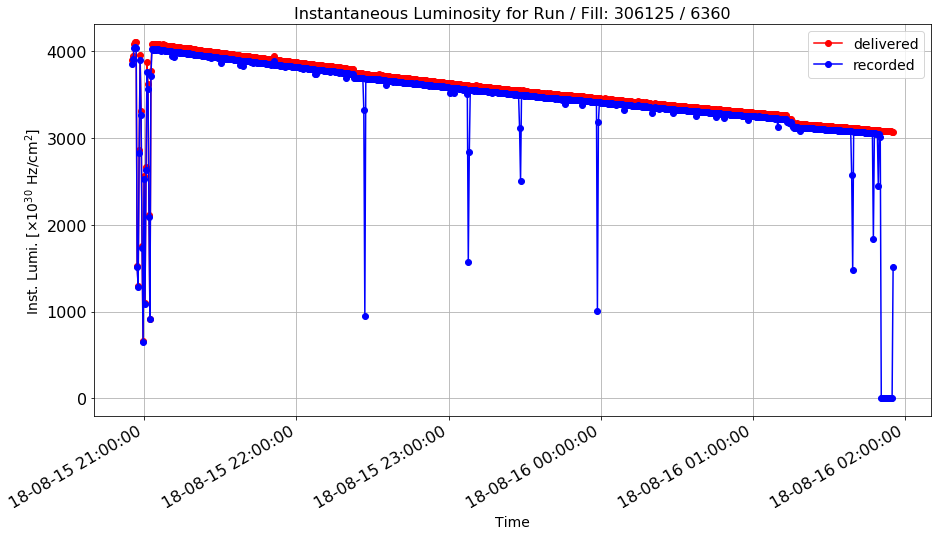

In [16]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 321312]["time"], 
               int_lumi2[int_lumi2["run"] == 321312]["delivered"], 
               int_lumi2[int_lumi2["run"] == 321312]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               (boundaries["run"].iloc[0], int_lumi2["fill"].iloc[0])))

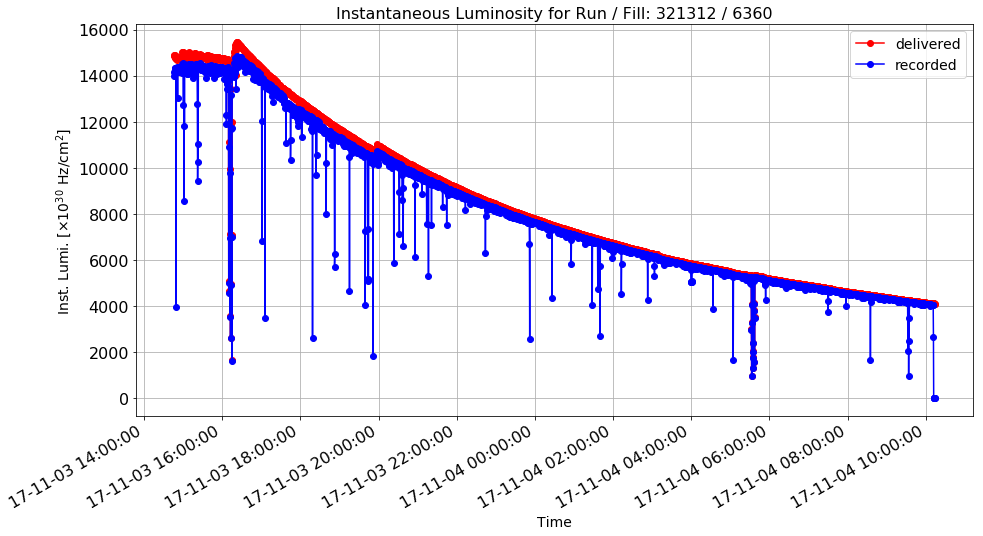

In [17]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 306125]["time"], 
               int_lumi2[int_lumi2["run"] == 306125]["delivered"], 
               int_lumi2[int_lumi2["run"] == 306125]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               (boundaries["run"].iloc[2], int_lumi2["fill"].iloc[2])))

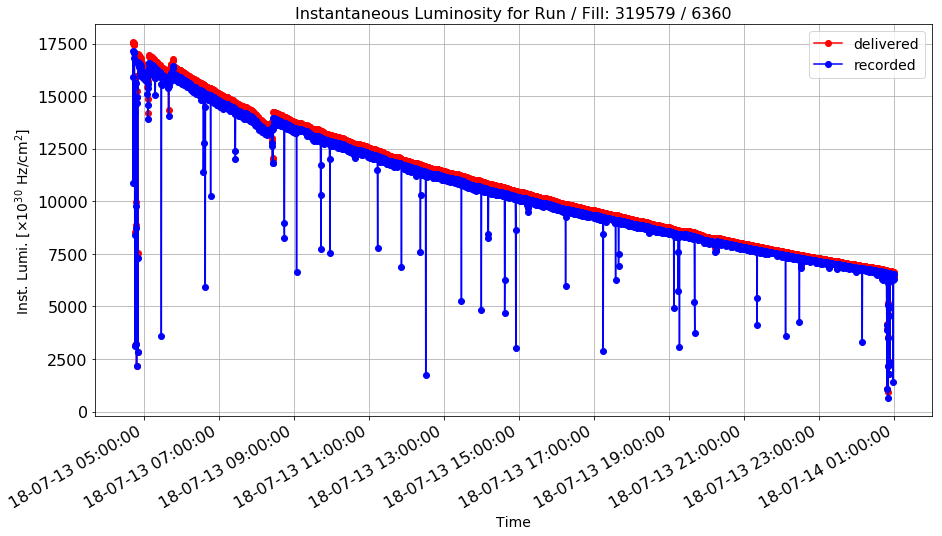

In [18]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 319579]["time"], 
               int_lumi2[int_lumi2["run"] == 319579]["delivered"], 
               int_lumi2[int_lumi2["run"] == 319579]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               (boundaries["run"].iloc[1], int_lumi2["fill"].iloc[1])))

In [19]:
#int_lumi2.to_csv("int_lumi_issues.csv", sep='\t')

# Trigger rate section <a class="anchor" id="third-bullet"></a>

Converting columns to proper data types:

In [20]:
df_rates["time"] = pd.to_datetime(df_rates["time"])
df_rates["run"] = df_rates["run"].astype('int')
#print df_rates["time"]

Splitting, converting and adding new columns:

In [21]:
df_rates["board"].replace(regex=True,inplace=True,to_replace=r'm',value=r'-')
df_rates["board"].replace(regex=True,inplace=True,to_replace=r'p',value=r'+')
df_rates['wheel'], df_rates['sector'] = df_rates['board'].str.split('_', 1).str
df_rates["wheel"] = df_rates["wheel"].astype(str)
df_rates["sector"] = df_rates["sector"].astype(str)

In [22]:
df_rates["wheel"].replace(regex=True,inplace=True,to_replace=r'YB',value=r'')
df_rates["sector"].replace(regex=True,inplace=True,to_replace=r'S',value=r'')
df_rates["wheel"] = df_rates["wheel"].astype('int')
df_rates["sector"] = df_rates["sector"].astype('int')
df_rates["ls"] = -1
df_rates["lumi"] = -1.0
df_rates["score"] = -1
#df_rates.to_csv("df_rates.csv", sep='\t')

Plotting the rate coming from one of the stations:

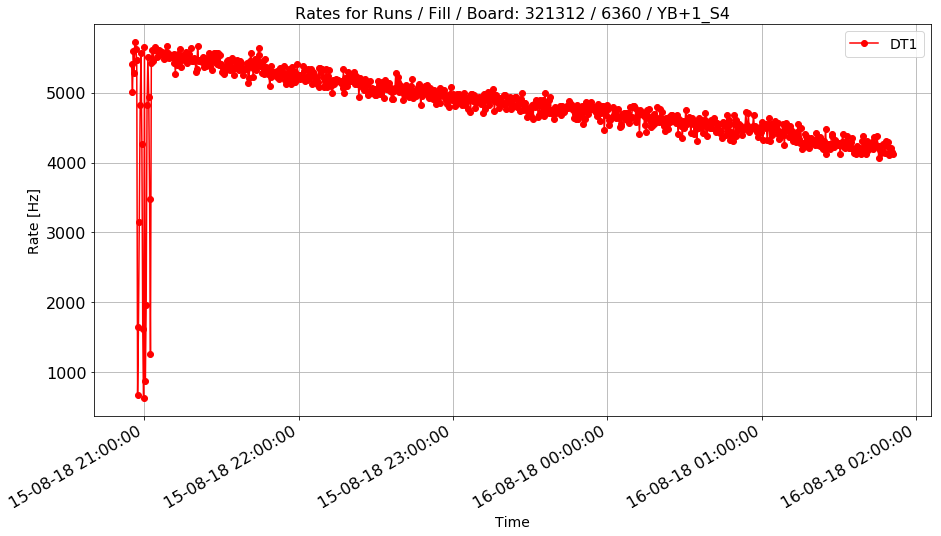

In [23]:
def plot_rate_vs_time(df, x_val, y_val, z_val, title):
    df_temp = df.copy()
    crit = df_temp["board"] == z_val
    df_temp = df_temp[crit]
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel("Rate [Hz]")
    ax.xaxis_date()
    xfmt = mdates.DateFormatter('%d-%m-%y %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(df_temp[x_val], df_temp[y_val], 'ro-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show();

plot_rate_vs_time(df_rates[df_rates.run == 321312], "time", "DT1",\
                  "YB+1_S4", "Rates for Runs / Fill / Board: %s / %s / %s" % \
                  ("321312", int_lumi2["fill"].iloc[2], "YB+1_S4"))

Associating a LS and an instantaneous luminosity to each rate:

In [24]:
#Just a backup copy
df_rates_backup = df_rates.copy()

In [25]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Removing the measurements taken before and after the start and end time reported by the brilcalc output. All the 60 boards are measured at the same time. In order to speed-up the association, we take just one board, the first one. This reduces the dataframe and the time needed to go though it by a factor of 60.

In [26]:
time0 = boundaries["start"].iloc[0]
timeF = boundaries["end"].iloc[-1]
print time0, timeF
#print df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
df_rates = df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
rule = df_rates.duplicated(subset=["time"])
count = (rule == False).sum()
print "Duplicates:", rule.sum()
df_rates_noduplicates = df_rates[rule == False]
#print df_rates_noduplicates

2017-11-03 14:46:12 2018-08-16 01:55:14
Duplicates: 1551287


In [27]:
print len(df_rates_noduplicates)

26293


Assigning the LS and the inst. lumi. to the measurements for the selected board:

In [28]:
def assignLS(df1, df2, boundaries):
    temp = df1.copy()
    j = 1
    for index1, row1 in df1.iterrows():
        run1 = row1["run"]
        time1 = row1["time"]
        #print index1, run1, time1
        ti = time1 - 2*pd.DateOffset(seconds=23)
        tf = time1 + 2*pd.DateOffset(seconds=23)
        indexes2 = df2[(df2.run == run1) & (df2.time > ti) & (df2.time < tf)].index
        #print indexes2
        for i in indexes2:
            if((time1 >= df2["time"].loc[i]) & (time1 < df2["time_end"].loc[i])):
                #print time1, df2["time"].loc[i], df2["time_end"].loc[i]
                if(j%1000 == 0): 
                    print j
                j = j + 1
                ls = df2["ls_start"].loc[i]
                lumi = df2["delivered"].loc[i]
                #print index1, run1, time1, ls, lumi
                temp.loc[index1, "ls"] = ls
                temp.loc[index1, "lumi"] = lumi
                break
    return temp

temp = assignLS(df_rates_noduplicates, int_lumi2, boundaries)
df_rates_noduplicates = temp

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000


Removing the few cases not assigned and that are still at -1:

In [29]:
df_rates_noduplicates = df_rates_noduplicates[df_rates_noduplicates["ls"] > 0]
print len(df_rates_noduplicates)

26243


Save in a csv file:

In [30]:
#df_rates.to_csv("df_rates_issues.csv", sep='\t')
#df_rates_noduplicates.to_csv("df_rates_nodup_issues.csv", sep='\t')

In [31]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Assign the LS and the inst. lumi. to all the 60 boards for each time:

In [32]:
def assignLS_ext(df1, df2):
    temp = df1.copy()
    indexes = []
    for index in df2.index:
        if index%10000 == 0:
            print index
        time = df2["time"].loc[index]
        ls = df2["ls"].loc[index]
        lumi = df2["lumi"].loc[index]
        des = (temp["time"] == time)
        indexes = temp[des].index
        #print time, ls, indexes
        temp.loc[des, "ls"] = ls
        temp.loc[des, "lumi"] = lumi
    return temp
    
temp = assignLS_ext(df_rates, df_rates_noduplicates)

30000
60000
90000
120000
150000
180000
210000
240000
270000
300000
330000
360000
390000
420000
450000
480000
510000
540000
570000
600000
630000
660000
690000
720000
750000
780000
810000
840000
870000
900000
930000
960000
990000
1020000
1050000
1080000
1110000
1140000
1170000
1200000
1230000
1260000
1290000
1320000
1350000
1380000
1410000
1440000
1470000
1500000
1530000
1560000


Save another backup copy:

In [33]:
df_rates = temp.copy()
#print df_rates[df_rates.ls <= 0]

Removing measurements without LS assignment:

In [34]:
df_rates_backup = df_rates.copy()
df_rates = df_rates[df_rates.ls > 0]
#print df_rates["ls"]

In [35]:
#print df_rates[df_rates.ls <= 0]
#df_rates.to_csv("df_rates_issues.csv", sep='\t')

Averaging the rates associated to the same LS:

In [36]:
df_boards = df_rates.copy()
df_boards = df_boards.groupby(['board']).size().reset_index(name='counts')
print len(df_boards)
#print df_boards

60


Too slow to use all the measurements. Averaging over 10 LS:

In [37]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

In [38]:
bunch = 10
def assignGroup(data, div = bunch):
    res = int(data/div)
    #print data, res
    return res

df_rates["group"] = df_rates["ls"]
df_rates["group"] = df_rates["group"].apply(assignGroup)

In [39]:
temp1 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["ls", "lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]].mean().reset_index()

temp2 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]].std().reset_index()

temp3 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]]\
.size().reset_index(name='counts')

temp2 = temp2.rename(index=str, columns={"lumi": "errLumi", "RPC1": "errRPC1", "RPC2": "errRPC2",\
                                         "RPC3": "errRPC3", "RPC4": "errRPC4", "DT1": "errDT1",\
                                         "DT2": "errDT2", "DT3": "errDT3",\
                                         "DT4": "errDT4", "DT5": "errDT5"})

cols_to_use2 = temp2.columns.difference(temp1.columns)
cols_to_use3 = temp3.columns.difference(temp1.columns)

temp2 = temp2[cols_to_use2]
temp3 = temp3[cols_to_use3]

#print temp1.iloc[100]
#print temp2.iloc[100]
#print temp3.iloc[100]

temp1.reset_index(drop=True, inplace=True)
temp2.reset_index(drop=True, inplace=True)
temp3.reset_index(drop=True, inplace=True)

df_rates = pd.concat([temp1, temp2, temp3], axis = 1)

Calculating the errors on the mean values calculated in the previous step:

In [40]:
import math
def applySqrt(data):
    return math.sqrt(data)

df_rates["counts"] = df_rates["counts"].apply(applySqrt)

for i in list(df_rates):
    if "err" in i:
        #print i
        df_rates[i] = df_rates[i]/df_rates["counts"]

Check for null or NaN values:

In [41]:
print df_rates.isnull().values.any()
null_columns=df_rates.columns[df_rates.isnull().any()]
print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())
df_rates = df_rates.fillna(0)
print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())

False
Empty DataFrame
Columns: []
Index: []
Empty DataFrame
Columns: []
Index: []


In [42]:
#Another backup
#df_rates_backup = df_rates.copy()
#df_rates.to_csv("df_rates_issues.csv", sep='\t')

In [43]:
#Restore backup
#df_rates = df_rates_backup.copy()

In [44]:
print len(df_rates)

41580


Uncomment to check just one case:

In [45]:
#for index, row in df_rates.iterrows():
    #if row["board"] == "YB0_S1":
        #print "Index:", index,", Run:", row["run"],", Board: ",row["board"],",\
        #LS: ",row["ls"],", Rate: ",row["DT1"],", Error: ",row["errDT1"]

Plotting the result:

In [185]:
def plot_ratio_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    inter = []
    errors = []
    df_temp["ratio"] = df_temp[y_val]/df_temp[x_val]
    df_temp["errRatio"] = (1/df_temp[x_val])*\
    np.sqrt(df_temp[y_err]**2 + df_temp["errLumi"]**2*df_temp["ratio"]**2)
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        if (run[i] == 306125):
            rule = rule & (df_temp.lumi > 6000)
        if (run[i] == 319579):
            rule = rule & (df_temp.lumi > 10000)
        val1 = df_temp[rule][x_val]
        val2 = df_temp[rule]["ratio"]
        inter.append(np.polyfit(val1, val2, 0)) #append anomalous fit,\
                                                #then normal fit, and ratio of the two
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        errors.append(df_temp[rule]["errRatio"])
        #plt.plot(df_temp[rule][x_val], df_temp[rule]["ratio"], opt[i], label=str(run[i]))
        newstr = opt[i].replace("o", "")
        plt.errorbar(df_temp[rule][x_val], df_temp[rule]["ratio"], xerr=x_err,\
        yerr=df_temp[rule]["errRatio"], fmt=opt[i], ecolor=newstr, label=str(run[i]))
    a, b, c = inter[0], inter[1], 1-inter[0]/inter[1]
    plt.legend(loc="best")
    plt.title(title)
    plt.show()
    return float(a), float(b), float(c) #anomalous cs, normal cs, ratio of the two

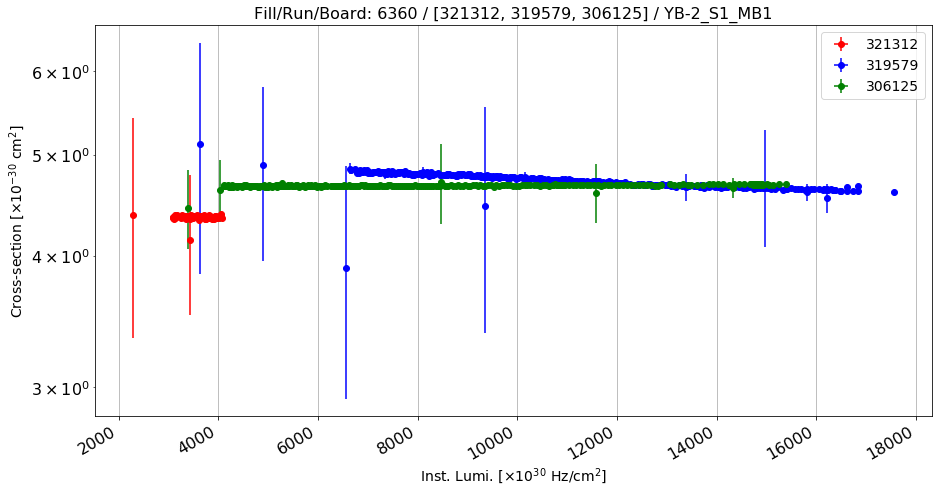

Anomalous CS: 4.35723263091 , Normal CS: 4.68118951908 , Ratio: 0.0692039676774


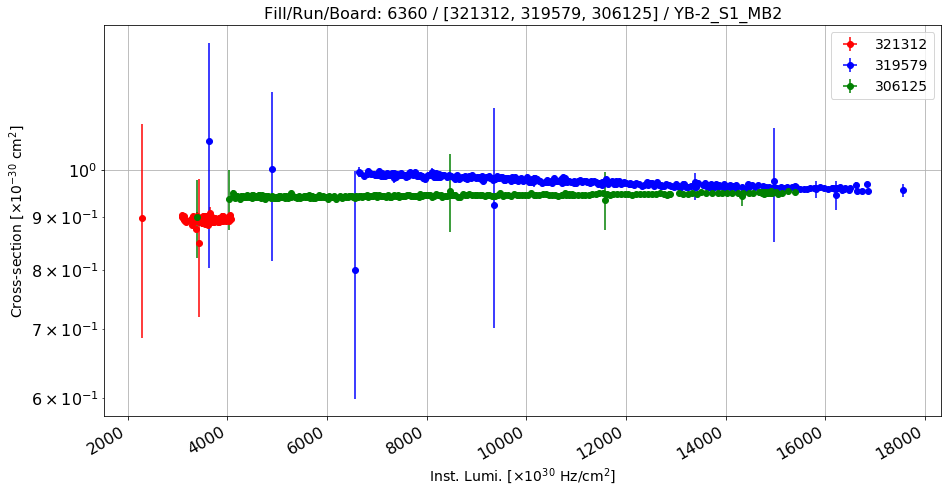

Anomalous CS: 0.894757729293 , Normal CS: 0.967879887994 , Ratio: 0.0755487944408


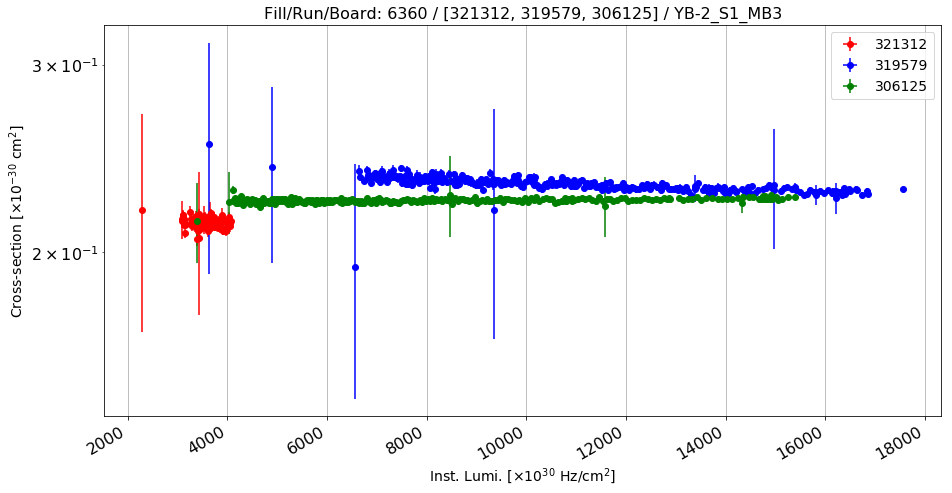

Anomalous CS: 0.21329279857 , Normal CS: 0.230131297663 , Ratio: 0.0731690963569


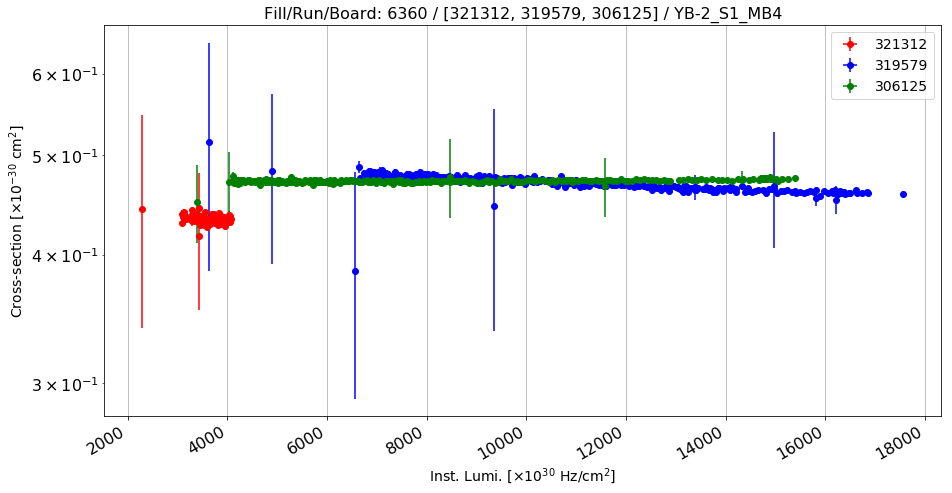

Anomalous CS: 0.434138584567 , Normal CS: 0.46580117075 , Ratio: 0.0679744667294


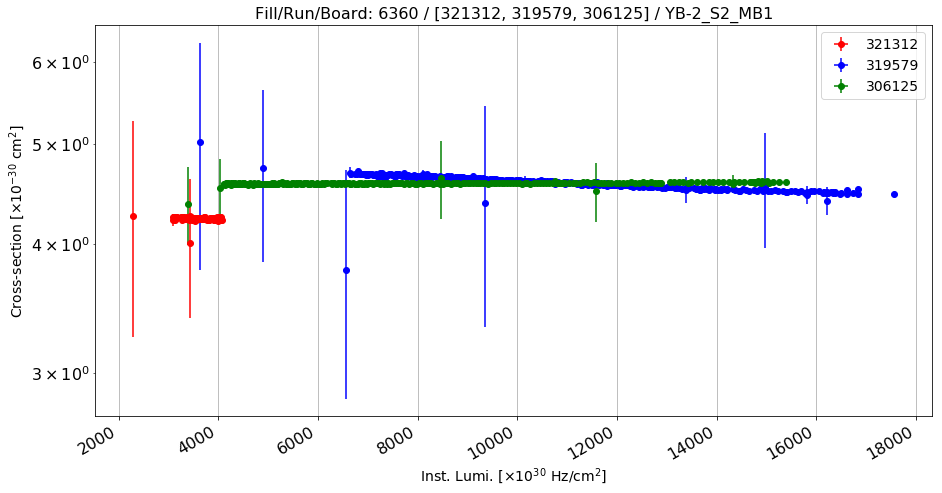

Anomalous CS: 4.23073401913 , Normal CS: 4.54009464772 , Ratio: 0.0681396870775


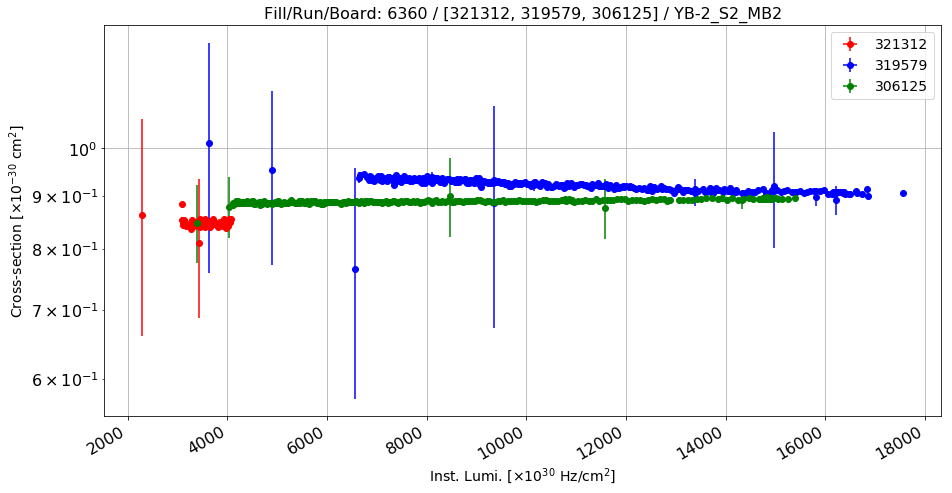

Anomalous CS: 0.847368513667 , Normal CS: 0.914478338817 , Ratio: 0.0733859100874


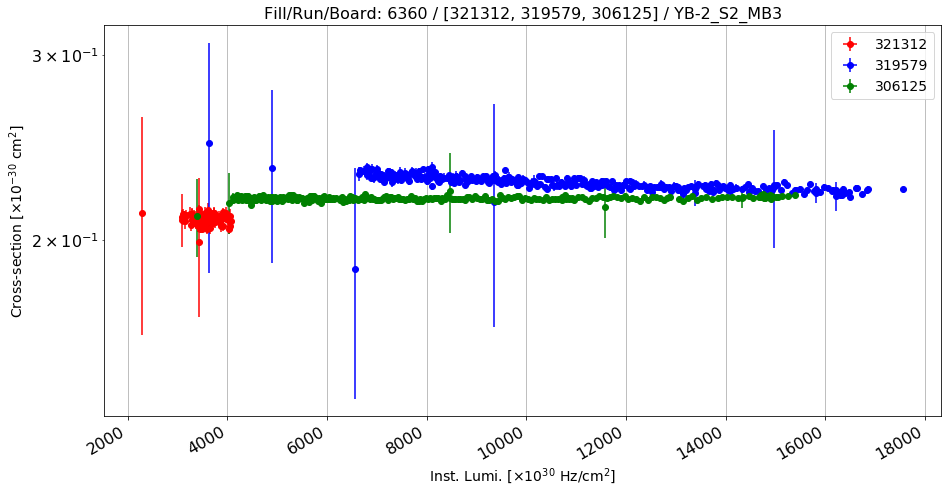

Anomalous CS: 0.2093581777 , Normal CS: 0.224881294946 , Ratio: 0.0690280498873


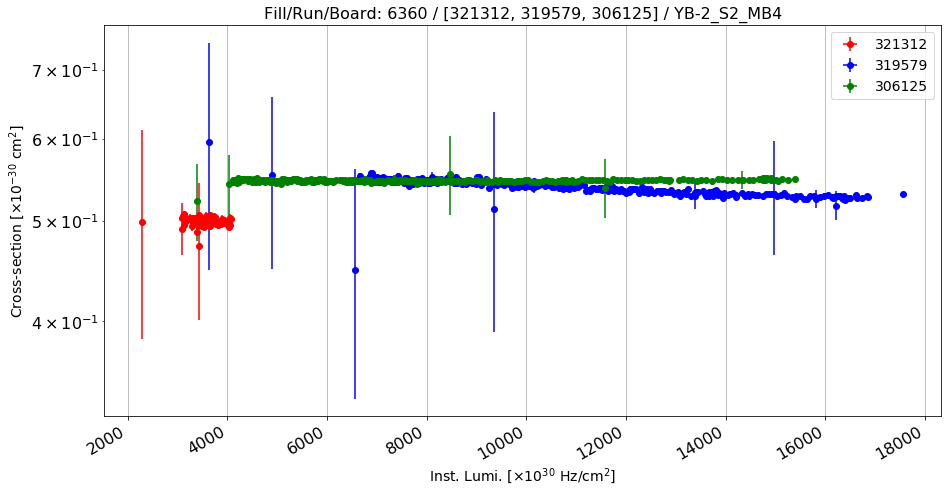

Anomalous CS: 0.499663680212 , Normal CS: 0.533852203589 , Ratio: 0.0640411768409


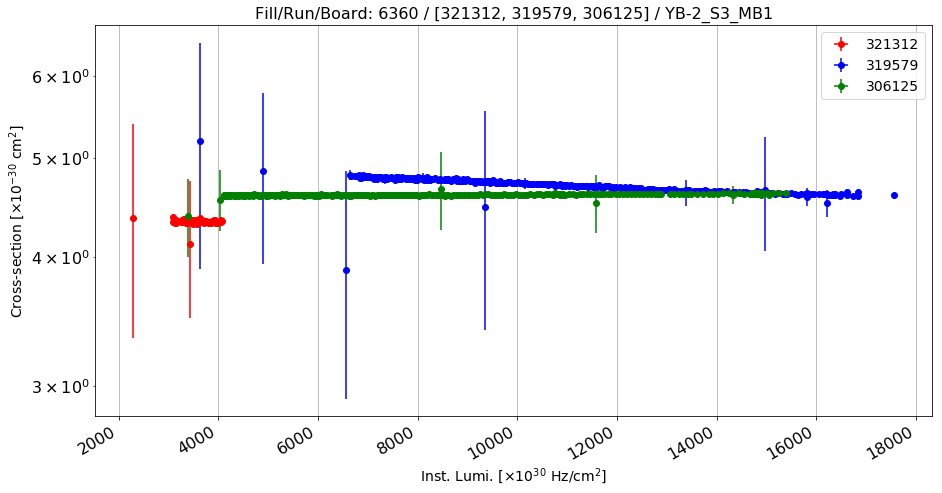

Anomalous CS: 4.33167821179 , Normal CS: 4.65701433337 , Ratio: 0.0698593773369


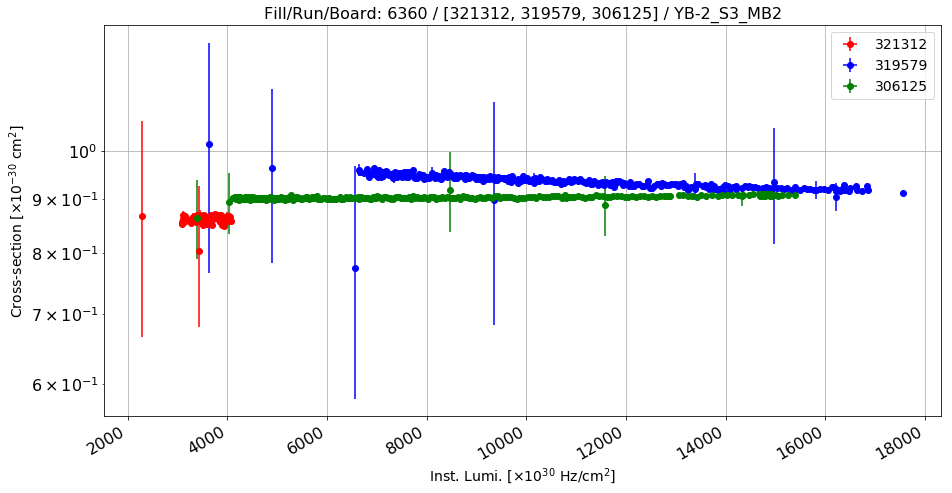

Anomalous CS: 0.861123727894 , Normal CS: 0.92795837749 , Ratio: 0.072023326927


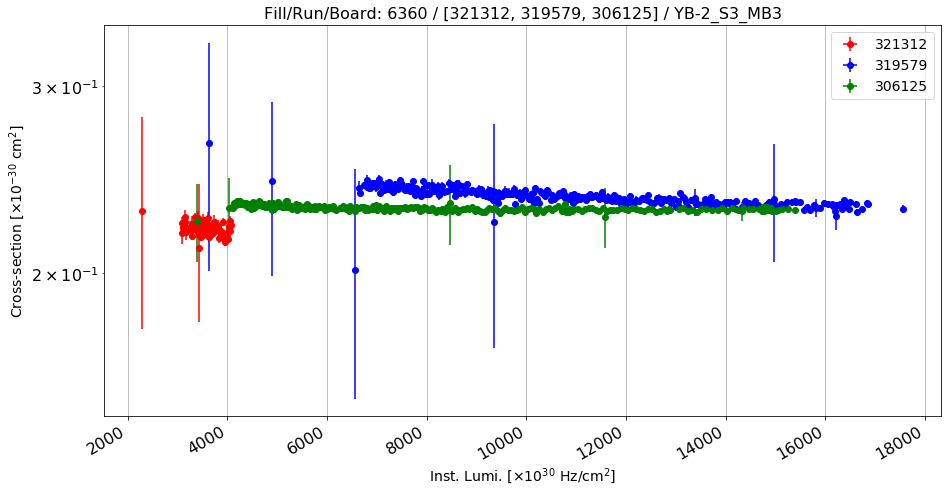

Anomalous CS: 0.220447315653 , Normal CS: 0.233996925592 , Ratio: 0.0579050767664


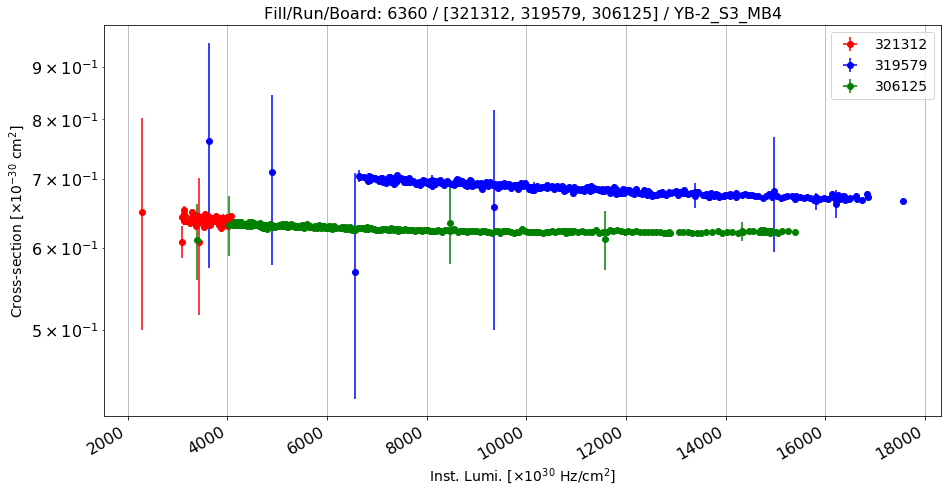

Anomalous CS: 0.638954367192 , Normal CS: 0.678813996203 , Ratio: 0.0587195155576


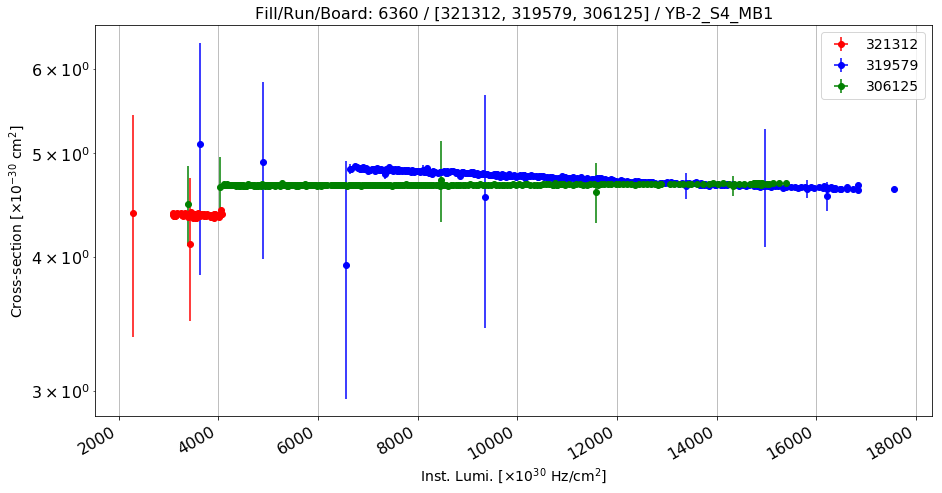

Anomalous CS: 4.37533051546 , Normal CS: 4.69757162448 , Ratio: 0.0685973806849


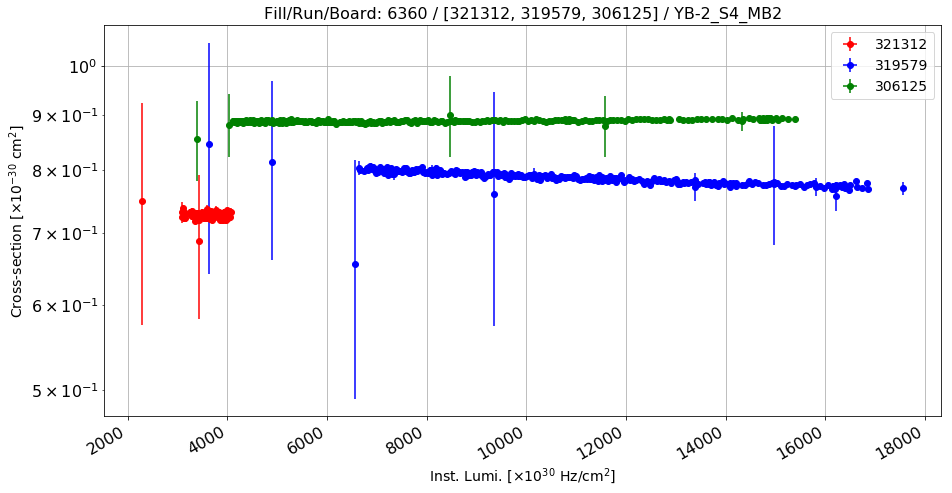

Anomalous CS: 0.726801894773 , Normal CS: 0.780985877287 , Ratio: 0.0693789530519


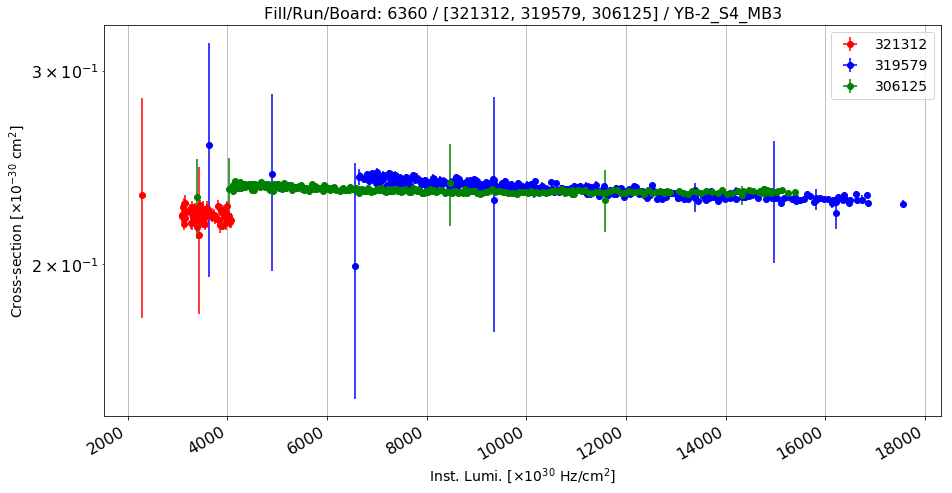

Anomalous CS: 0.221916407971 , Normal CS: 0.231838081167 , Ratio: 0.0427957009767


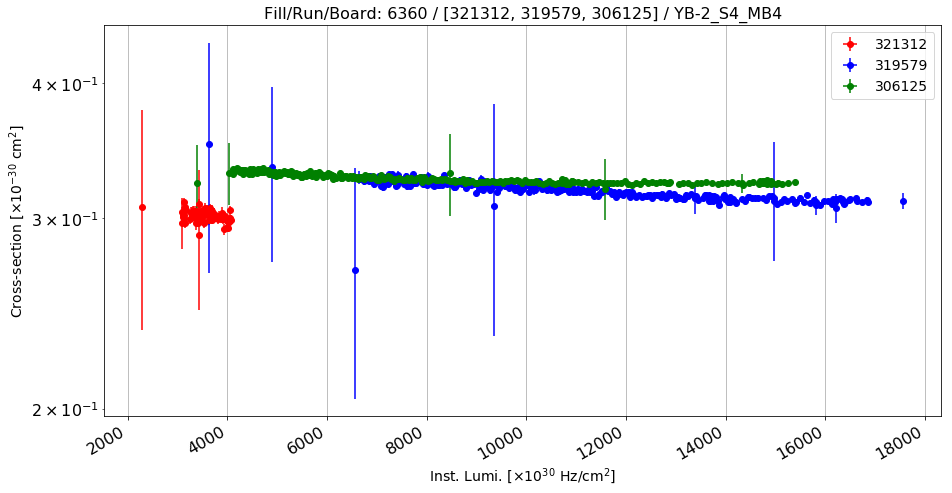

Anomalous CS: 0.301506999649 , Normal CS: 0.315054174219 , Ratio: 0.0429995082707


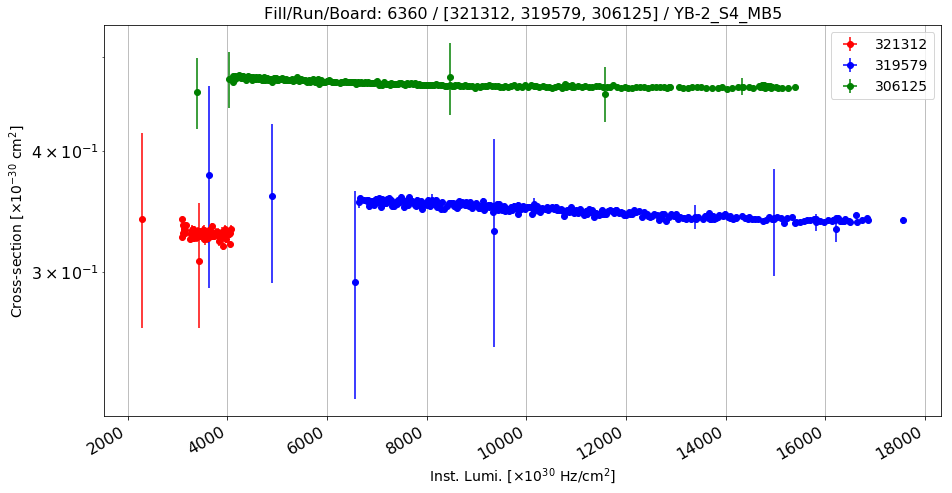

Anomalous CS: 0.32861151174 , Normal CS: 0.343375043613 , Ratio: 0.0429953549278


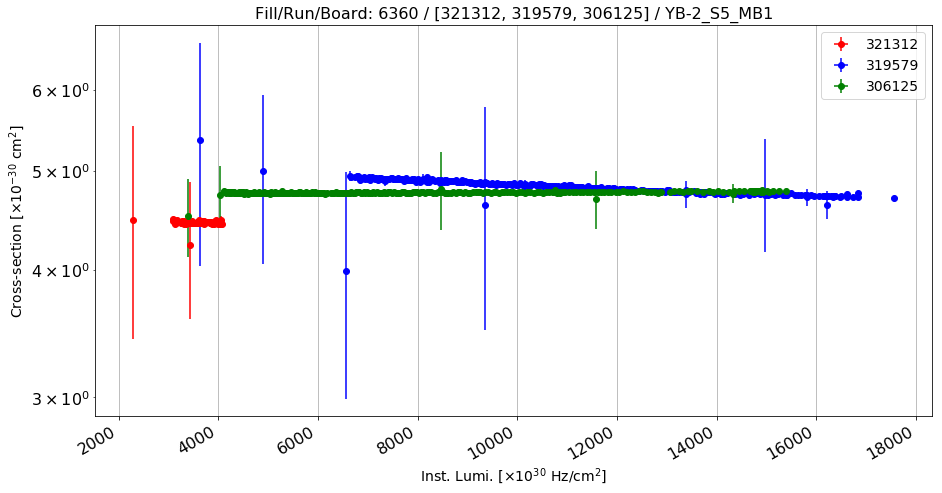

Anomalous CS: 4.44788926305 , Normal CS: 4.77876599804 , Ratio: 0.069238948953


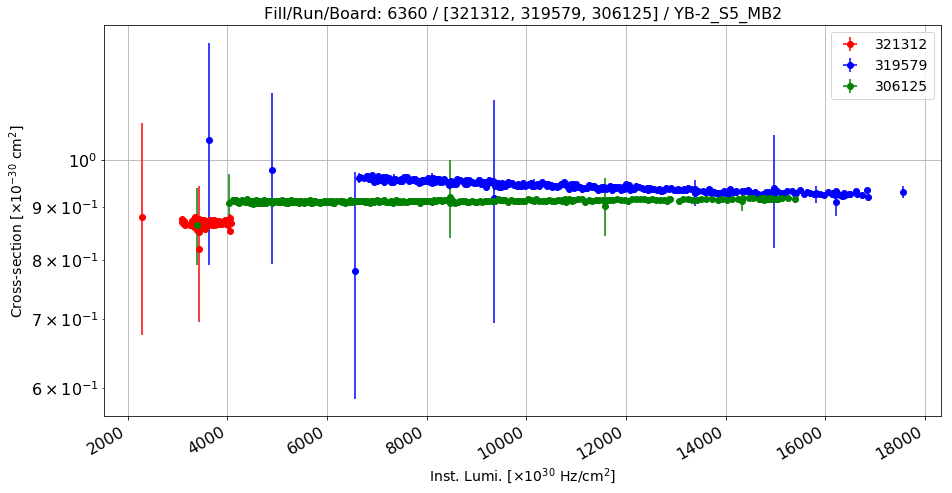

Anomalous CS: 0.868190339299 , Normal CS: 0.936046198491 , Ratio: 0.0724919980463


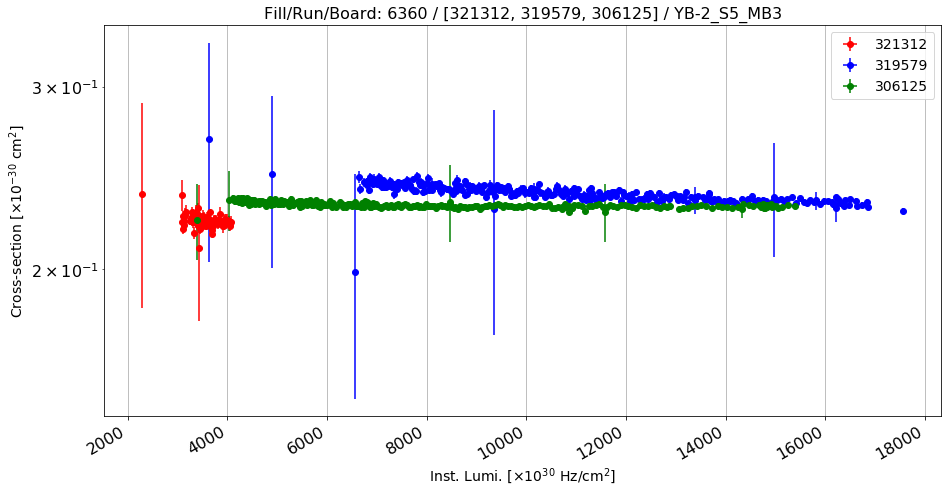

Anomalous CS: 0.222923979416 , Normal CS: 0.234603622757 , Ratio: 0.0497845821979


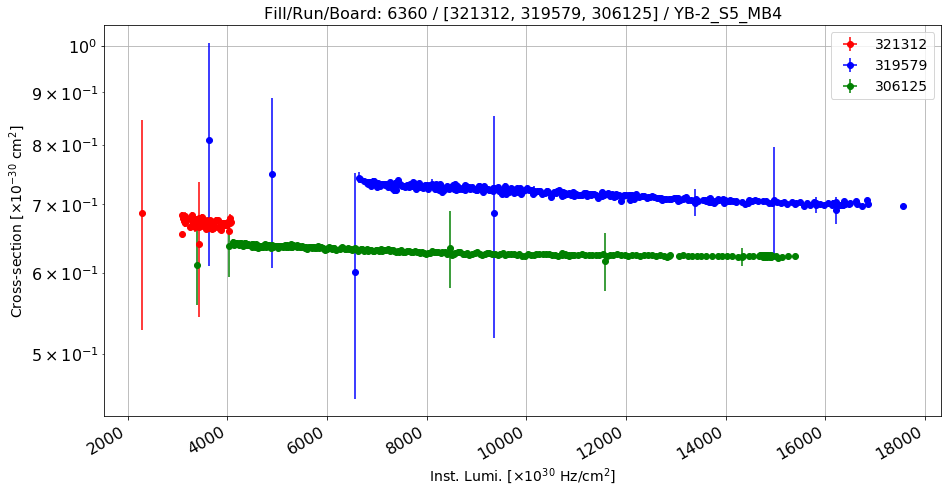

Anomalous CS: 0.671285994025 , Normal CS: 0.709734763265 , Ratio: 0.0541734338382


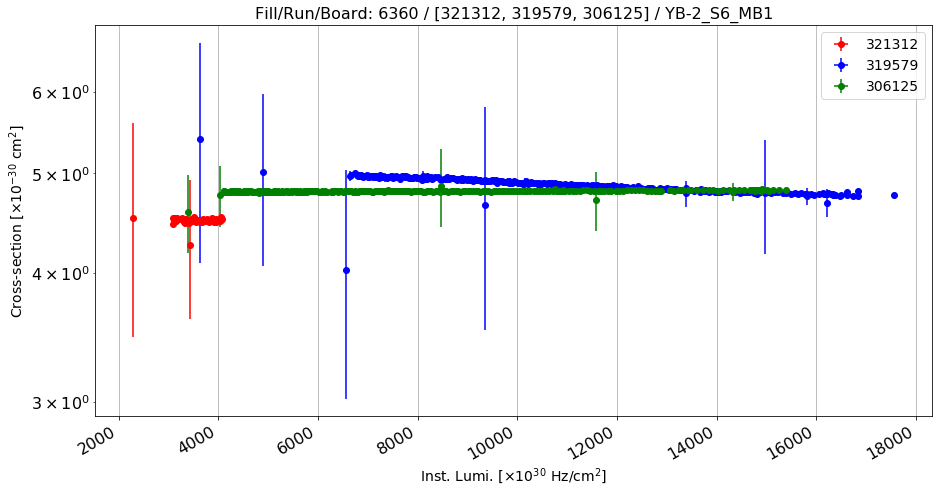

Anomalous CS: 4.49946511748 , Normal CS: 4.82940554841 , Ratio: 0.068319056585


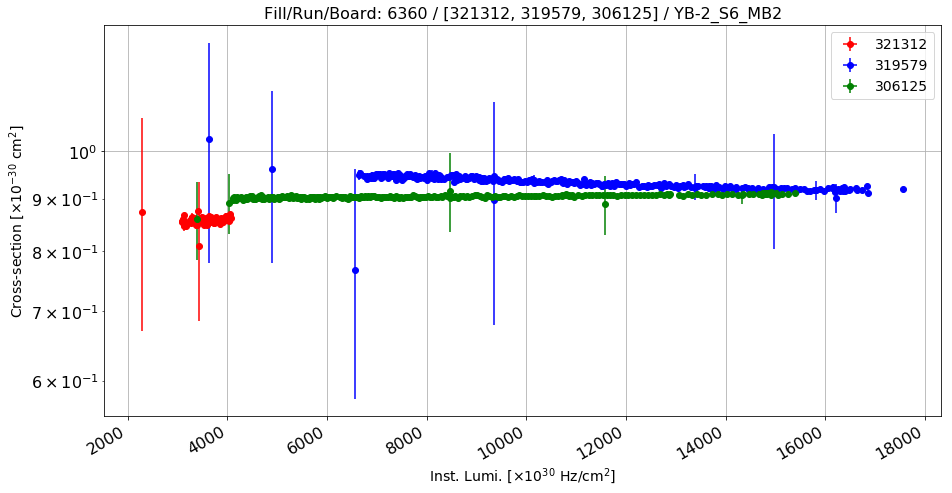

Anomalous CS: 0.857118431303 , Normal CS: 0.926191955598 , Ratio: 0.0745779790873


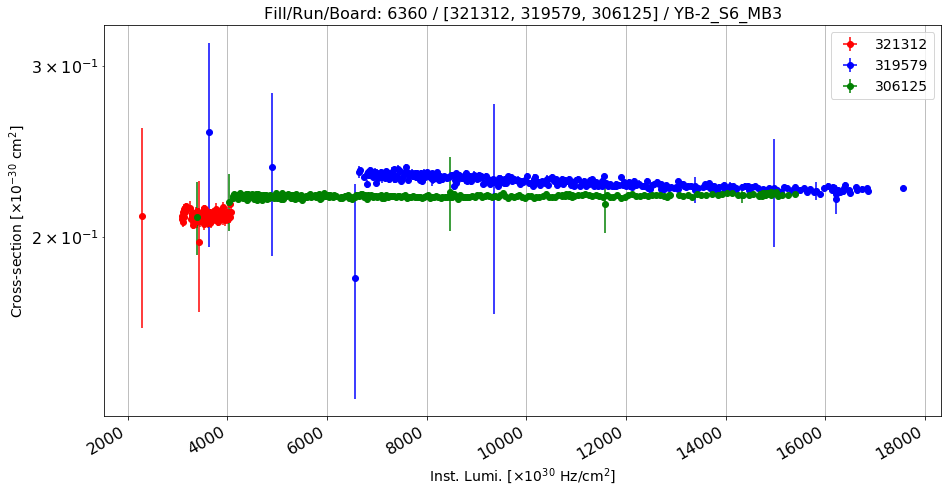

Anomalous CS: 0.210341455671 , Normal CS: 0.225807564101 , Ratio: 0.0684924284588


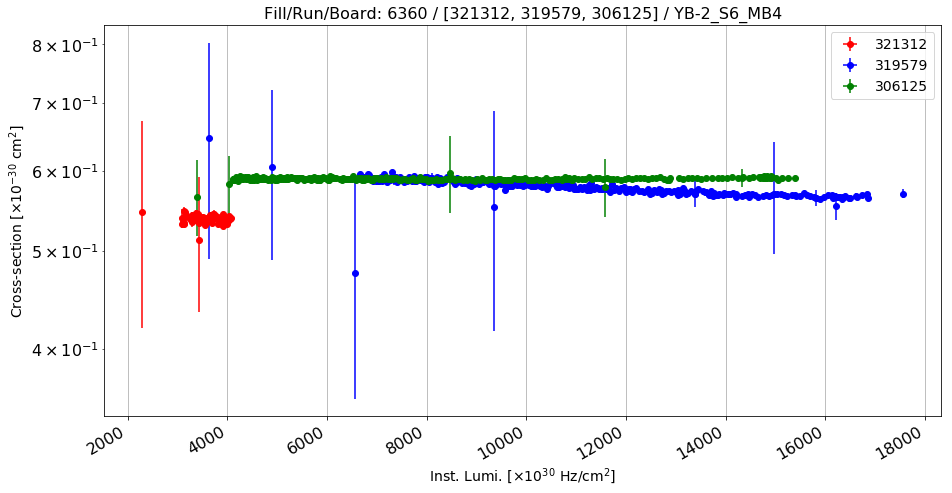

Anomalous CS: 0.53746011155 , Normal CS: 0.572604840382 , Ratio: 0.0613769328388


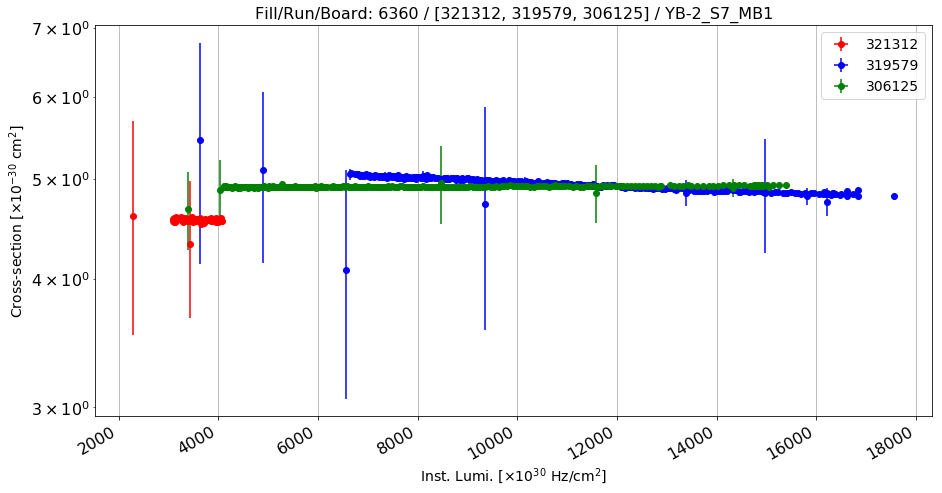

Anomalous CS: 4.55499636047 , Normal CS: 4.89311825631 , Ratio: 0.0691015173002


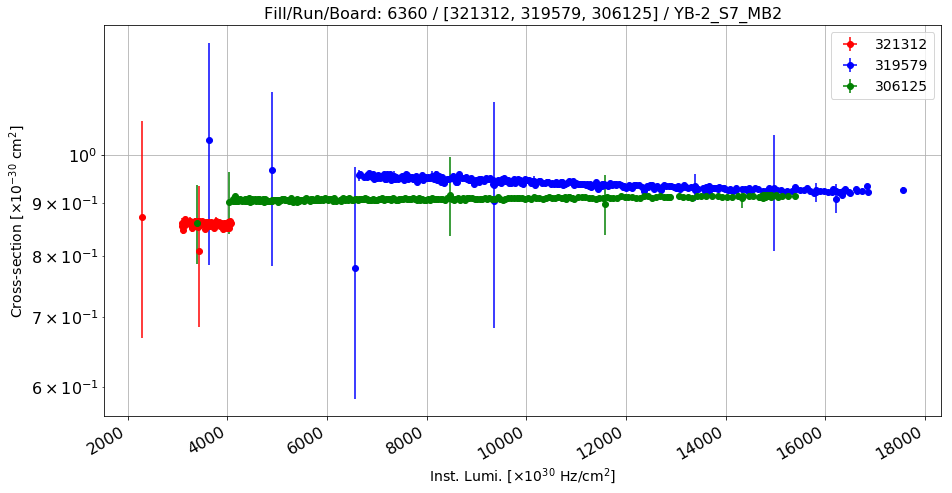

Anomalous CS: 0.858152822534 , Normal CS: 0.931409027283 , Ratio: 0.0786509499083


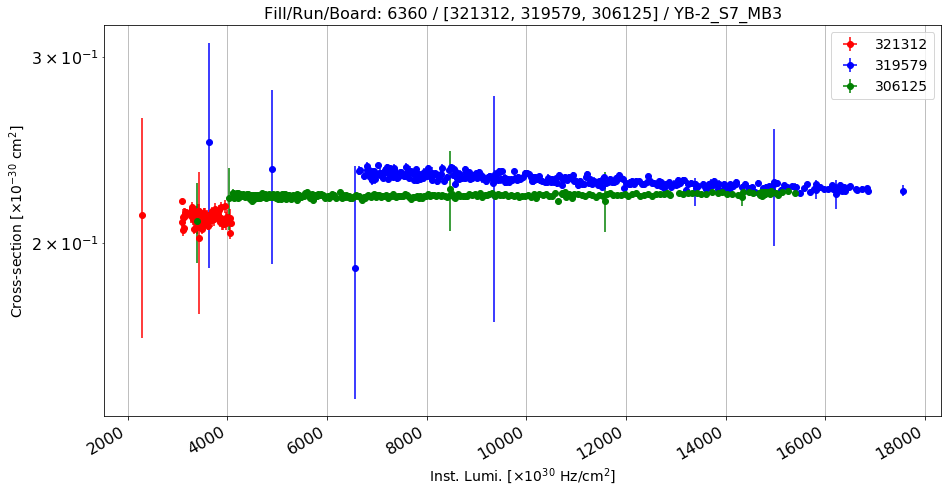

Anomalous CS: 0.211015521977 , Normal CS: 0.22748777756 , Ratio: 0.0724094092426


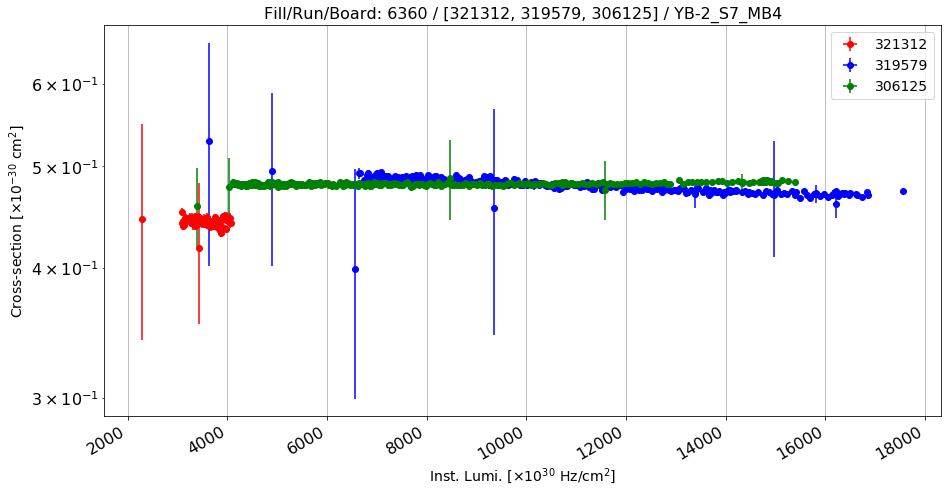

Anomalous CS: 0.44274325285 , Normal CS: 0.475224118954 , Ratio: 0.0683485219049


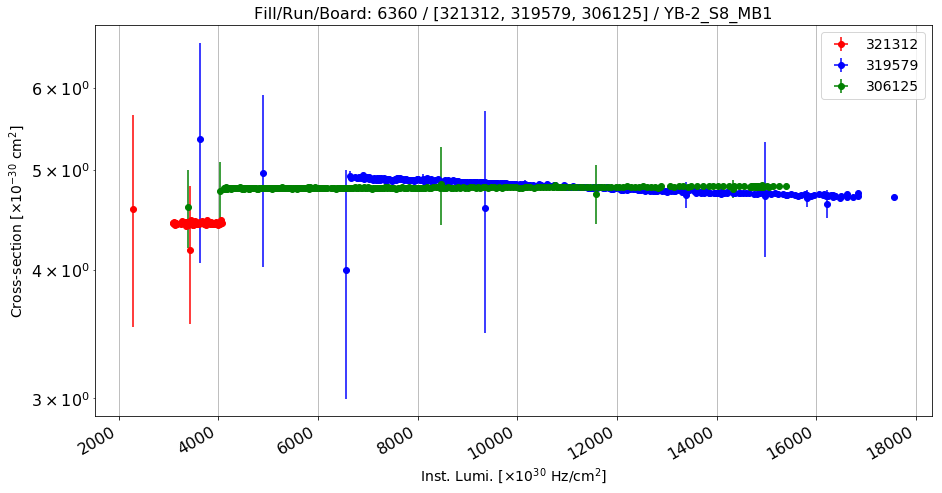

Anomalous CS: 4.43657419931 , Normal CS: 4.77348473537 , Ratio: 0.070579577548


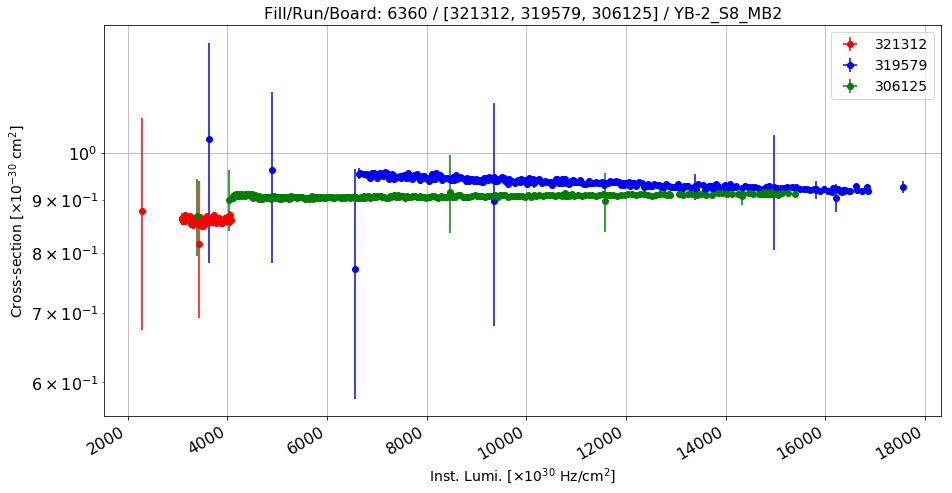

Anomalous CS: 0.860126073064 , Normal CS: 0.929943269104 , Ratio: 0.075076833566


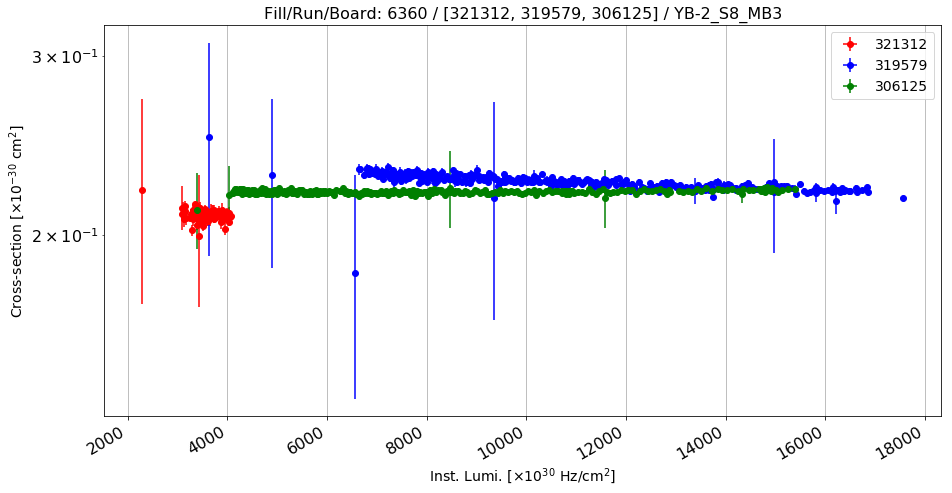

Anomalous CS: 0.20908937408 , Normal CS: 0.223475207232 , Ratio: 0.0643732847598


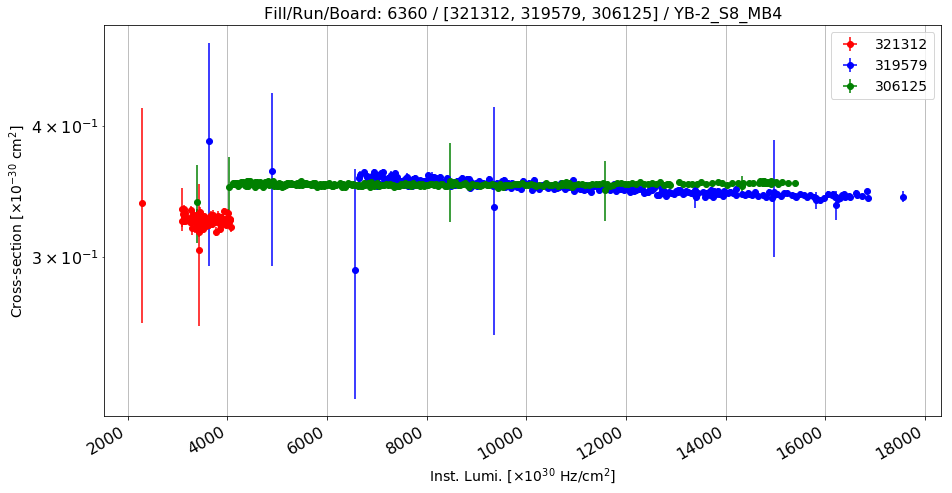

Anomalous CS: 0.325092255571 , Normal CS: 0.346490639735 , Ratio: 0.0617574667531


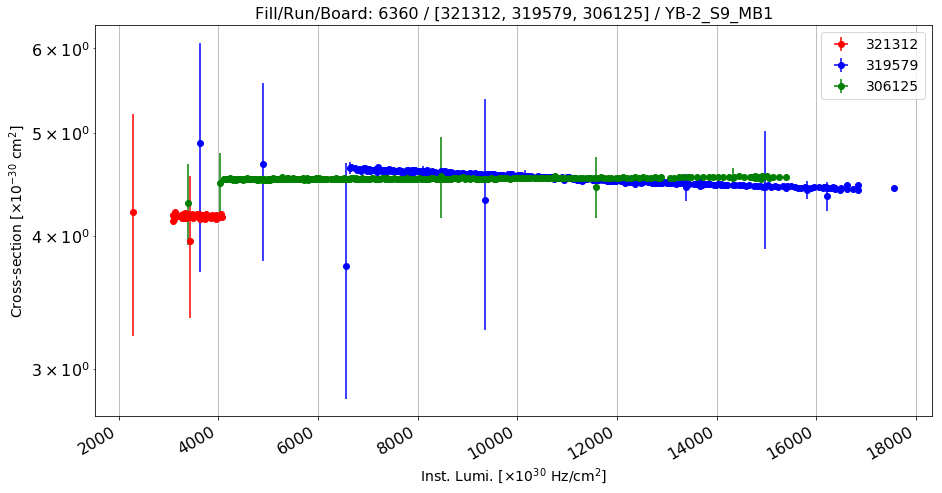

Anomalous CS: 4.17416495283 , Normal CS: 4.49097151609 , Ratio: 0.0705429910048


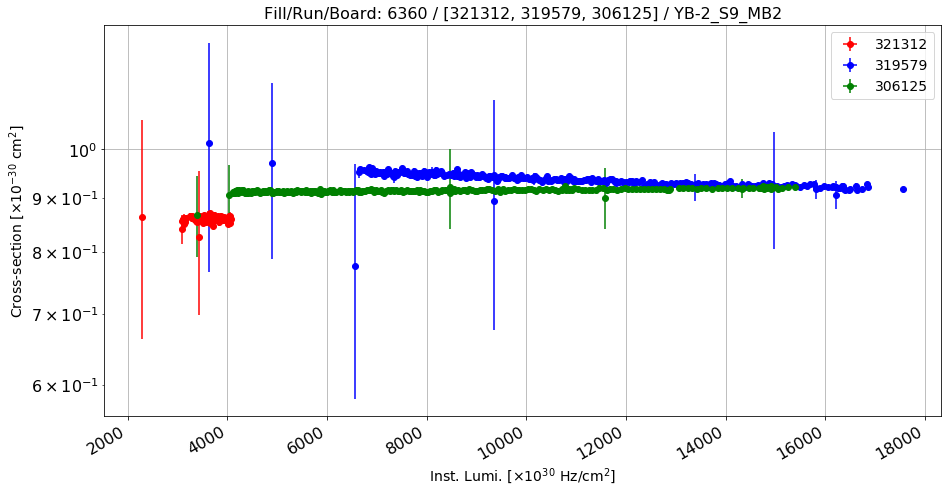

Anomalous CS: 0.859520978411 , Normal CS: 0.929125178616 , Ratio: 0.0749136949543


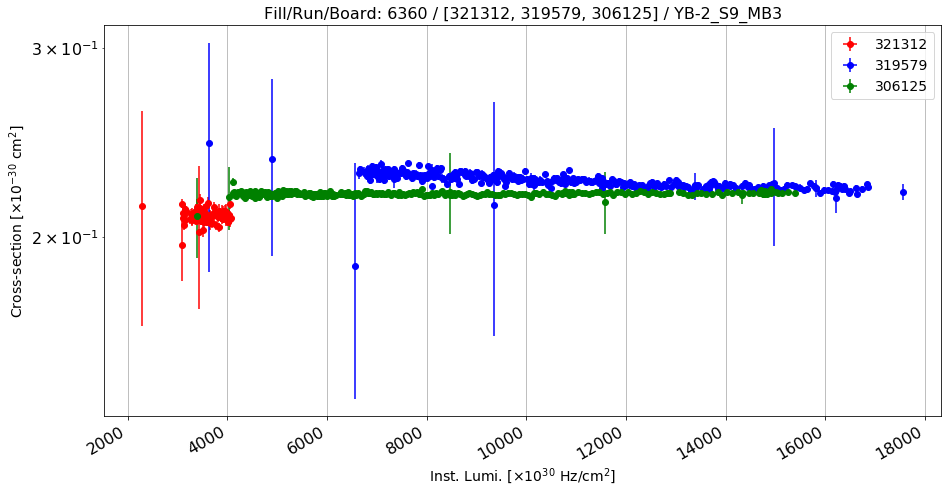

Anomalous CS: 0.209155371435 , Normal CS: 0.223735961403 , Ratio: 0.0651687367409


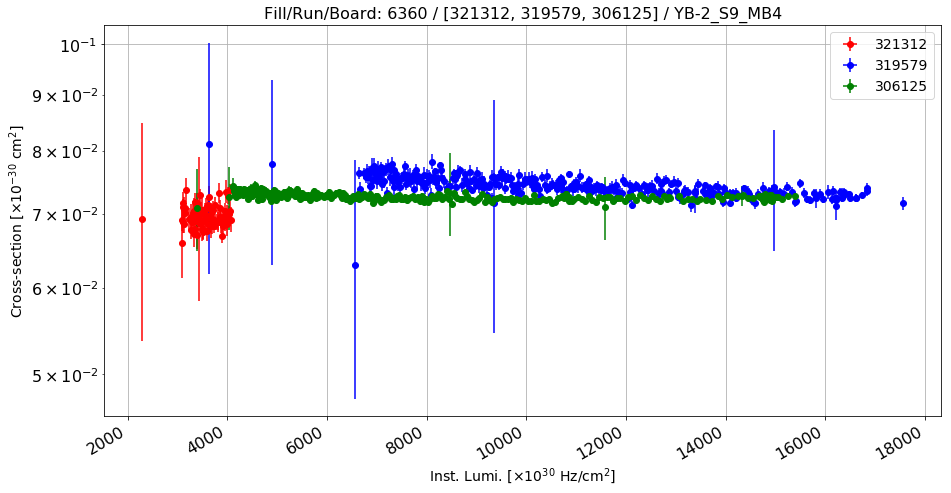

Anomalous CS: 0.0697346171831 , Normal CS: 0.0735978291383 , Ratio: 0.0524908411089


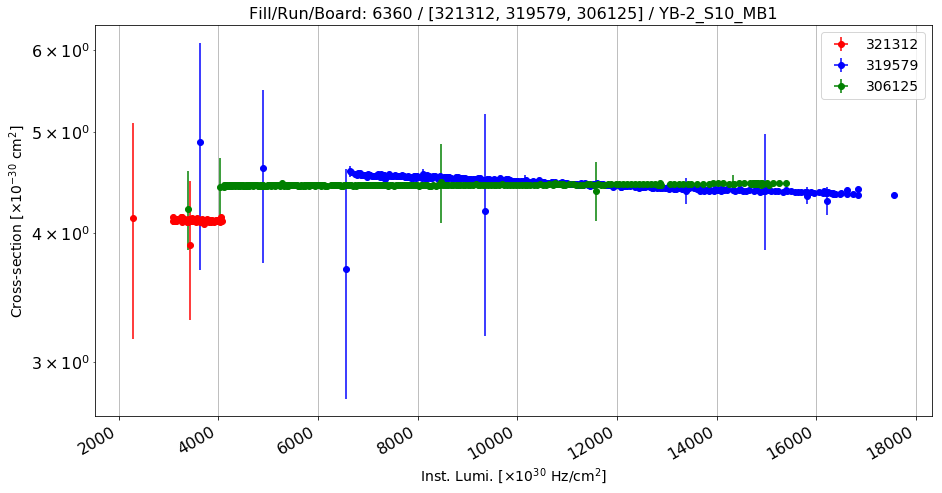

Anomalous CS: 4.10908096858 , Normal CS: 4.42218381064 , Ratio: 0.0708027652098


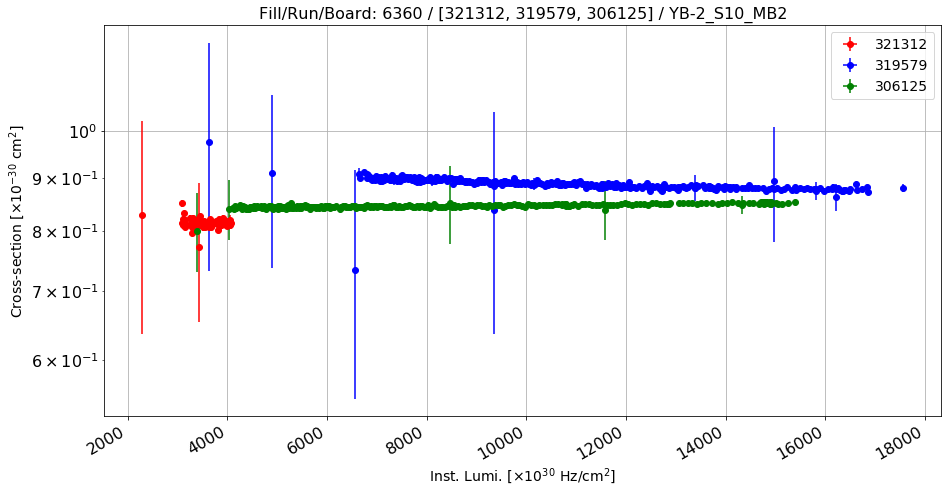

Anomalous CS: 0.814045881355 , Normal CS: 0.882838748155 , Ratio: 0.0779223464582


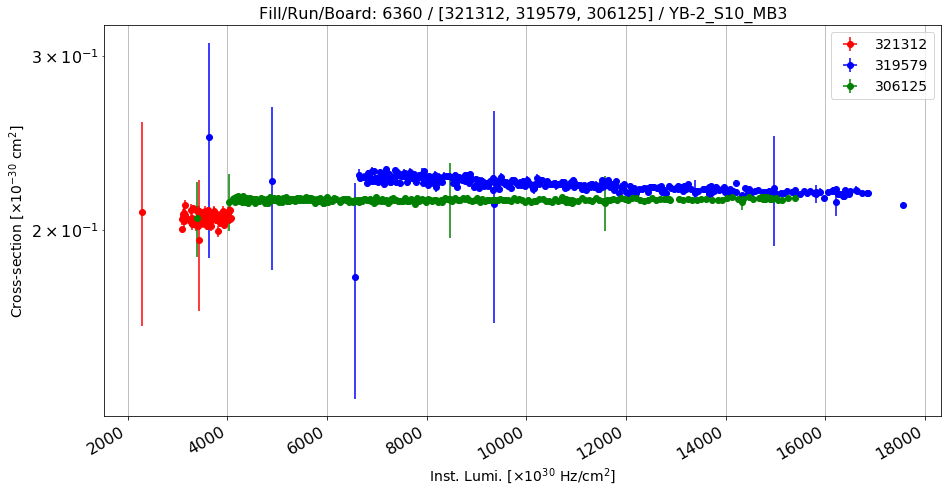

Anomalous CS: 0.205518594825 , Normal CS: 0.220169458679 , Ratio: 0.0665435793936


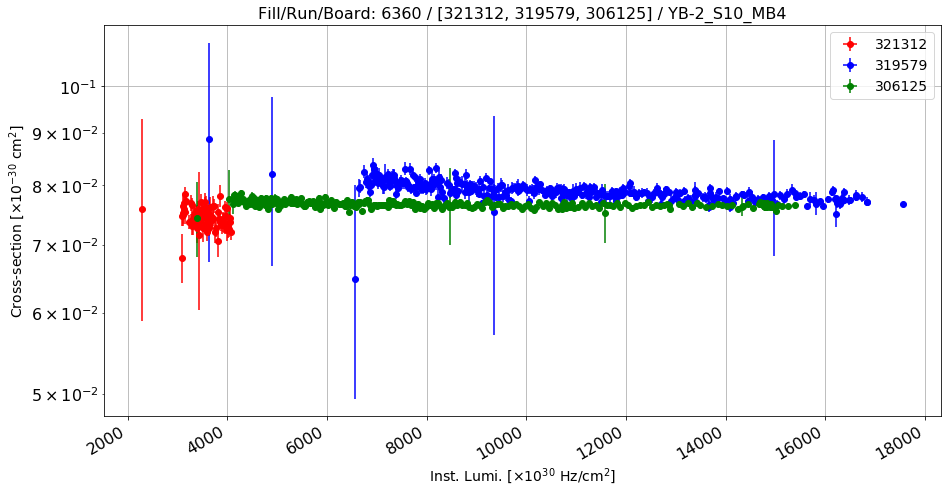

Anomalous CS: 0.0744459201549 , Normal CS: 0.0782211635644 , Ratio: 0.0482637081504


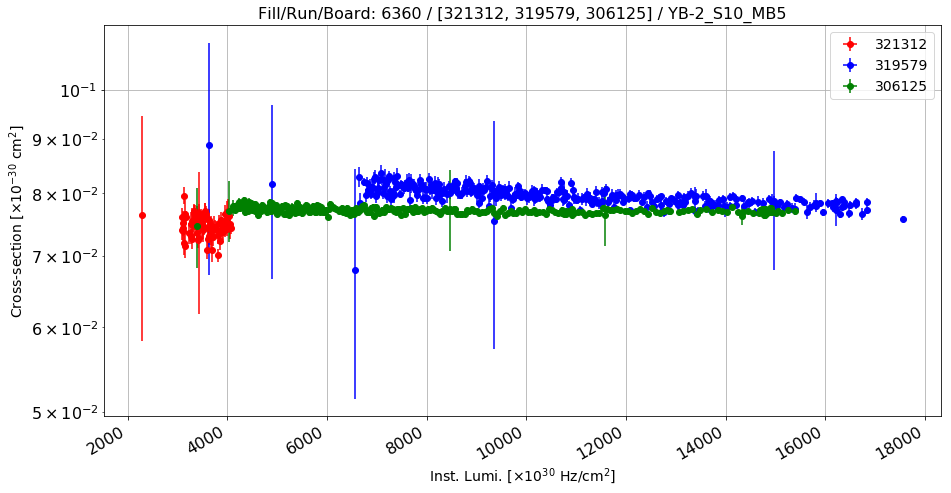

Anomalous CS: 0.0746234745058 , Normal CS: 0.0787394723219 , Ratio: 0.0522736271247


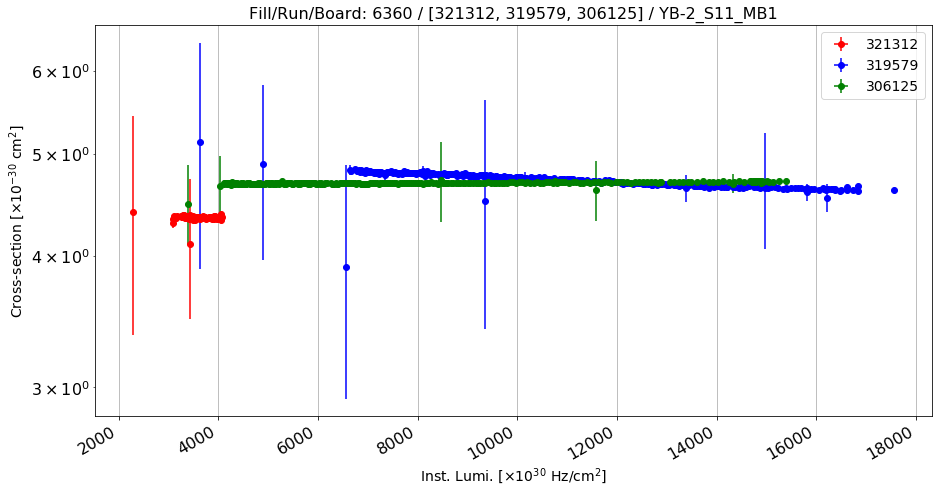

Anomalous CS: 4.35059892133 , Normal CS: 4.68280924301 , Ratio: 0.0709425271099


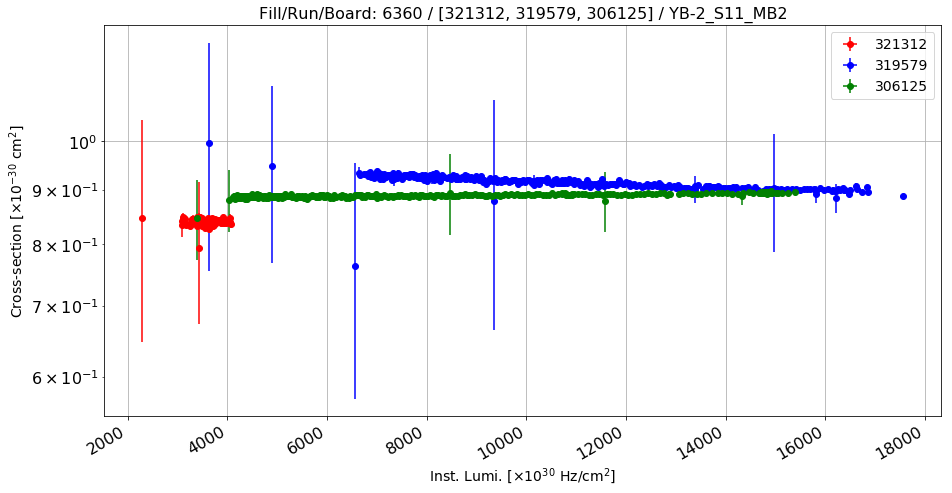

Anomalous CS: 0.839960344393 , Normal CS: 0.907630461437 , Ratio: 0.0745569038487


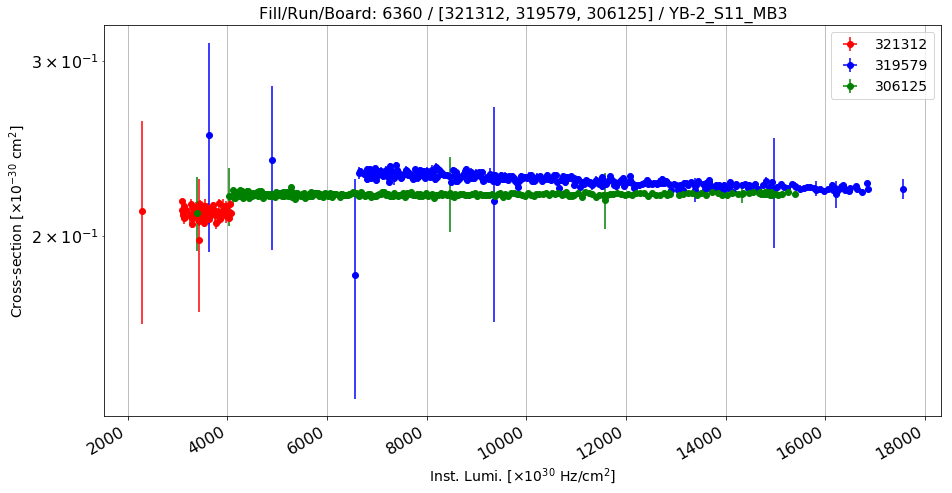

Anomalous CS: 0.210863883316 , Normal CS: 0.225477745806 , Ratio: 0.0648128818141


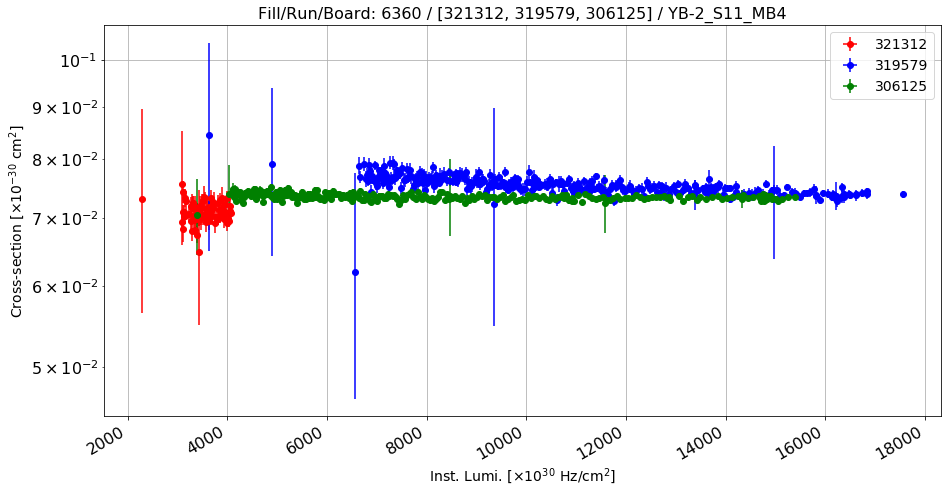

Anomalous CS: 0.0709018223685 , Normal CS: 0.0746085747019 , Ratio: 0.0496826584365


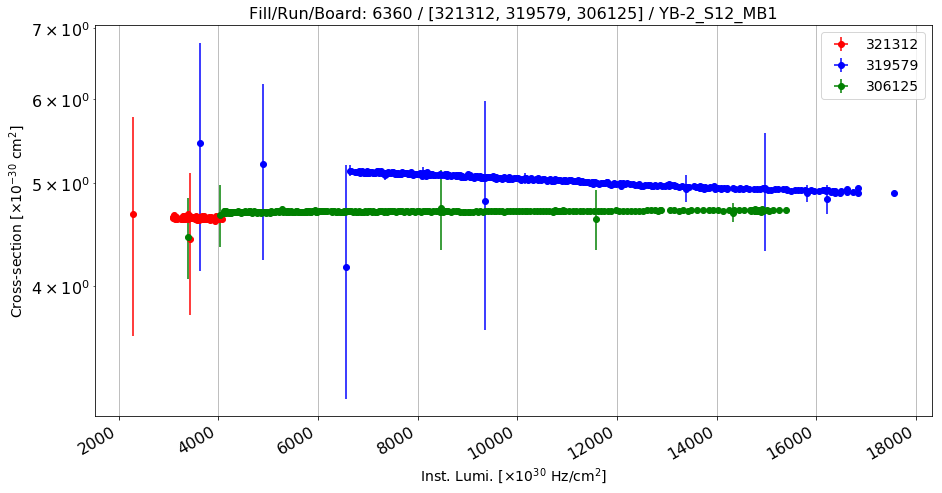

Anomalous CS: 4.63795563955 , Normal CS: 4.97938049167 , Ratio: 0.0685677370289


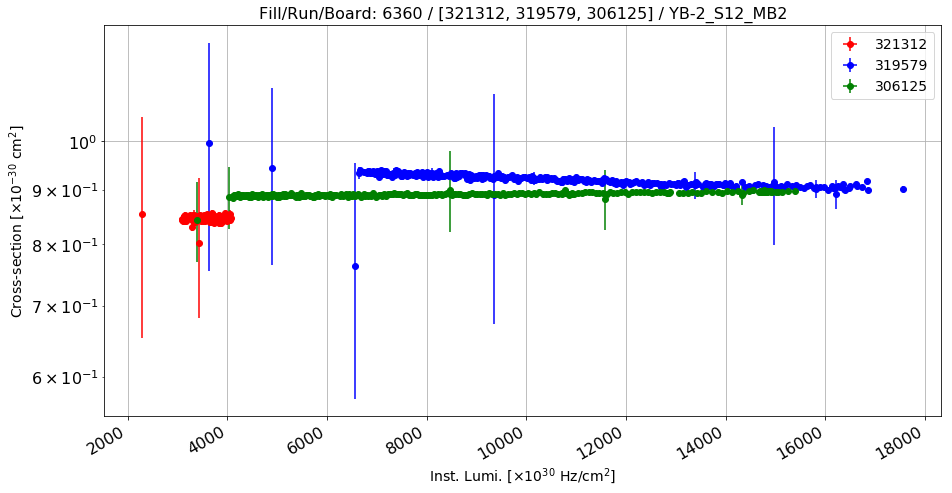

Anomalous CS: 0.845410047911 , Normal CS: 0.912933424254 , Ratio: 0.0739630892561


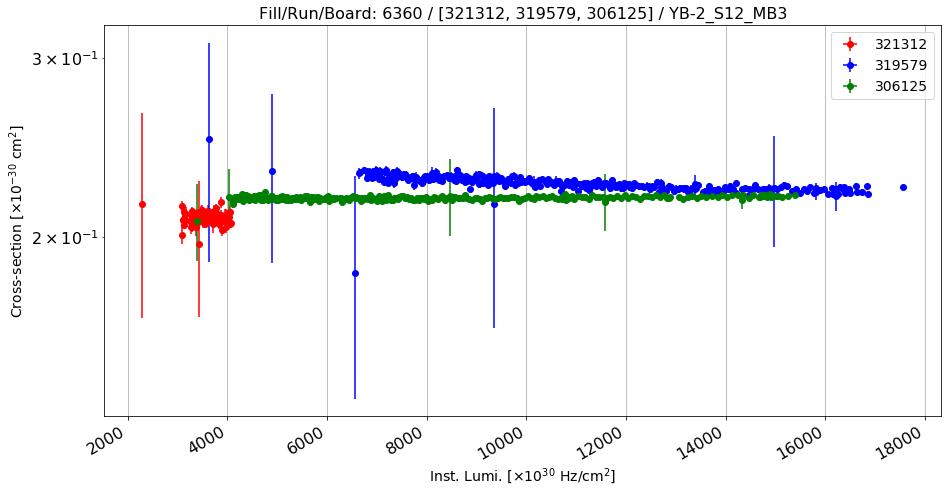

Anomalous CS: 0.208513333169 , Normal CS: 0.223771796393 , Ratio: 0.0681876066138


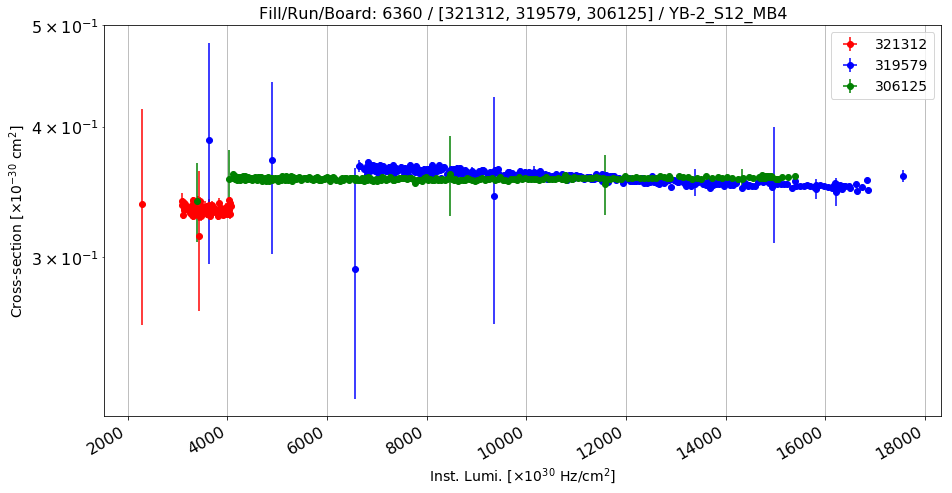

Anomalous CS: 0.333488148455 , Normal CS: 0.354893451823 , Ratio: 0.0603147318105


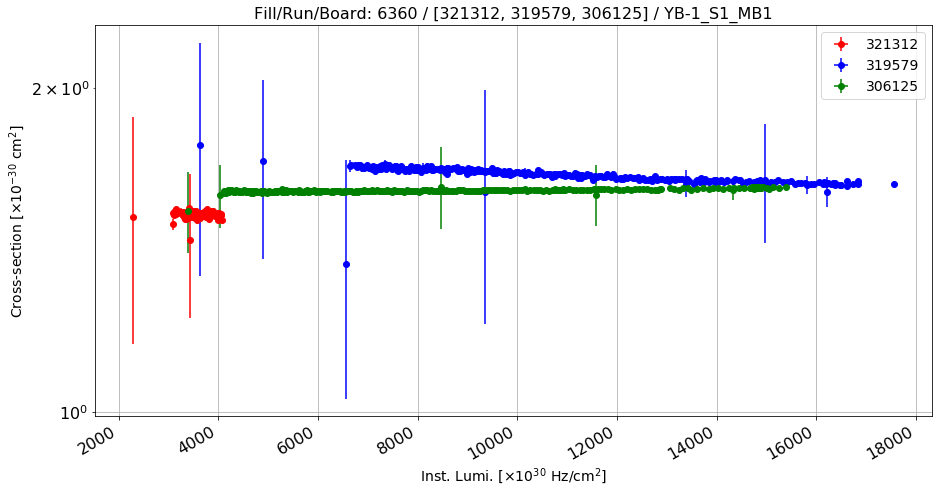

Anomalous CS: 1.52415828724 , Normal CS: 1.64587221034 , Ratio: 0.0739510165689


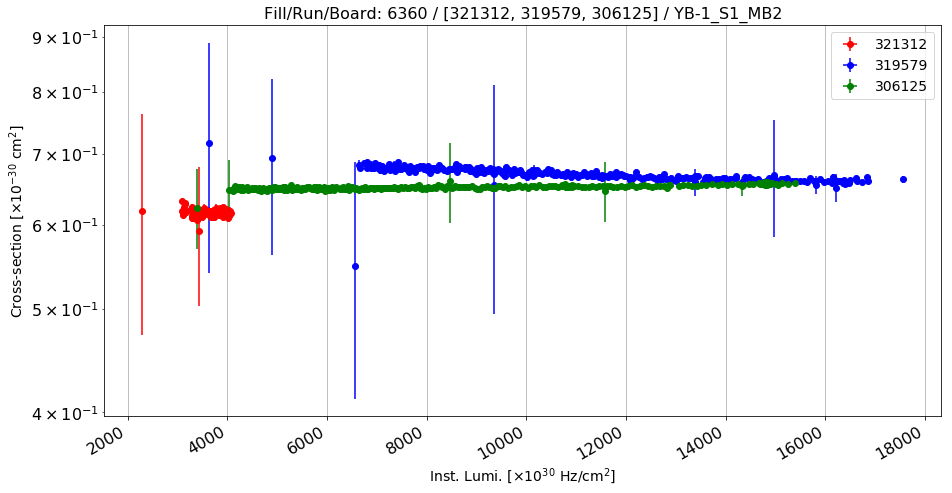

Anomalous CS: 0.616126232279 , Normal CS: 0.664826903866 , Ratio: 0.0732531600381


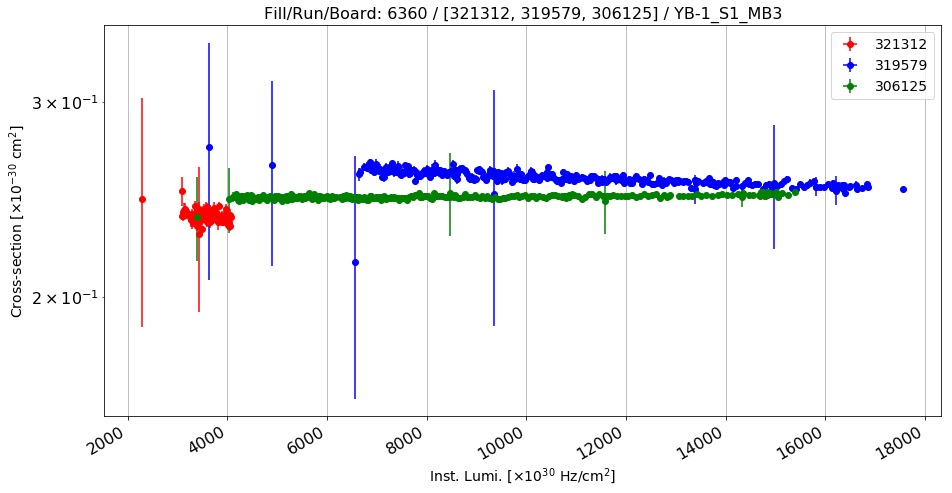

Anomalous CS: 0.236796691366 , Normal CS: 0.2543221172 , Ratio: 0.0689103489209


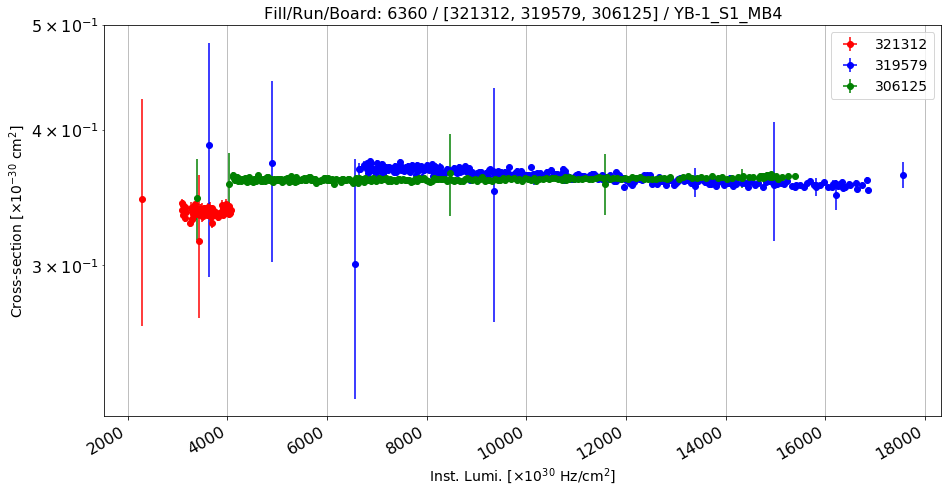

Anomalous CS: 0.335928298014 , Normal CS: 0.359466952003 , Ratio: 0.065482108598


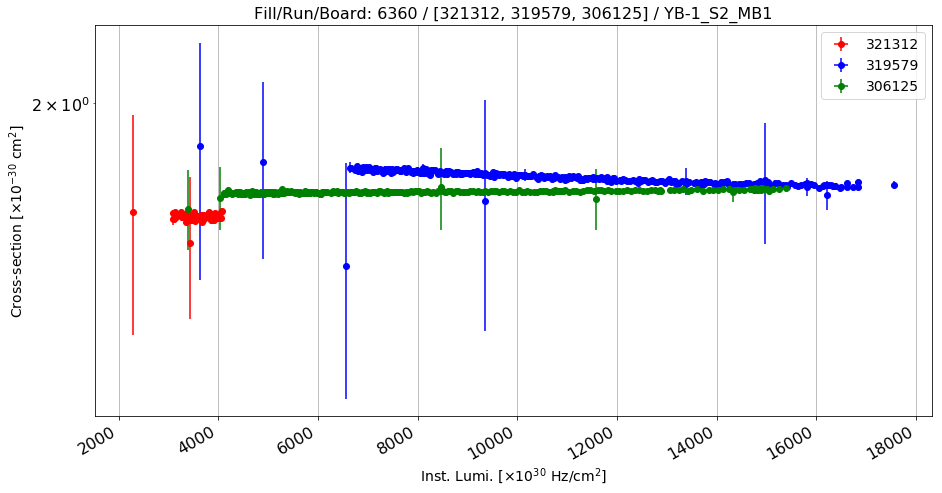

Anomalous CS: 1.56659406349 , Normal CS: 1.69159843305 , Ratio: 0.0738971892584


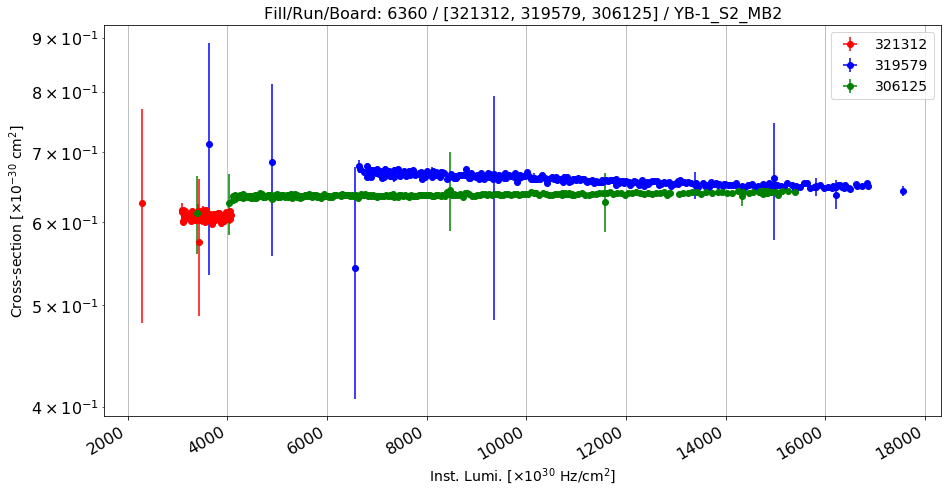

Anomalous CS: 0.608120269003 , Normal CS: 0.65465082954 , Ratio: 0.0710769137347


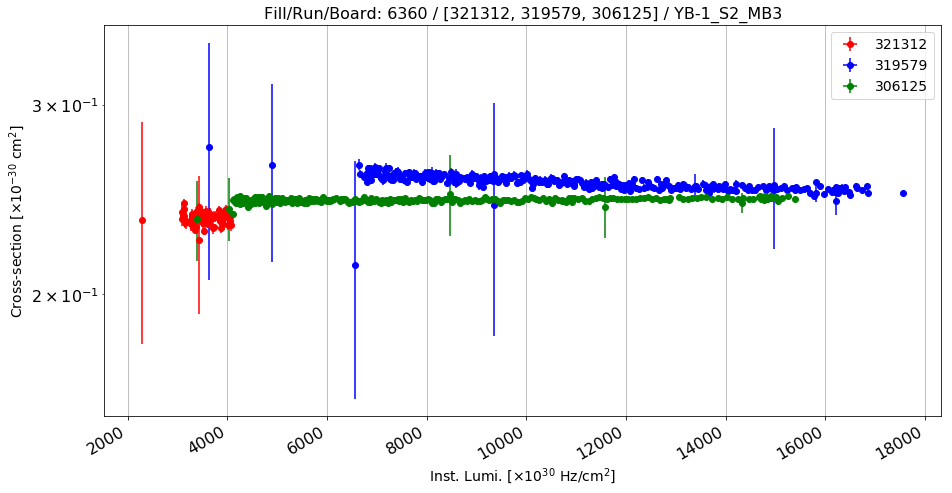

Anomalous CS: 0.235422344454 , Normal CS: 0.252292687495 , Ratio: 0.0668681411627


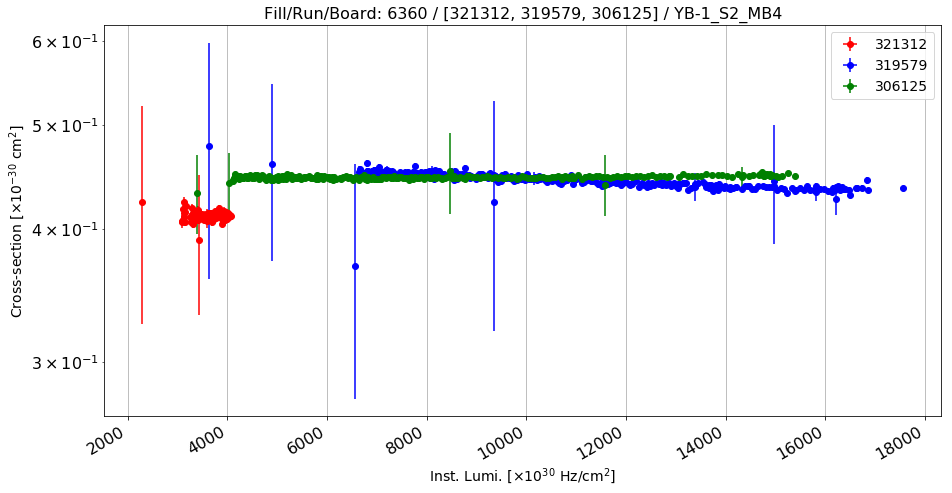

Anomalous CS: 0.410815819617 , Normal CS: 0.440006759518 , Ratio: 0.0663420260471


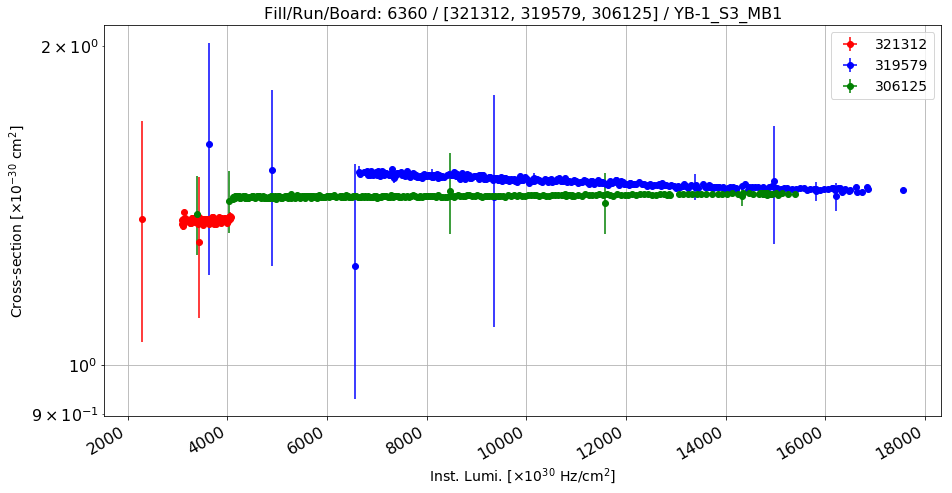

Anomalous CS: 1.36989374413 , Normal CS: 1.47879589489 , Ratio: 0.0736424486554


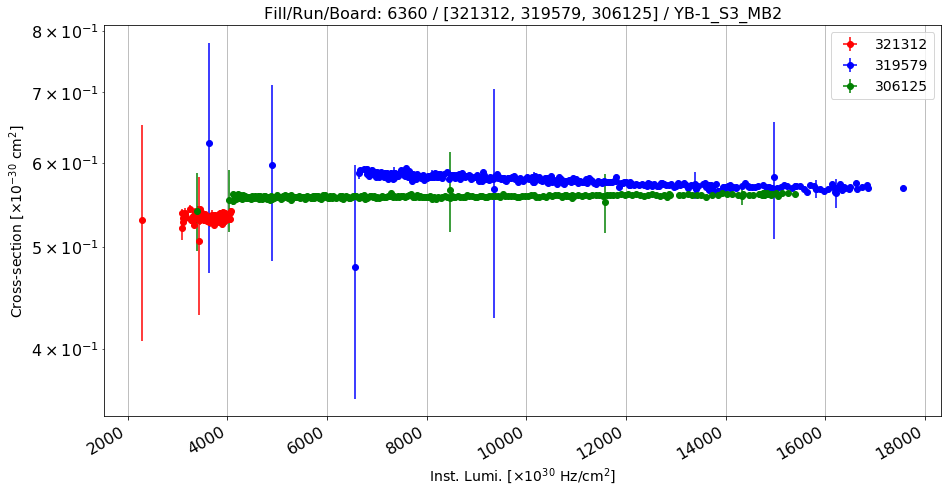

Anomalous CS: 0.532822125256 , Normal CS: 0.572839703237 , Ratio: 0.0698582478746


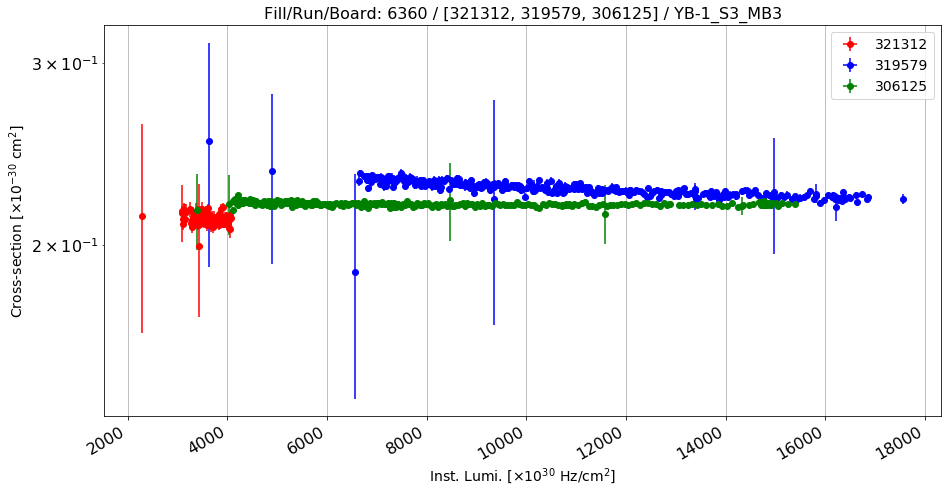

Anomalous CS: 0.211970995046 , Normal CS: 0.224673618671 , Ratio: 0.0565381182736


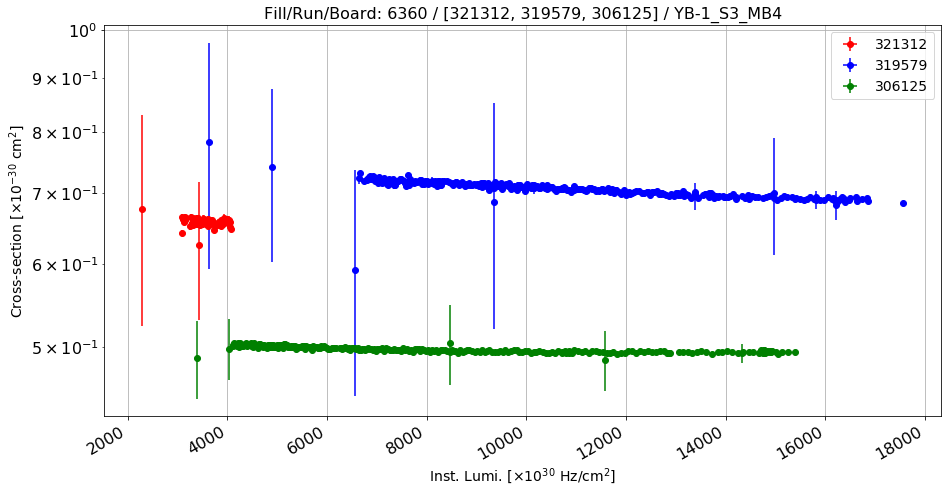

Anomalous CS: 0.656886468941 , Normal CS: 0.699408907954 , Ratio: 0.0607976800547


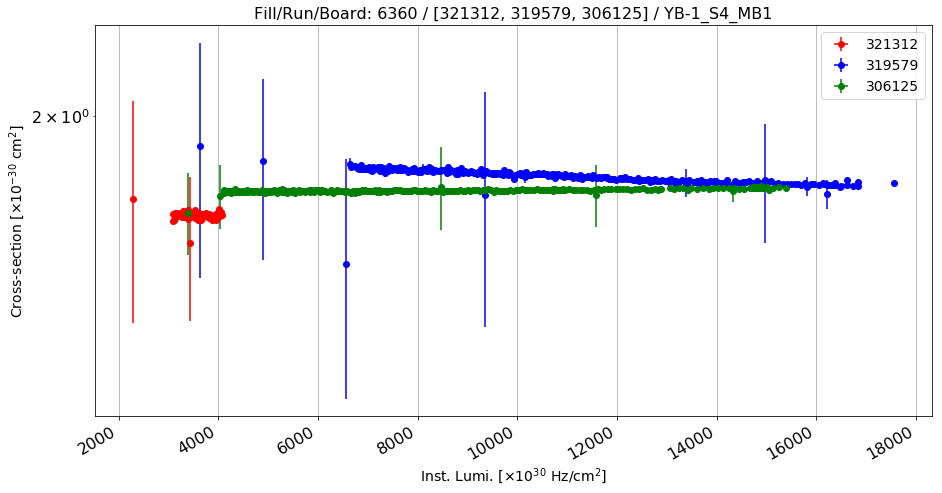

Anomalous CS: 1.61848657559 , Normal CS: 1.74618979057 , Ratio: 0.073132494343


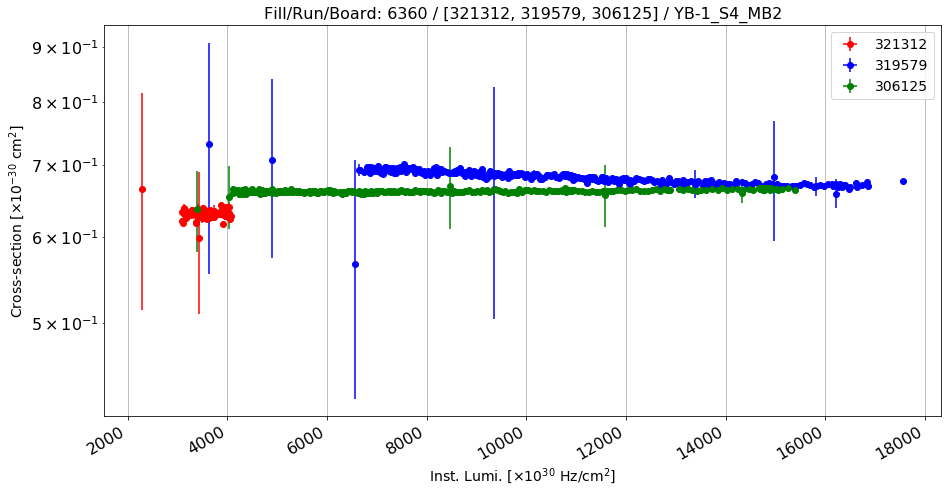

Anomalous CS: 0.63060625767 , Normal CS: 0.675590531872 , Ratio: 0.0665851163976


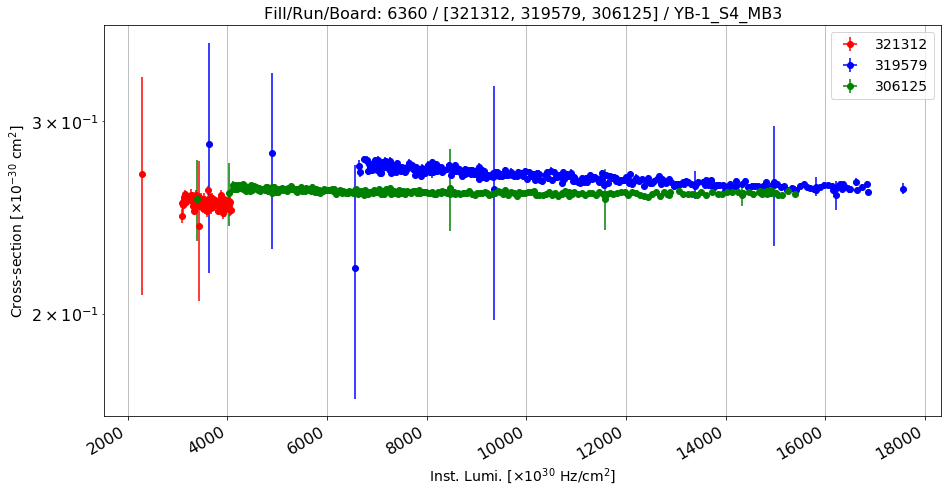

Anomalous CS: 0.252902424763 , Normal CS: 0.263991992453 , Ratio: 0.0420072123666


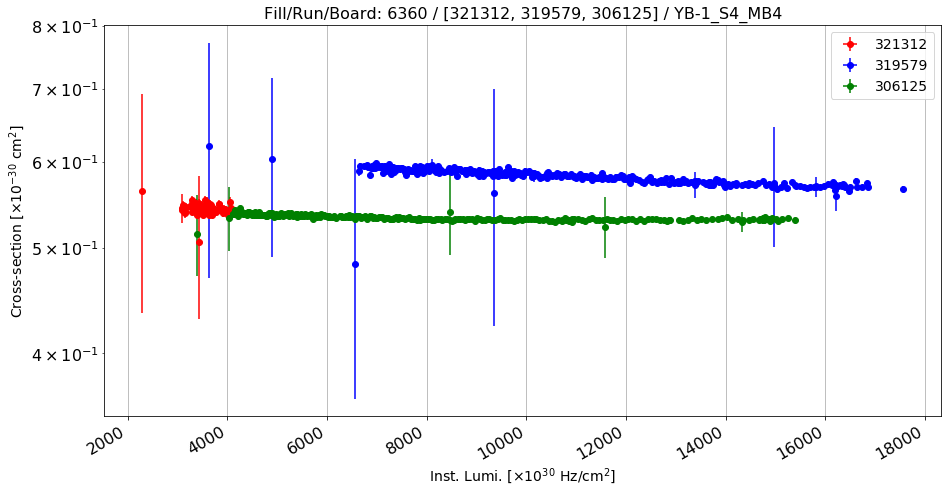

Anomalous CS: 0.542943900842 , Normal CS: 0.576215733523 , Ratio: 0.0577419718789


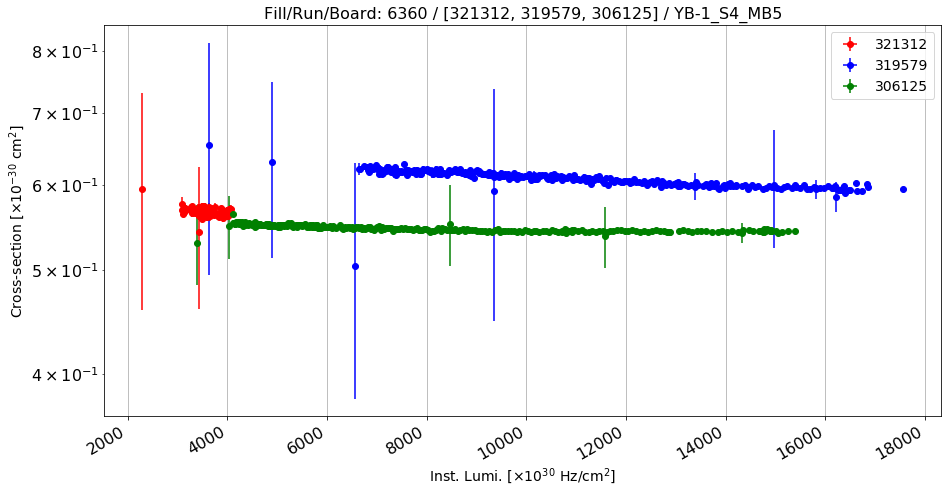

Anomalous CS: 0.567023412661 , Normal CS: 0.602403679224 , Ratio: 0.0587318234973


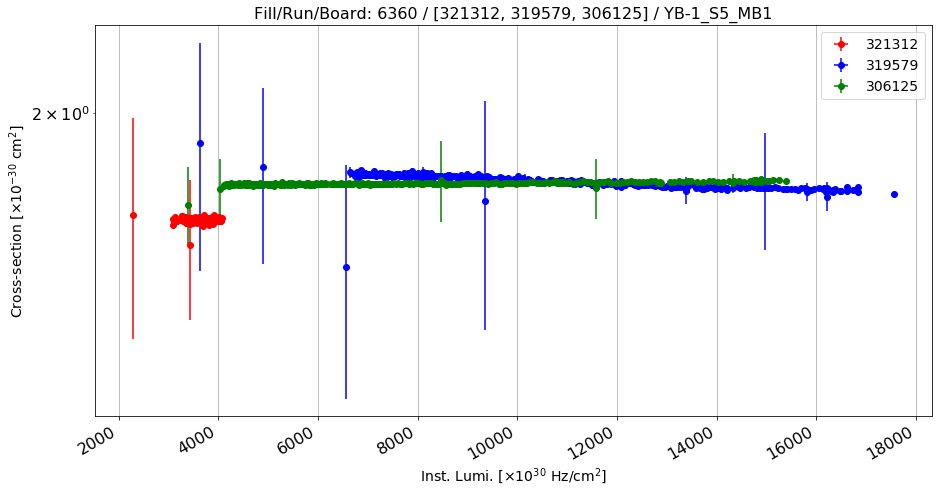

Anomalous CS: 1.58418691344 , Normal CS: 1.70934967652 , Ratio: 0.0732224452374


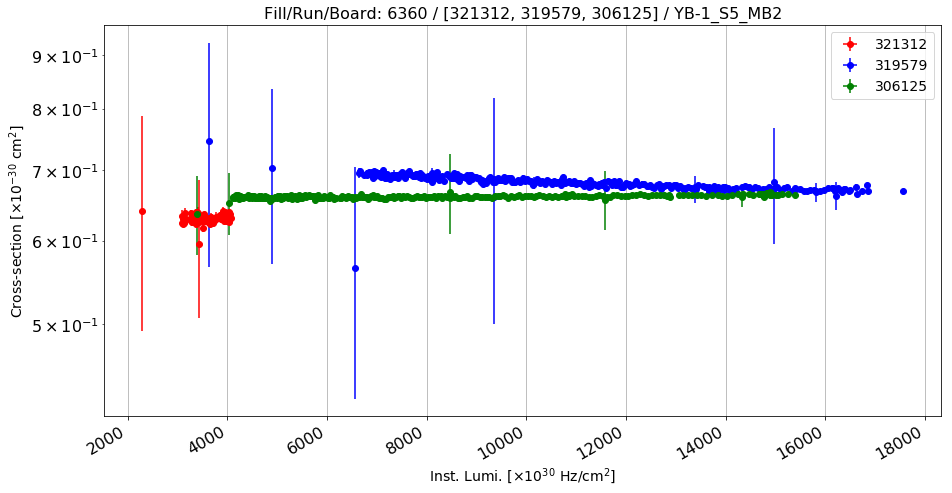

Anomalous CS: 0.629814147606 , Normal CS: 0.676291041039 , Ratio: 0.0687232132507


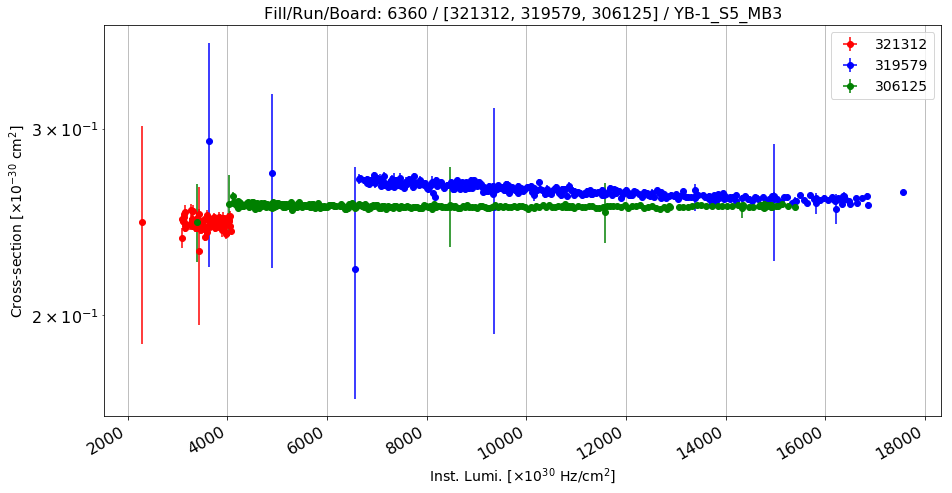

Anomalous CS: 0.244295130747 , Normal CS: 0.25977630236 , Ratio: 0.0595942411703


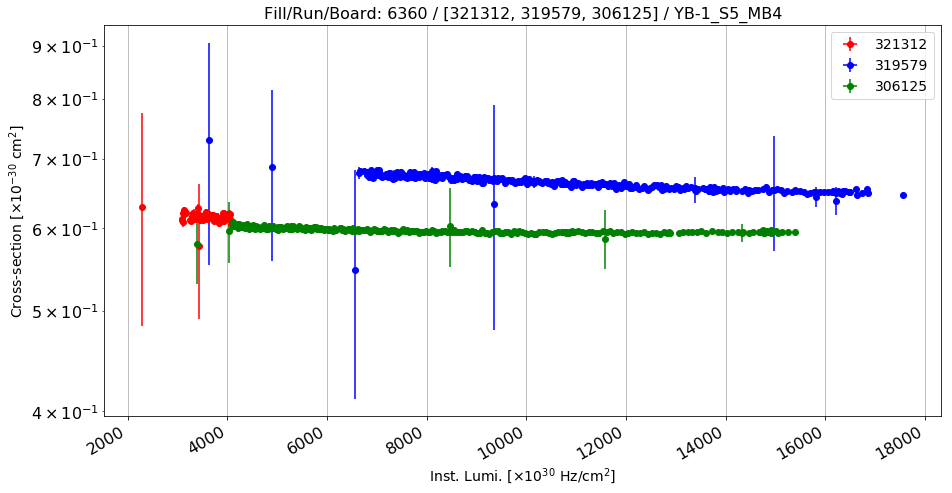

Anomalous CS: 0.615732608561 , Normal CS: 0.656981519714 , Ratio: 0.0627854968746


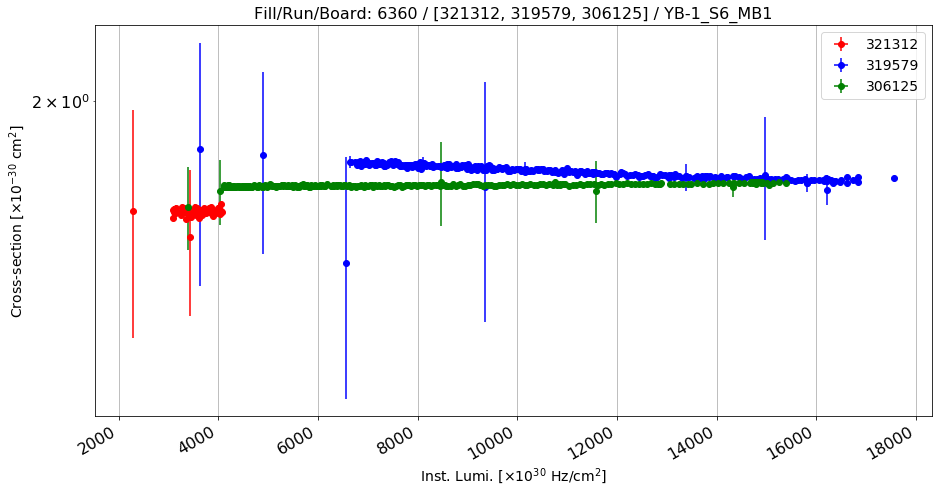

Anomalous CS: 1.58513731195 , Normal CS: 1.71125325338 , Ratio: 0.0736979995096


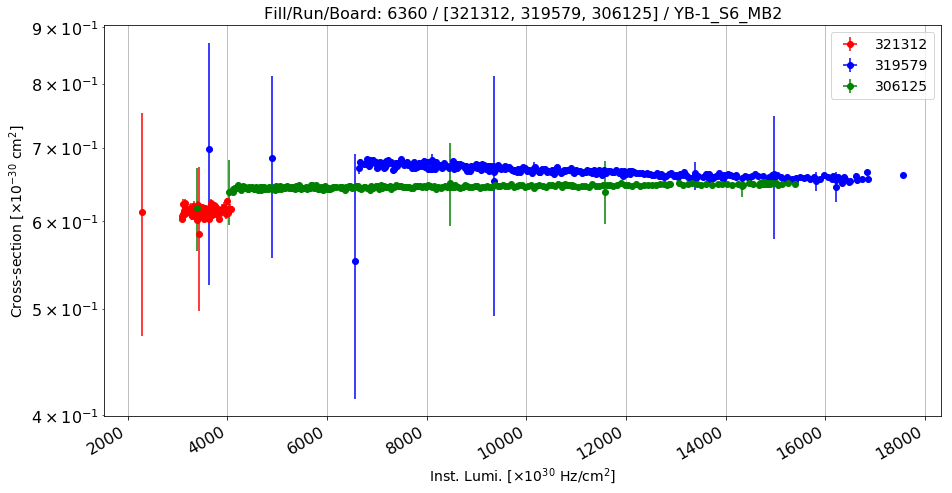

Anomalous CS: 0.613192470859 , Normal CS: 0.661806081165 , Ratio: 0.0734559740218


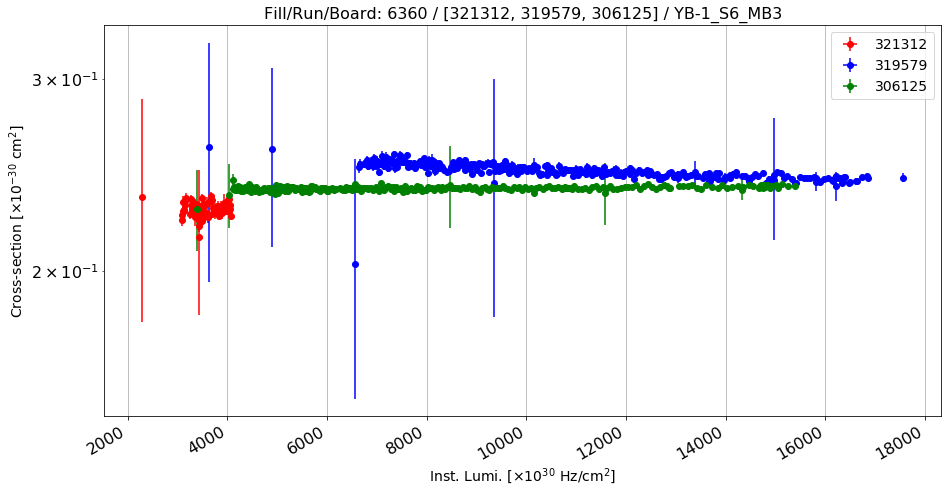

Anomalous CS: 0.227671273931 , Normal CS: 0.245079654506 , Ratio: 0.0710315207934


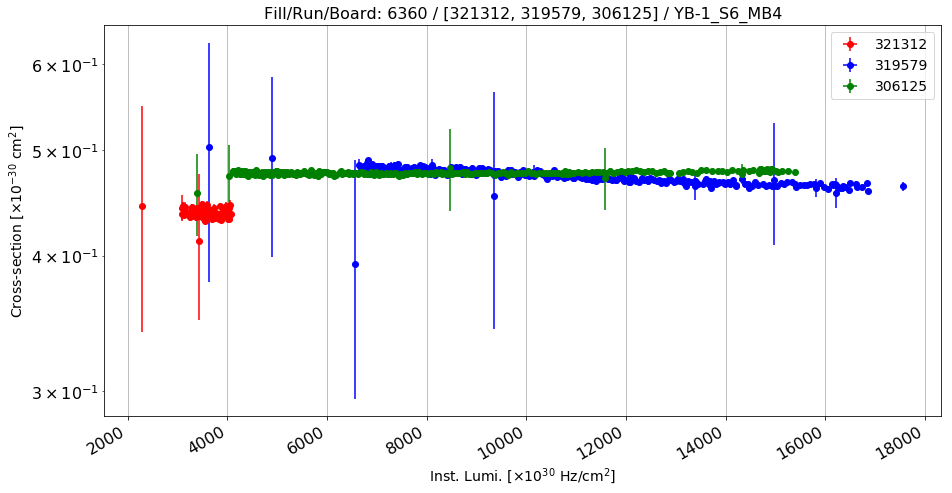

Anomalous CS: 0.437813407934 , Normal CS: 0.468859942764 , Ratio: 0.0662170767815


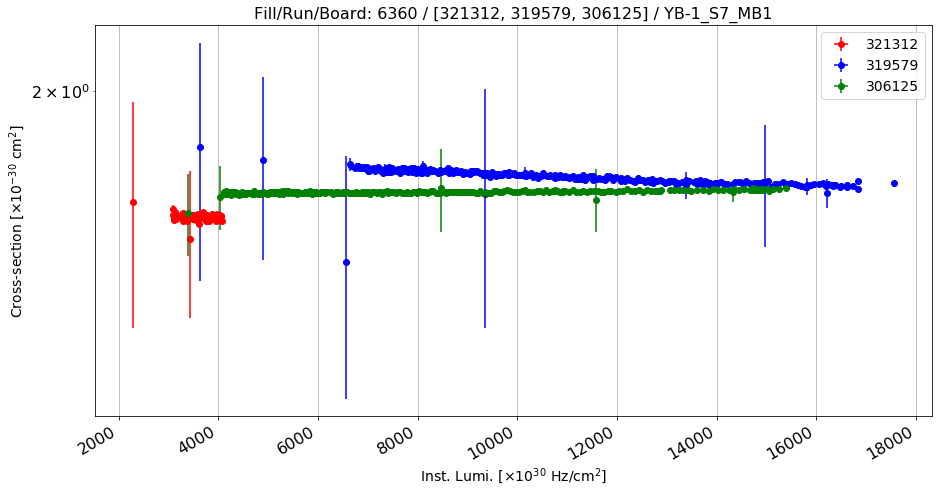

Anomalous CS: 1.53534986446 , Normal CS: 1.65701929322 , Ratio: 0.0734266820267


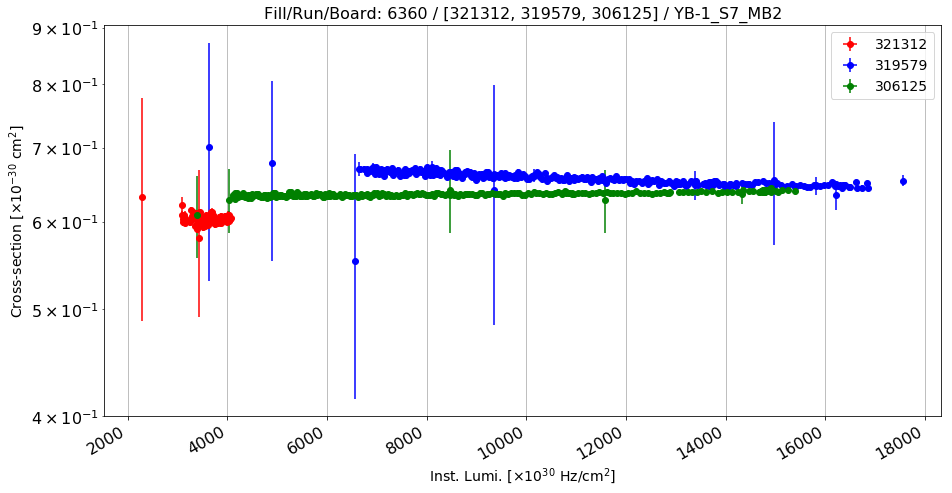

Anomalous CS: 0.604145308866 , Normal CS: 0.652753669421 , Ratio: 0.0744666216862


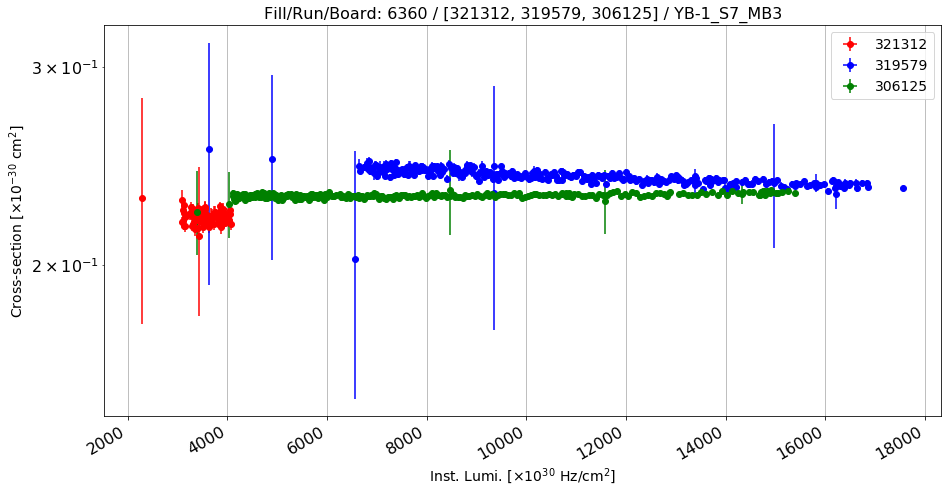

Anomalous CS: 0.220529197167 , Normal CS: 0.237850003082 , Ratio: 0.0728223909643


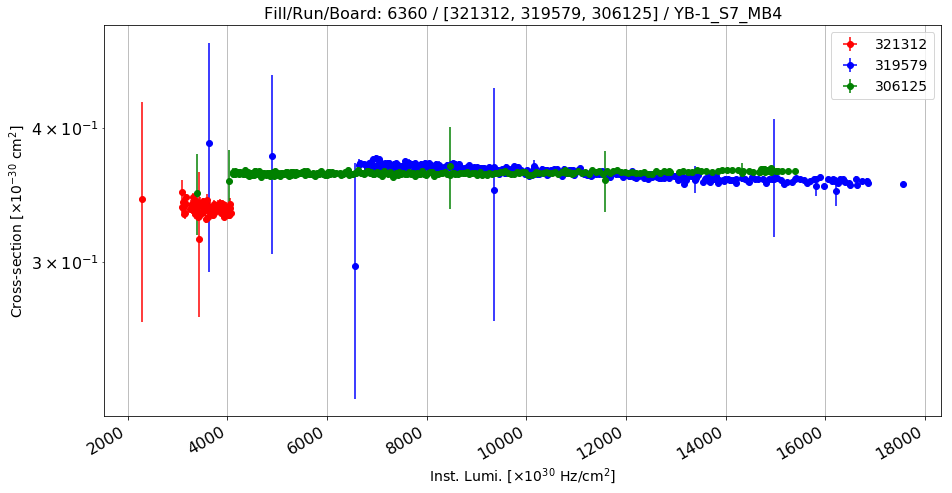

Anomalous CS: 0.33654894038 , Normal CS: 0.360272197423 , Ratio: 0.0658481481852


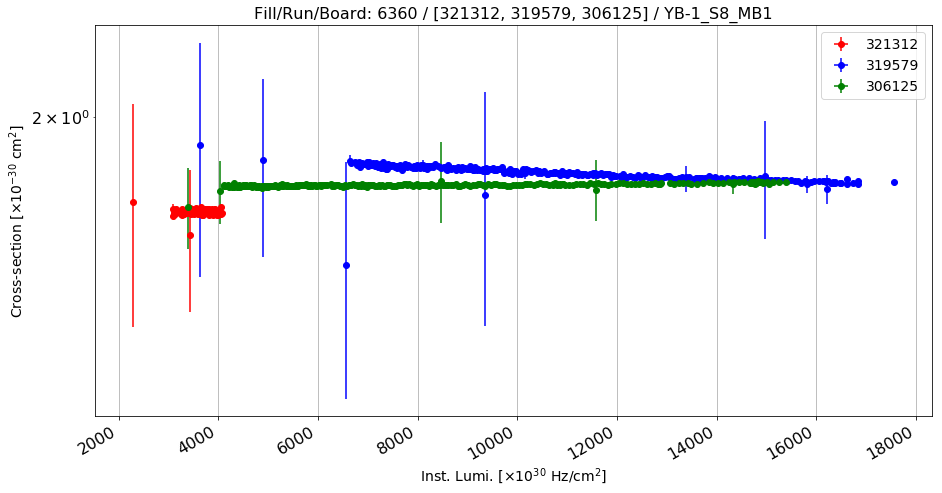

Anomalous CS: 1.6294043093 , Normal CS: 1.75760959284 , Ratio: 0.0729429812287


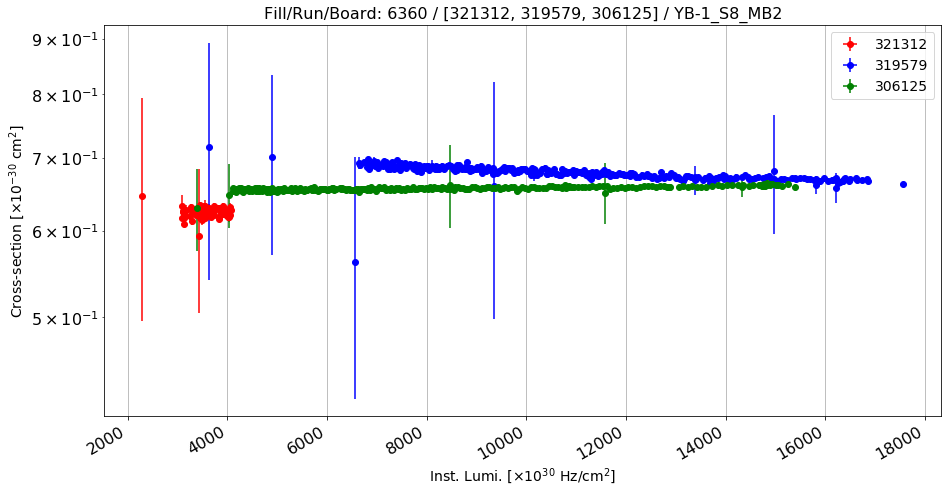

Anomalous CS: 0.623686001719 , Normal CS: 0.673350800269 , Ratio: 0.0737576884584


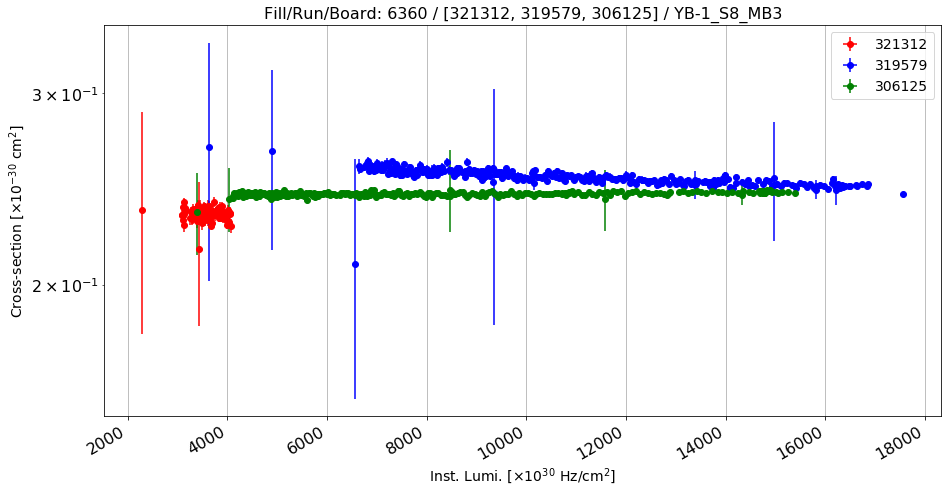

Anomalous CS: 0.232142717205 , Normal CS: 0.24923586889 , Ratio: 0.0685822300018


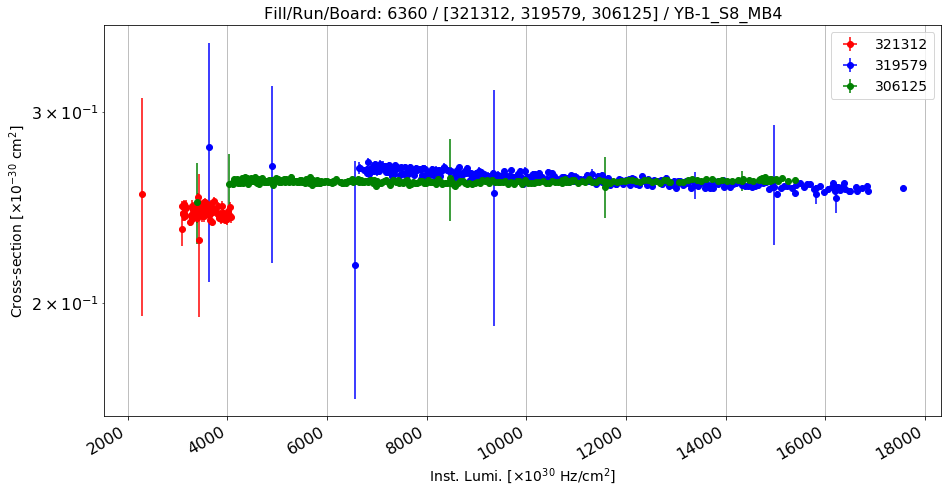

Anomalous CS: 0.242435220102 , Normal CS: 0.257987947016 , Ratio: 0.0602847035843


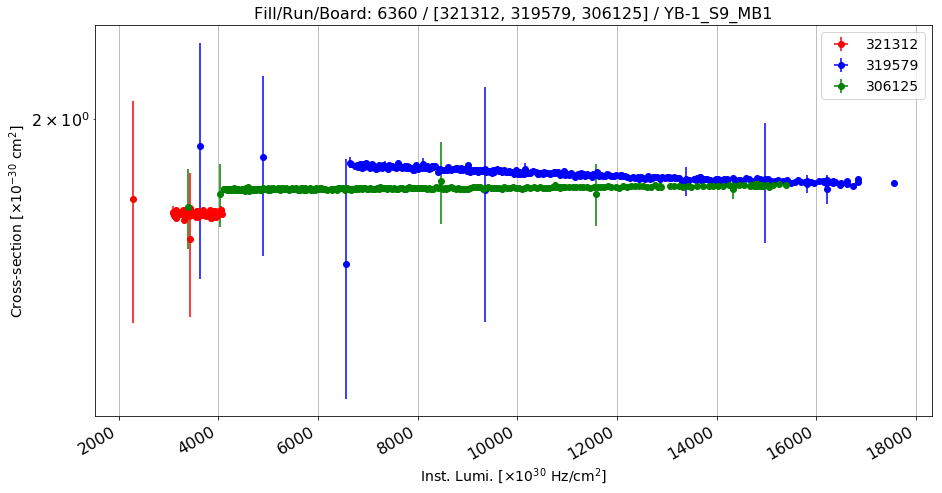

Anomalous CS: 1.63342332294 , Normal CS: 1.764774605 , Ratio: 0.074429494673


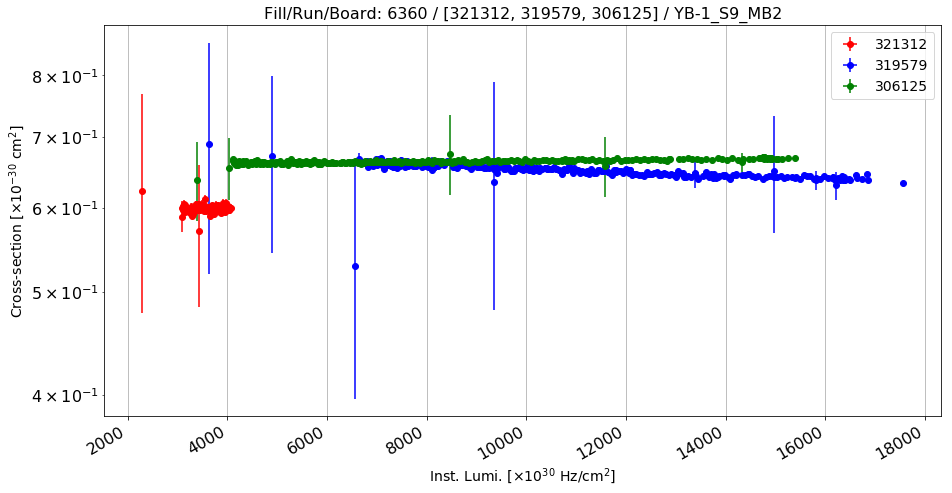

Anomalous CS: 0.599212318037 , Normal CS: 0.64609170981 , Ratio: 0.0725584171112


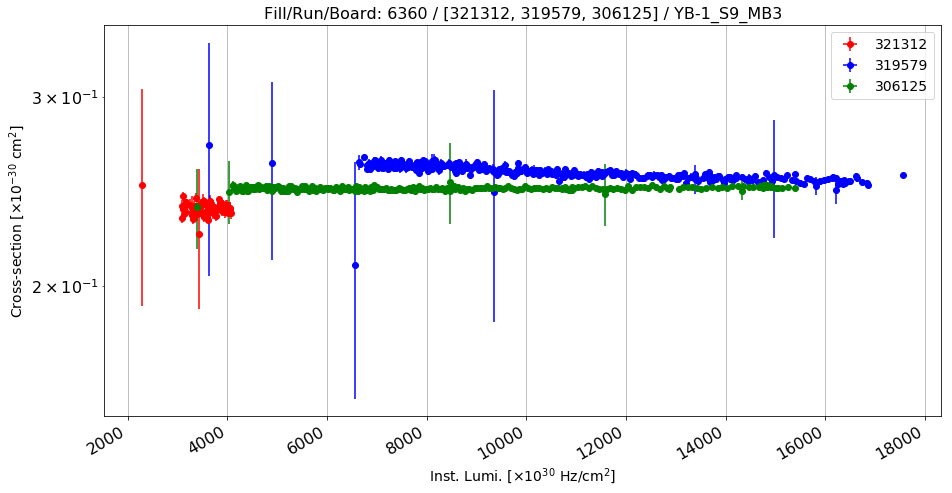

Anomalous CS: 0.236054903765 , Normal CS: 0.252944449432 , Ratio: 0.0667717584015


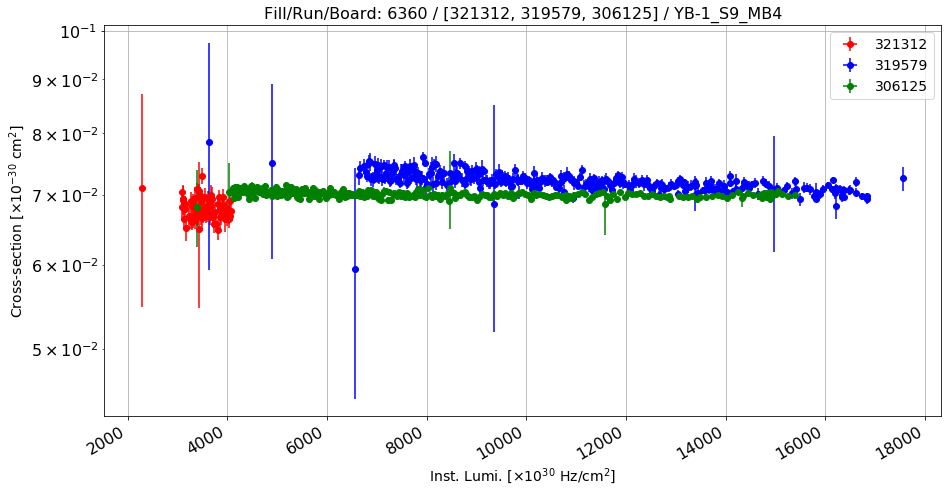

Anomalous CS: 0.067873661101 , Normal CS: 0.0713397791729 , Ratio: 0.0485860499162


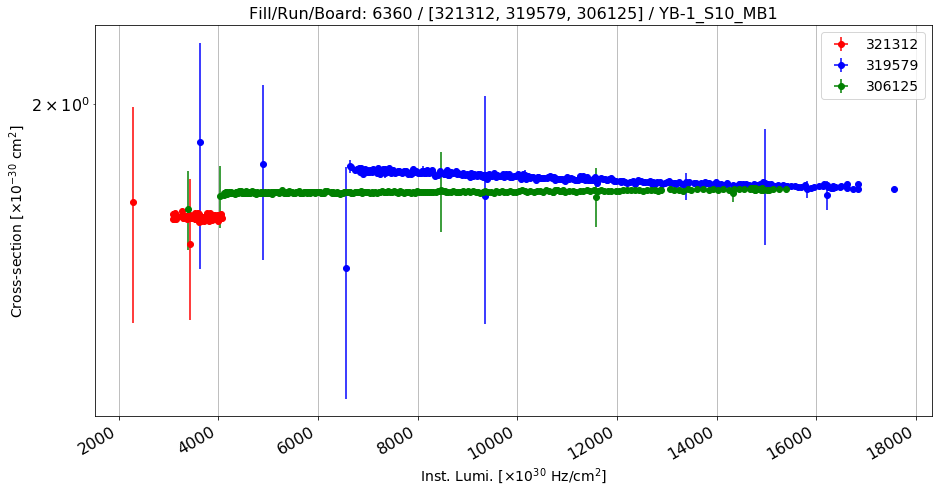

Anomalous CS: 1.56070287504 , Normal CS: 1.68521564789 , Ratio: 0.0738853647688


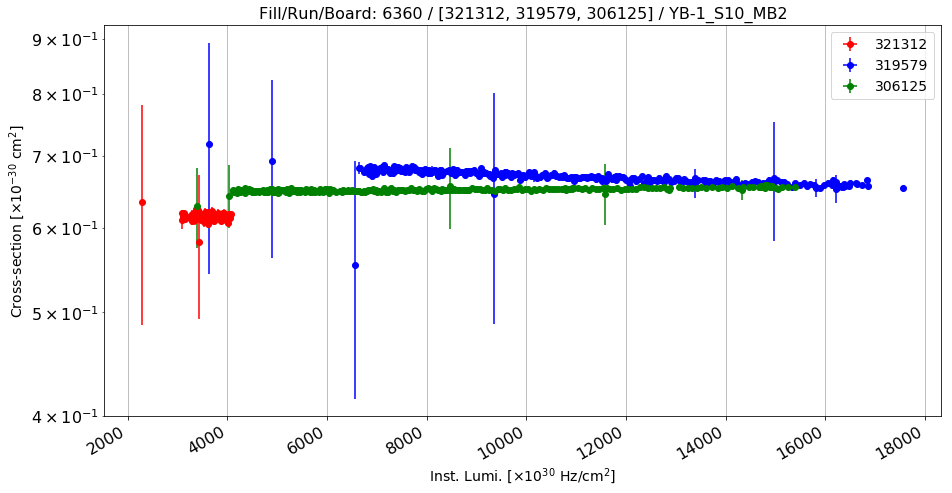

Anomalous CS: 0.614171572278 , Normal CS: 0.664489494688 , Ratio: 0.0757241804618


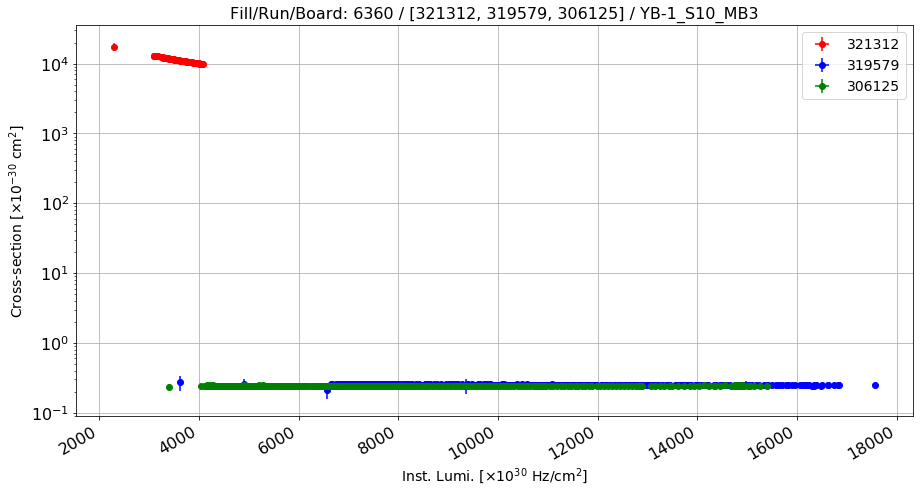

Anomalous CS: 11369.09221 , Normal CS: 0.250310798404 , Ratio: -45418.9031065


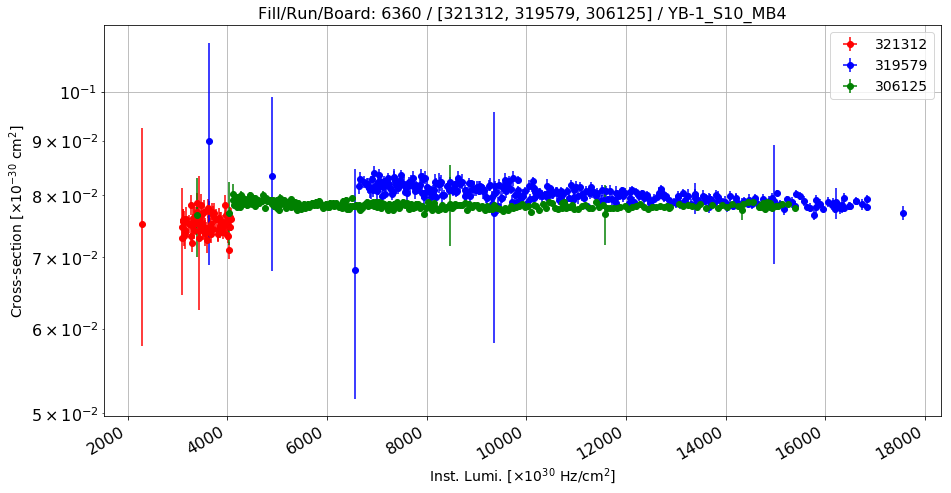

Anomalous CS: 0.0752565272858 , Normal CS: 0.0794666875561 , Ratio: 0.052980190816


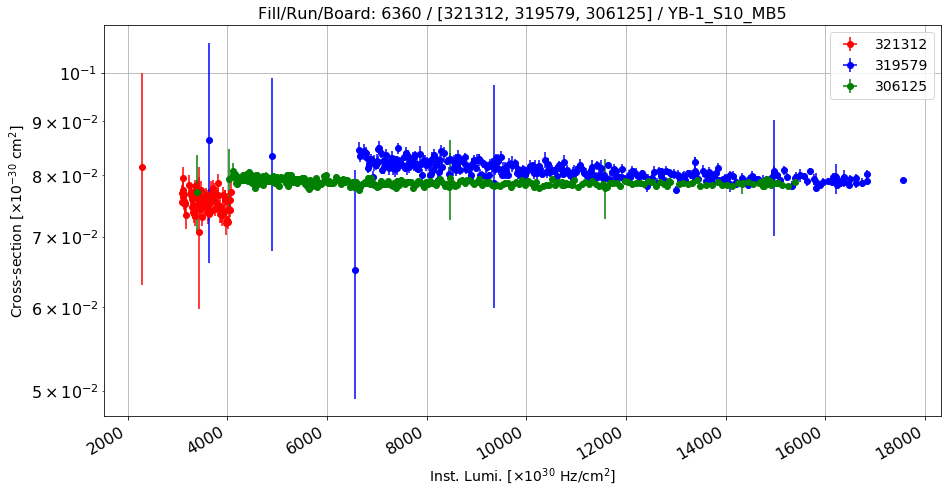

Anomalous CS: 0.0755372270427 , Normal CS: 0.0800224935823 , Ratio: 0.0560500721586


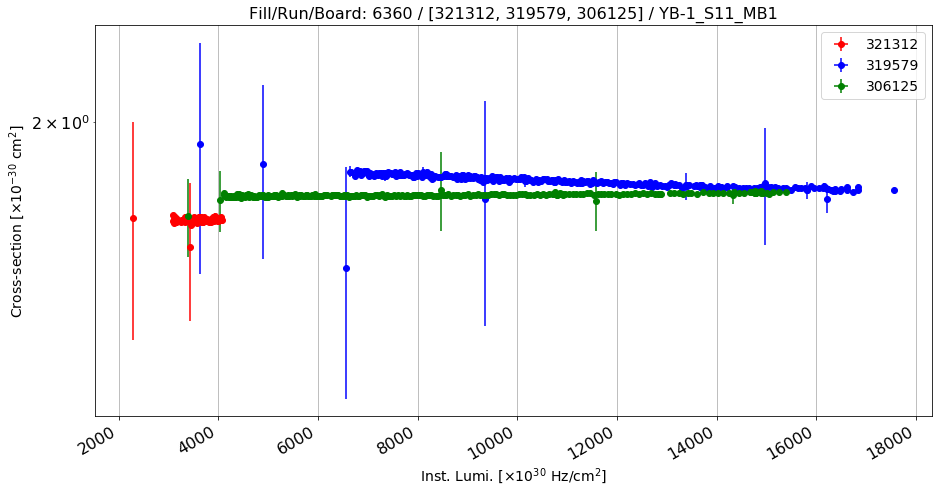

Anomalous CS: 1.61090863448 , Normal CS: 1.74112818877 , Ratio: 0.0747903314246


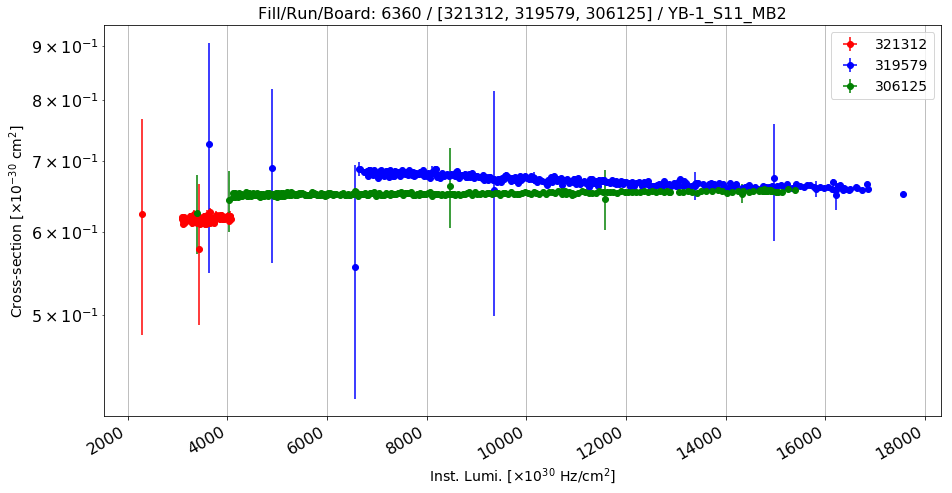

Anomalous CS: 0.616452659684 , Normal CS: 0.66555151176 , Ratio: 0.0737716783876


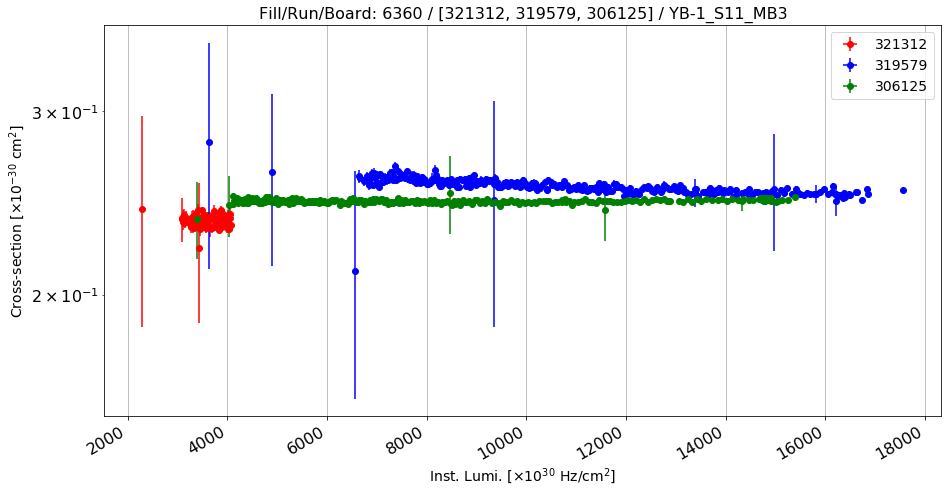

Anomalous CS: 0.235447568756 , Normal CS: 0.25207157343 , Ratio: 0.0659495414249


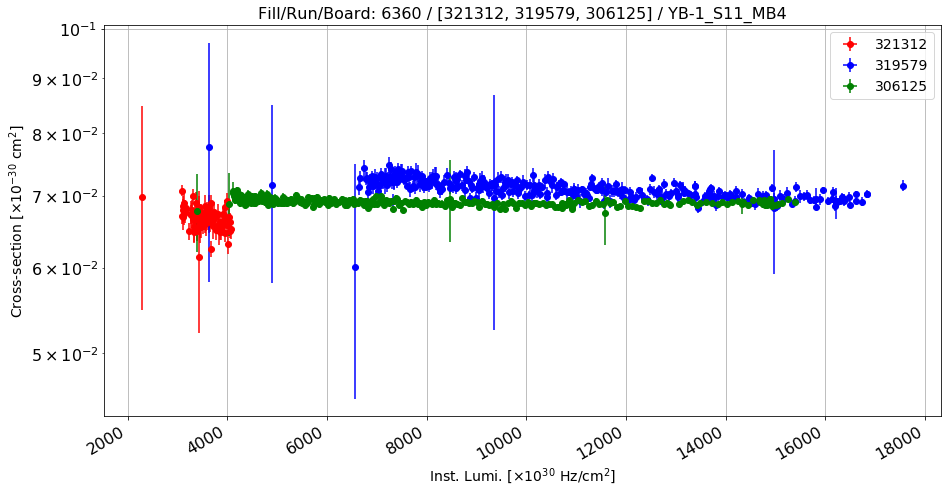

Anomalous CS: 0.0667067597695 , Normal CS: 0.0703392157189 , Ratio: 0.0516419740005


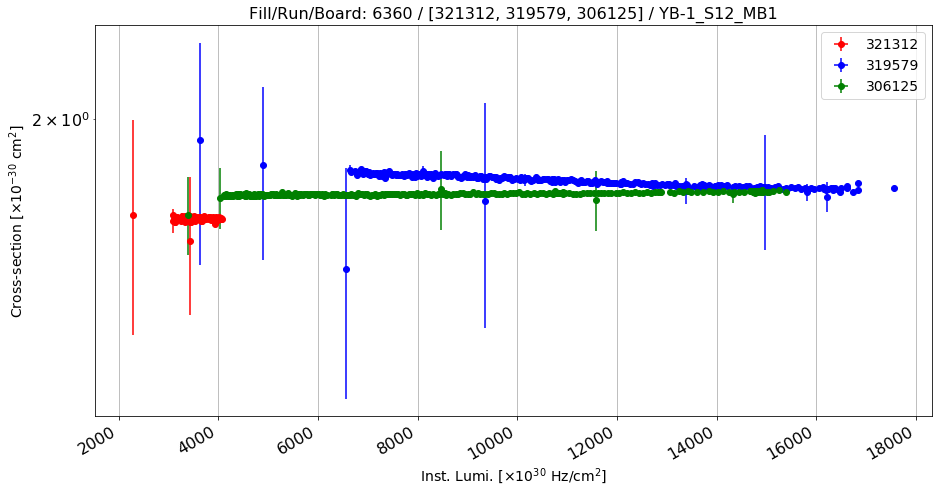

Anomalous CS: 1.60446580486 , Normal CS: 1.73210613386 , Ratio: 0.0736908244295


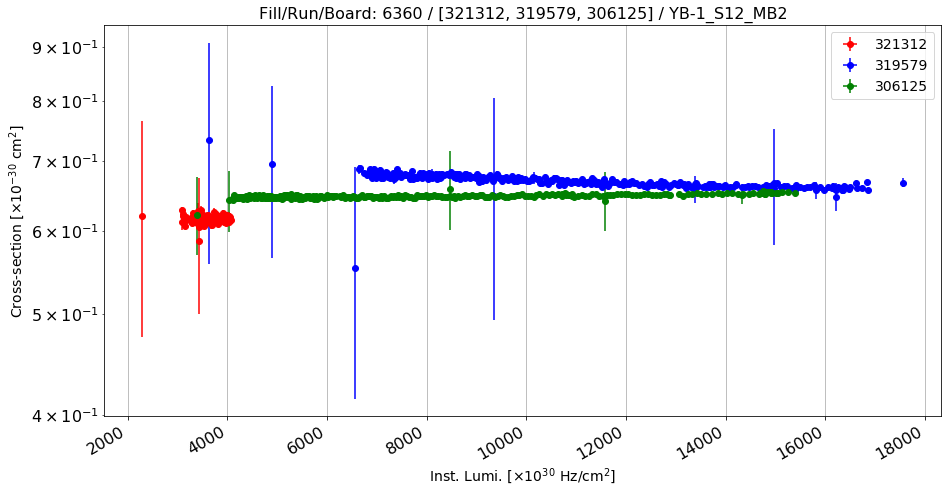

Anomalous CS: 0.616361476857 , Normal CS: 0.665159350417 , Ratio: 0.0733626814832


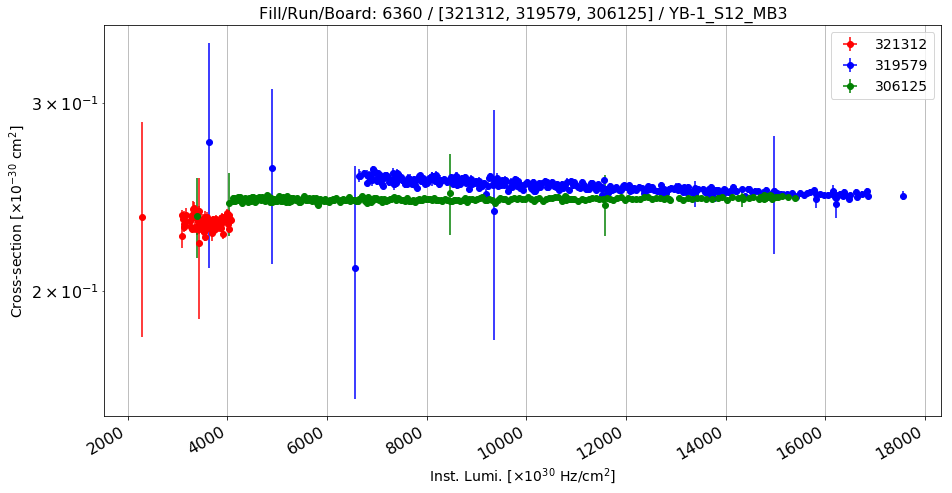

Anomalous CS: 0.232102267671 , Normal CS: 0.248870613863 , Ratio: 0.067377766833


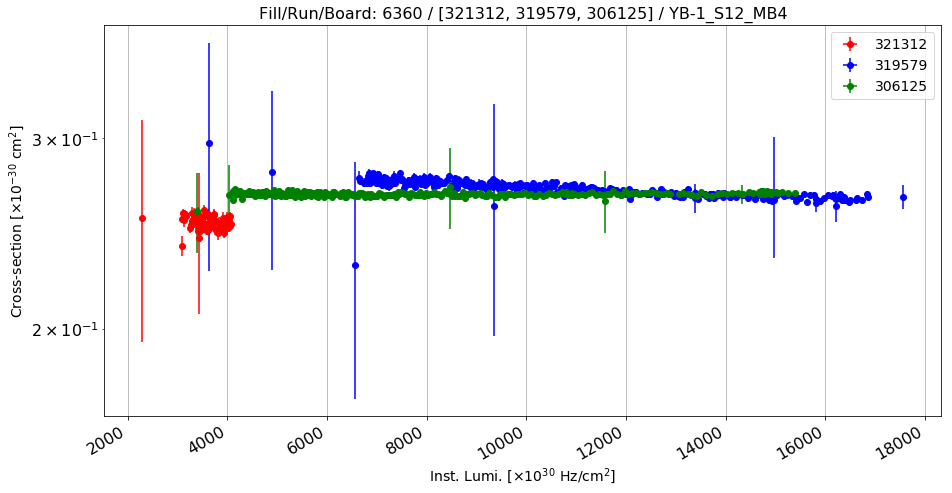

Anomalous CS: 0.250671341422 , Normal CS: 0.266817558033 , Ratio: 0.0605140708519


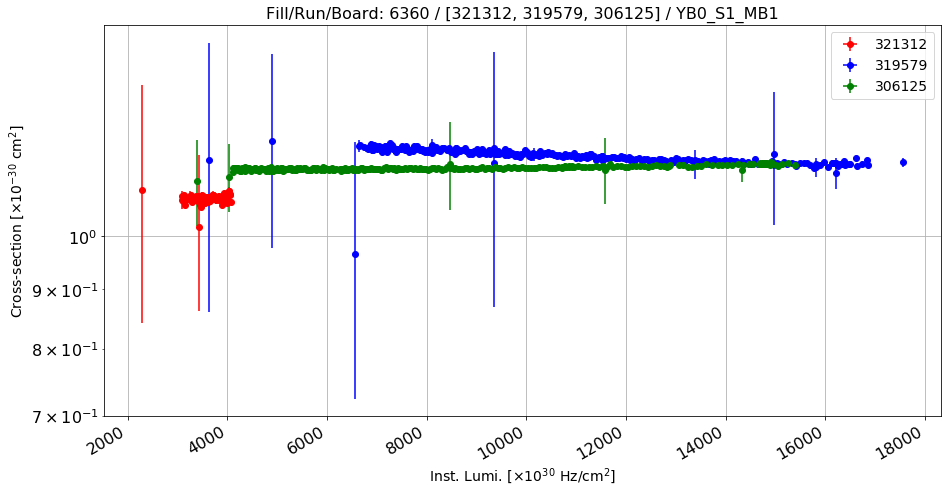

Anomalous CS: 1.07705036214 , Normal CS: 1.16434721347 , Ratio: 0.0749749304348


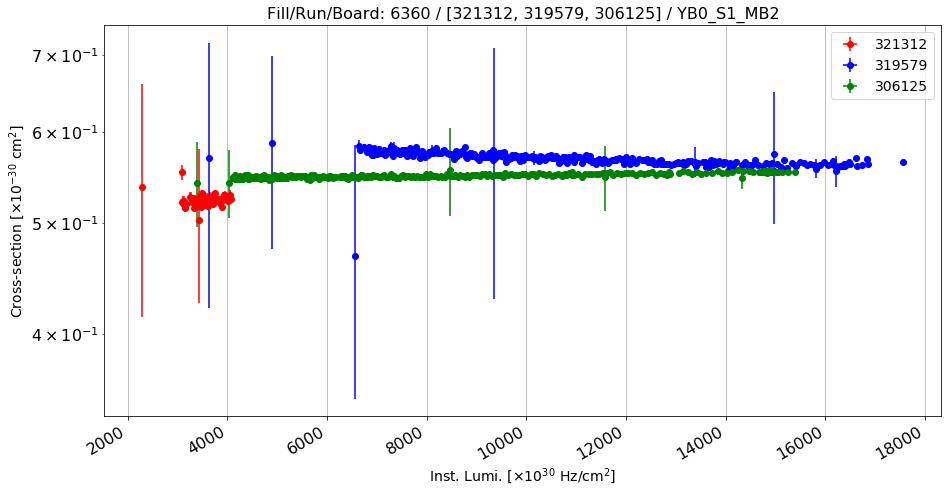

Anomalous CS: 0.523363369512 , Normal CS: 0.56492021536 , Ratio: 0.0735623274198


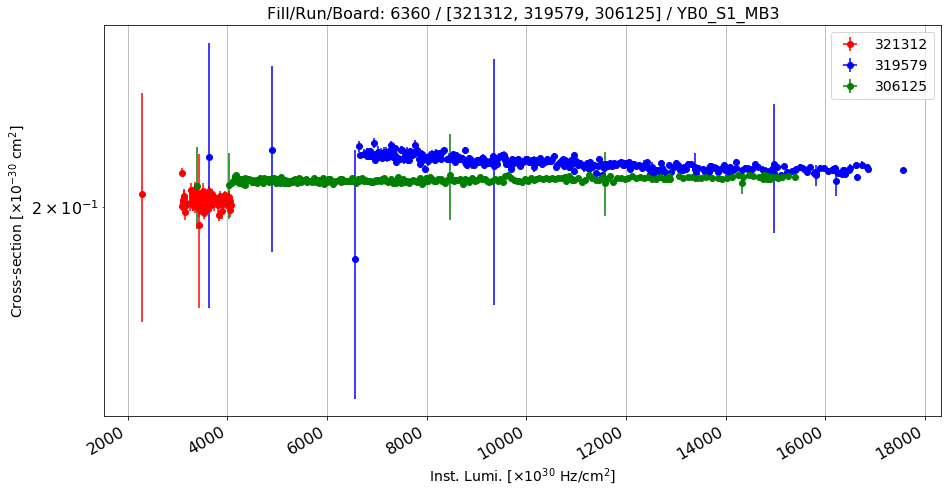

Anomalous CS: 0.202502660603 , Normal CS: 0.217138480384 , Ratio: 0.0674031602091


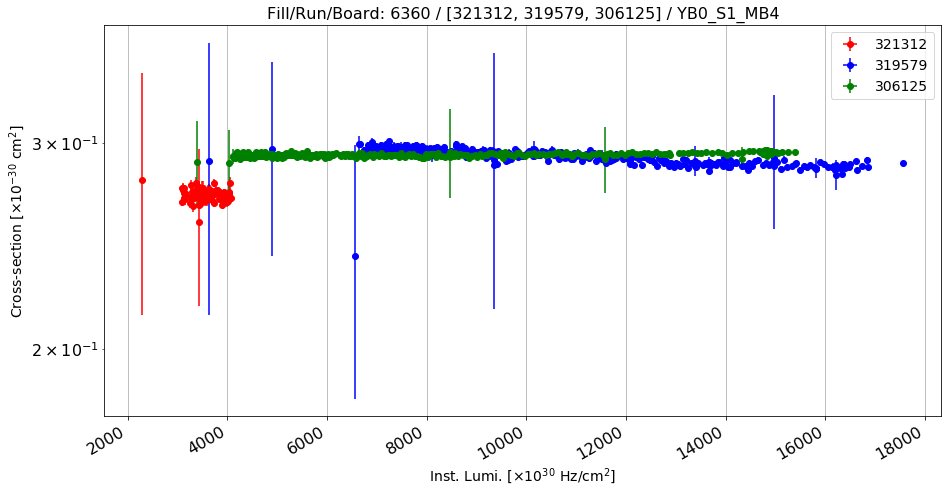

Anomalous CS: 0.270848657173 , Normal CS: 0.289699334652 , Ratio: 0.065069799011


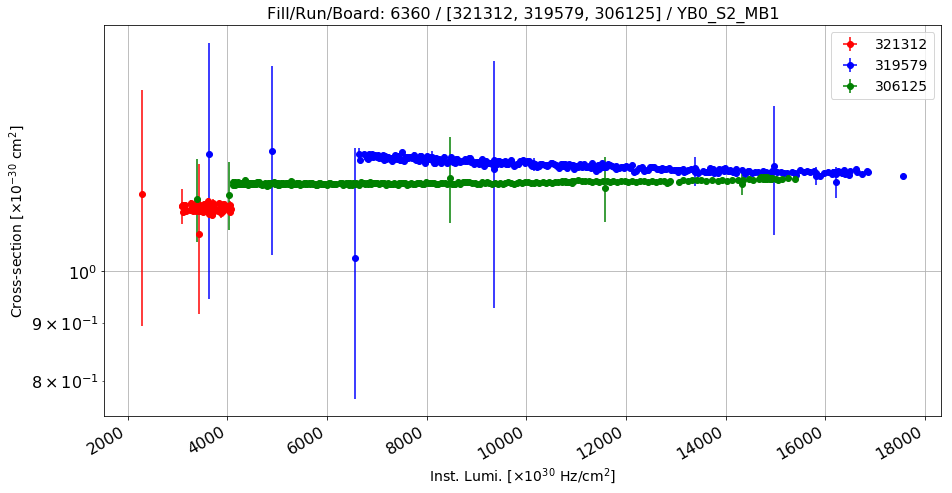

Anomalous CS: 1.13779750504 , Normal CS: 1.23176080603 , Ratio: 0.0762837236954


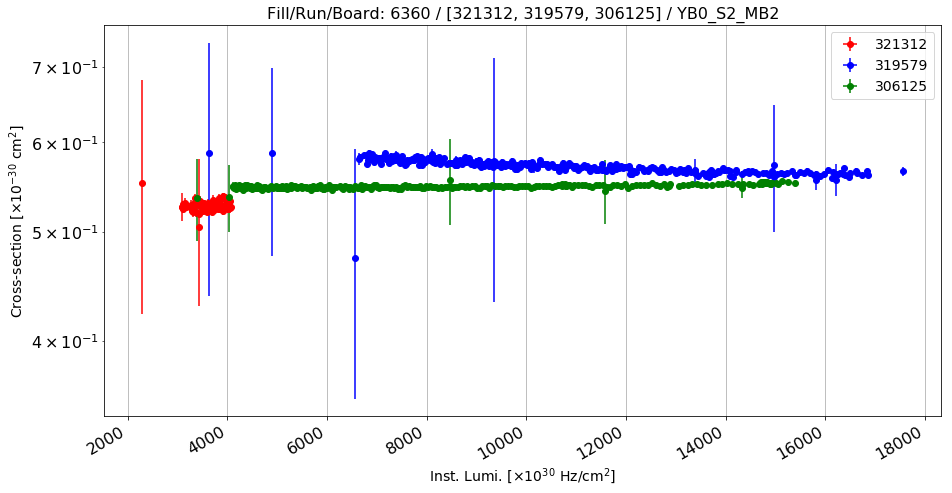

Anomalous CS: 0.527352831143 , Normal CS: 0.566886280633 , Ratio: 0.069737883664


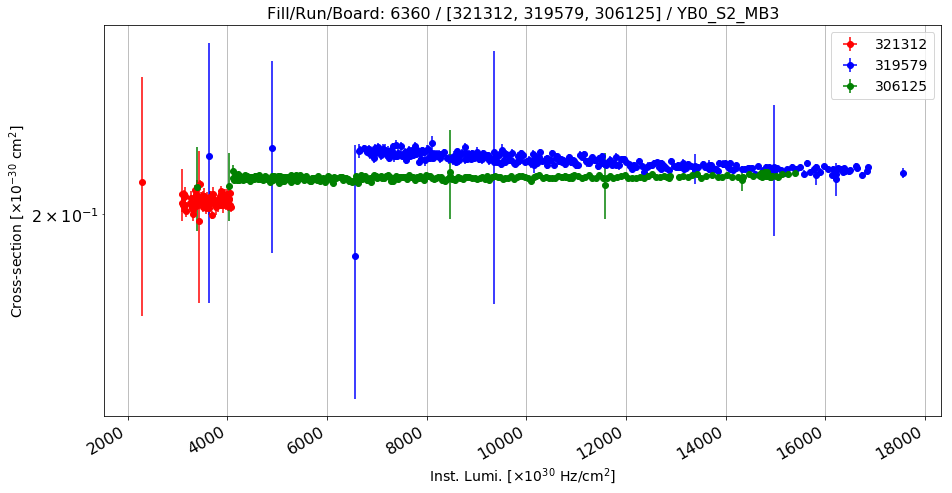

Anomalous CS: 0.205493538818 , Normal CS: 0.220565710747 , Ratio: 0.0683341571001


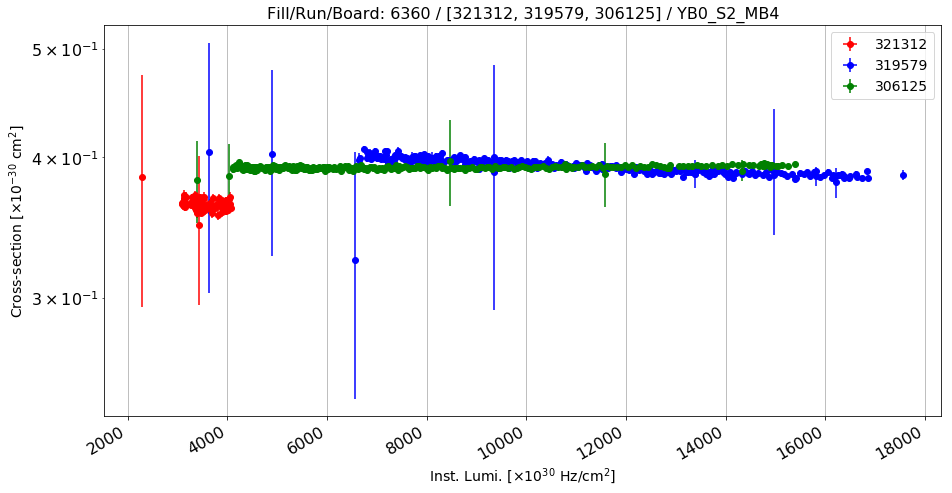

Anomalous CS: 0.363222451366 , Normal CS: 0.389444918927 , Ratio: 0.0673329302463


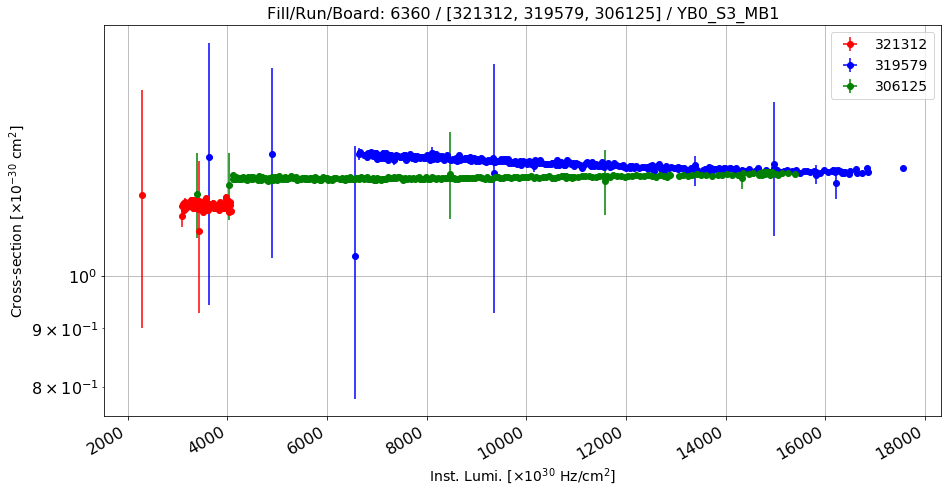

Anomalous CS: 1.15290565366 , Normal CS: 1.24490034947 , Ratio: 0.0738972367149


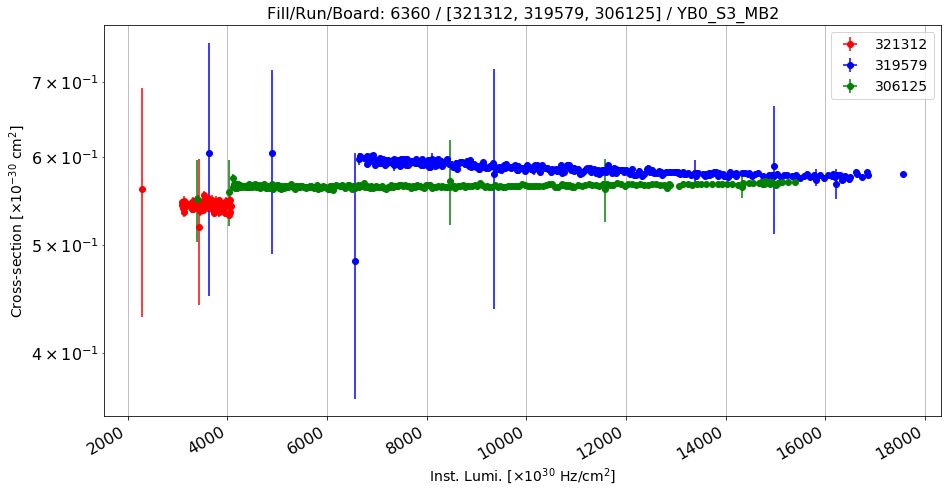

Anomalous CS: 0.542544550754 , Normal CS: 0.580663295426 , Ratio: 0.0656468989386


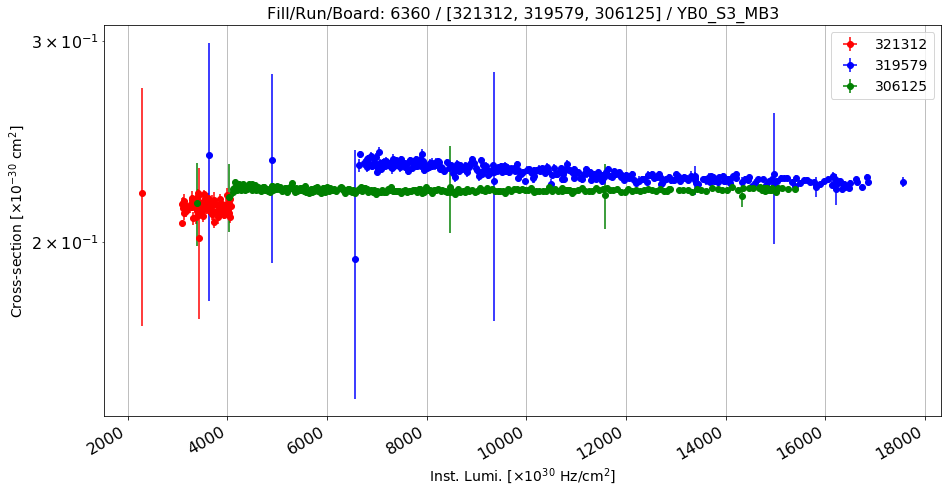

Anomalous CS: 0.214635421354 , Normal CS: 0.227636590462 , Ratio: 0.0571137051451


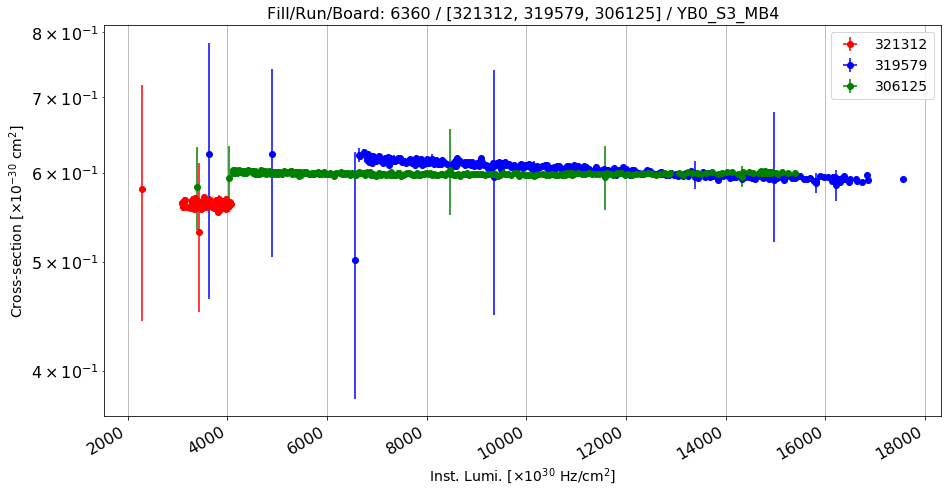

Anomalous CS: 0.56259085078 , Normal CS: 0.598983135817 , Ratio: 0.0607567773799


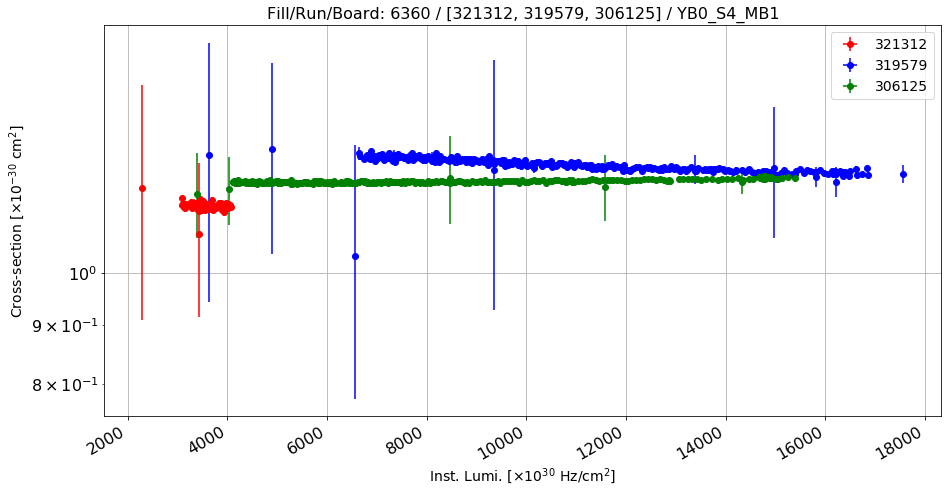

Anomalous CS: 1.14342989129 , Normal CS: 1.23254558273 , Ratio: 0.0723021466231


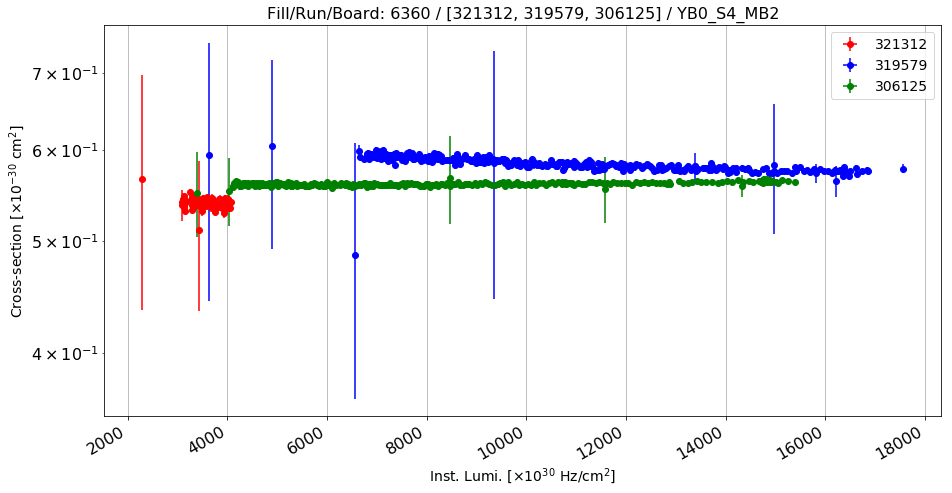

Anomalous CS: 0.539357715369 , Normal CS: 0.579224622325 , Ratio: 0.0688280598236


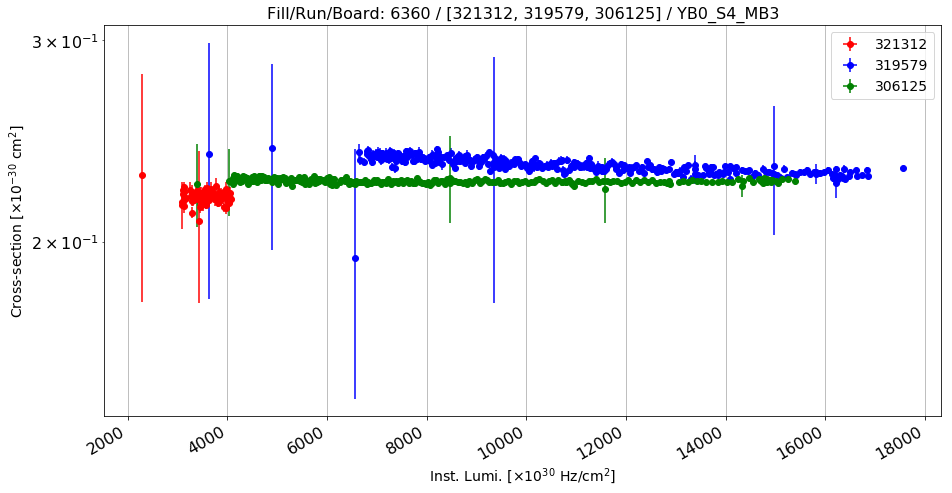

Anomalous CS: 0.218984730292 , Normal CS: 0.231325939411 , Ratio: 0.0533498713991


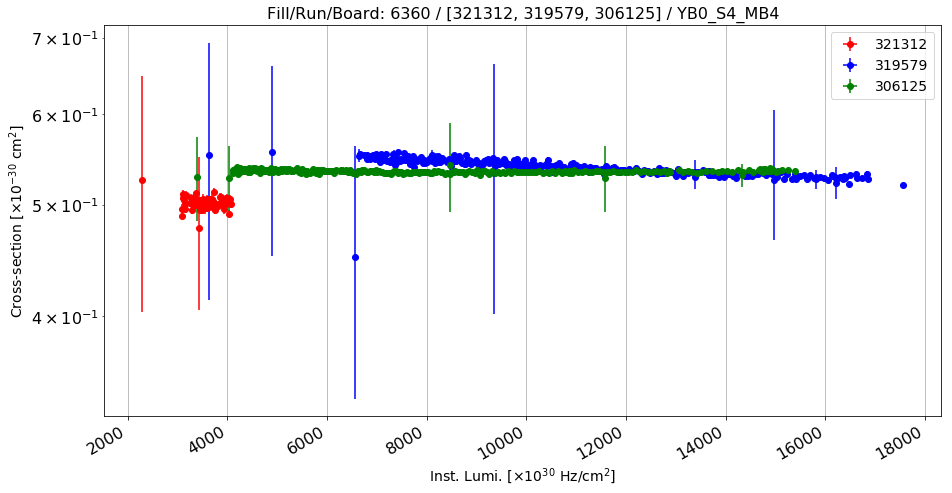

Anomalous CS: 0.502735250555 , Normal CS: 0.534619385813 , Ratio: 0.0596389433382


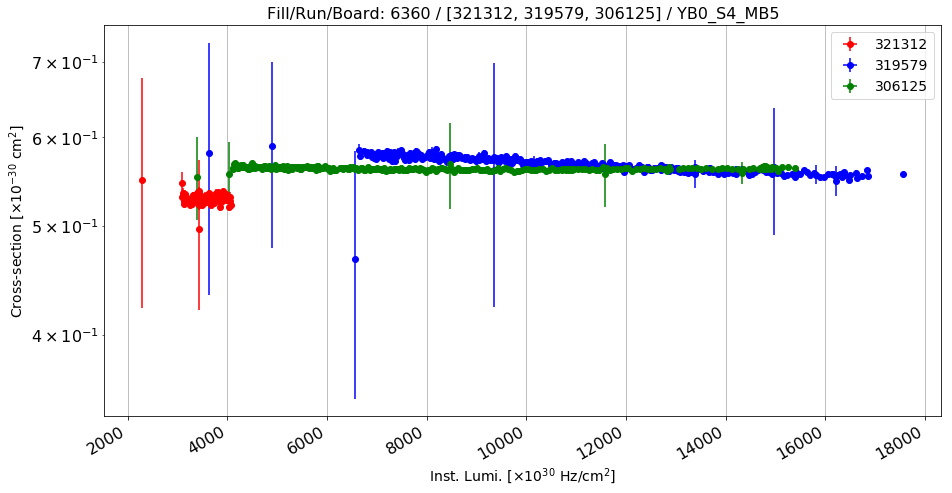

Anomalous CS: 0.529137785911 , Normal CS: 0.562479857001 , Ratio: 0.0592769157431


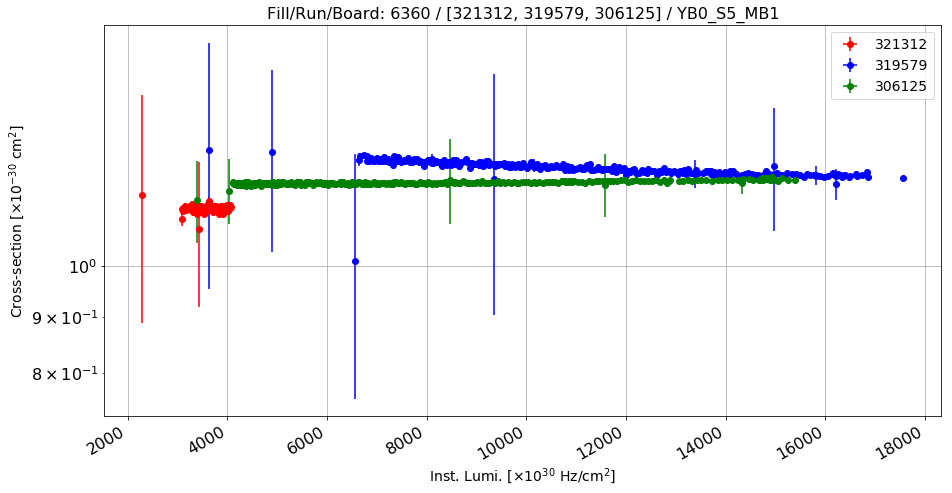

Anomalous CS: 1.12778906836 , Normal CS: 1.21909325591 , Ratio: 0.0748951625355


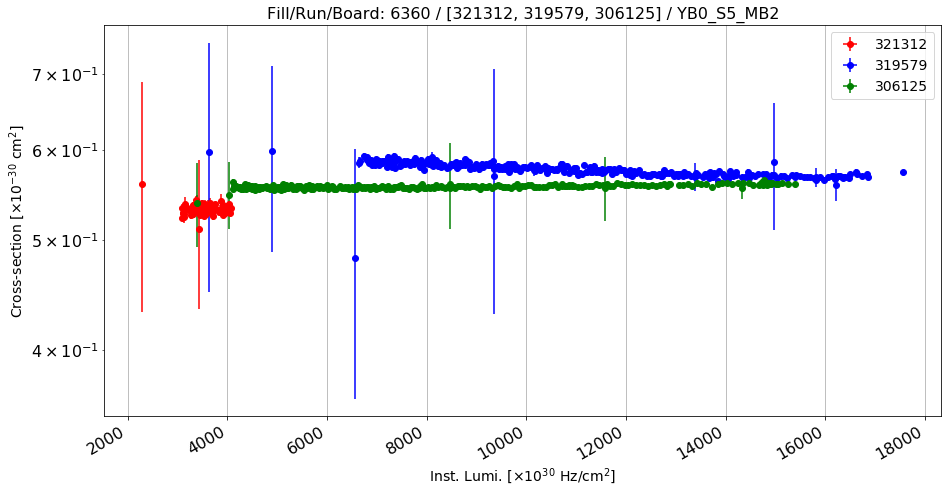

Anomalous CS: 0.532201996165 , Normal CS: 0.572599367339 , Ratio: 0.0705508484255


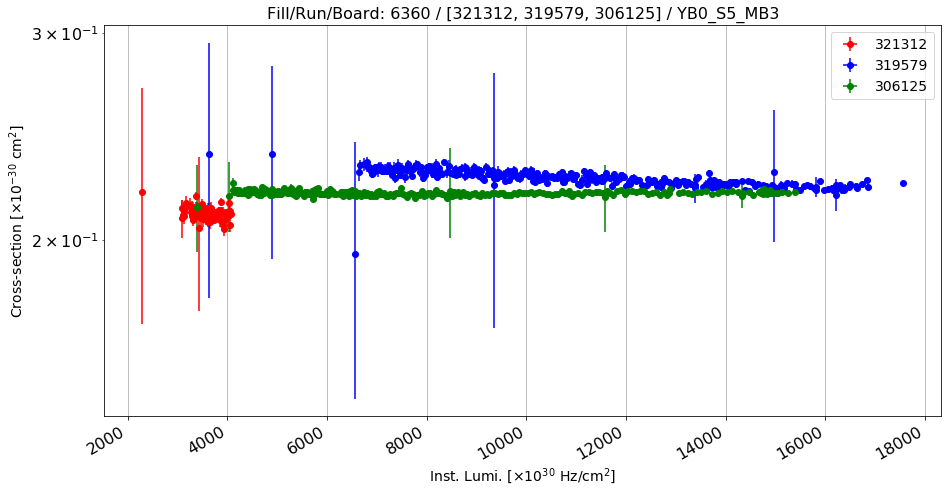

Anomalous CS: 0.210860933857 , Normal CS: 0.224052461245 , Ratio: 0.0588769581665


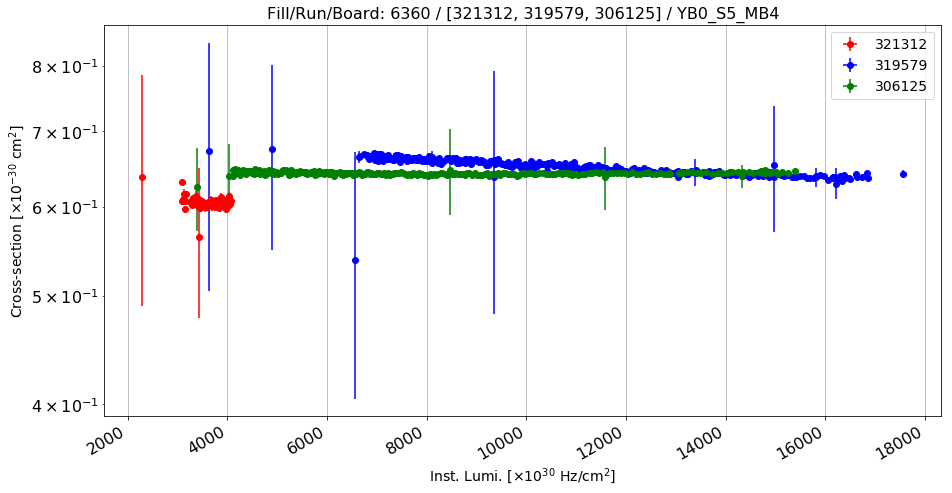

Anomalous CS: 0.605177712307 , Normal CS: 0.644677412265 , Ratio: 0.061270488474


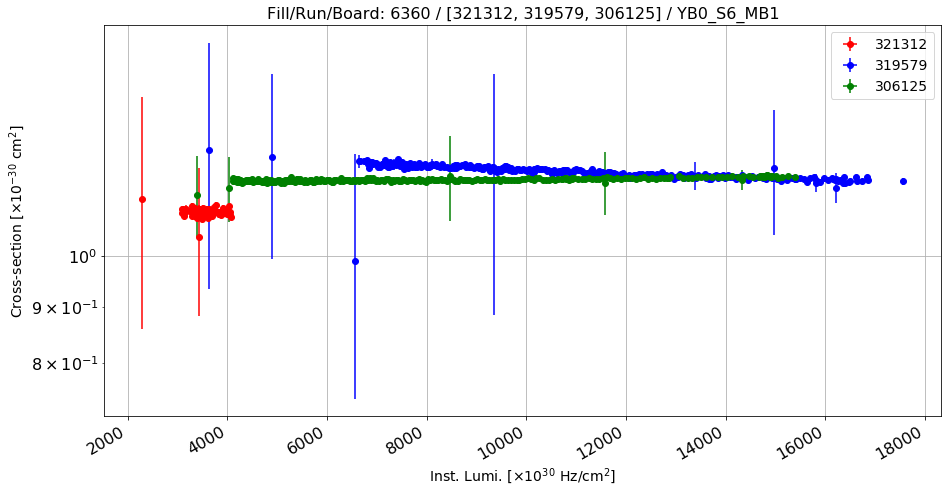

Anomalous CS: 1.09584387639 , Normal CS: 1.18357362613 , Ratio: 0.0741227649952


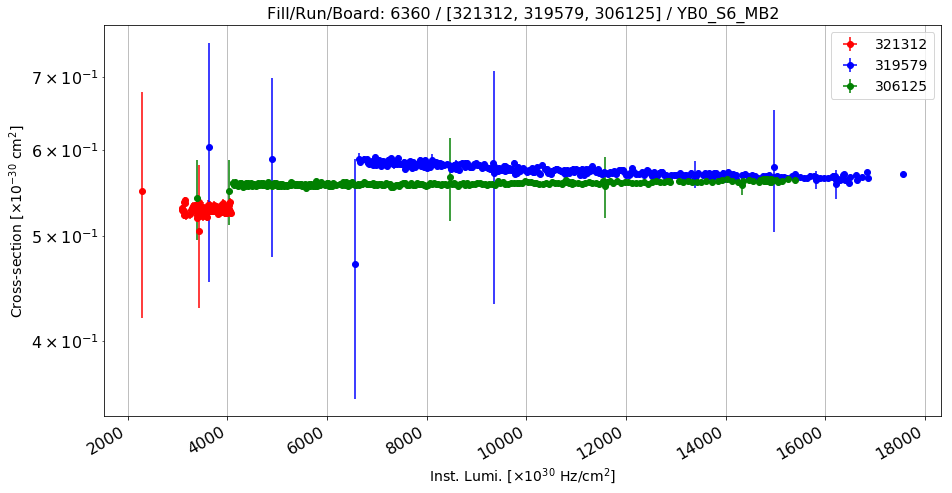

Anomalous CS: 0.5283610866 , Normal CS: 0.569801689568 , Ratio: 0.0727281152846


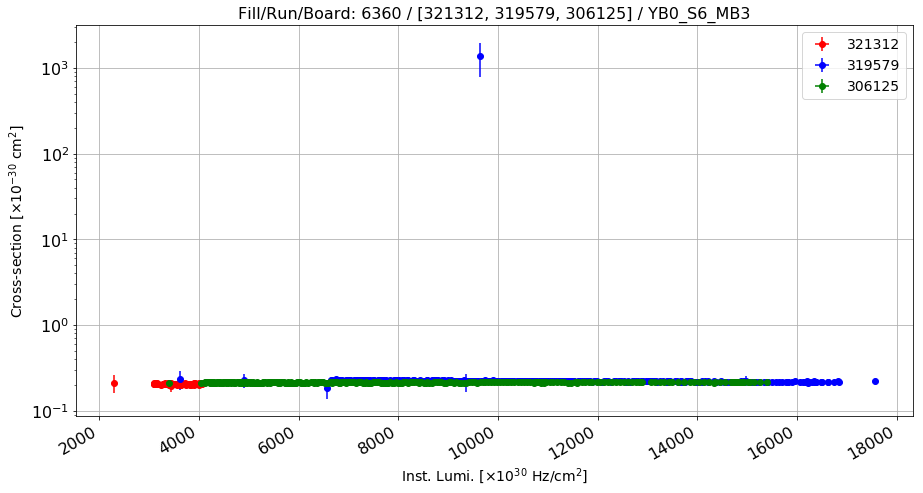

Anomalous CS: 0.205270754076 , Normal CS: 0.220318861541 , Ratio: 0.0683014942959


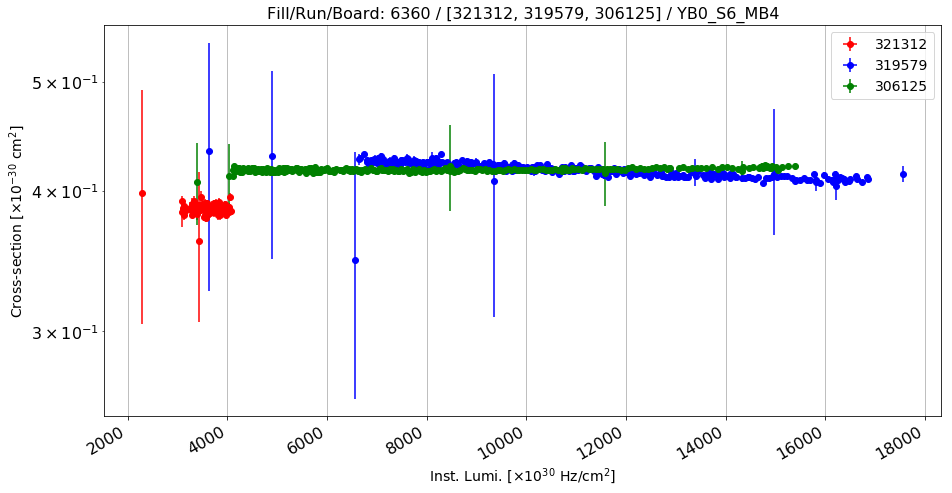

Anomalous CS: 0.385667964859 , Normal CS: 0.414121660943 , Ratio: 0.0687085433279


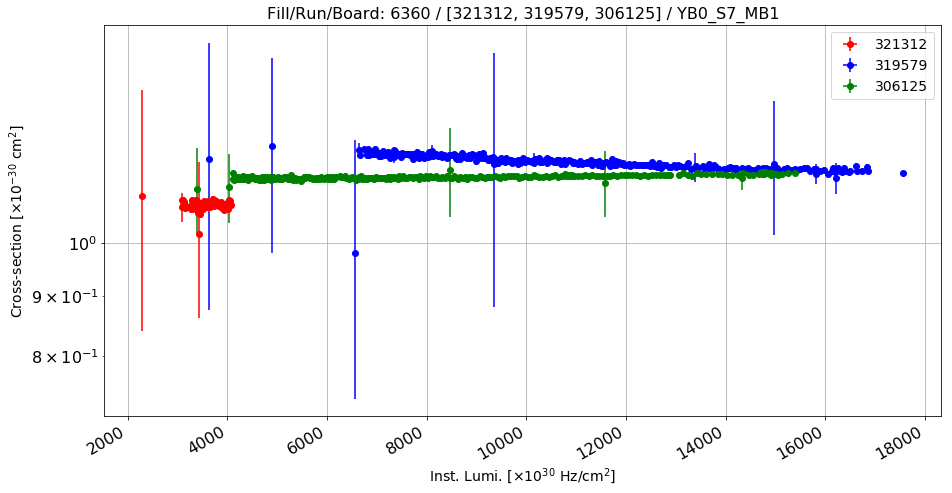

Anomalous CS: 1.07746677502 , Normal CS: 1.16431085079 , Ratio: 0.0745883933902


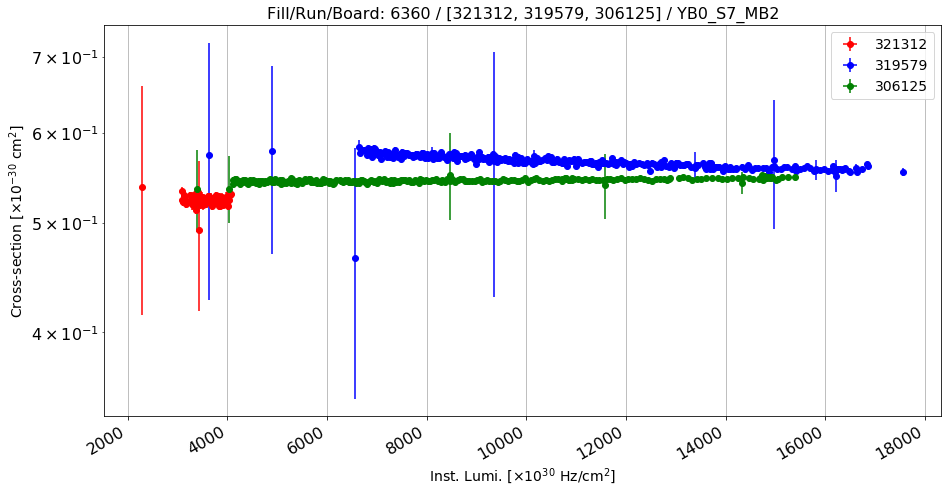

Anomalous CS: 0.523343769978 , Normal CS: 0.561968820785 , Ratio: 0.0687316615765


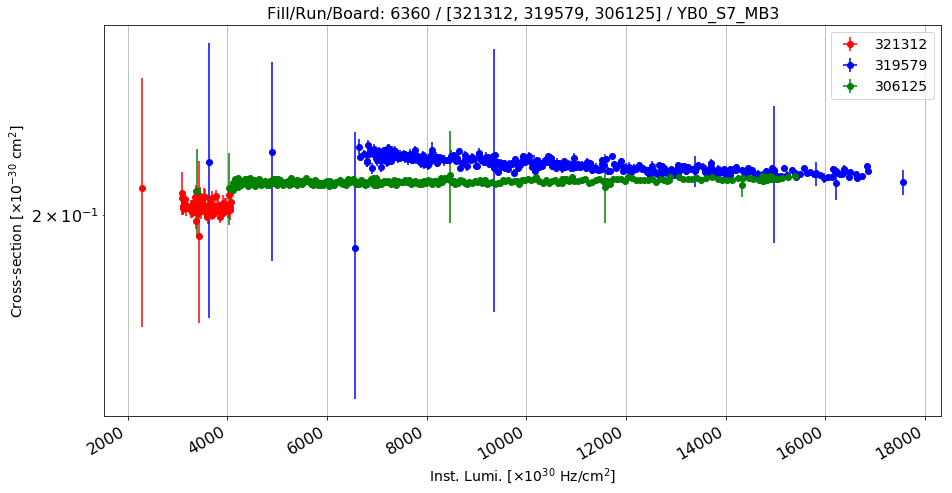

Anomalous CS: 0.203348558663 , Normal CS: 0.218304408885 , Ratio: 0.0685091533347


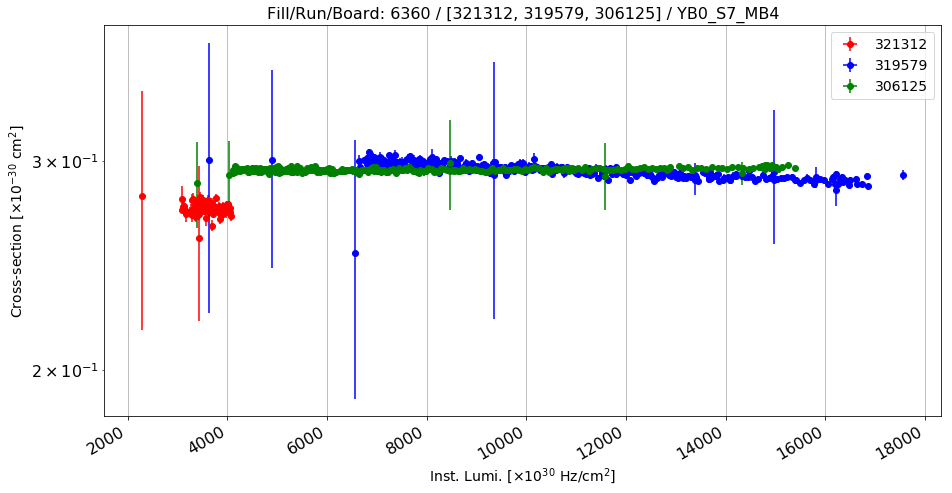

Anomalous CS: 0.27311480607 , Normal CS: 0.292063783074 , Ratio: 0.06487958488


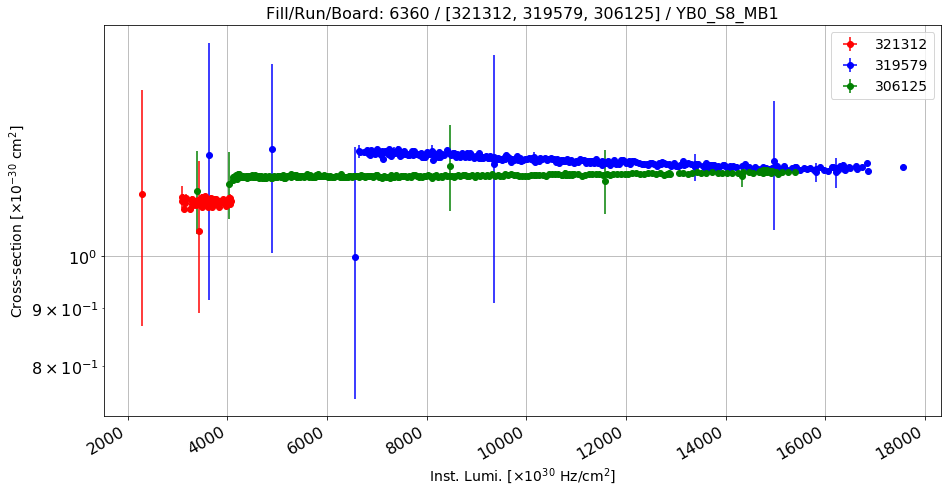

Anomalous CS: 1.11671555735 , Normal CS: 1.20618232255 , Ratio: 0.0741735005782


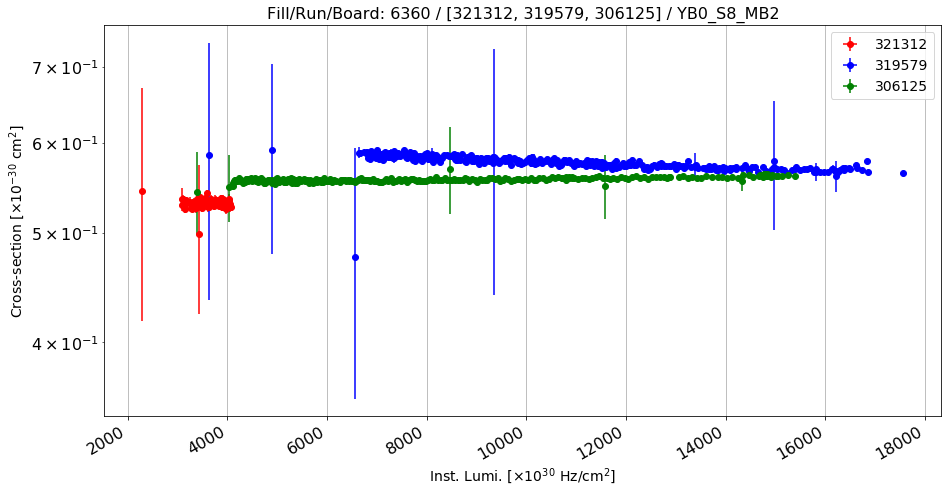

Anomalous CS: 0.530300446606 , Normal CS: 0.57249338908 , Ratio: 0.0737003138886


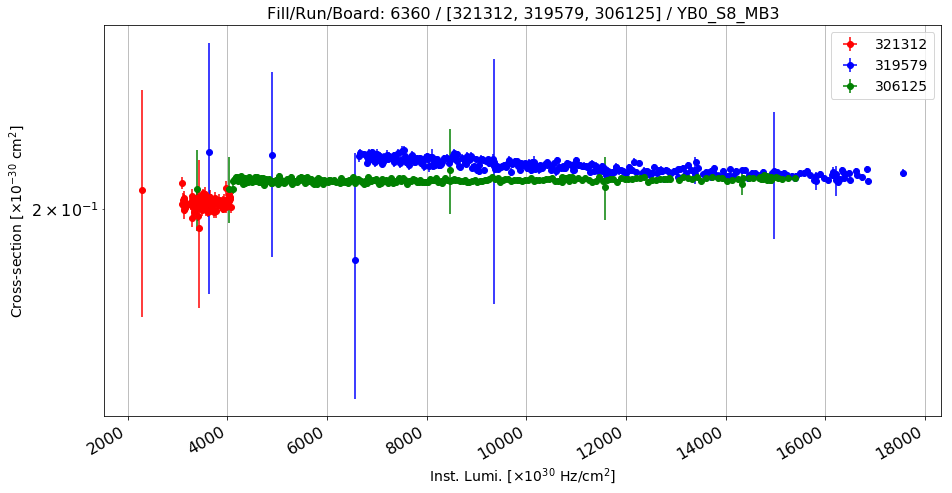

Anomalous CS: 0.202527715375 , Normal CS: 0.216368709096 , Ratio: 0.0639694795914


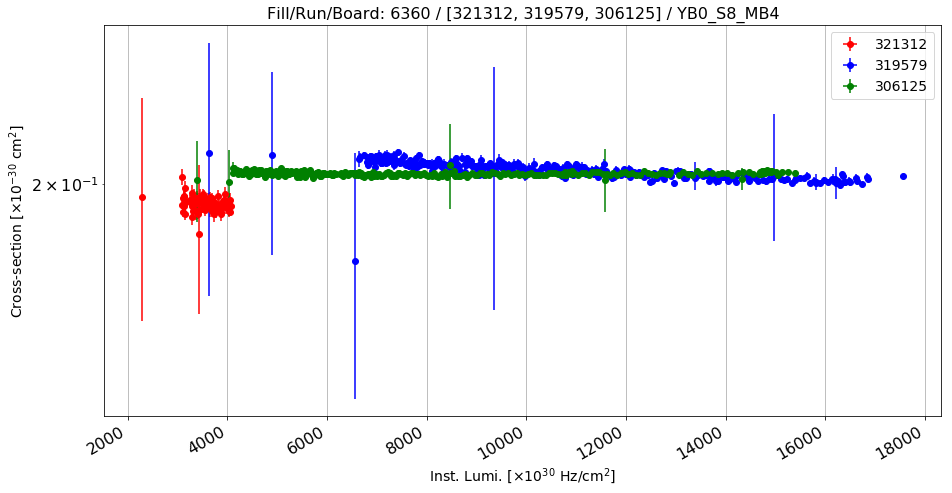

Anomalous CS: 0.191990065333 , Normal CS: 0.20376752821 , Ratio: 0.0577985264922


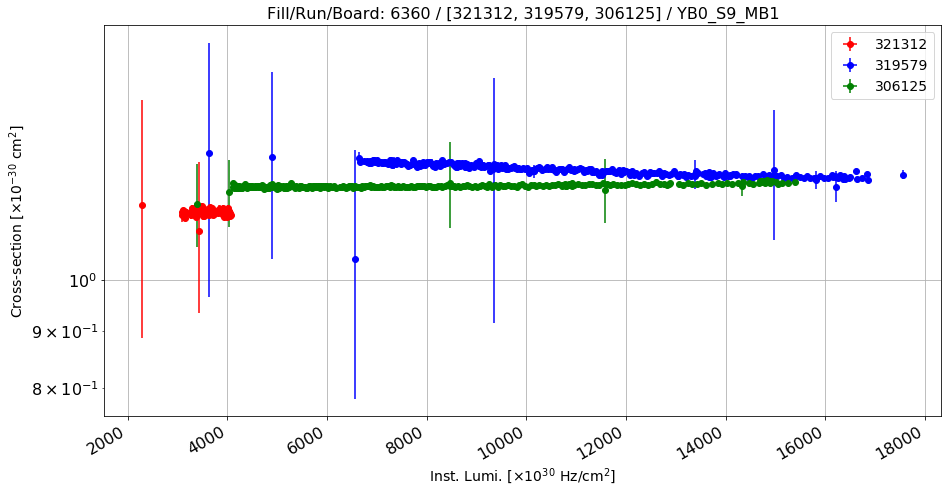

Anomalous CS: 1.14878517791 , Normal CS: 1.24299267267 , Ratio: 0.0757908689446


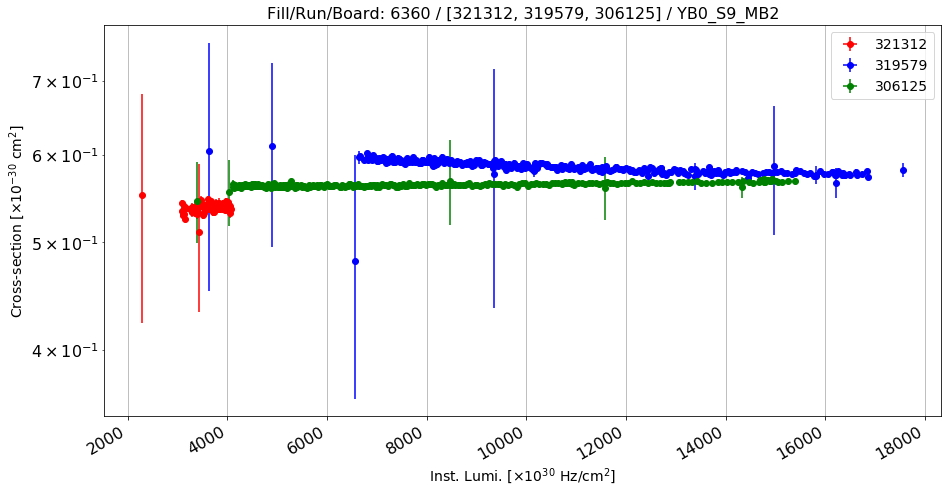

Anomalous CS: 0.537556743782 , Normal CS: 0.580750042303 , Ratio: 0.0743750243216


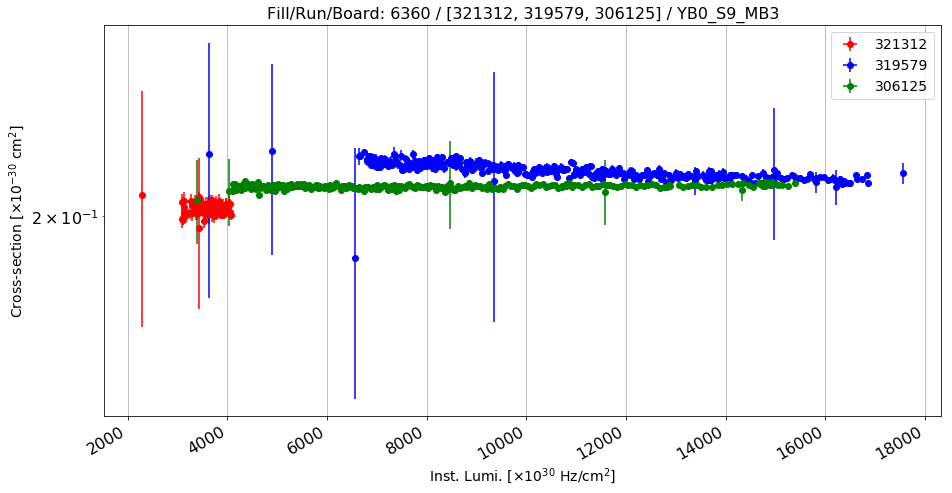

Anomalous CS: 0.20313371489 , Normal CS: 0.217353454463 , Ratio: 0.0654221926587


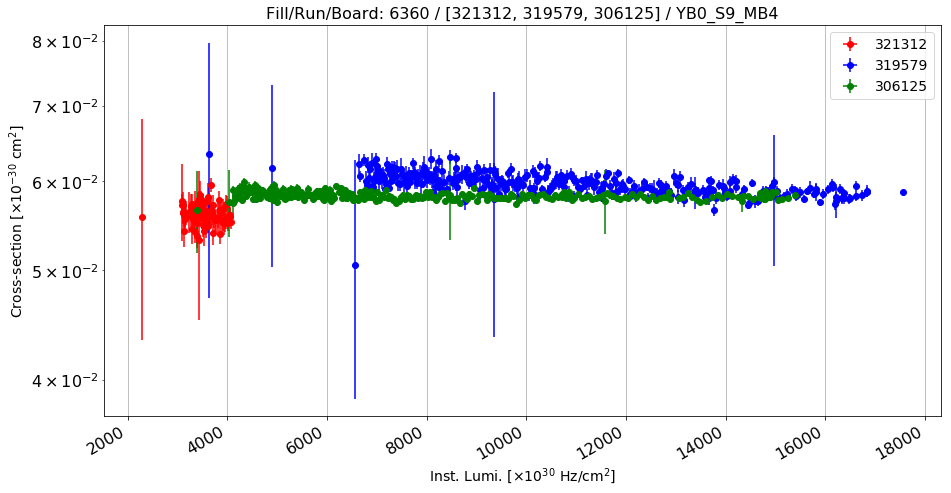

Anomalous CS: 0.0560716625445 , Normal CS: 0.0591402146592 , Ratio: 0.0518860496603


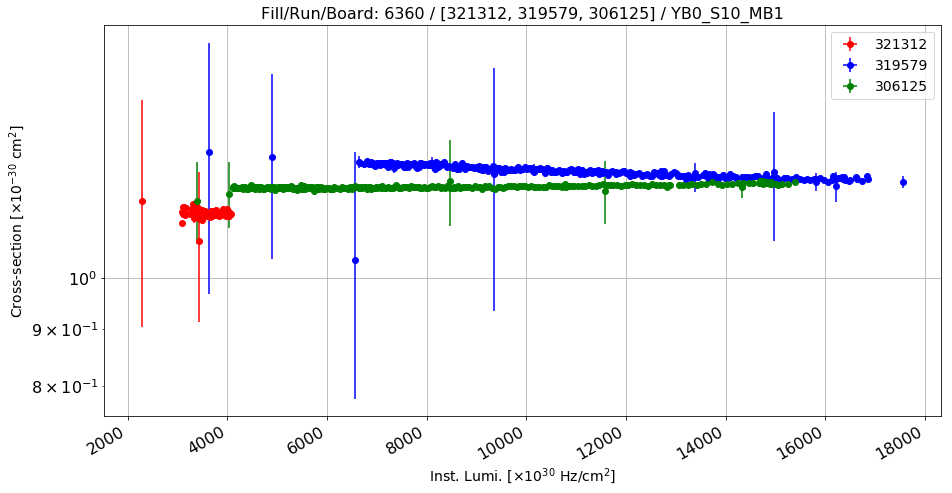

Anomalous CS: 1.14350730799 , Normal CS: 1.23825270299 , Ratio: 0.0765153952553


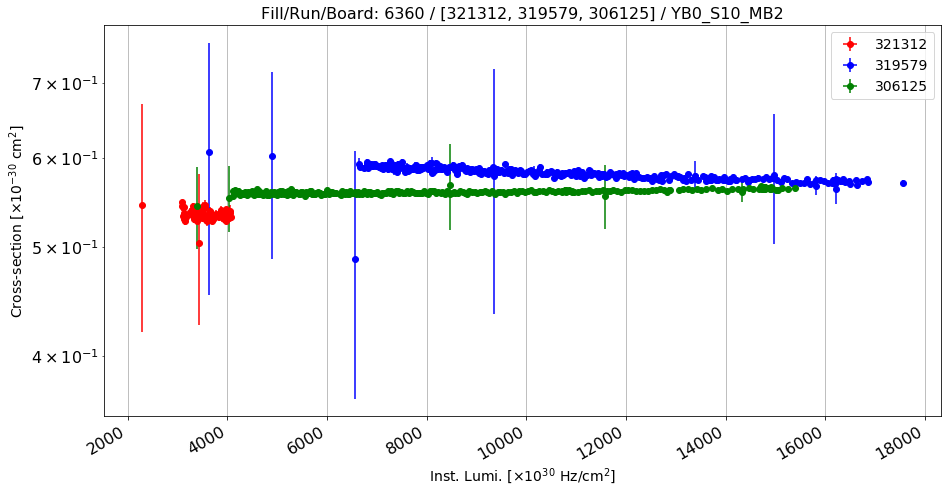

Anomalous CS: 0.534347058711 , Normal CS: 0.577059612818 , Ratio: 0.0740175766224


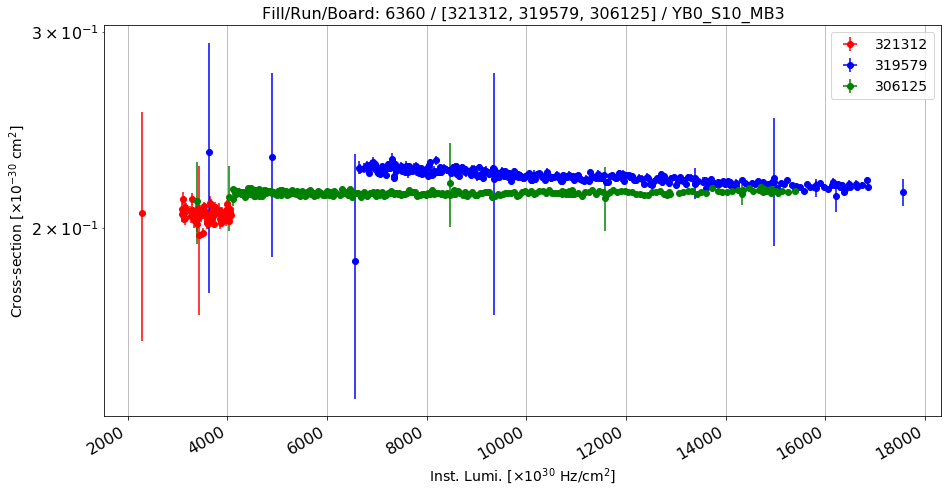

Anomalous CS: 0.205875631287 , Normal CS: 0.22059455297 , Ratio: 0.0667238673174


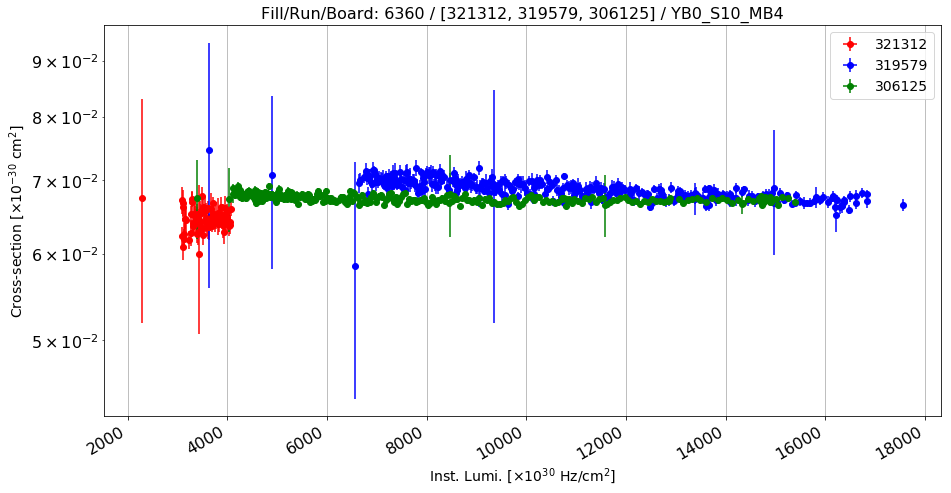

Anomalous CS: 0.0645244346775 , Normal CS: 0.0679748728493 , Ratio: 0.0507604946824


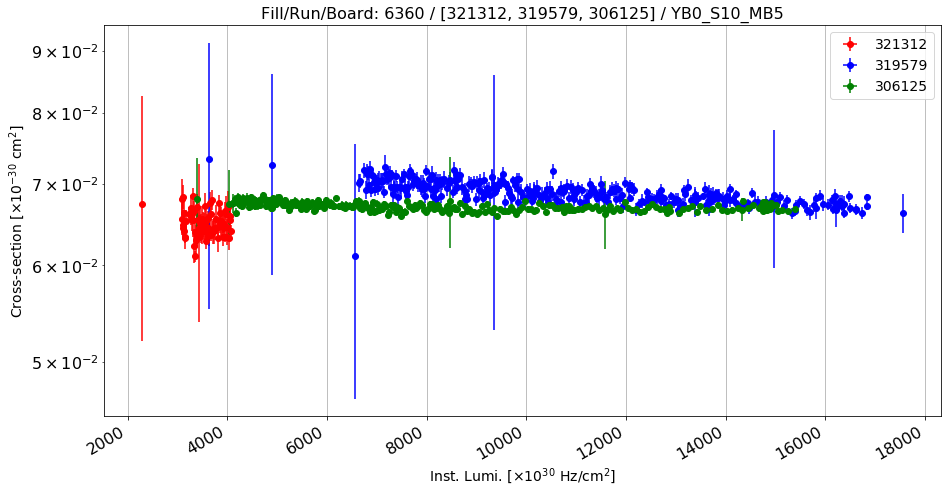

Anomalous CS: 0.0649487473246 , Normal CS: 0.0681448611877 , Ratio: 0.0469017590967


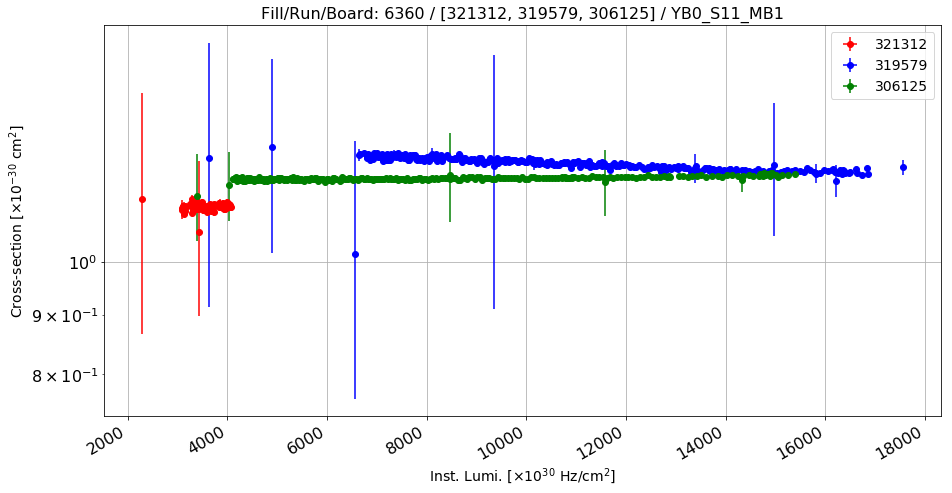

Anomalous CS: 1.11483051561 , Normal CS: 1.20539557172 , Ratio: 0.0751330585851


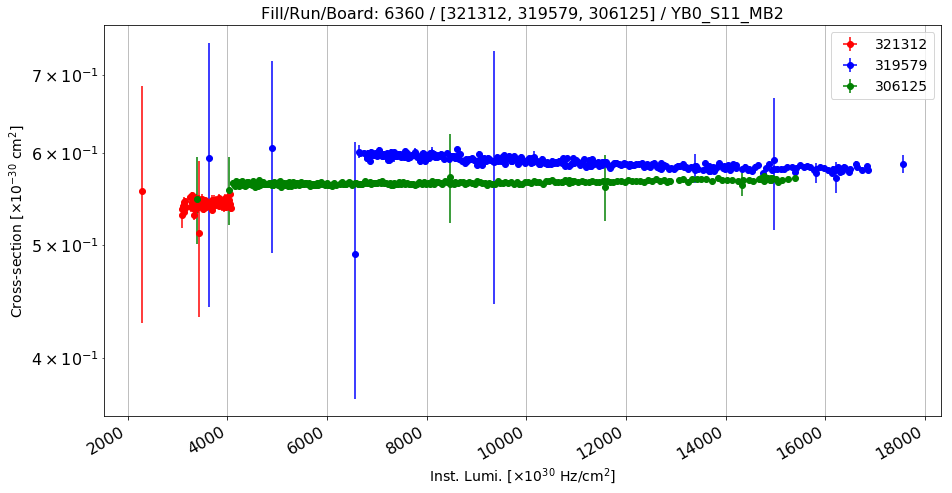

Anomalous CS: 0.541938014054 , Normal CS: 0.584995320341 , Ratio: 0.0736028217495


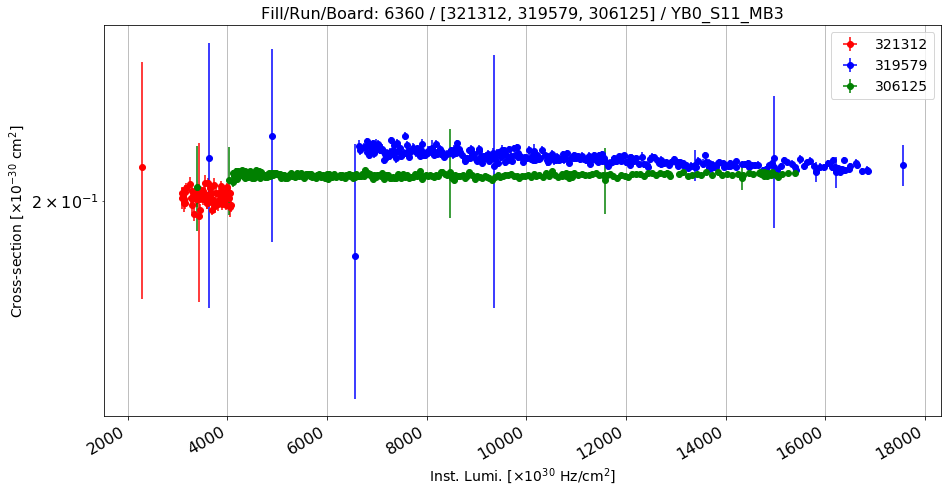

Anomalous CS: 0.201781496017 , Normal CS: 0.21598929308 , Ratio: 0.0657800989118


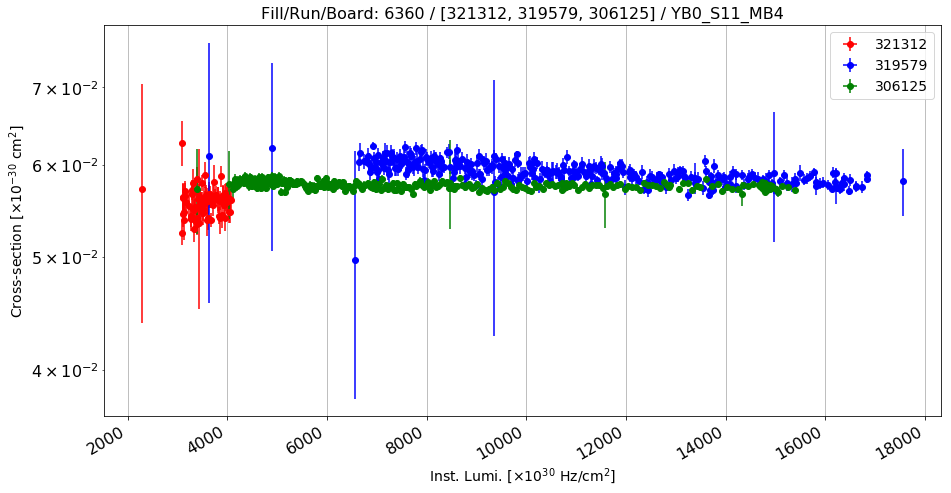

Anomalous CS: 0.0557753823513 , Normal CS: 0.0586171476444 , Ratio: 0.0484801019375


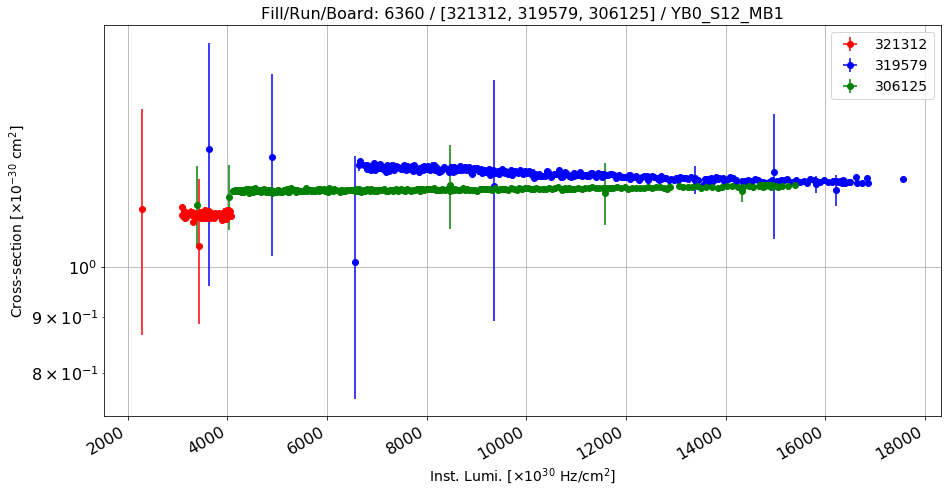

Anomalous CS: 1.11579389903 , Normal CS: 1.20604333591 , Ratio: 0.0748310066402


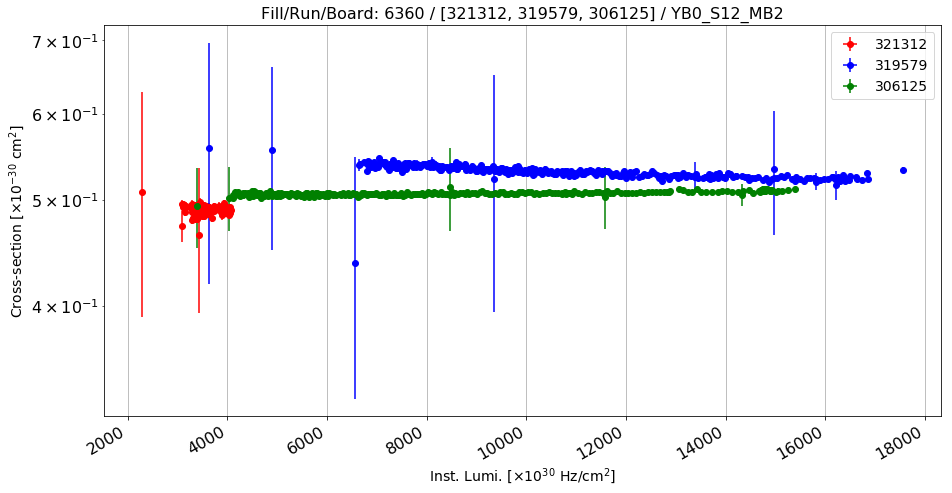

Anomalous CS: 0.489388550017 , Normal CS: 0.527125659858 , Ratio: 0.0715903487807


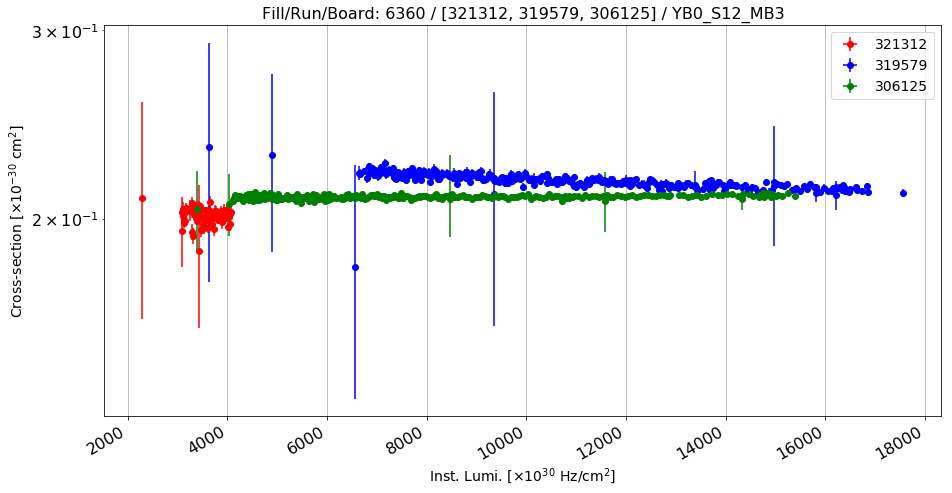

Anomalous CS: 0.20098986102 , Normal CS: 0.215300635773 , Ratio: 0.0664687993237


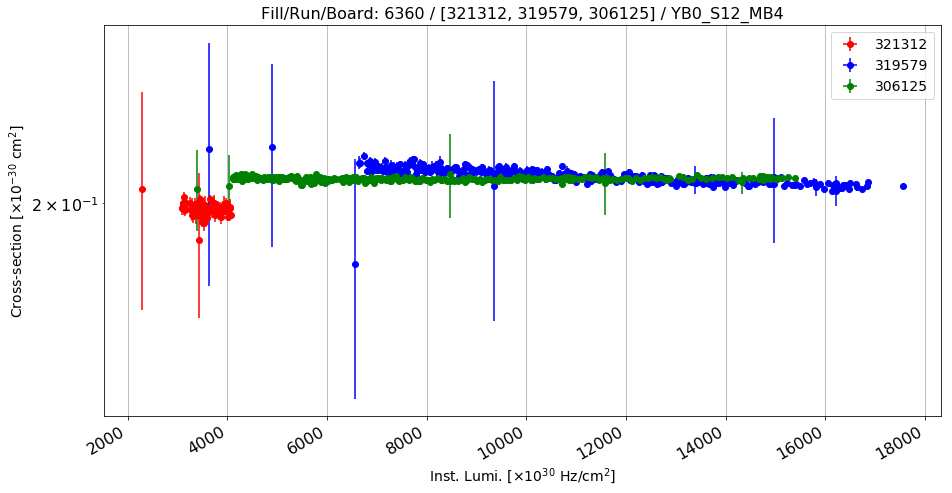

Anomalous CS: 0.197628292951 , Normal CS: 0.210084521789 , Ratio: 0.0592915114931


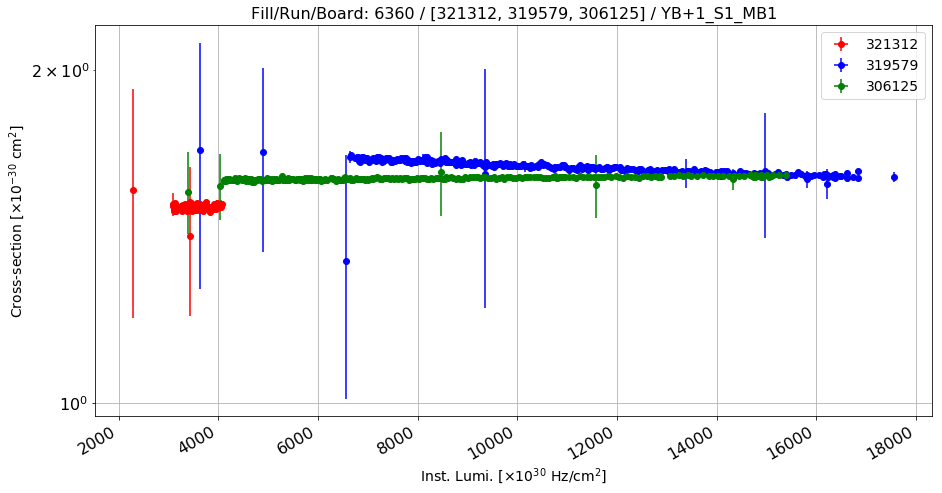

Anomalous CS: 1.50352006887 , Normal CS: 1.62121738613 , Ratio: 0.0725981094597


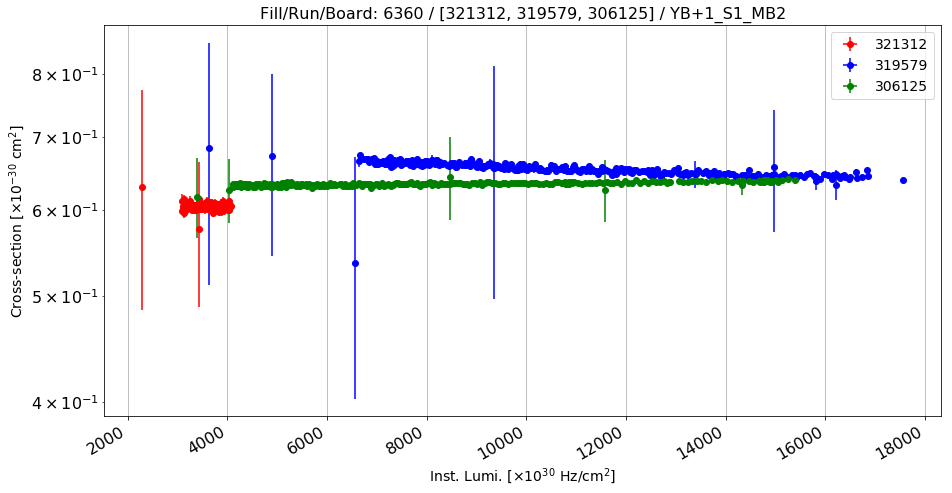

Anomalous CS: 0.603979348599 , Normal CS: 0.64924927836 , Ratio: 0.0697265769412


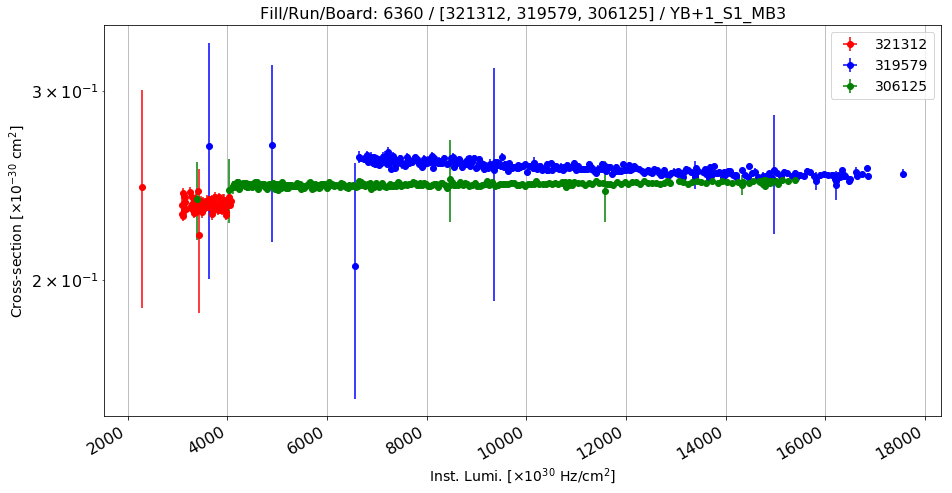

Anomalous CS: 0.23505879255 , Normal CS: 0.252423578262 , Ratio: 0.0687922492471


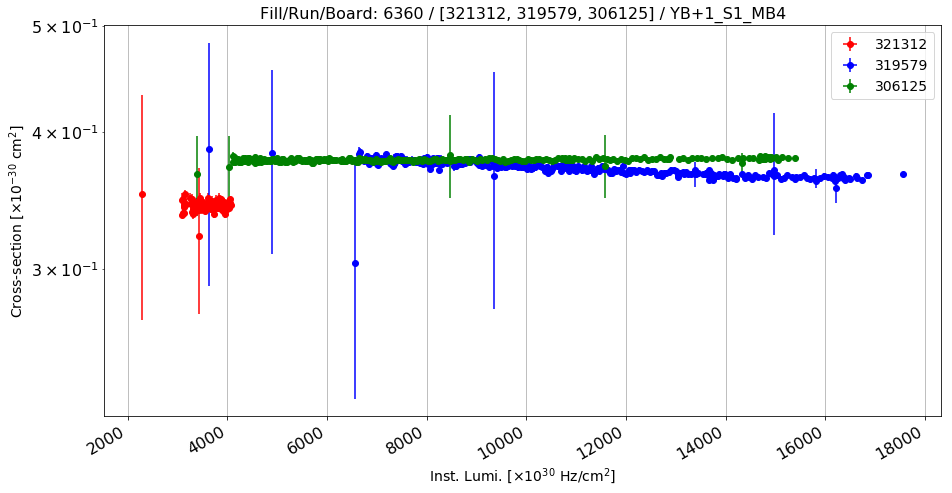

Anomalous CS: 0.342570464387 , Normal CS: 0.367254664771 , Ratio: 0.0672127620209


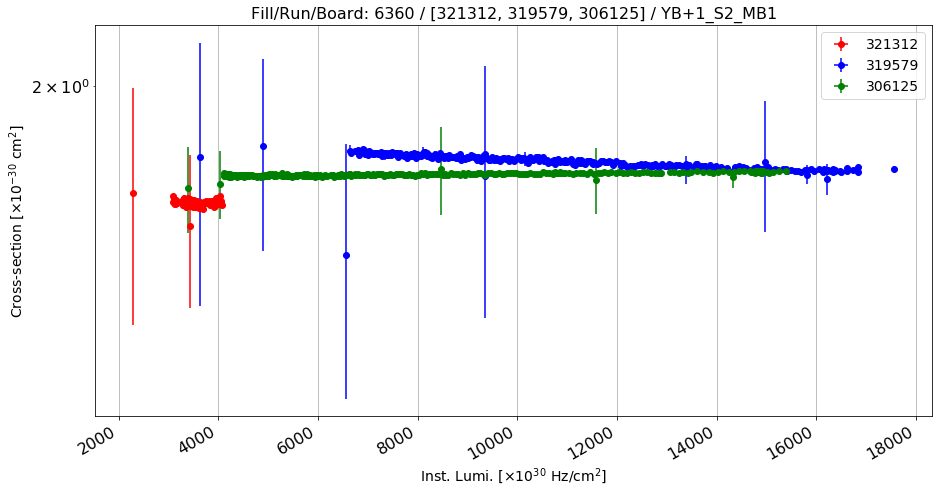

Anomalous CS: 1.58332591923 , Normal CS: 1.70758266283 , Ratio: 0.0727676301145


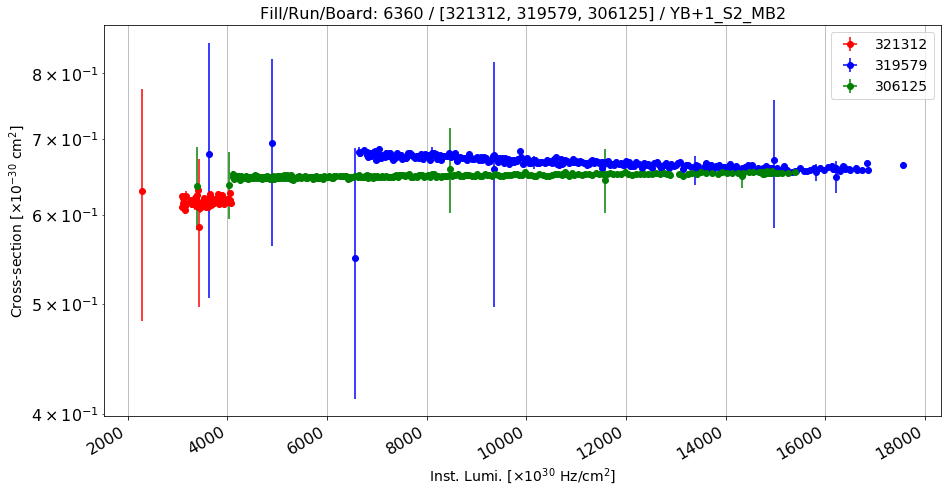

Anomalous CS: 0.61608678388 , Normal CS: 0.663455902173 , Ratio: 0.071397538461


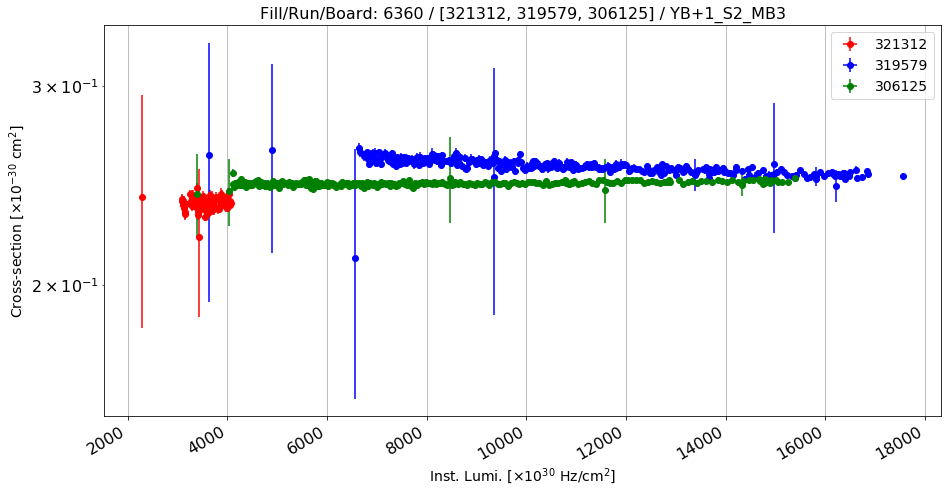

Anomalous CS: 0.236058629968 , Normal CS: 0.252924752659 , Ratio: 0.0666843498439


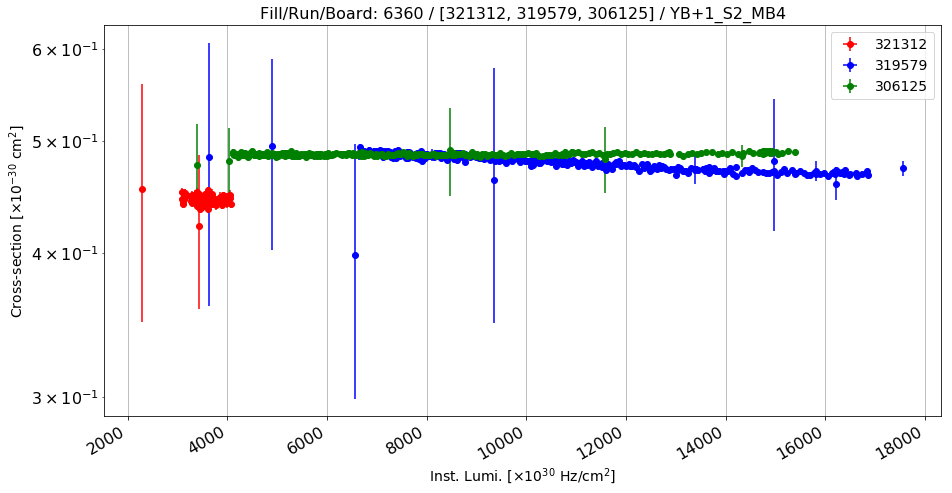

Anomalous CS: 0.444781529739 , Normal CS: 0.473784003774 , Ratio: 0.0612145488316


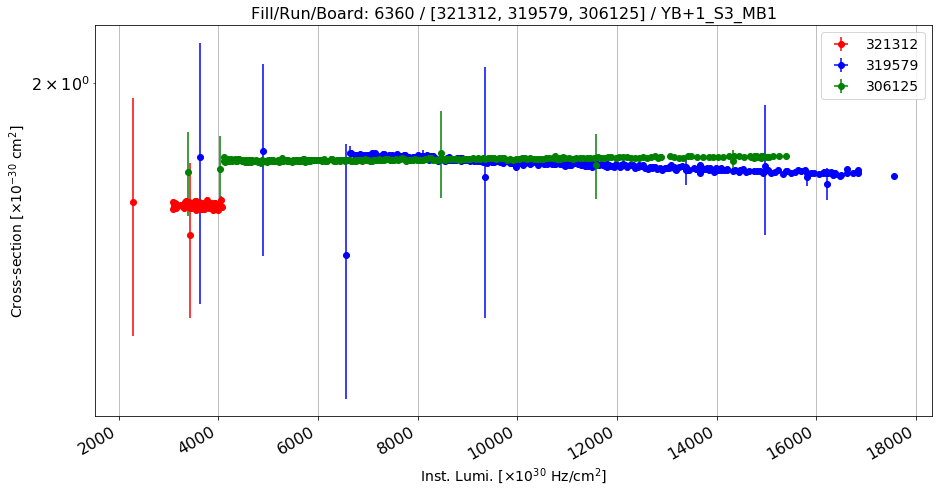

Anomalous CS: 1.56509766665 , Normal CS: 1.68828823094 , Ratio: 0.0729677326658


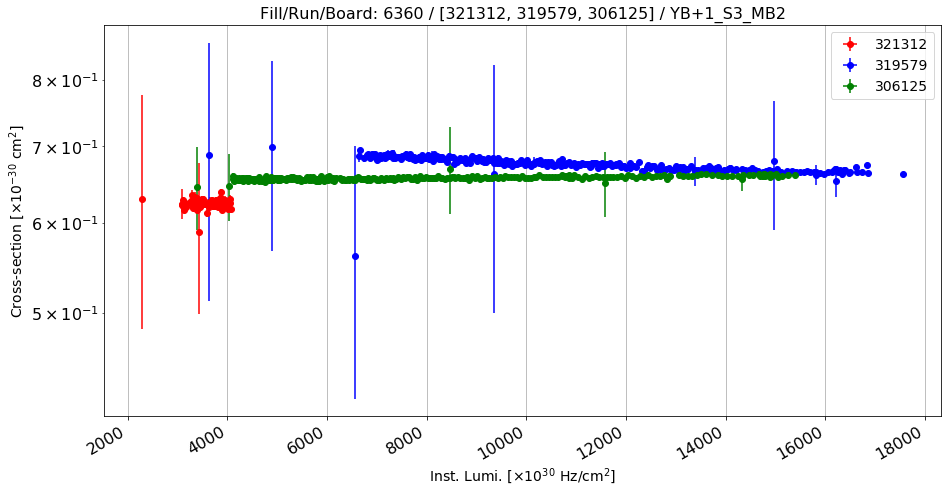

Anomalous CS: 0.623467780701 , Normal CS: 0.670540333708 , Ratio: 0.0702009269838


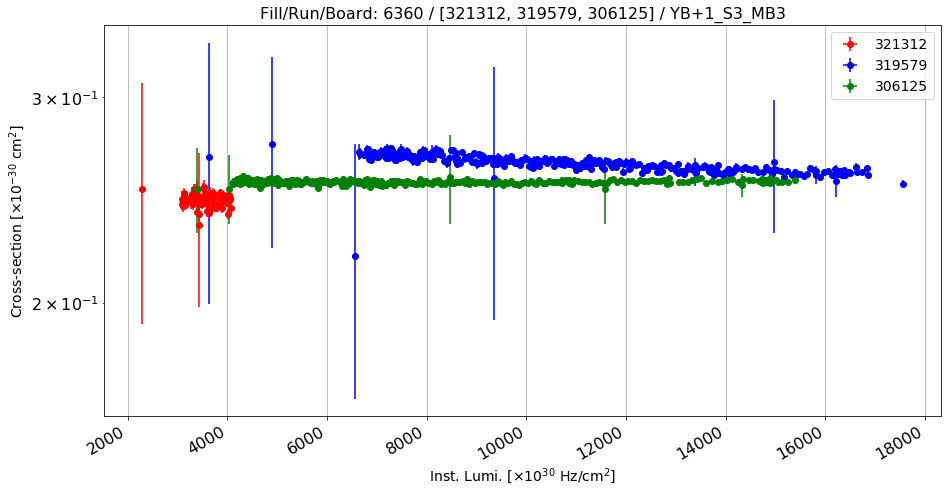

Anomalous CS: 0.245279826802 , Normal CS: 0.261233294914 , Ratio: 0.0610698116286


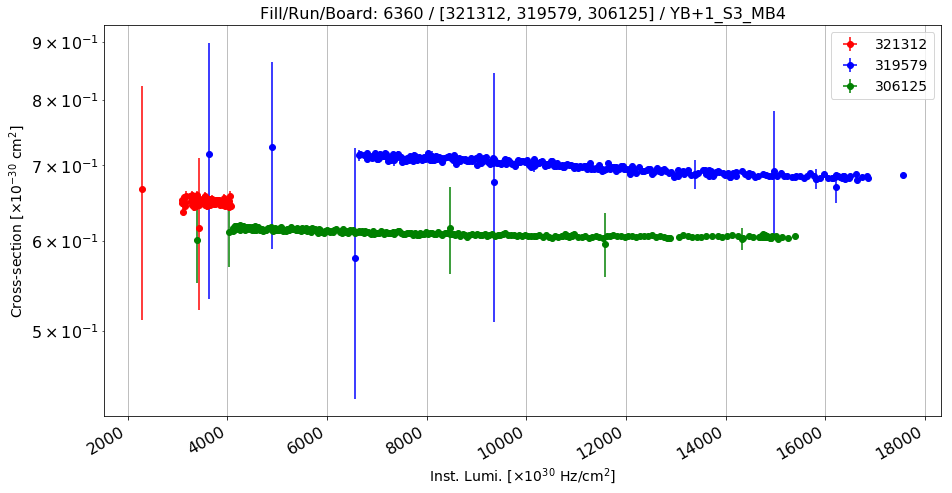

Anomalous CS: 0.649833676978 , Normal CS: 0.691801960232 , Ratio: 0.0606651696097


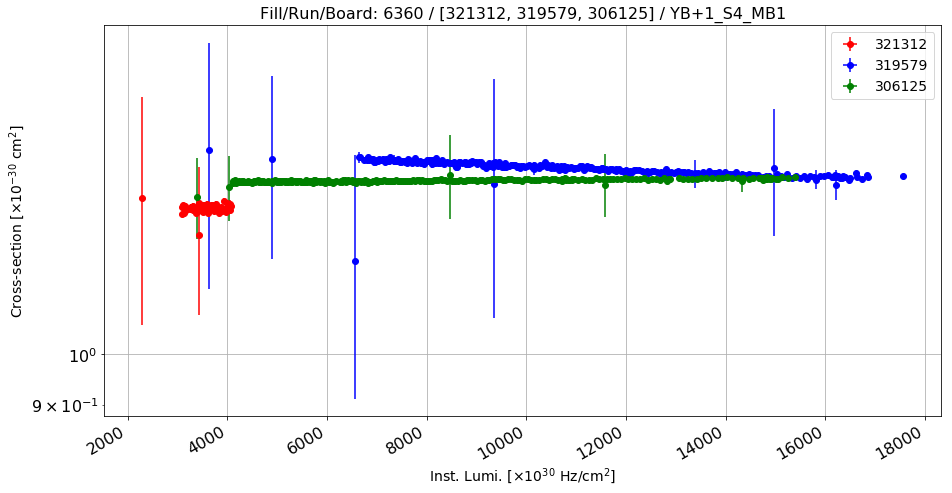

Anomalous CS: 1.35721055395 , Normal CS: 1.46418557514 , Ratio: 0.0730611085149


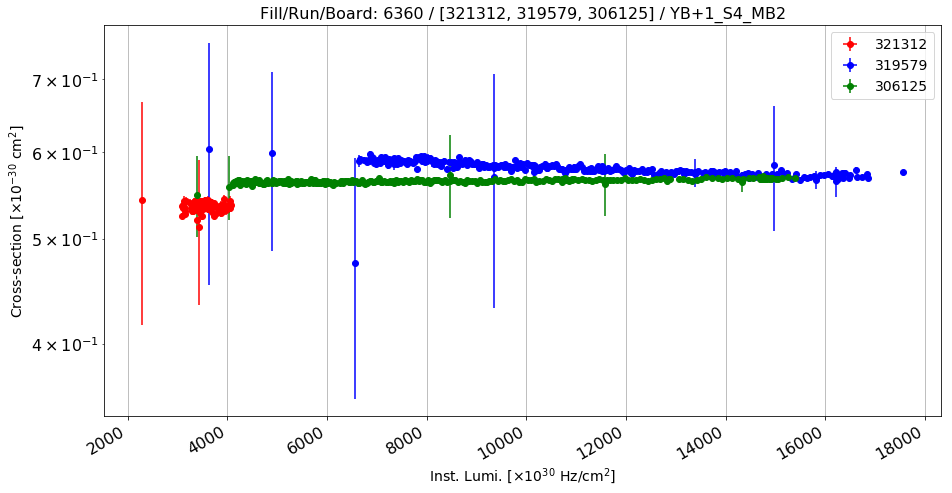

Anomalous CS: 0.53454558354 , Normal CS: 0.575920668633 , Ratio: 0.0718416395625


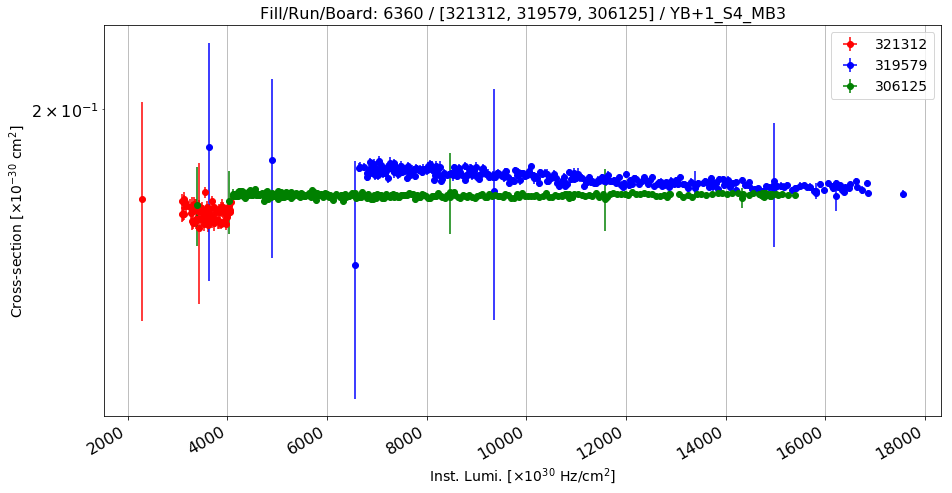

Anomalous CS: 0.160430530116 , Normal CS: 0.170996141612 , Ratio: 0.0617885959101


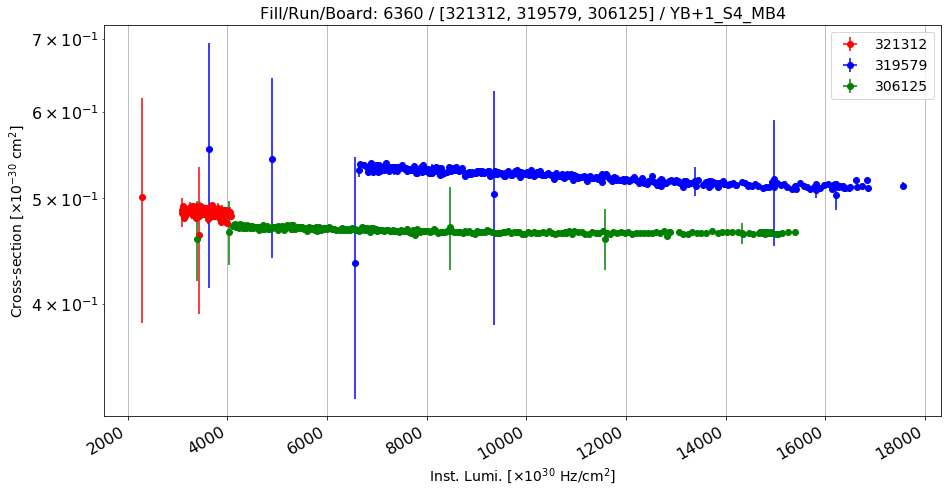

Anomalous CS: 0.485456807083 , Normal CS: 0.518611271586 , Ratio: 0.0639293172342


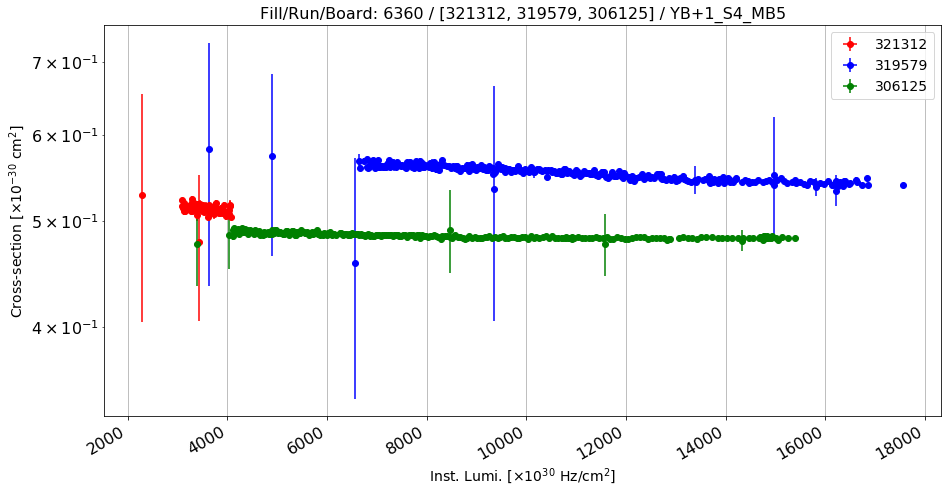

Anomalous CS: 0.512873017889 , Normal CS: 0.547833293792 , Ratio: 0.0638155371336


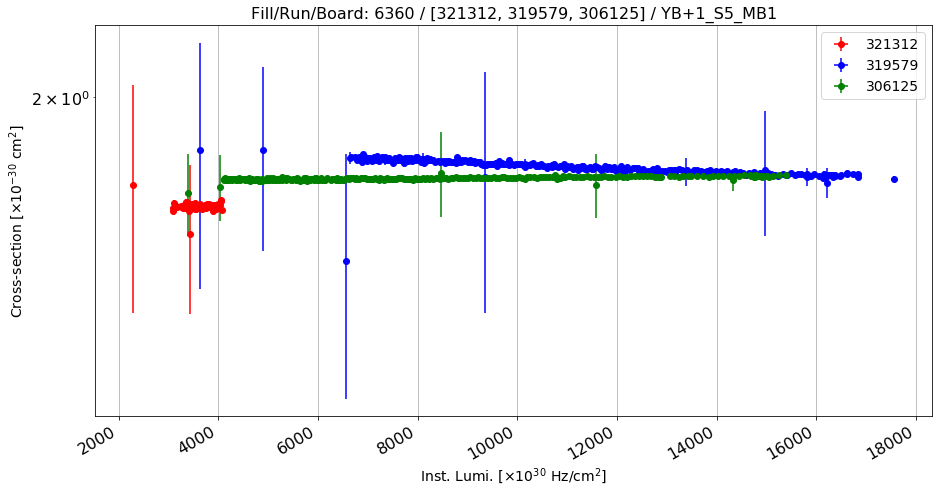

Anomalous CS: 1.59456321699 , Normal CS: 1.71912715619 , Ratio: 0.0724576647847


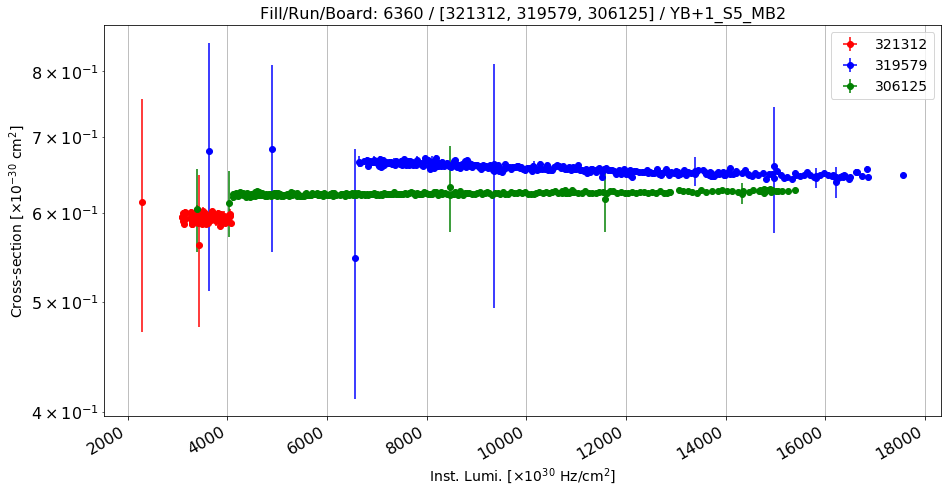

Anomalous CS: 0.593568934707 , Normal CS: 0.651603576406 , Ratio: 0.0890643388112


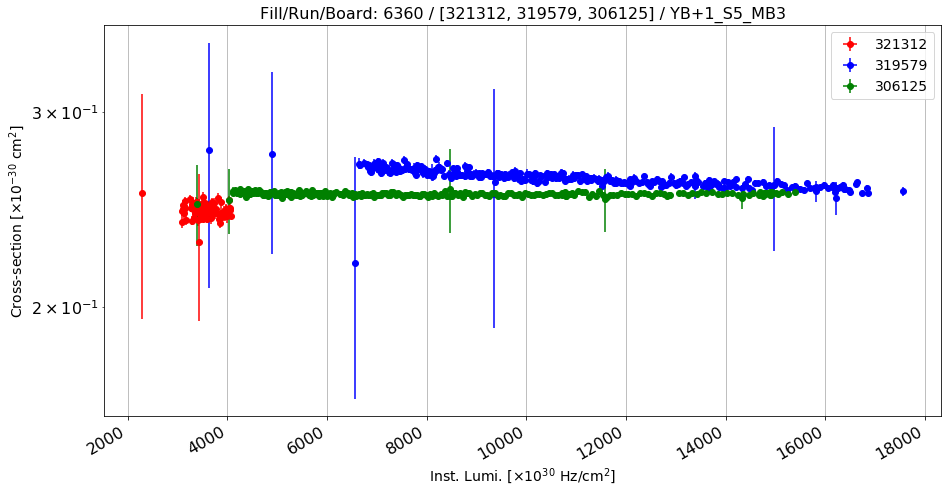

Anomalous CS: 0.244589768912 , Normal CS: 0.259233369607 , Ratio: 0.0564881007316


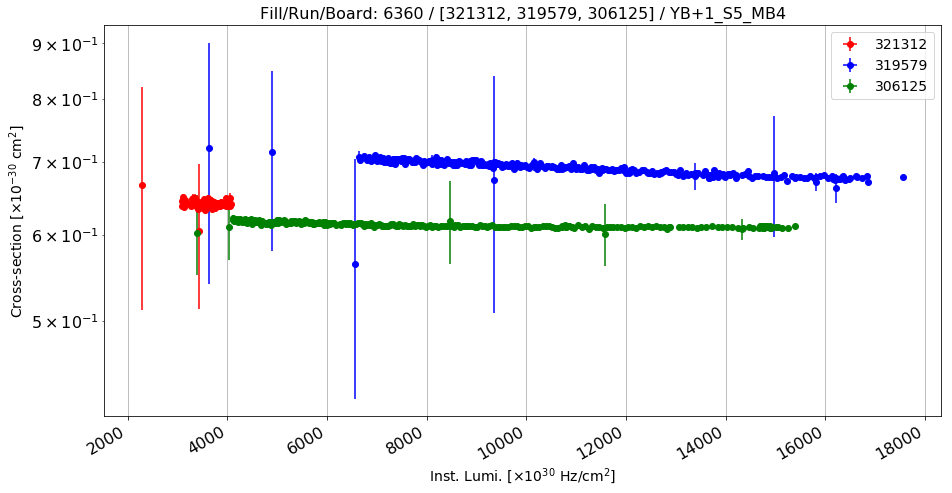

Anomalous CS: 0.641426939463 , Normal CS: 0.68494946321 , Ratio: 0.0635412188564


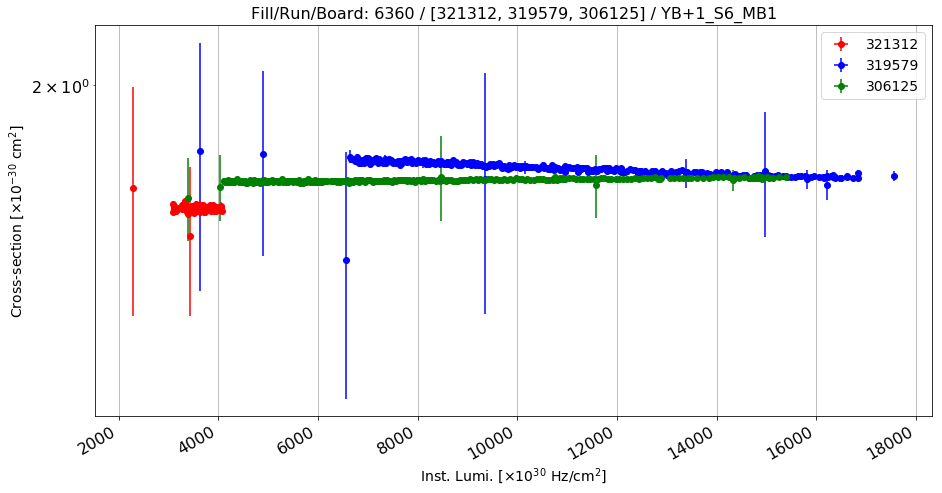

Anomalous CS: 1.54976364298 , Normal CS: 1.67151483031 , Ratio: 0.0728388316506


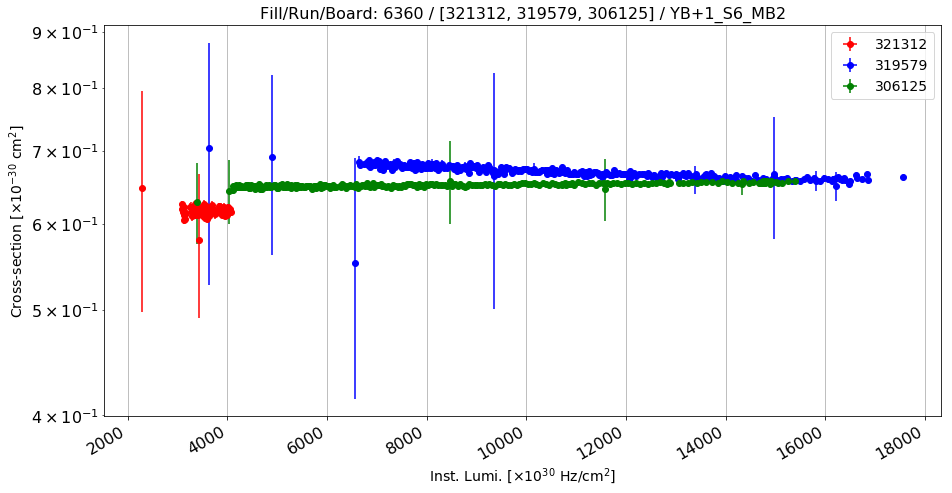

Anomalous CS: 0.616400594938 , Normal CS: 0.664419007886 , Ratio: 0.0722712811921


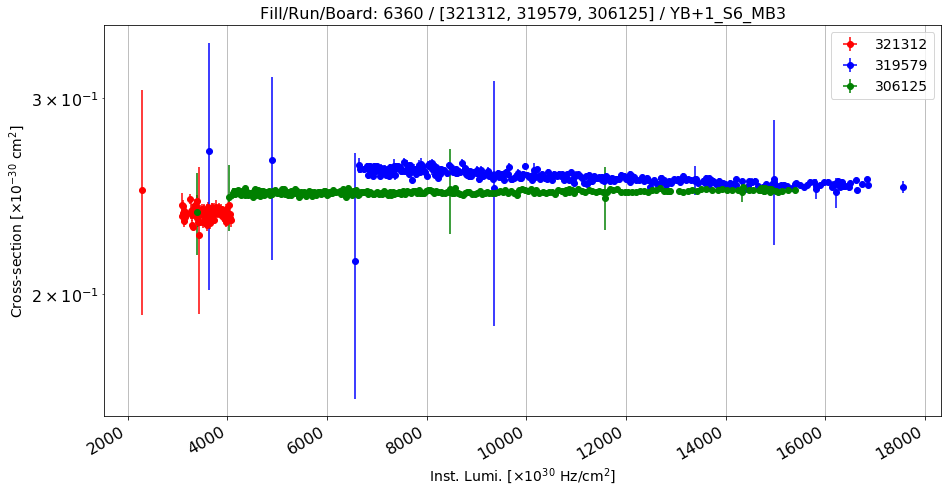

Anomalous CS: 0.23646544328 , Normal CS: 0.2530930461 , Ratio: 0.065697588601


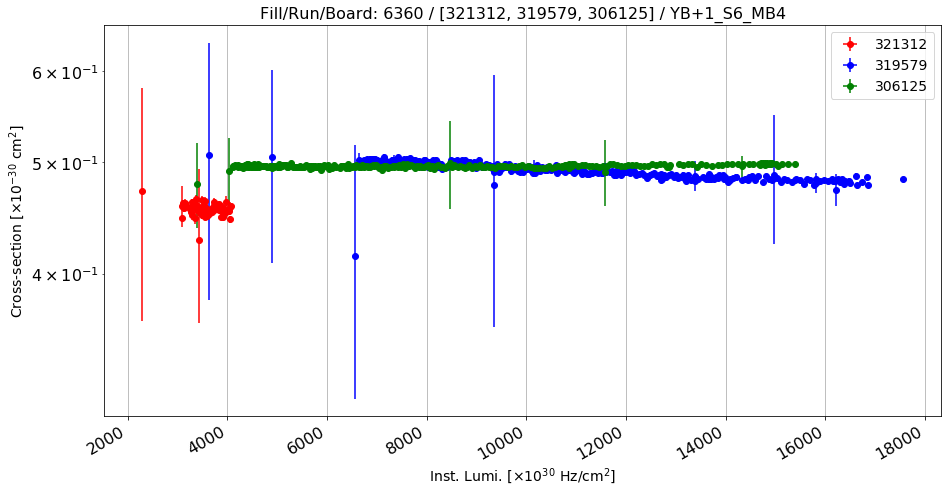

Anomalous CS: 0.455270299903 , Normal CS: 0.487063009757 , Ratio: 0.0652743263549


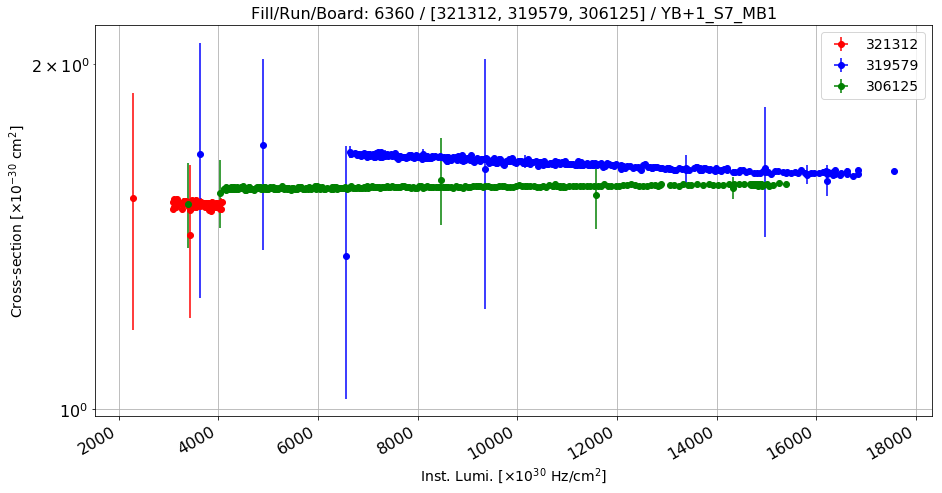

Anomalous CS: 1.50873560111 , Normal CS: 1.62517311436 , Ratio: 0.0716462216961


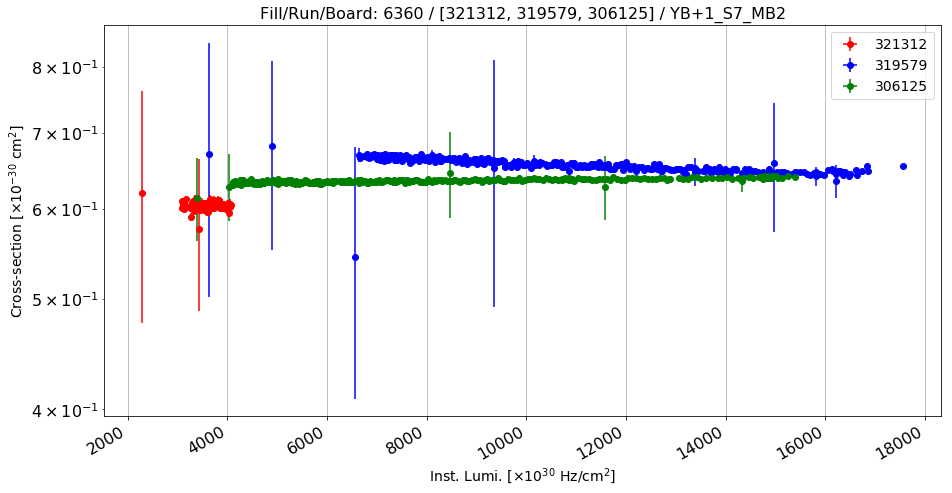

Anomalous CS: 0.604372271752 , Normal CS: 0.651349275067 , Ratio: 0.0721226001356


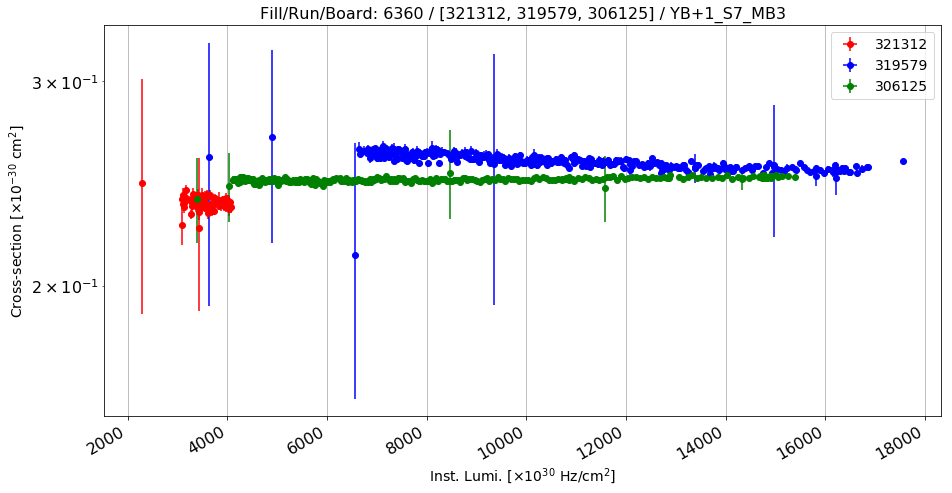

Anomalous CS: 0.23582948432 , Normal CS: 0.253932421252 , Ratio: 0.0712903726251


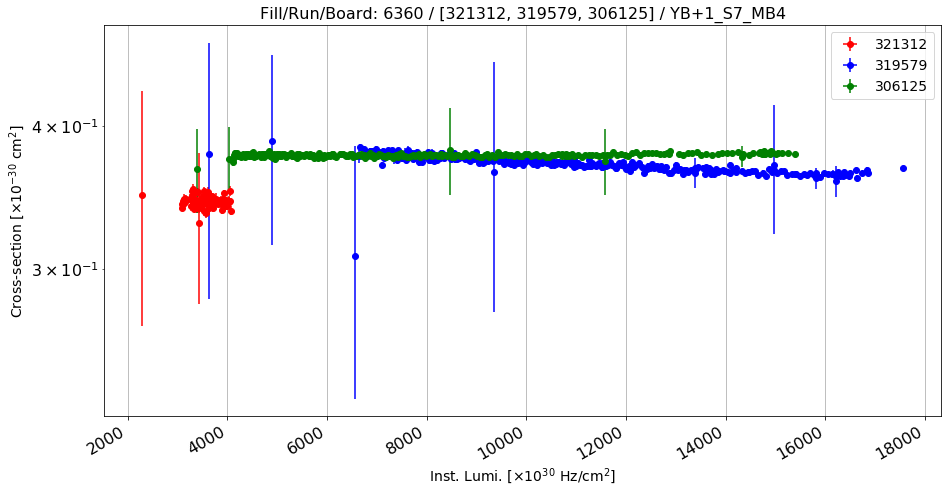

Anomalous CS: 0.343240386719 , Normal CS: 0.367106233224 , Ratio: 0.065010736253


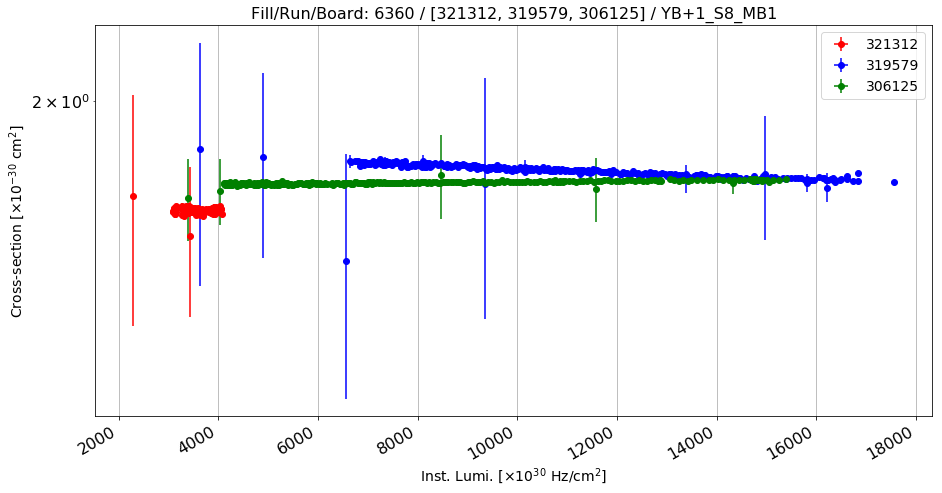

Anomalous CS: 1.59166891348 , Normal CS: 1.71650086538 , Ratio: 0.0727246658726


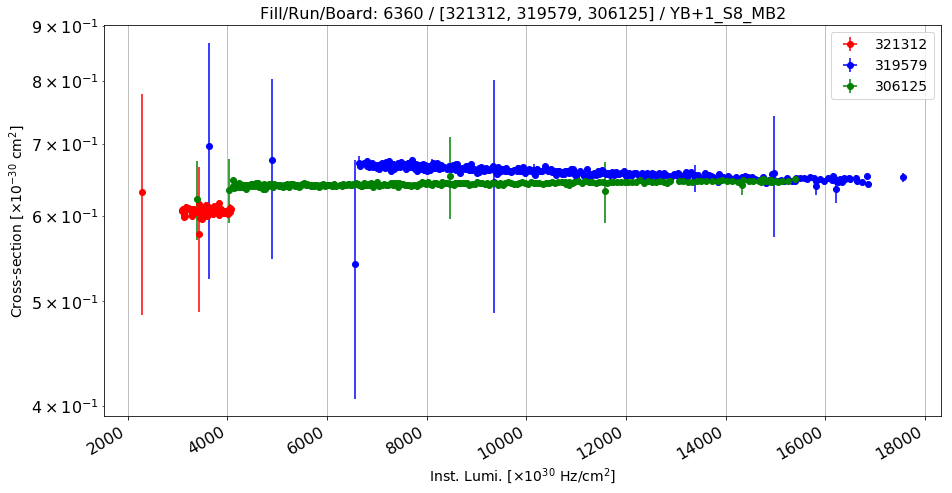

Anomalous CS: 0.606172535421 , Normal CS: 0.653979792923 , Ratio: 0.0731020407956


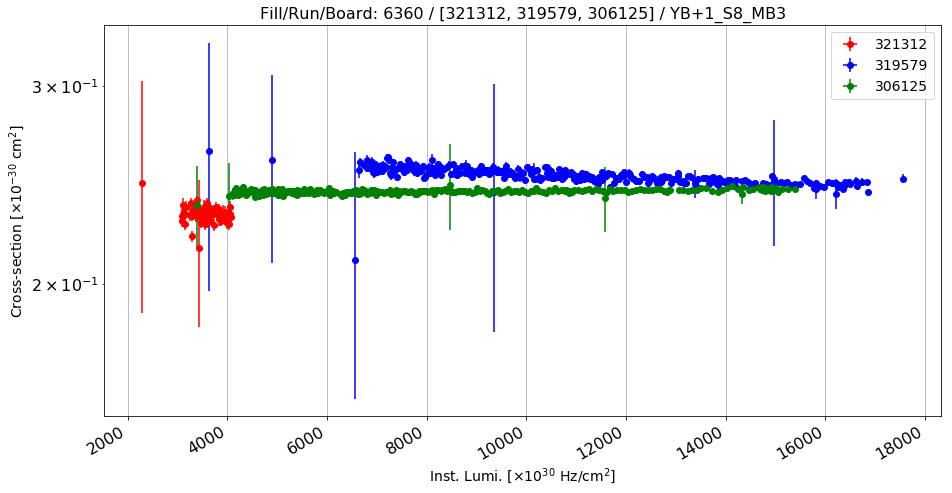

Anomalous CS: 0.230621449958 , Normal CS: 0.247733148363 , Ratio: 0.0690731075706


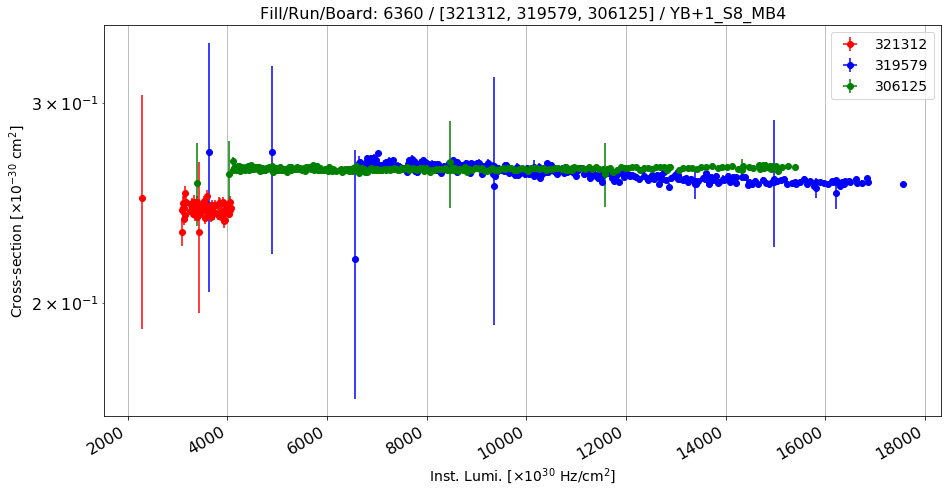

Anomalous CS: 0.241742711638 , Normal CS: 0.257844019947 , Ratio: 0.0624459249138


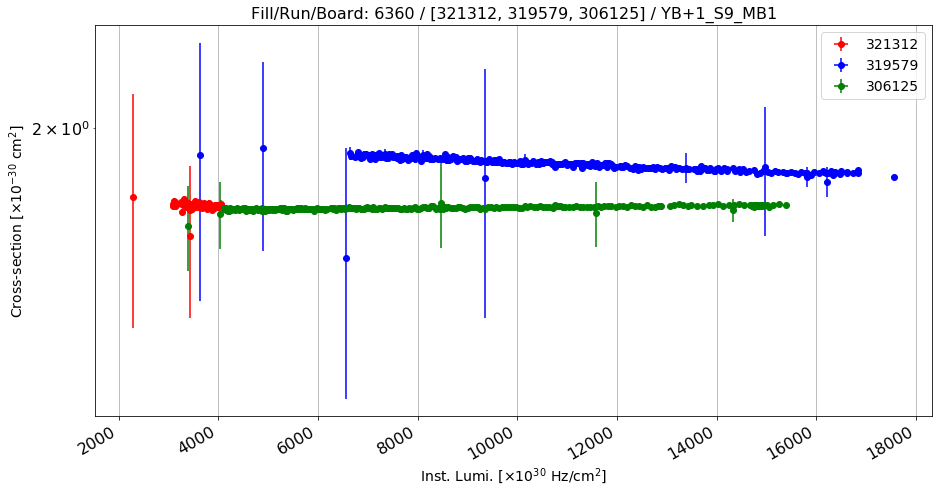

Anomalous CS: 1.7090346373 , Normal CS: 1.84417385379 , Ratio: 0.0732790003576


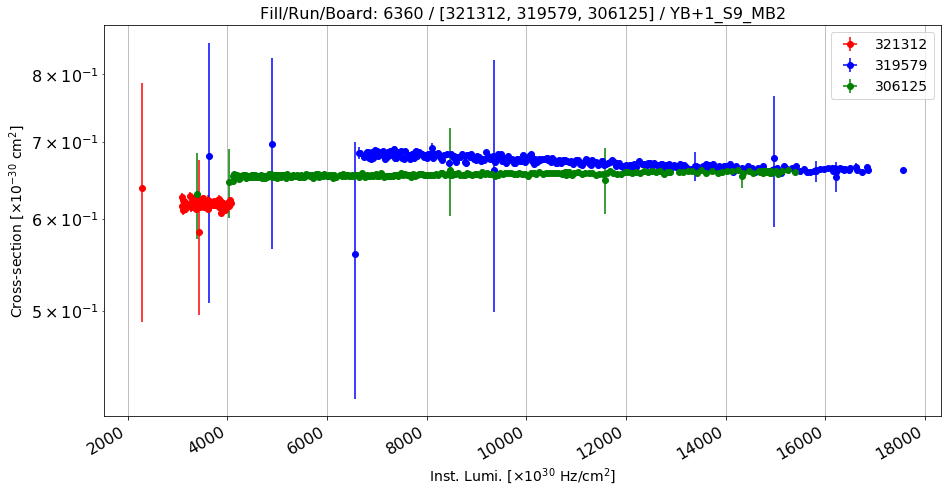

Anomalous CS: 0.618454225274 , Normal CS: 0.667818447637 , Ratio: 0.0739186264432


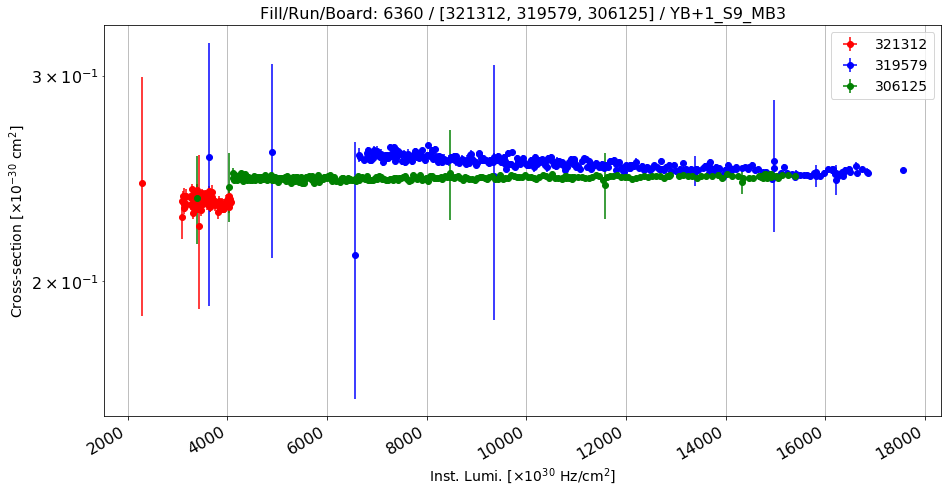

Anomalous CS: 0.233990296176 , Normal CS: 0.250233626653 , Ratio: 0.0649126605964


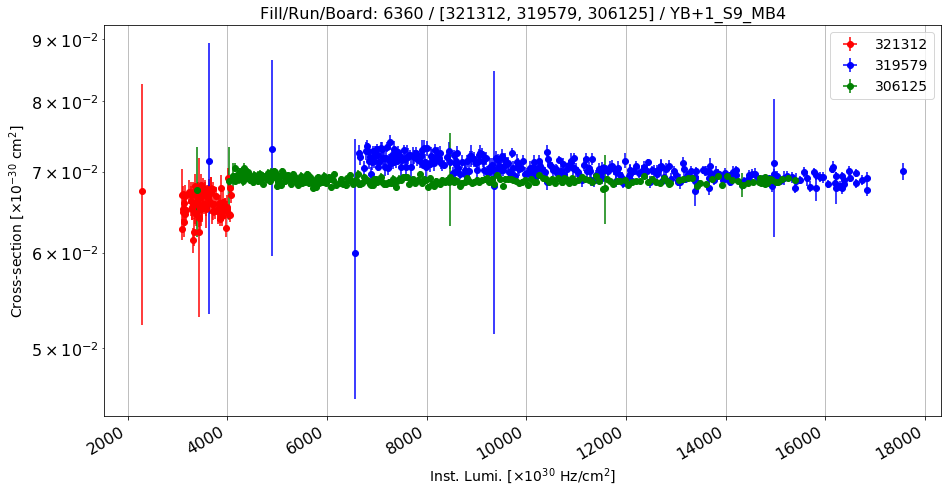

Anomalous CS: 0.0658529754164 , Normal CS: 0.0696995233064 , Ratio: 0.0551875781568


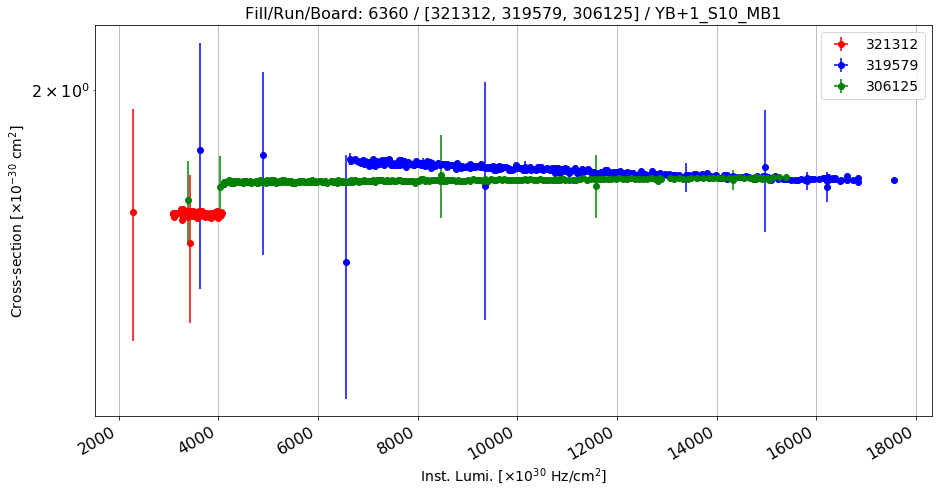

Anomalous CS: 1.54043968329 , Normal CS: 1.67597872252 , Ratio: 0.0808715751626


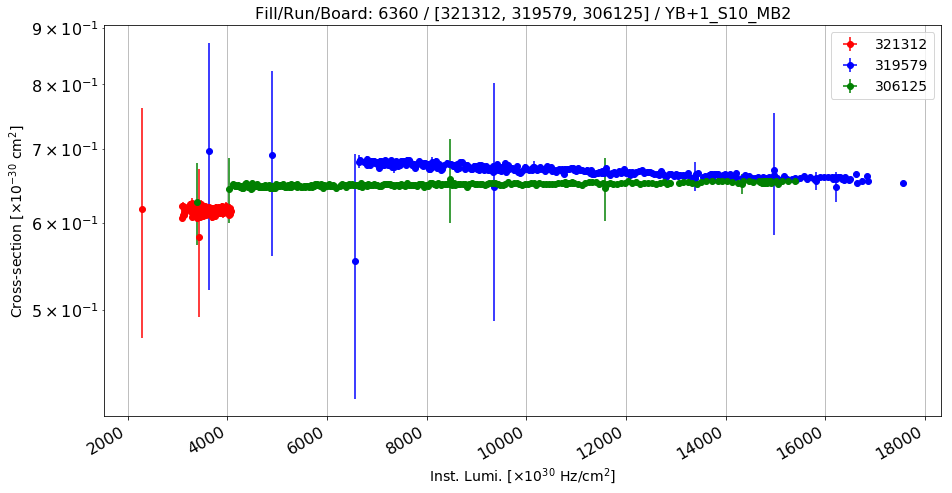

Anomalous CS: 0.614415098624 , Normal CS: 0.663683700707 , Ratio: 0.0742350641278


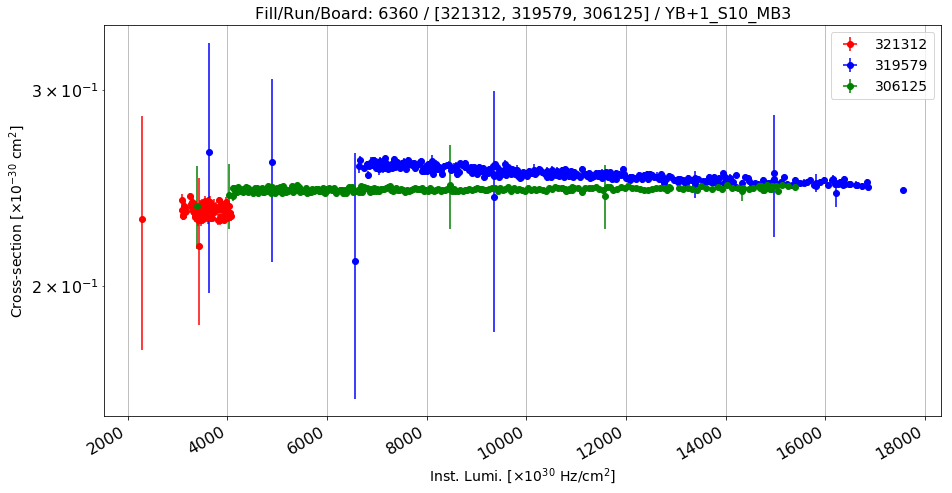

Anomalous CS: 0.23363045061 , Normal CS: 0.249988469571 , Ratio: 0.06543509382


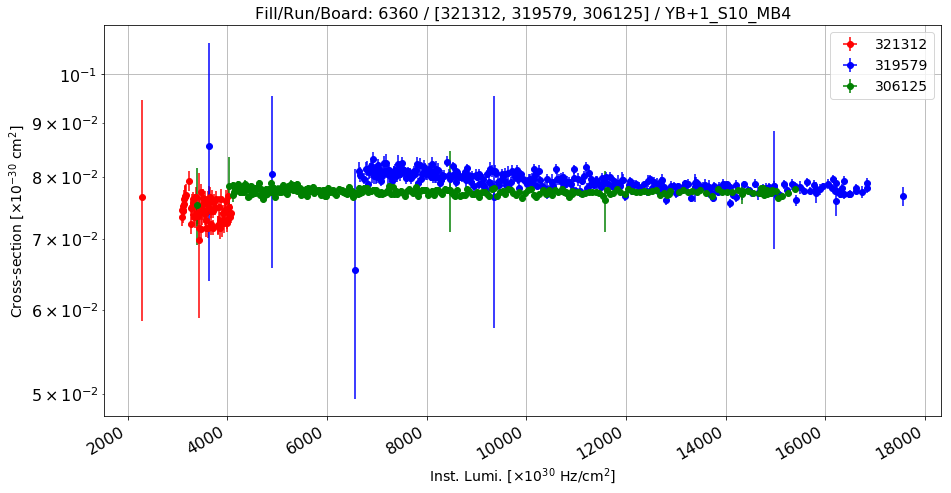

Anomalous CS: 0.0744740188322 , Normal CS: 0.0784904675663 , Ratio: 0.0511711658579


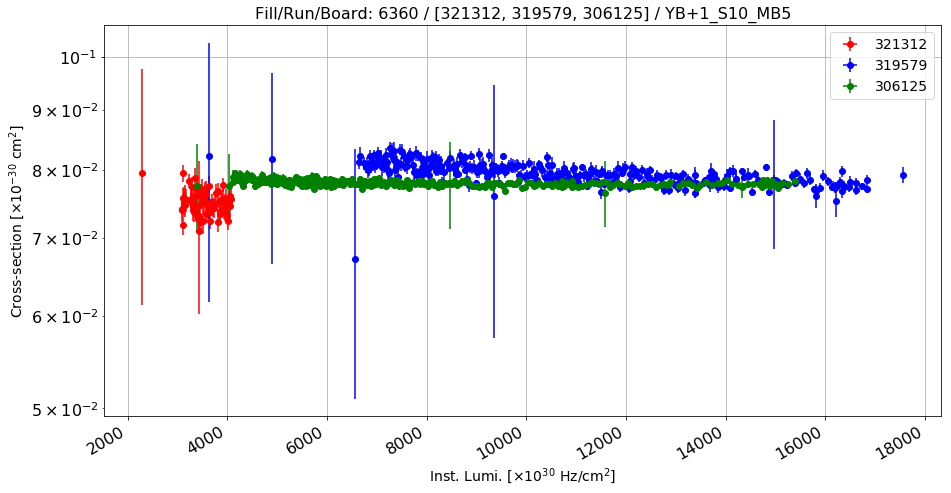

Anomalous CS: 0.0749274226751 , Normal CS: 0.0786174161055 , Ratio: 0.0469360812559


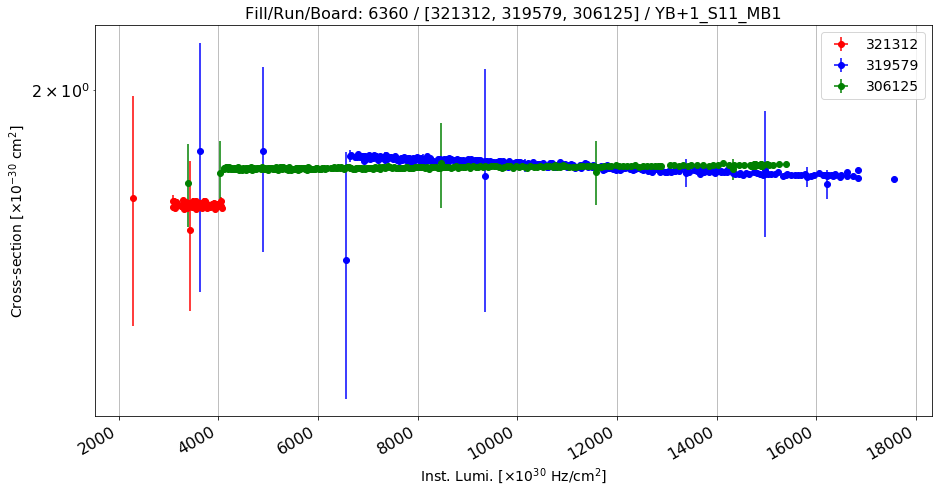

Anomalous CS: 1.57689915495 , Normal CS: 1.69545033699 , Ratio: 0.0699231227576


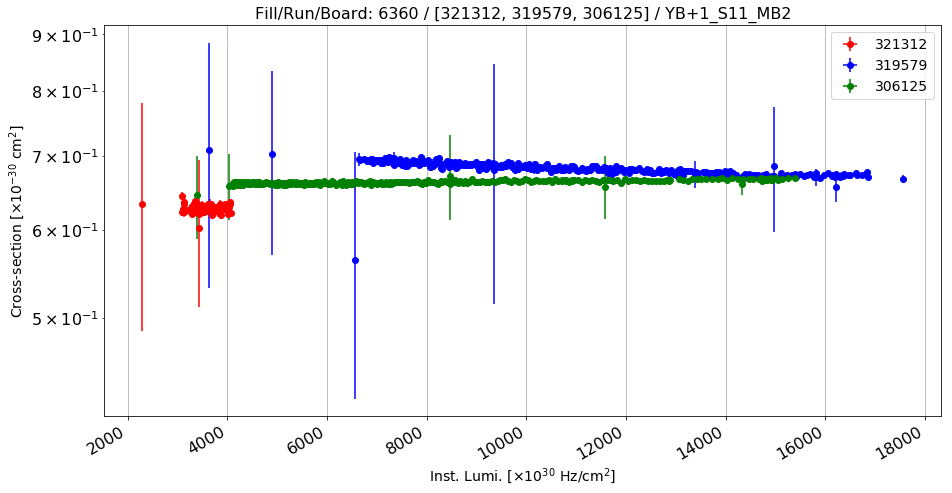

Anomalous CS: 0.627484486117 , Normal CS: 0.676981391081 , Ratio: 0.0731141293045


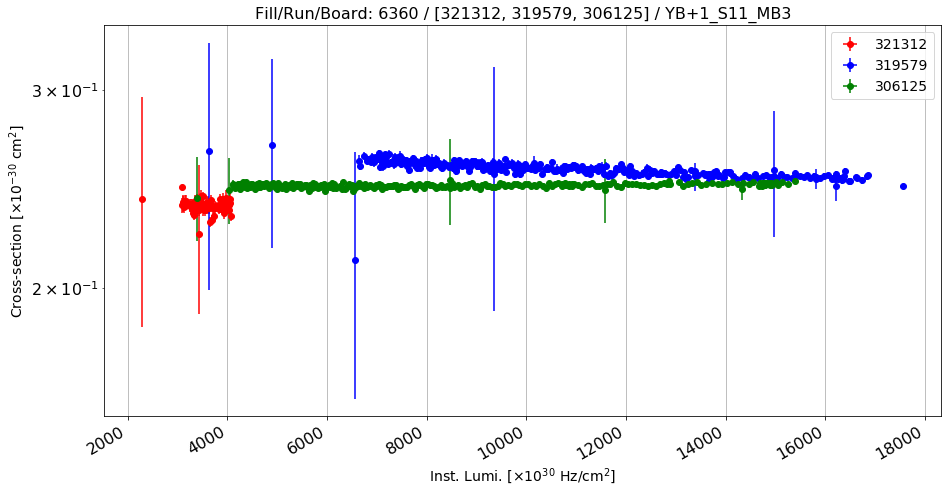

Anomalous CS: 0.236644316688 , Normal CS: 0.25316172952 , Ratio: 0.0652445093608


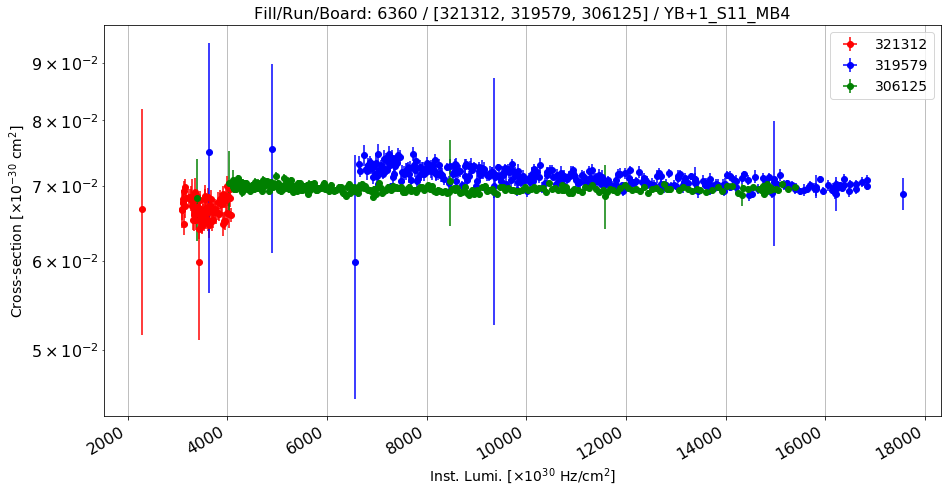

Anomalous CS: 0.0667903033891 , Normal CS: 0.0705832889227 , Ratio: 0.0537377273216


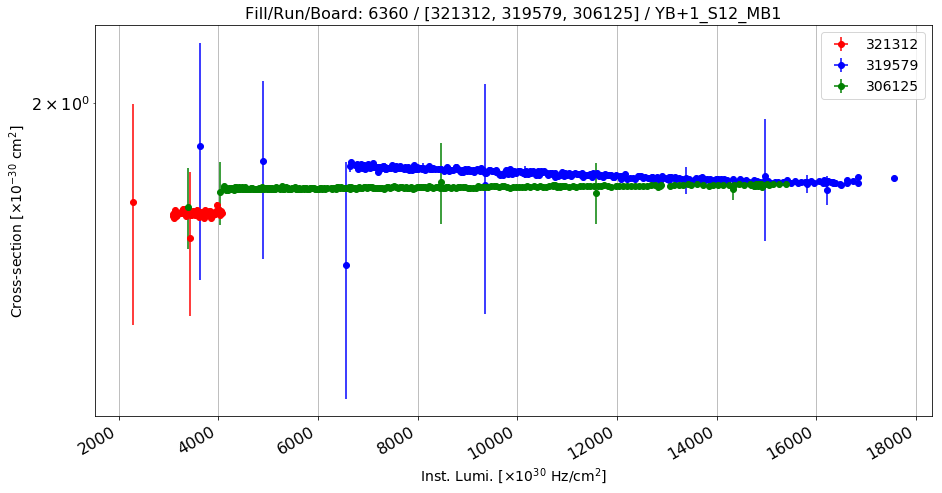

Anomalous CS: 1.57744308401 , Normal CS: 1.70197550014 , Ratio: 0.0731693353525


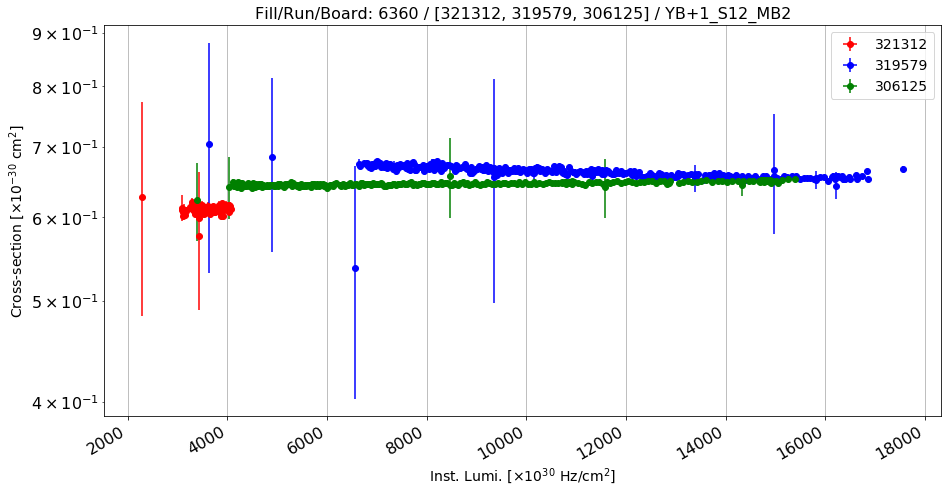

Anomalous CS: 0.610872058942 , Normal CS: 0.659435088517 , Ratio: 0.0736433811627


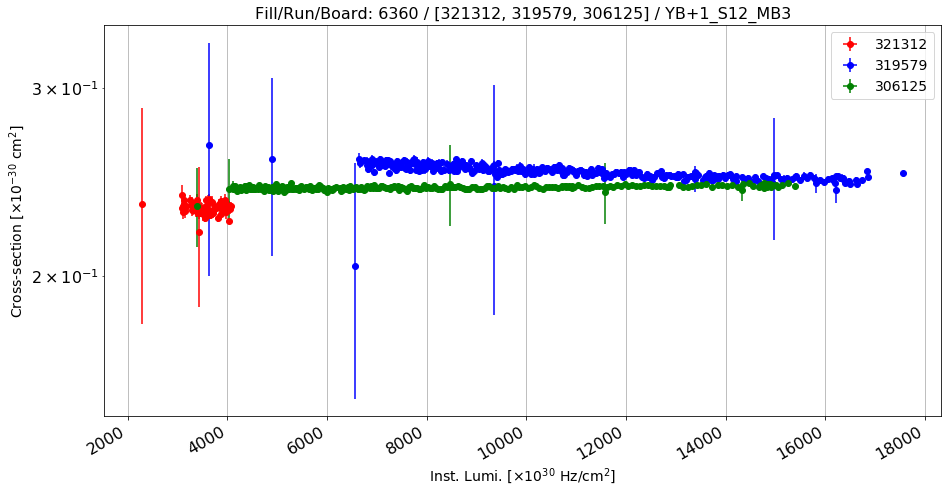

Anomalous CS: 0.231383217485 , Normal CS: 0.248445830024 , Ratio: 0.068677395544


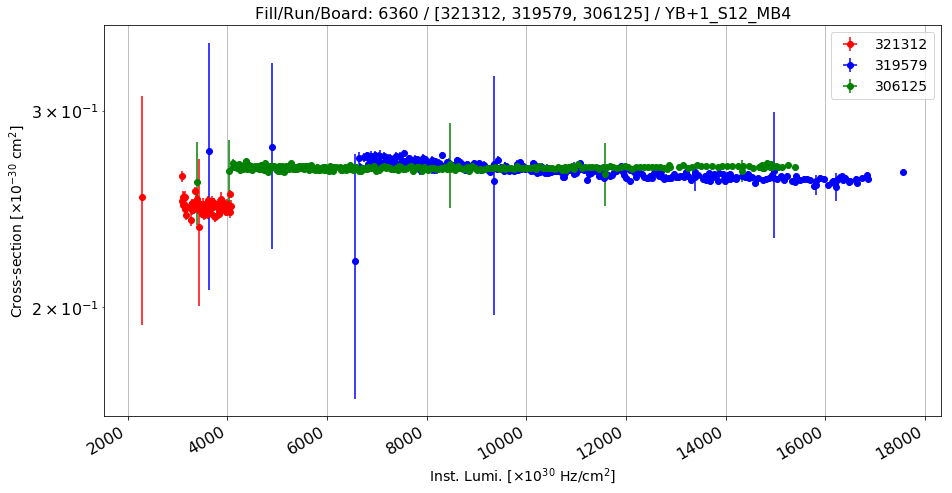

Anomalous CS: 0.246391289429 , Normal CS: 0.262693686348 , Ratio: 0.0620585791214


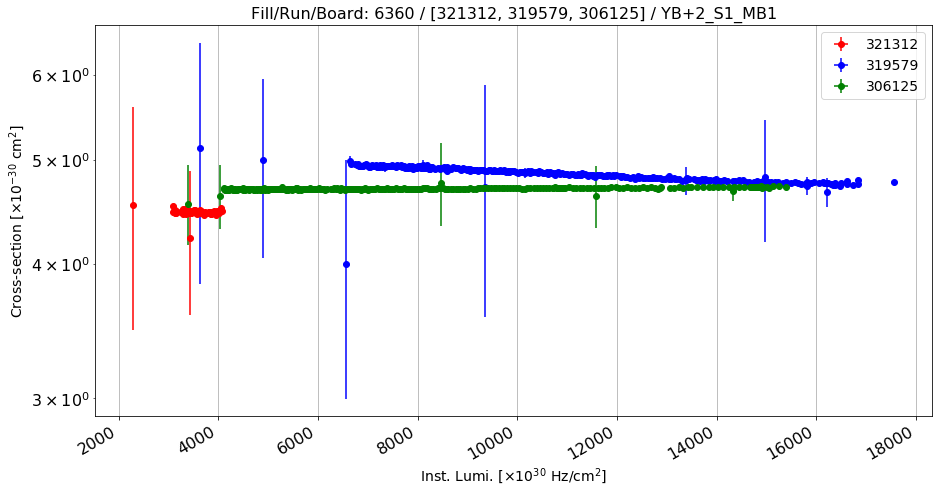

Anomalous CS: 4.47063264993 , Normal CS: 4.80833070413 , Ratio: 0.0702318694326


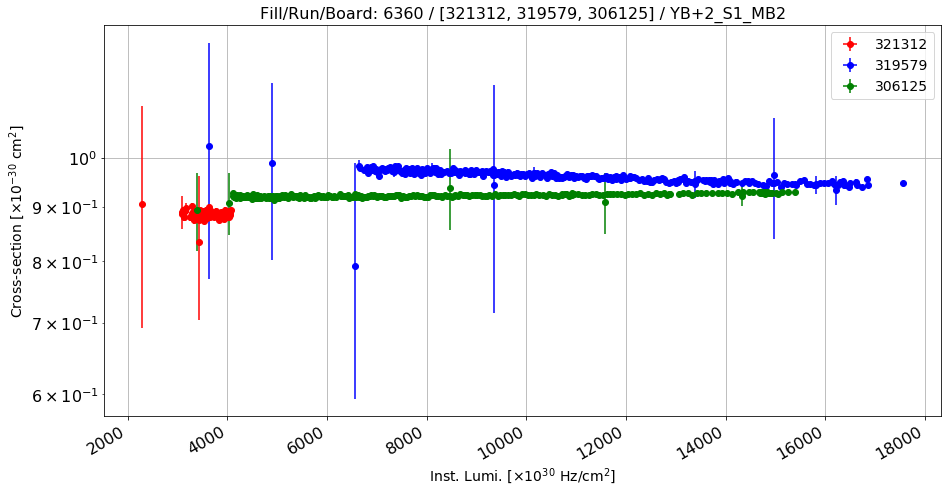

Anomalous CS: 0.885510599398 , Normal CS: 0.954214828037 , Ratio: 0.0720007975356


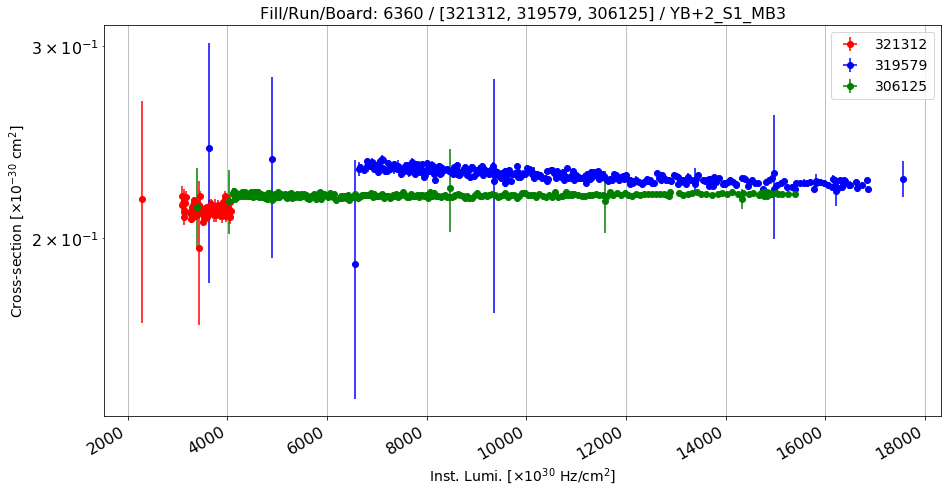

Anomalous CS: 0.212444819743 , Normal CS: 0.226484958933 , Ratio: 0.0619914861255


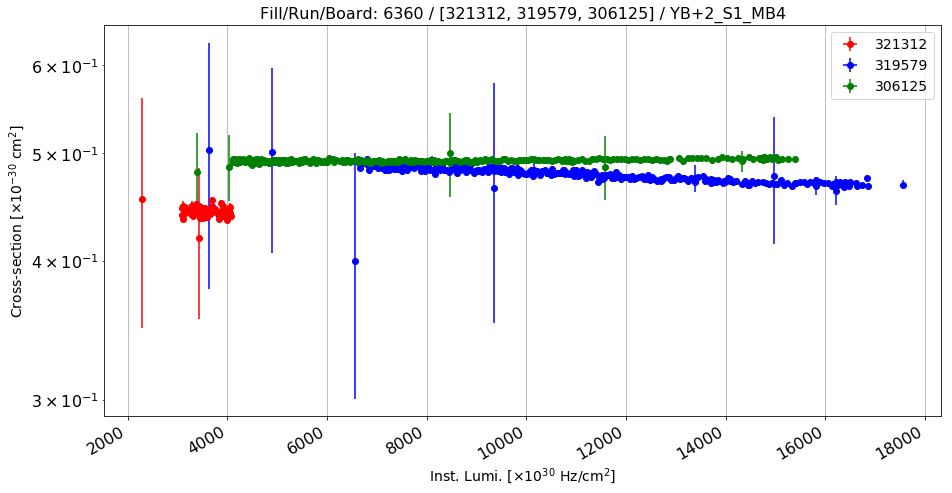

Anomalous CS: 0.443193439134 , Normal CS: 0.474752826519 , Ratio: 0.0664754070379


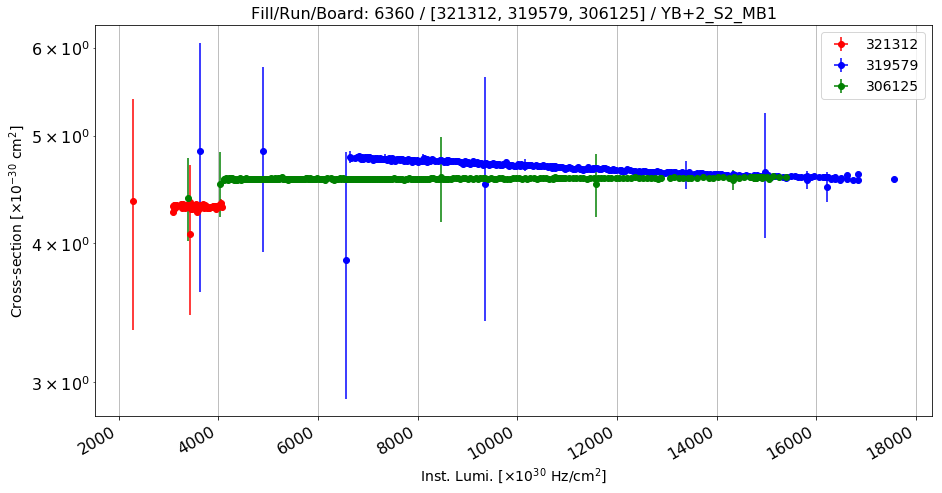

Anomalous CS: 4.31700371254 , Normal CS: 4.63968800786 , Ratio: 0.0695487055966


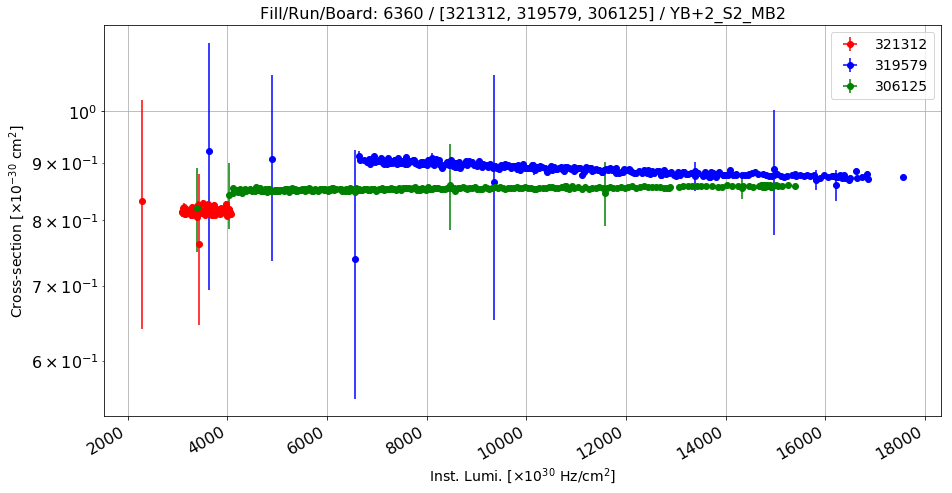

Anomalous CS: 0.815328277899 , Normal CS: 0.882548864024 , Ratio: 0.0761664185002


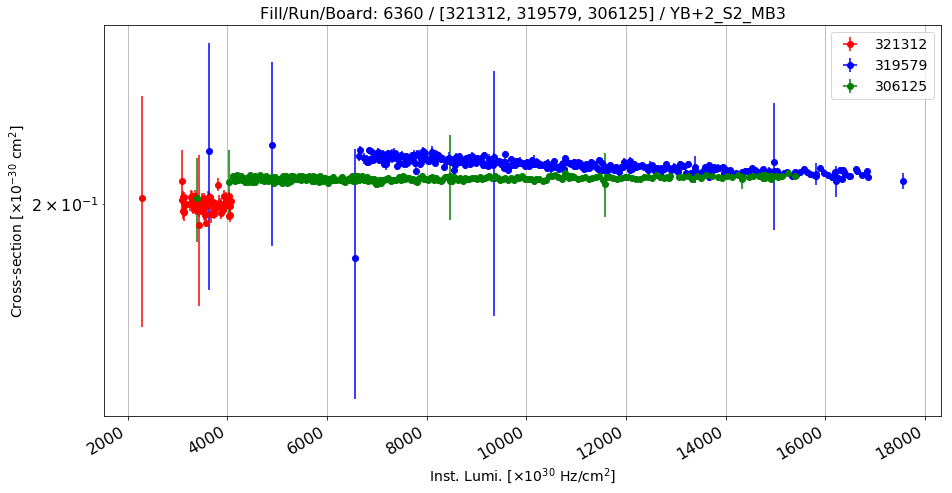

Anomalous CS: 0.199719813508 , Normal CS: 0.214788217846 , Ratio: 0.0701547062921


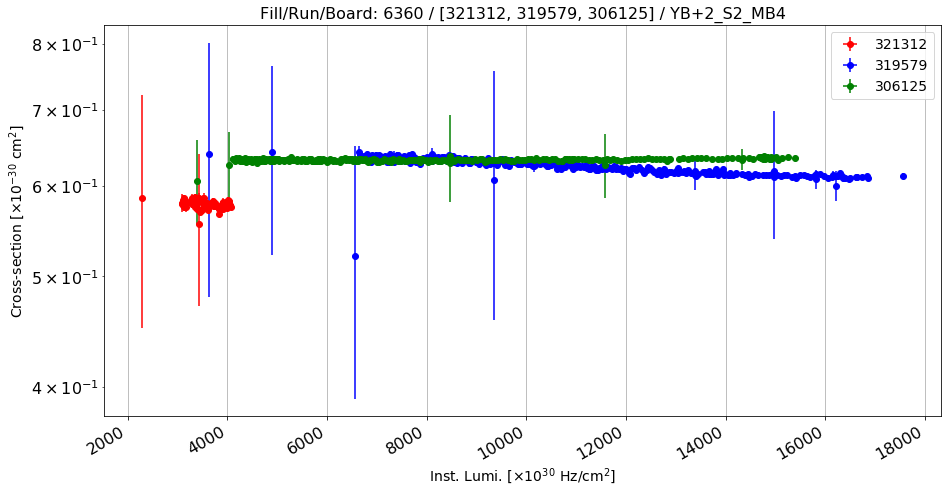

Anomalous CS: 0.578213258431 , Normal CS: 0.618417383537 , Ratio: 0.0650113114155


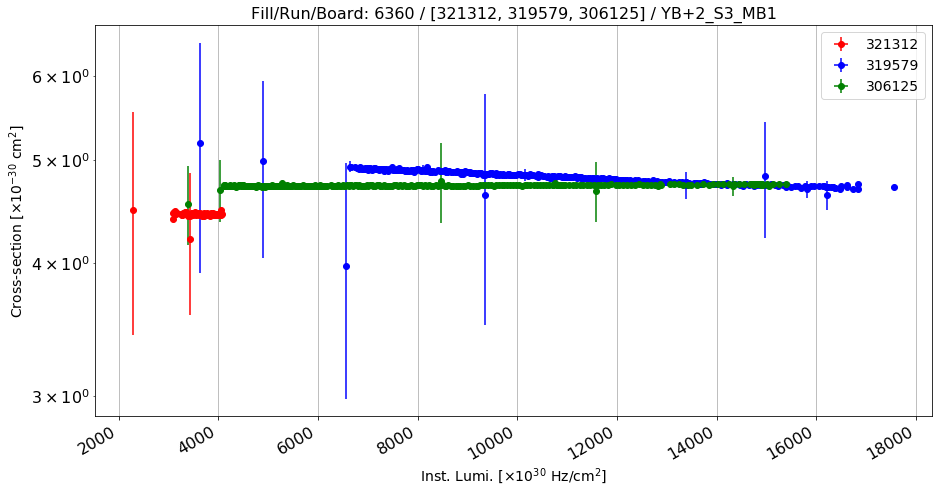

Anomalous CS: 4.44439390957 , Normal CS: 4.77342293031 , Ratio: 0.0689293669434


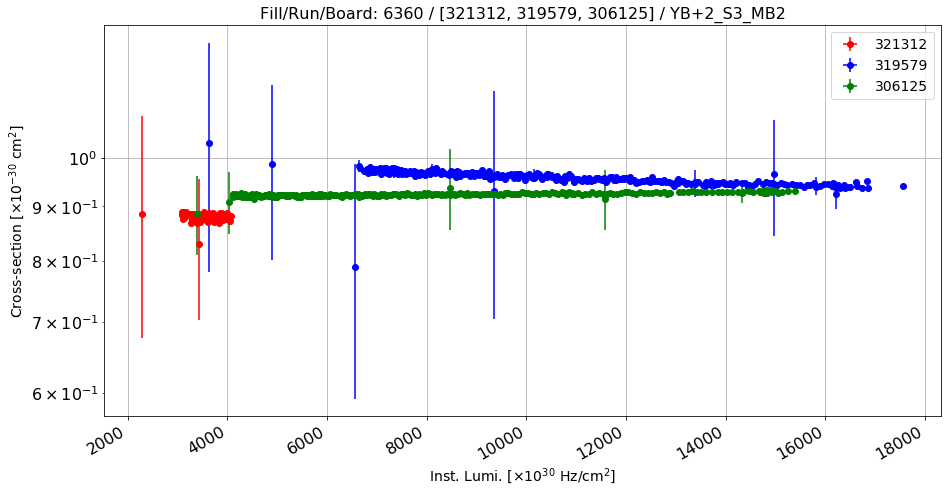

Anomalous CS: 0.878650153273 , Normal CS: 0.950195263866 , Ratio: 0.0752951664925


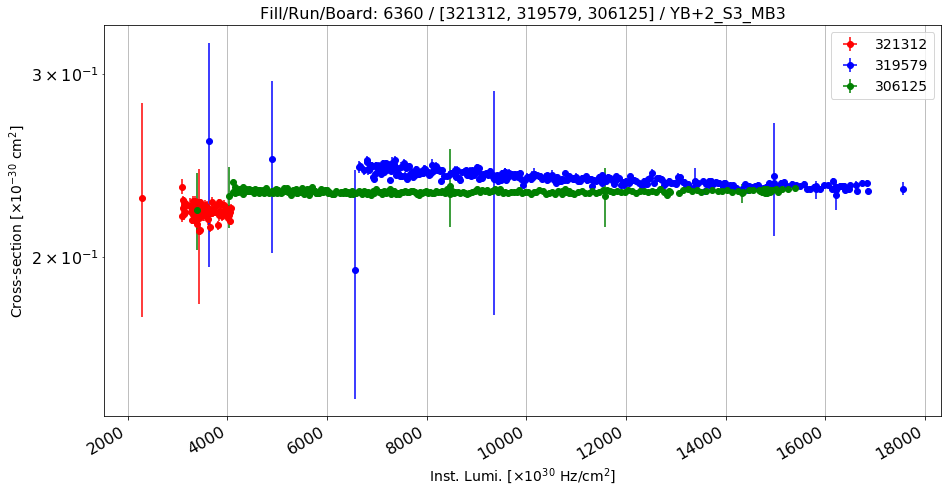

Anomalous CS: 0.221627121223 , Normal CS: 0.236096703802 , Ratio: 0.0612866776467


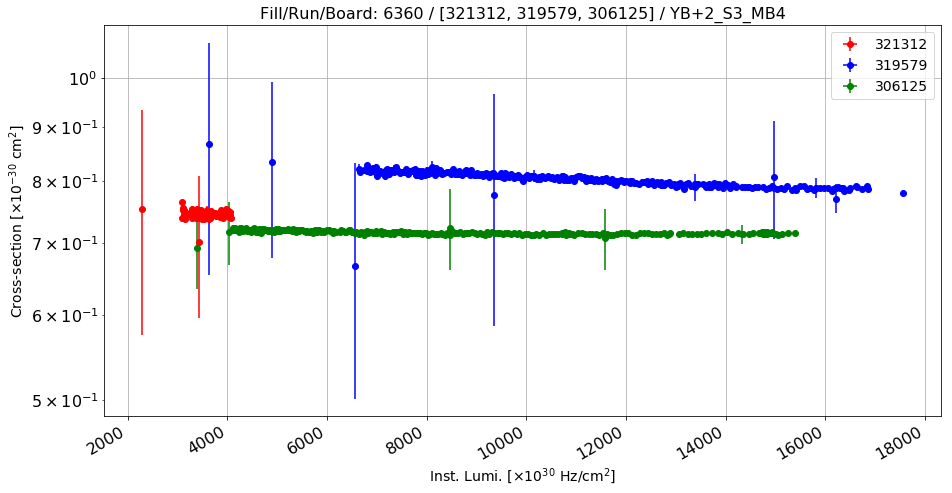

Anomalous CS: 0.745004218804 , Normal CS: 0.796374459925 , Ratio: 0.0645051338363


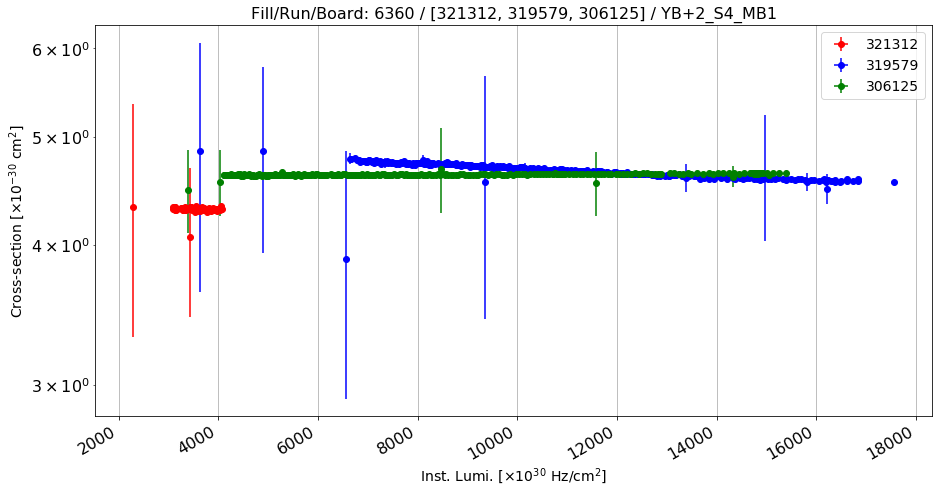

Anomalous CS: 4.30554860378 , Normal CS: 4.62228664822 , Ratio: 0.0685241025804


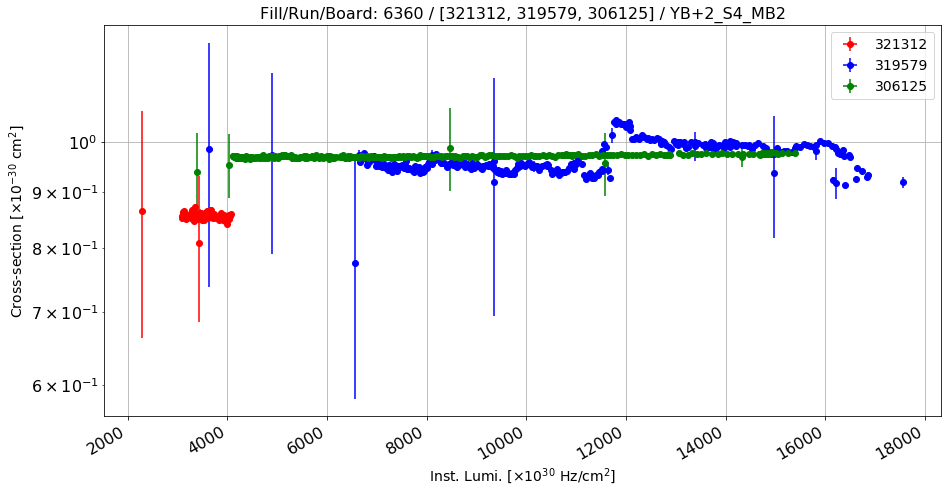

Anomalous CS: 0.855621241159 , Normal CS: 0.977793806322 , Ratio: 0.124947166133


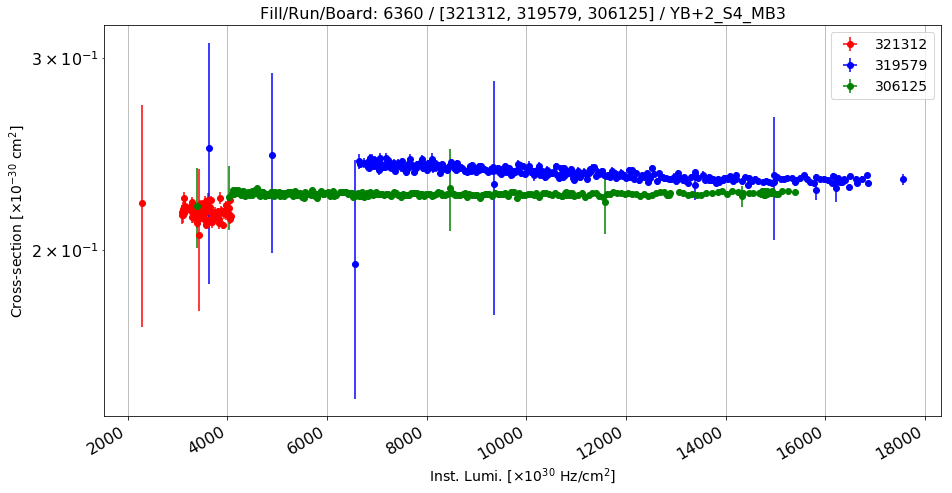

Anomalous CS: 0.216552879614 , Normal CS: 0.233357692461 , Ratio: 0.0720131085911


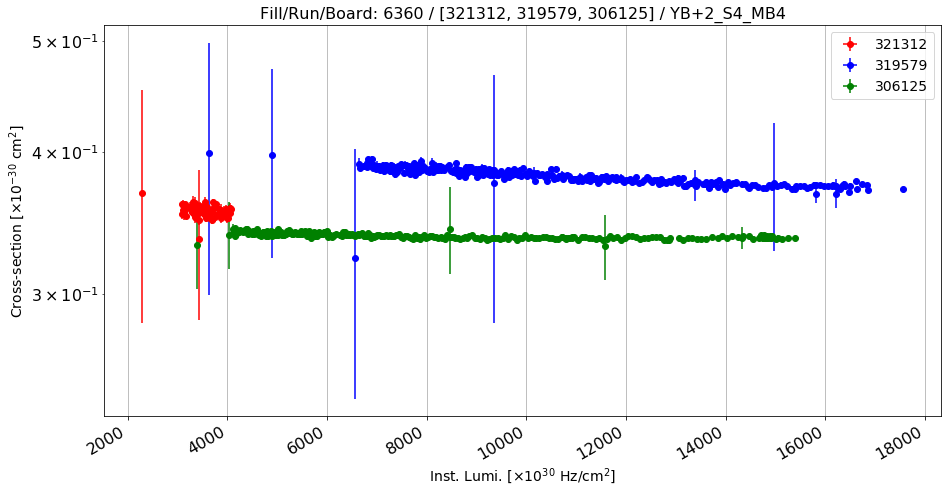

Anomalous CS: 0.354806447559 , Normal CS: 0.37658369264 , Ratio: 0.057828433643


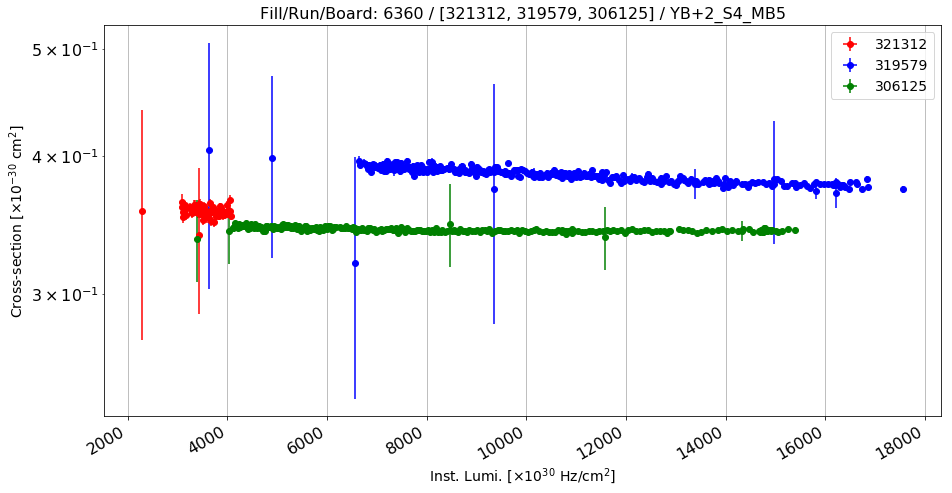

Anomalous CS: 0.356368702133 , Normal CS: 0.380371593479 , Ratio: 0.0631037957552


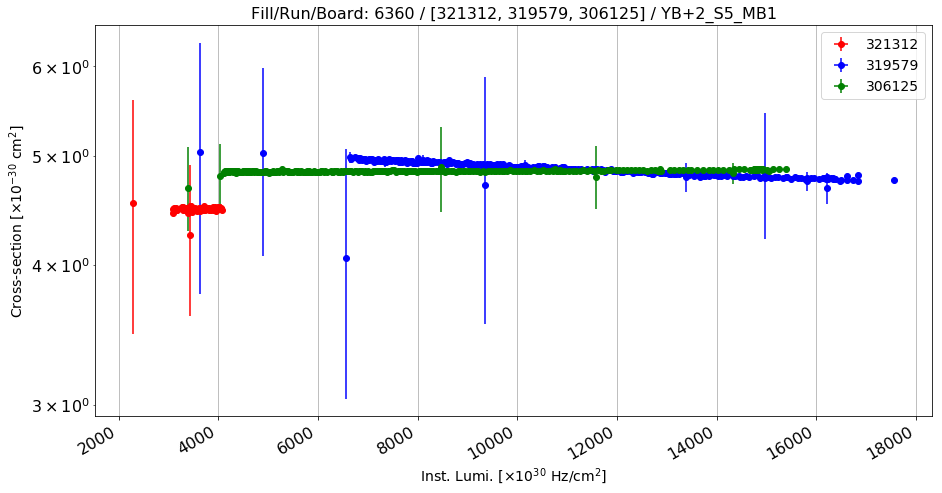

Anomalous CS: 4.48020667644 , Normal CS: 4.82469909912 , Ratio: 0.0714018461271


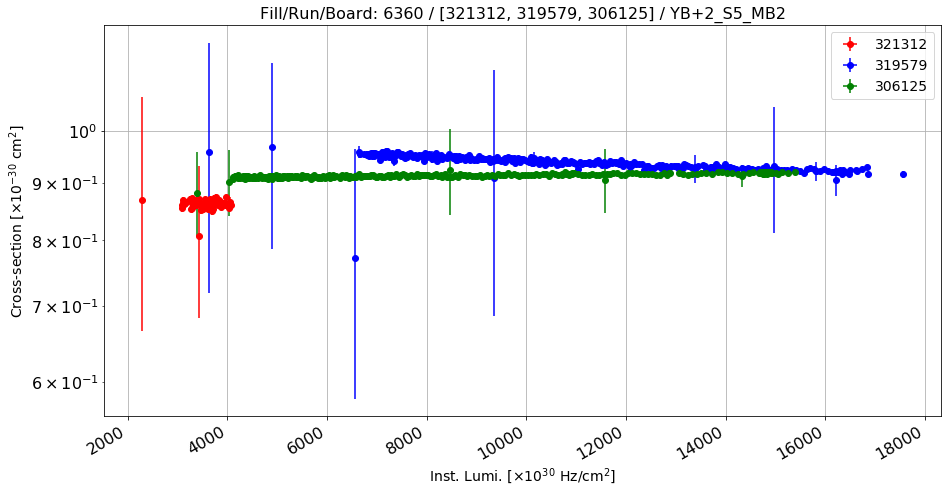

Anomalous CS: 0.860803294155 , Normal CS: 0.930506805628 , Ratio: 0.0749091904019


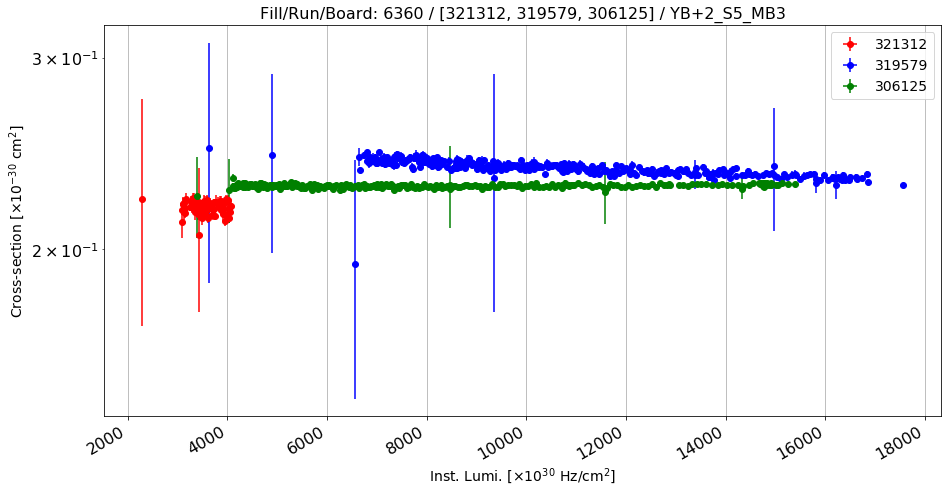

Anomalous CS: 0.218415642276 , Normal CS: 0.235607291686 , Ratio: 0.0729673911488


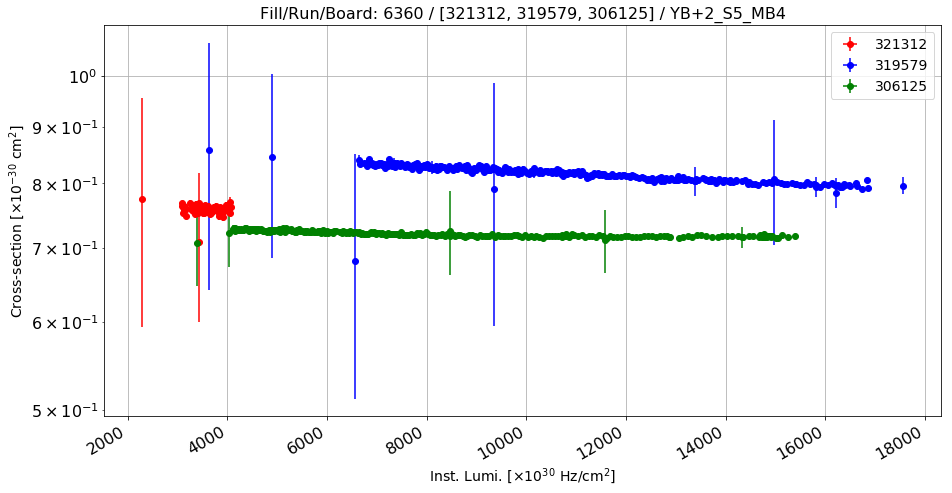

Anomalous CS: 0.757809998254 , Normal CS: 0.808149610486 , Ratio: 0.0622899665845


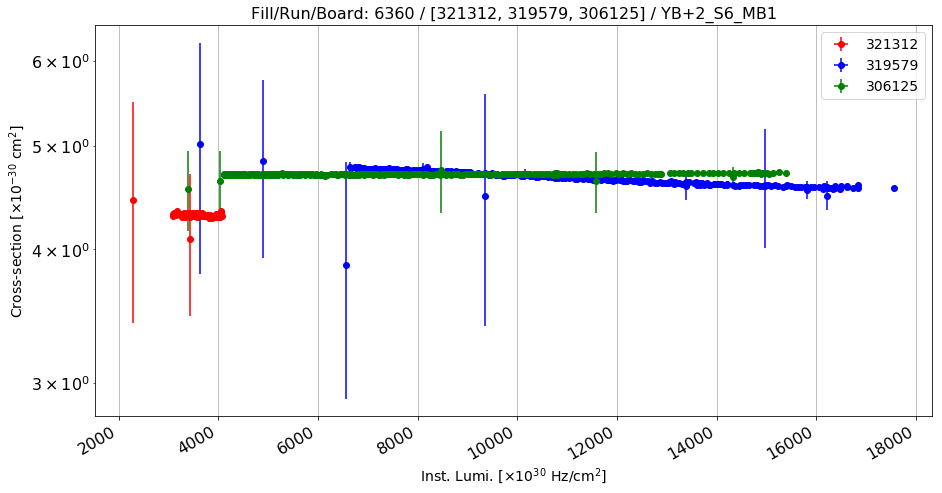

Anomalous CS: 4.30695887192 , Normal CS: 4.62540963248 , Ratio: 0.0688481206771


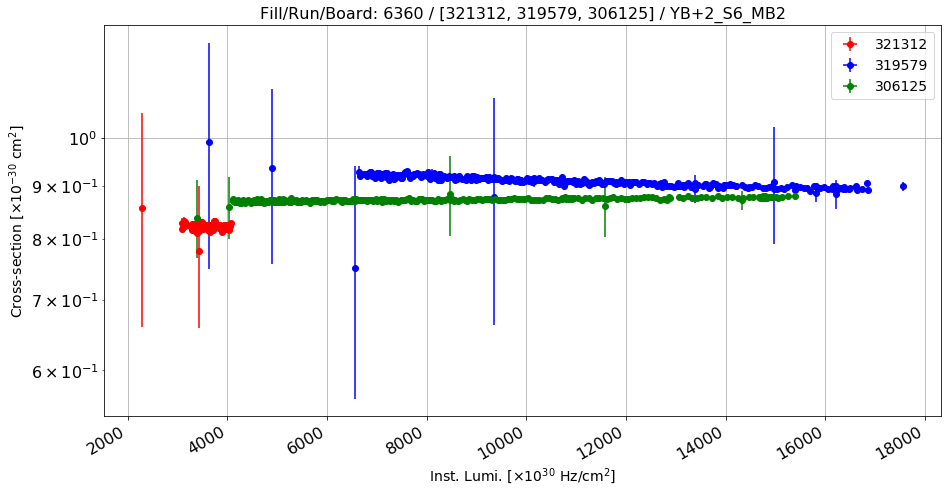

Anomalous CS: 0.82231258584 , Normal CS: 0.902335349623 , Ratio: 0.0886840616591


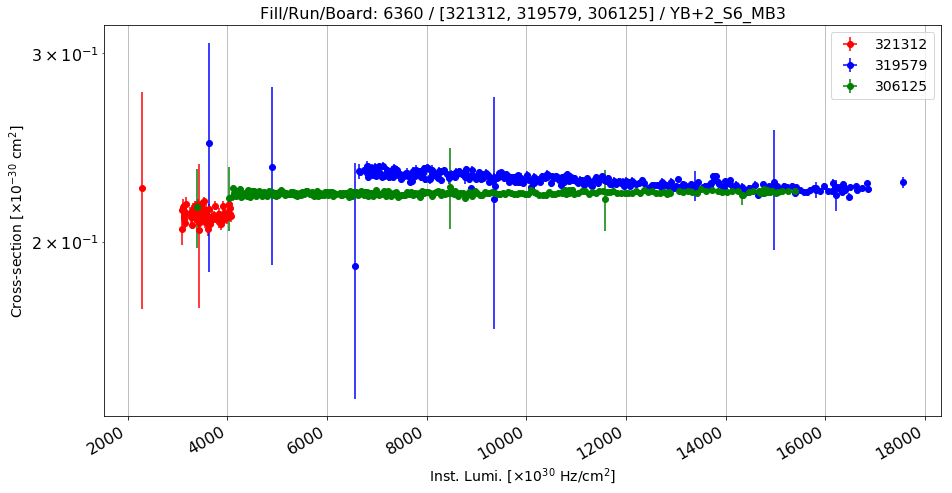

Anomalous CS: 0.212166991311 , Normal CS: 0.22652607933 , Ratio: 0.0633882335399


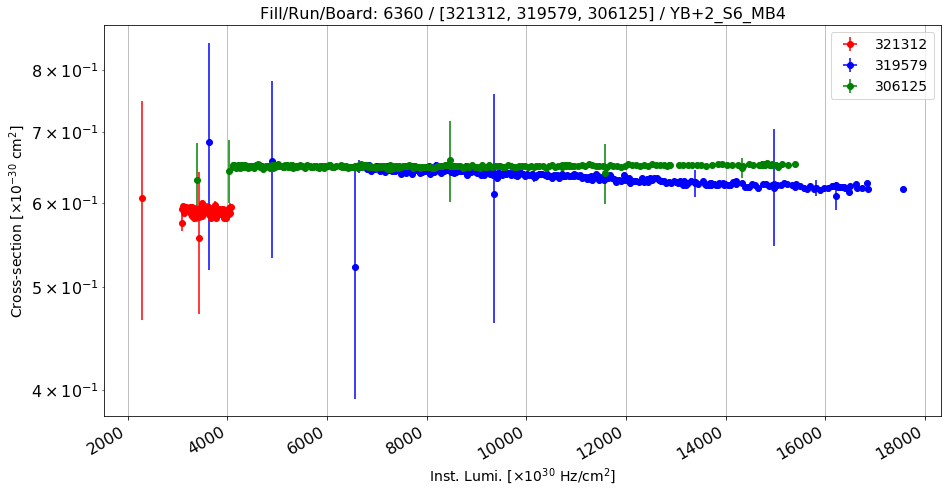

Anomalous CS: 0.588379051884 , Normal CS: 0.628252806246 , Ratio: 0.0634676900222


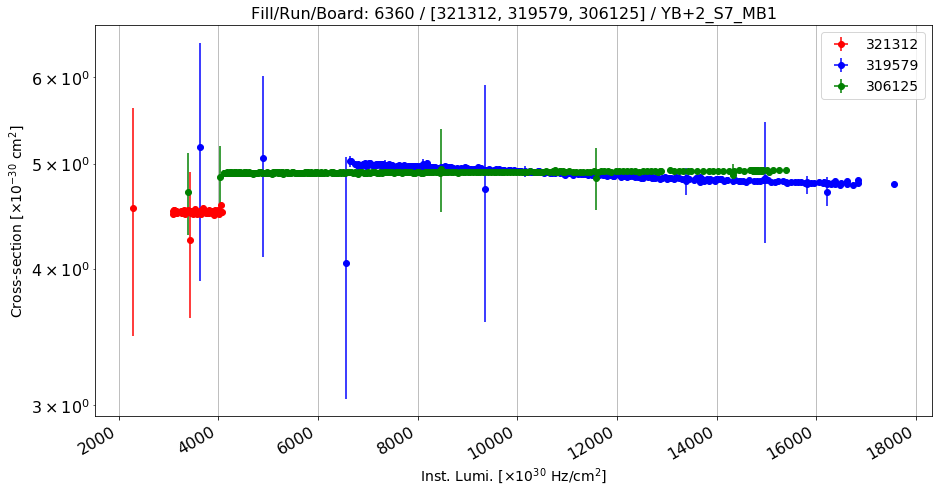

Anomalous CS: 4.51253424856 , Normal CS: 4.85545816965 , Ratio: 0.0706264803659


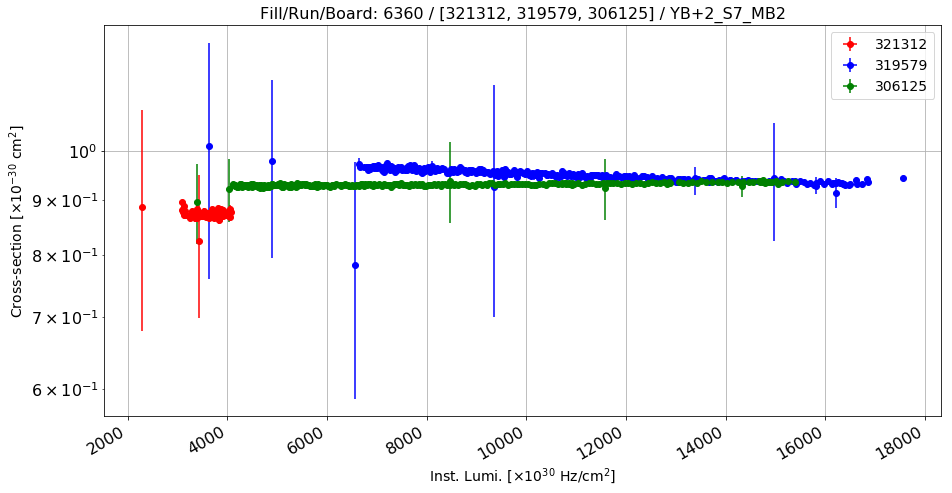

Anomalous CS: 0.873676650578 , Normal CS: 0.942690519147 , Ratio: 0.0732094650019


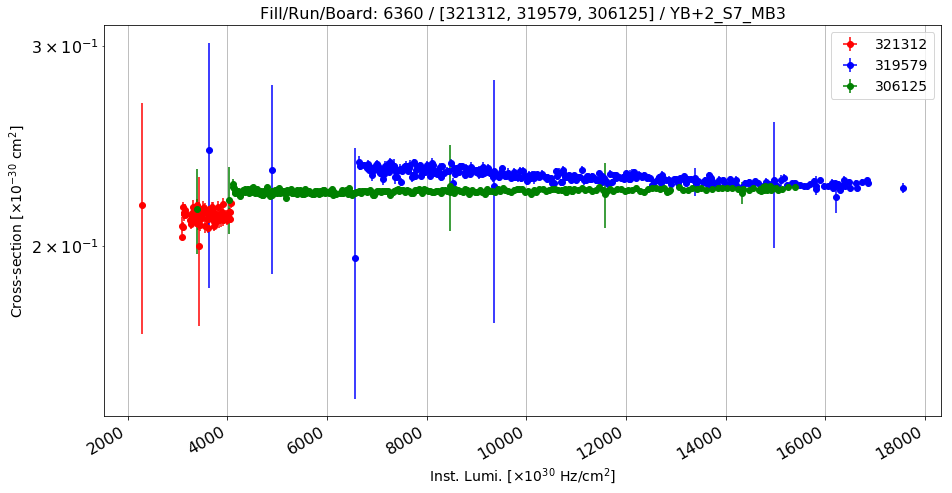

Anomalous CS: 0.212448953719 , Normal CS: 0.228444559203 , Ratio: 0.0700196386334


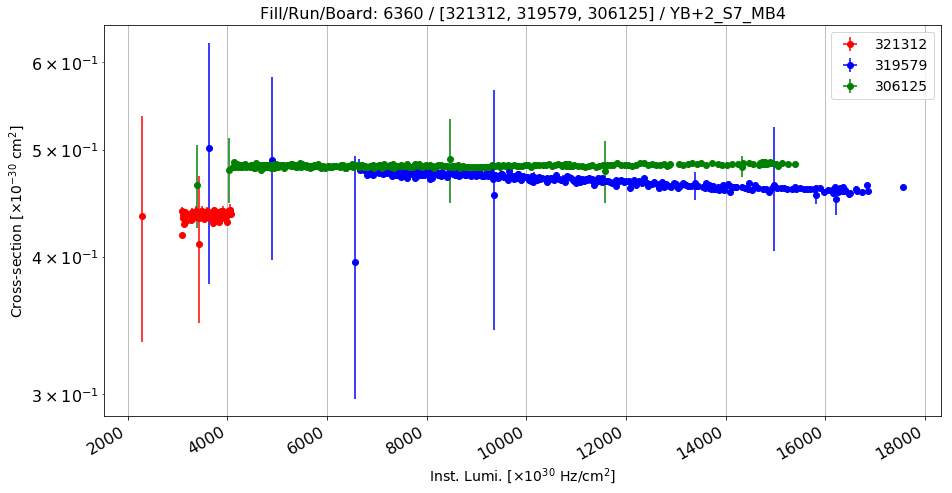

Anomalous CS: 0.435317108869 , Normal CS: 0.465052160829 , Ratio: 0.0639391759982


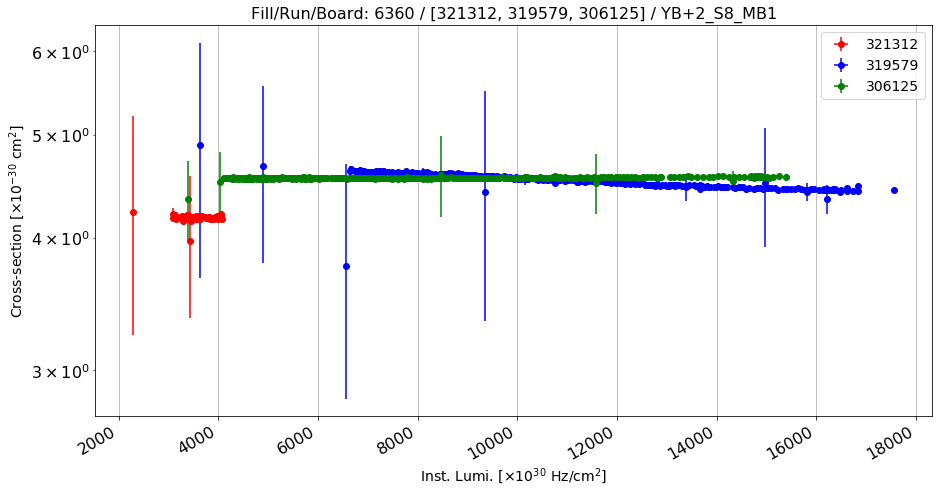

Anomalous CS: 4.17847486434 , Normal CS: 4.49223187556 , Ratio: 0.0698443490702


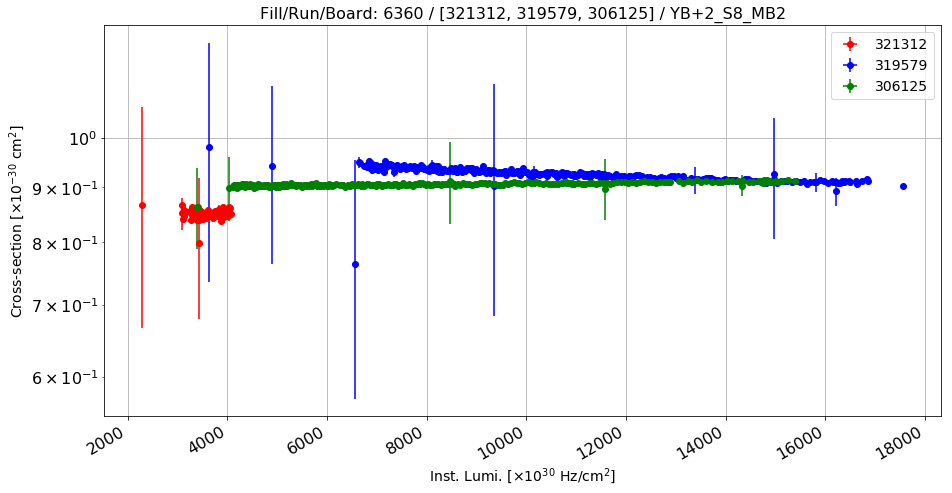

Anomalous CS: 0.850007942925 , Normal CS: 0.918186655163 , Ratio: 0.0742536518635


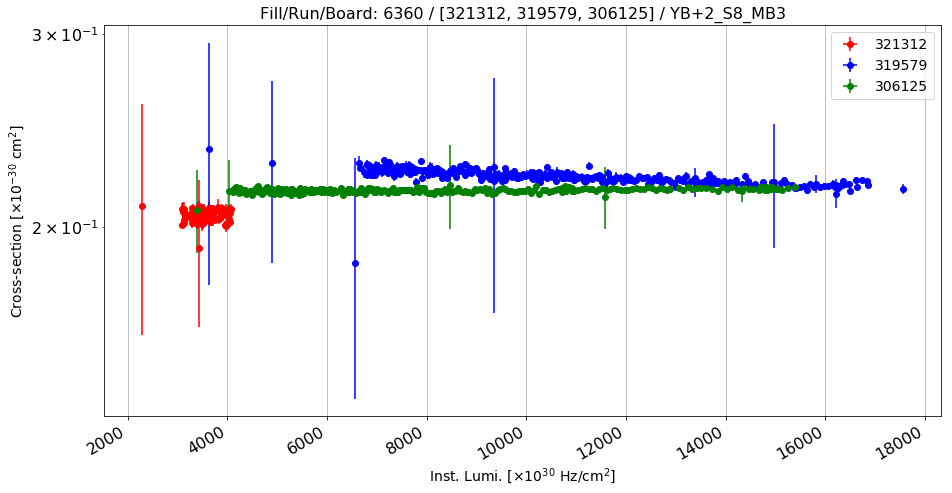

Anomalous CS: 0.205016815184 , Normal CS: 0.220446385893 , Ratio: 0.0699923958671


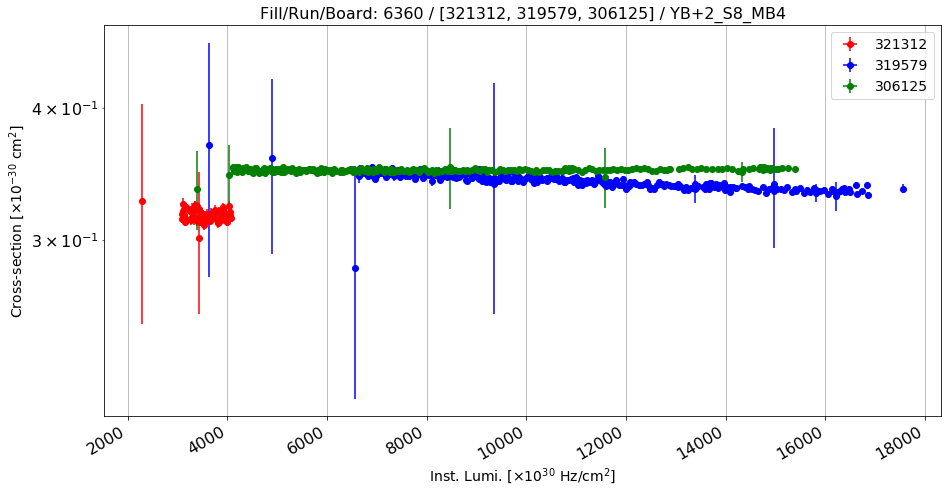

Anomalous CS: 0.316458713781 , Normal CS: 0.338047803142 , Ratio: 0.063864013197


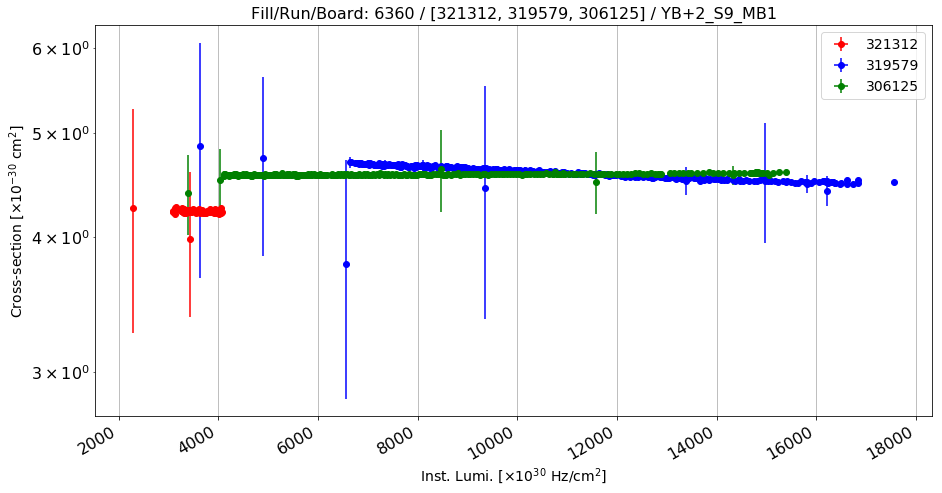

Anomalous CS: 4.22733340259 , Normal CS: 4.54917498376 , Ratio: 0.0707472414942


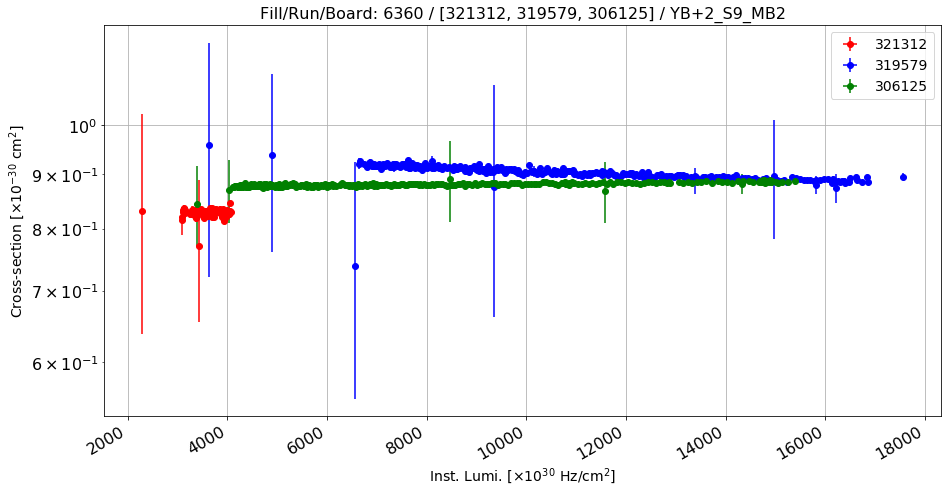

Anomalous CS: 0.828090373701 , Normal CS: 0.896342011715 , Ratio: 0.0761446380087


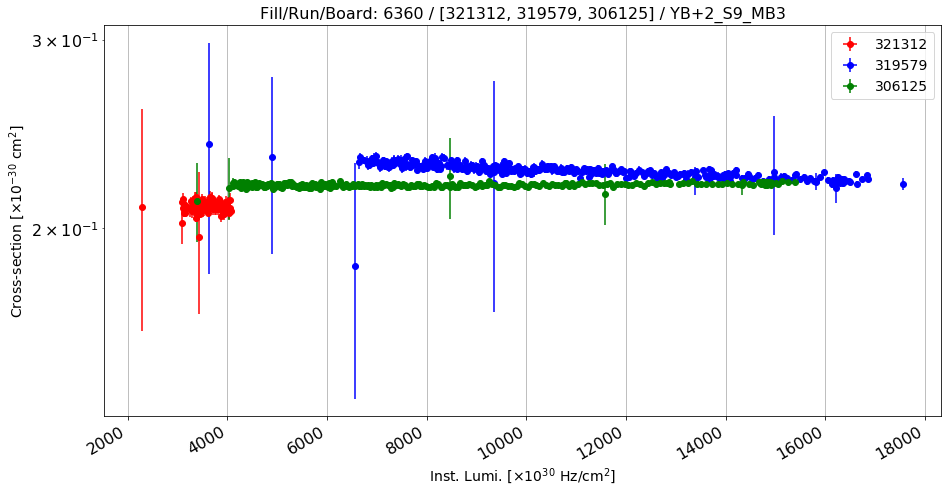

Anomalous CS: 0.209429181329 , Normal CS: 0.224654942488 , Ratio: 0.0677739870345


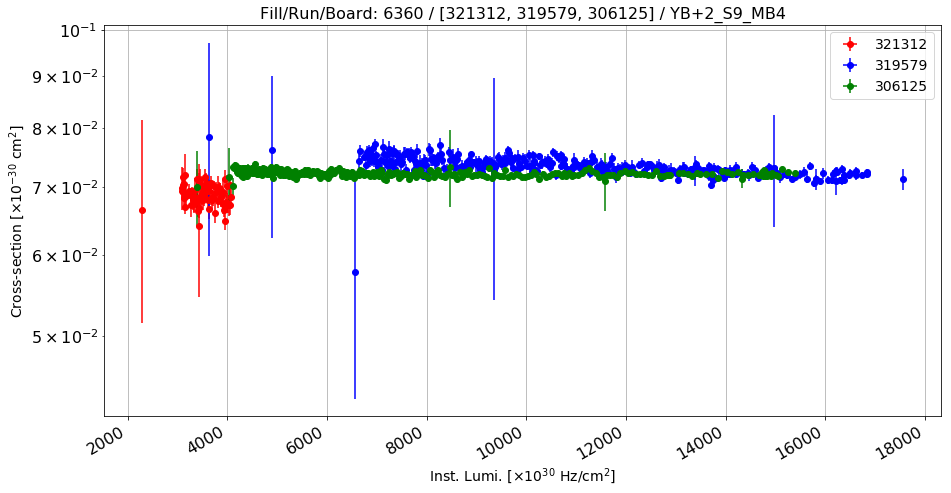

Anomalous CS: 0.0687355687575 , Normal CS: 0.0728160746757 , Ratio: 0.0560385318258


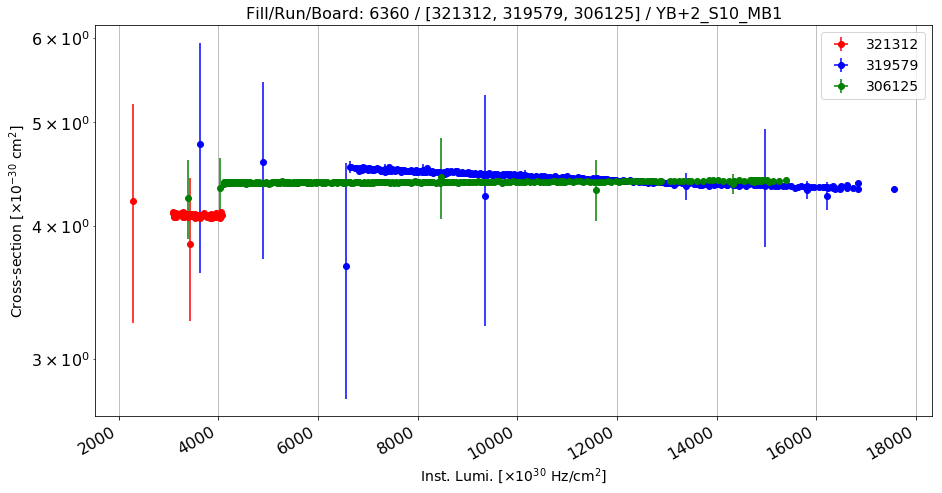

Anomalous CS: 4.08843468914 , Normal CS: 4.3944329332 , Ratio: 0.0696331582963


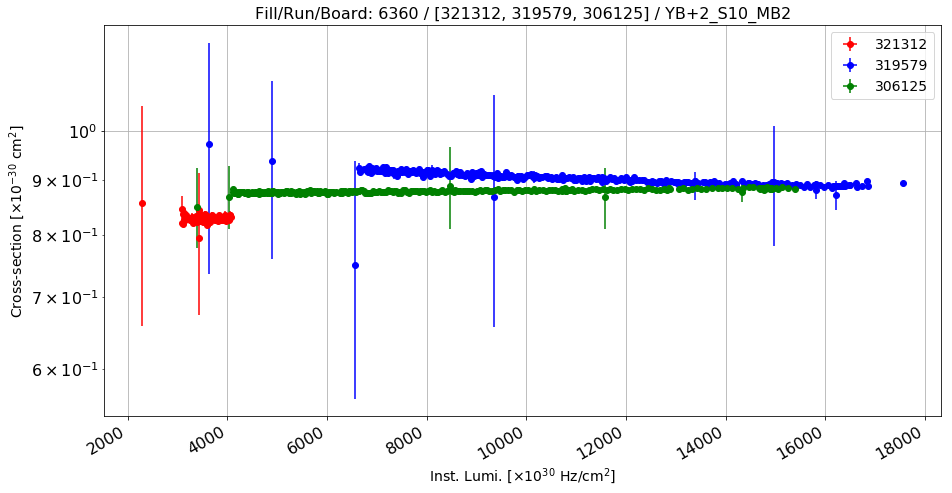

Anomalous CS: 0.82891006939 , Normal CS: 0.896906180717 , Ratio: 0.0758118438576


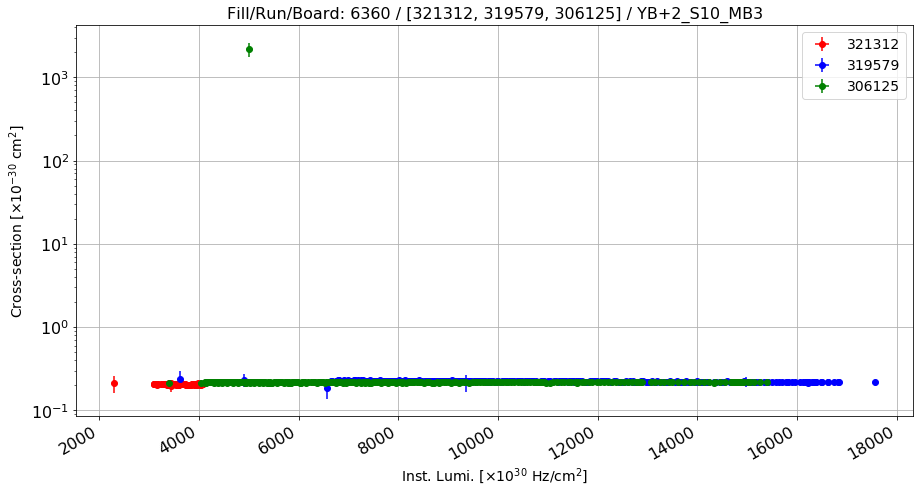

Anomalous CS: 0.205904638641 , Normal CS: 0.22151308825 , Ratio: 0.0704628775321


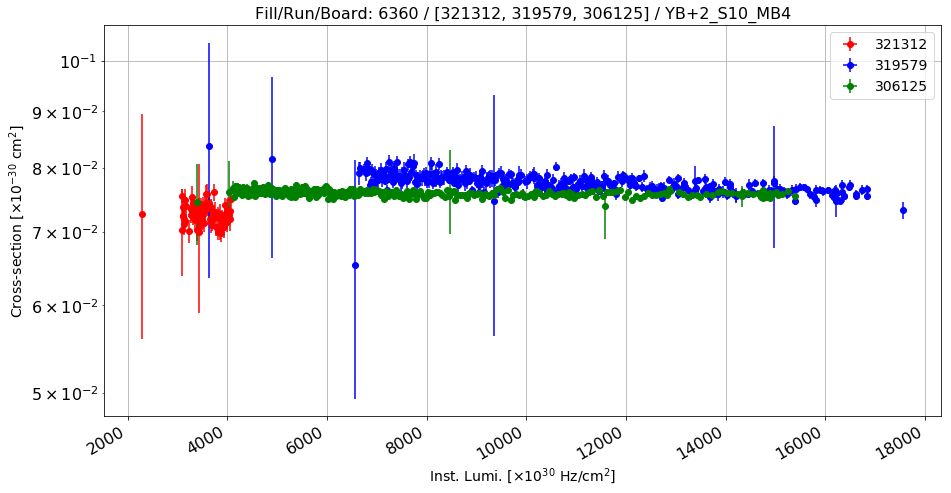

Anomalous CS: 0.0725643286476 , Normal CS: 0.0768197317578 , Ratio: 0.05539466245


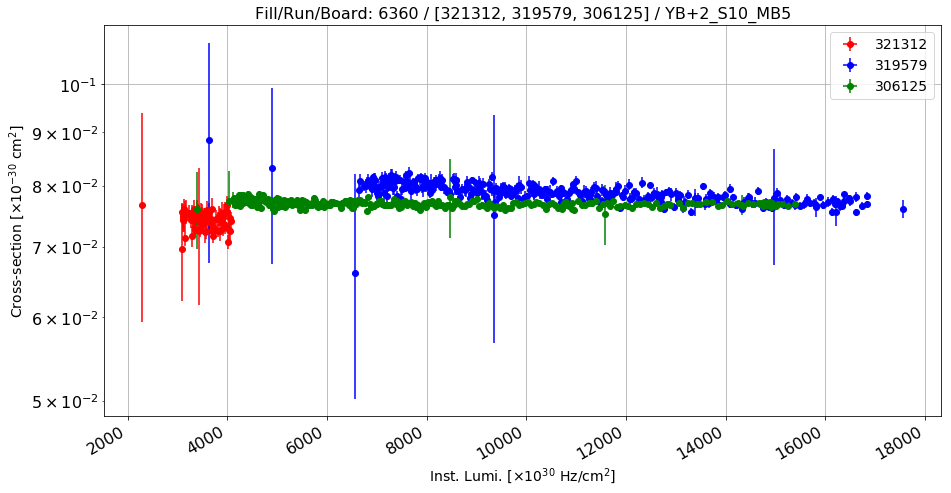

Anomalous CS: 0.0742705002706 , Normal CS: 0.0780548821832 , Ratio: 0.0484836029051


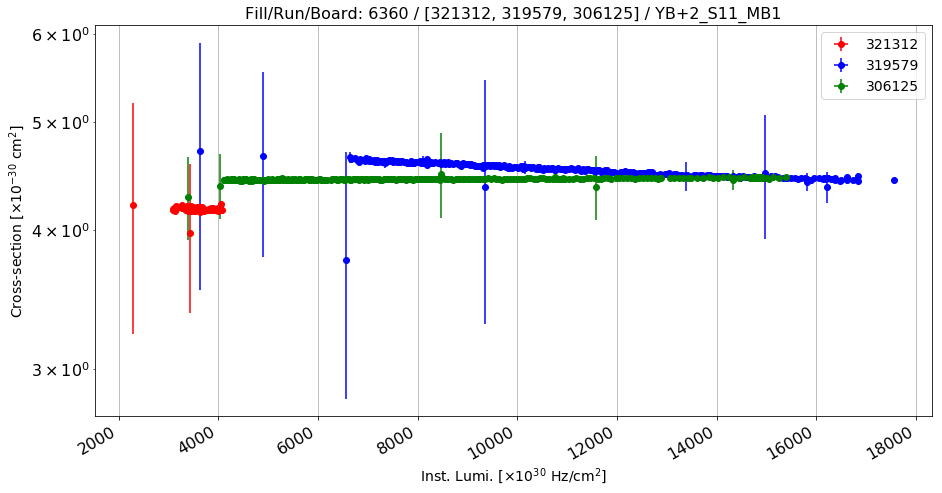

Anomalous CS: 4.17730682386 , Normal CS: 4.49497990398 , Ratio: 0.0706728588122


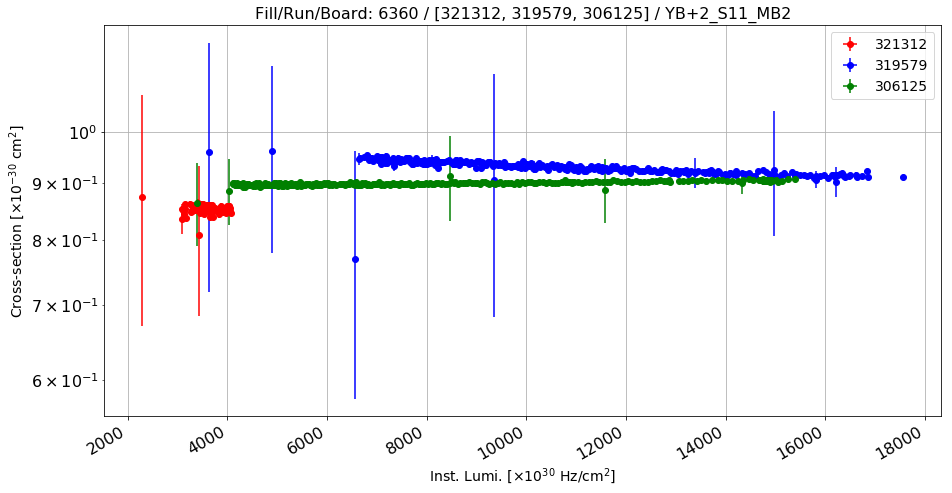

Anomalous CS: 0.852400071359 , Normal CS: 0.921956891138 , Ratio: 0.0754447636842


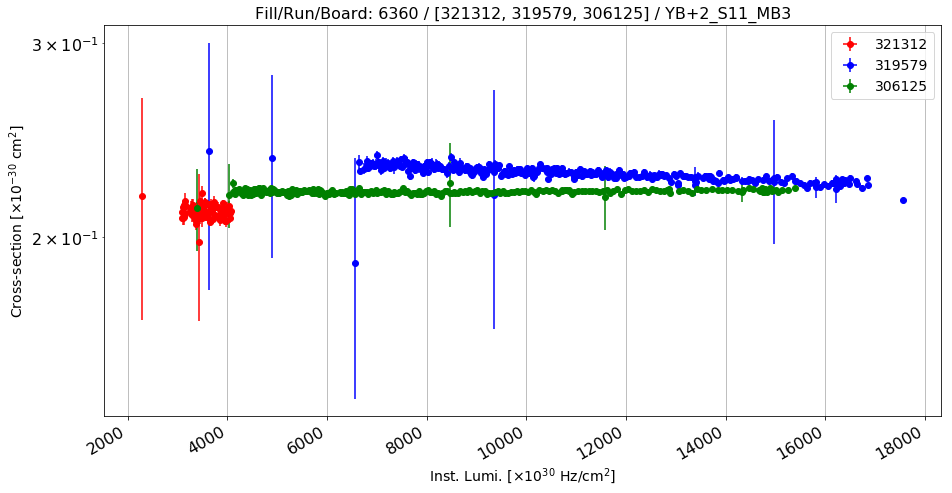

Anomalous CS: 0.211034352413 , Normal CS: 0.2268967639 , Ratio: 0.0699102588093


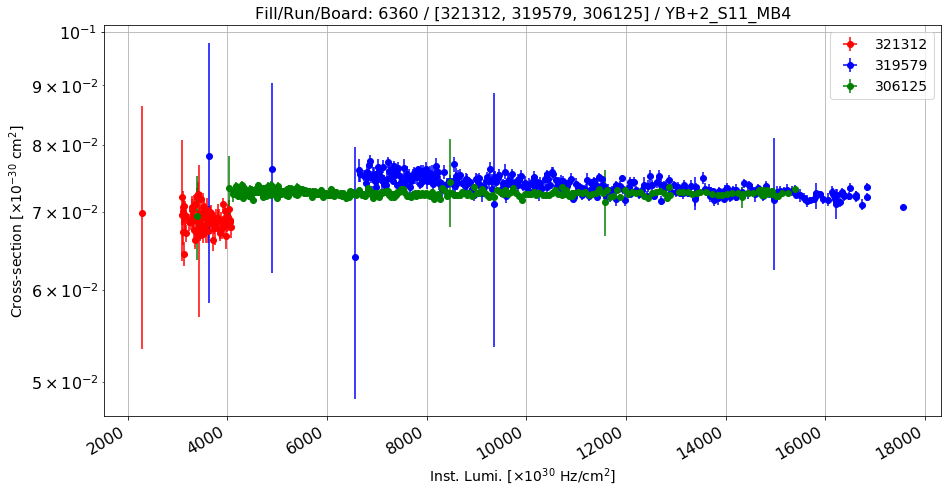

Anomalous CS: 0.0689723919213 , Normal CS: 0.0731202722378 , Ratio: 0.0567268171953


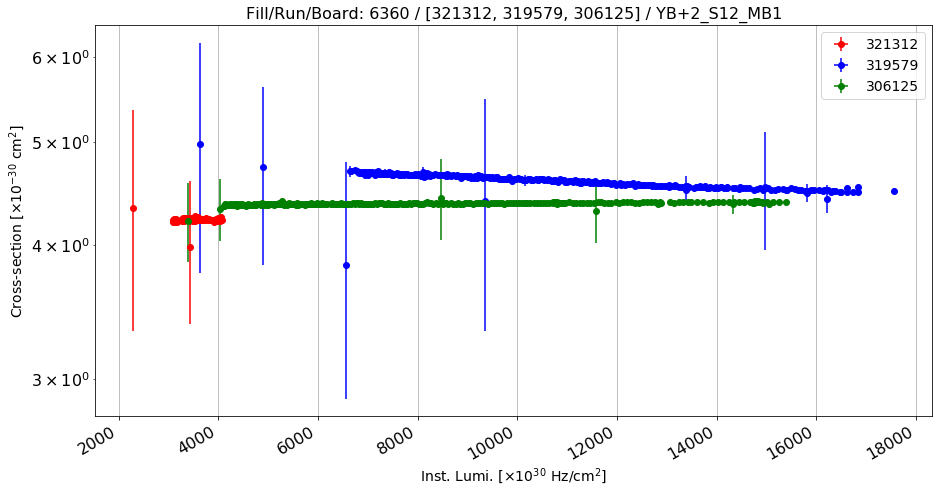

Anomalous CS: 4.22464789219 , Normal CS: 4.55026845221 , Ratio: 0.0715607361283


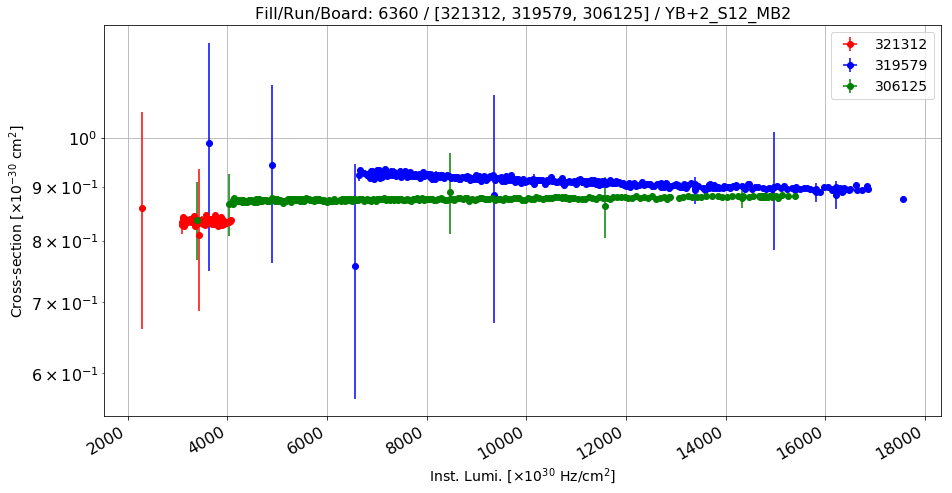

Anomalous CS: 0.834798820408 , Normal CS: 0.90313097255 , Ratio: 0.0756613982009


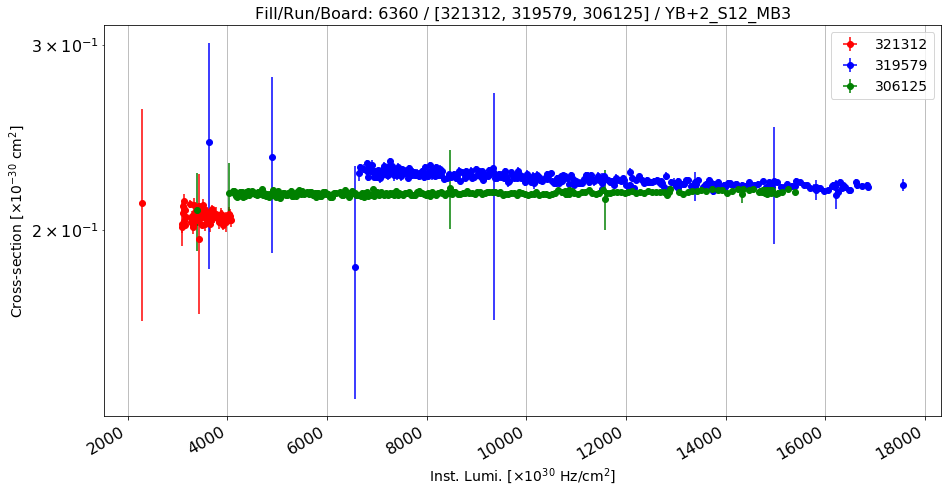

Anomalous CS: 0.206058586493 , Normal CS: 0.221870124843 , Ratio: 0.0712648373071


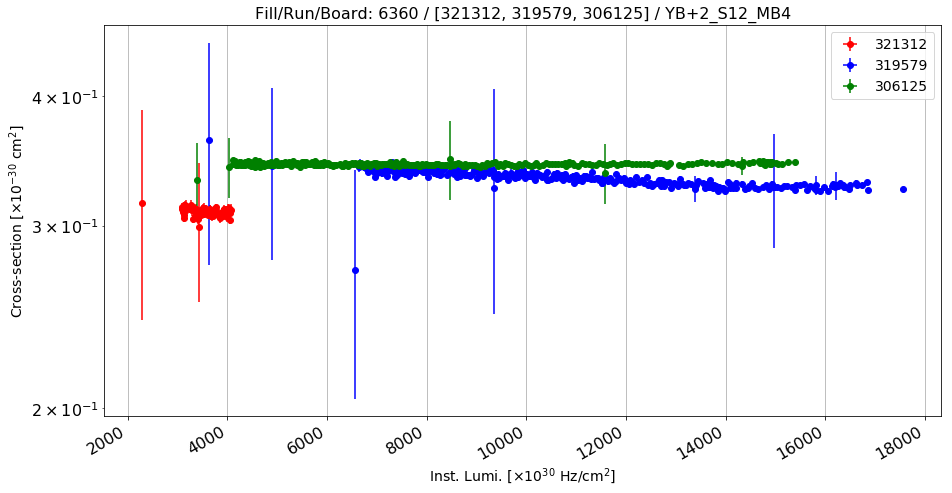

Anomalous CS: 0.309568576241 , Normal CS: 0.330306708051 , Ratio: 0.0627844706296


In [186]:
ratio = pd.DataFrame(columns=["wheel", "sector", "station", "ratio", "cs_norm", "cs_anomal"])

for i in [-2, -1, 0, +1, +2]:
#for i in [+2]:
    for j in range(1, 13):
    #for j in [10]:
        if ((j == 4) | (j == 10)):
            range_ = range(1, 6)
        else:
            range_ = range(1, 5)
        for k in range_:
        #for k in [3]:

            if (i > 0):
                board = "YB+" + str(i) + "_S" + str(j)
            else:
                board = "YB" + str(i) + "_S" + str(j)
            station = "DT" + str(k)
            
            error = "err"+station
            
            title = "Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / "+str("[321312, 319579, 306125]")+" / " + board + "_MB" + str(k)
                
            #N.B.: The second run is the one used as reference
            (a, b, c) = plot_ratio_vs_ls(df_rates, [321312, 319579, 306125], "lumi", station, board, 0,\
                            error, r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                            r"Cross-section [$\times10^{-30}$ cm$^{2}$]", title, ["ro", "bo", "go"], True)

            ratio = ratio.append({"wheel": i, "sector": j, "station": k, "ratio": c, "cs_norm": b,\
                                  "cs_anomal": a}, ignore_index = True)
            
            print "Anomalous CS:", a, ", Normal CS:", b, ", Ratio:", c
            

In [187]:
print ratio[(ratio.wheel == +1) & (ratio.sector == 4) & (ratio.station == 3)]
print ratio[(ratio.wheel == -1) & (ratio.sector == 3) & (ratio.station == 3)]

     wheel  sector  station     ratio   cs_norm  cs_anomal
164    1.0     4.0      3.0  0.061789  0.170996   0.160431
    wheel  sector  station     ratio   cs_norm  cs_anomal
60   -1.0     3.0      3.0  0.056538  0.224674   0.211971


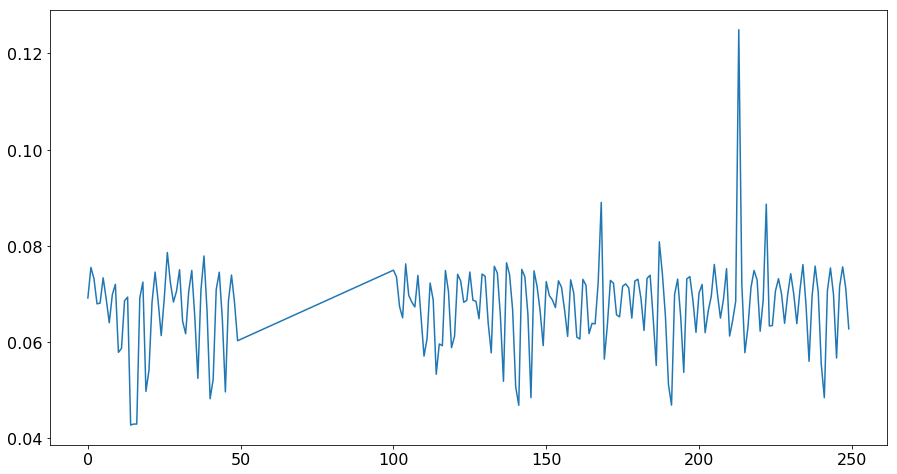

In [188]:
plt.plot(ratio[ratio.wheel != -1].ratio)

Create a new dataframe with the input features already organized in a numpy array:

In [189]:
print len(df_rates)
algos = ['RPC1', 'RPC2', 'RPC3', 'RPC4', 'DT1', 'DT2', 'DT3', 'DT4', 'DT5']
df_rates_new = pd.DataFrame(columns=['run', 'group', 'board', 'wheel', 'sector', 'ls',\
                                     'lumi', 'errLumi', 'rate', 'err', 'system', 'station'])

for i in algos:
    list_a = ['run', 'group', 'board', 'wheel', 'sector', 'ls', 'lumi', 'errLumi', i, 'err'+i,]
    temp = df_rates.copy()
    temp = temp[list_a]
    temp["system"] = -1
    temp["station"] = -1
    j = i
    if (i.find("RPC") != -1):
        temp["system"] = 1
        num = i.replace("RPC", "")
        temp["station"] = int(num)
    else:
        temp["system"] = 2
        num = i.replace("DT", "")
        temp["station"] = int(num)
    temp = temp.rename(columns={j: 'rate', 'err'+j: 'err'})
    #print temp.columns
    df_rates_new = pd.concat([df_rates_new, temp], ignore_index=True)

print len(df_rates_new)

41580
374220


In [190]:
def plot_rate_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        plt.errorbar(df_temp[rule][x_val], df_temp[rule][y_val], xerr=x_err,\
                     yerr=df_temp[rule][y_err], fmt=opt, ecolor='r')
    plt.legend(loc="best")
    plt.title(title)
    plt.show()

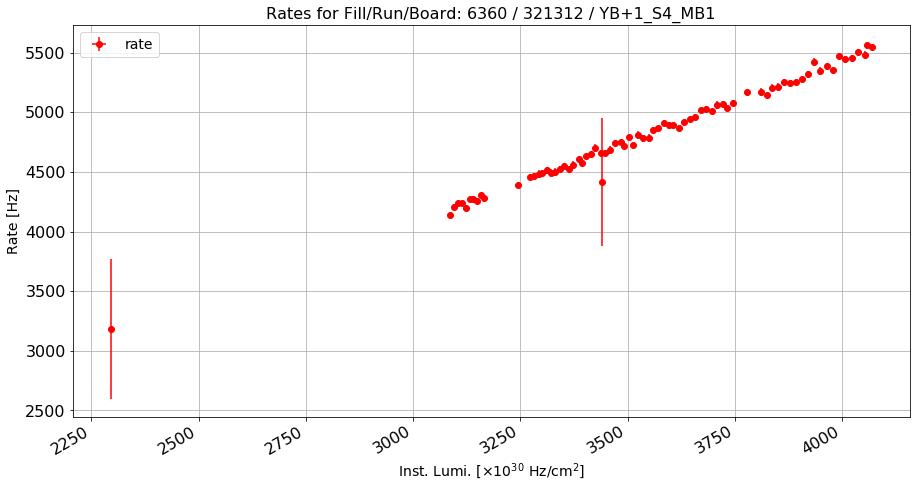

In [191]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / 321312 / YB+1_S4_MB1"
plot_rate_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 1)], [321312],\
                "lumi", "rate", "YB+1_S4", 0, "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

In [192]:
def plot_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        plt.errorbar(df_temp[rule][x_val], df_temp[rule][y_val], xerr=x_err, yerr=df_temp[rule][y_err],\
                     fmt=opt, ecolor='r')
        plt.errorbar(df_temp[rule][x_val], df_temp[rule]["lumi"], xerr=x_err, yerr=df_temp[rule]["errLumi"],\
                     fmt='bo', ecolor='b')
    plt.legend(loc="best")
    plt.title(title)
    plt.show()

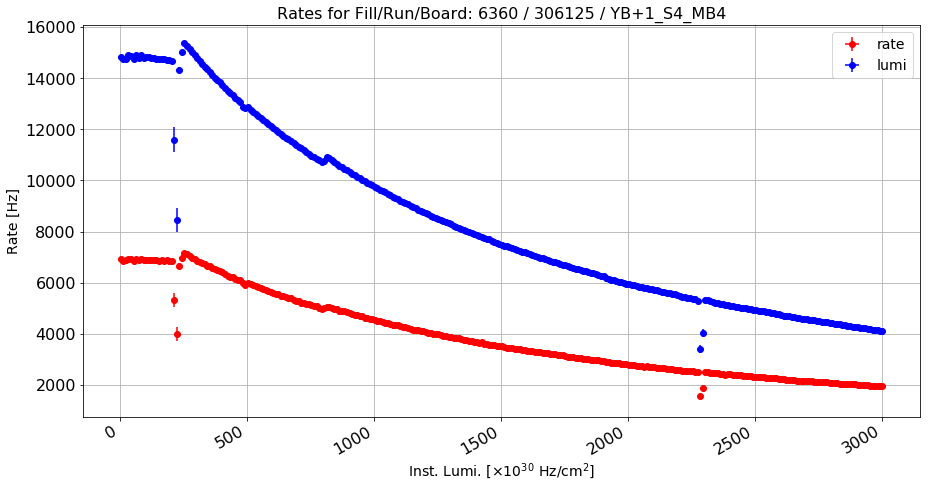

In [193]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / 306125 / YB+1_S4_MB4"
plot_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 4)], [306125],\
                "ls", "rate", "YB+1_S4", 0, "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

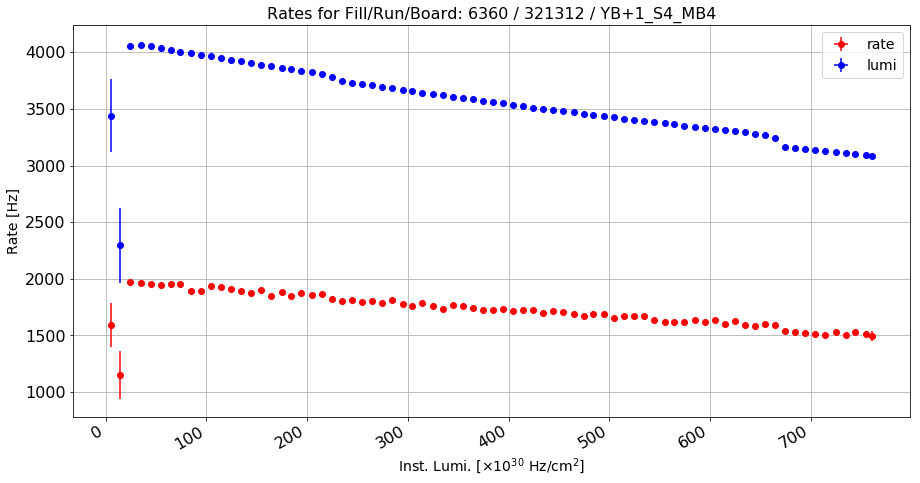

In [194]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / 321312 / YB+1_S4_MB4"
plot_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 4)], [321312],\
                "ls", "rate", "YB+1_S4", 0, "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

In [195]:
df_rates_new["CS"] = -1
df_rates_new["errCS"] = -1

df_rates_new["CS"] = df_rates_new["rate"]/df_rates_new["lumi"]
print "Number of NaN's in CS before:"
print len(df_rates_new["CS"][df_rates_new["CS"].isnull() == True])
print "Number of Inf's in CS before:"
print len(df_rates_new["CS"][np.isinf(df_rates_new["CS"])])

df_rates_new["CS"] = df_rates_new["CS"].replace([np.inf, -np.inf], np.nan)
df_rates_new["CS"] = df_rates_new["CS"].fillna(-1)

print "Number of NaN's in CS after:"
print len(df_rates_new["CS"][df_rates_new["CS"].isnull() == True])
print "Number of Inf's in CS after:"
print len(df_rates_new["CS"][np.isinf(df_rates_new["CS"])])

df_rates_new["errCS"] = (1/df_rates_new["lumi"])*\
np.sqrt(df_rates_new["err"]**2 + df_rates_new["CS"]**2 * df_rates_new["errLumi"]**2)

print "Number of NaN's in errCS before:"
print len(df_rates_new["errCS"][df_rates_new["errCS"].isnull() == True])
print "Number of Inf's in errCS before:"
print len(df_rates_new["errCS"][np.isinf(df_rates_new["errCS"])])

df_rates_new["errCS"] = df_rates_new["errCS"].replace([np.inf, -np.inf], np.nan)
df_rates_new["errCS"] = df_rates_new["errCS"].fillna(-1)

print "Number of NaN's in errCS after:"
print len(df_rates_new["errCS"][df_rates_new["errCS"].isnull() == True])
print "Number of Inf's in errCS after:"
print len(df_rates_new["errCS"][np.isinf(df_rates_new["errCS"])])

Number of NaN's in CS before:
0
Number of Inf's in CS before:
0
Number of NaN's in CS after:
0
Number of Inf's in CS after:
0
Number of NaN's in errCS before:
0
Number of Inf's in errCS before:
0
Number of NaN's in errCS after:
0
Number of Inf's in errCS after:
0


In [196]:
array = df_rates_new.as_matrix(columns=['system', 'wheel', 'sector', 'station',\
                                        'lumi', 'errLumi', 'rate', 'err',\
                                        'CS', 'errCS'])

/Users/cesarecalabria/Library/Python/2.7/lib/python/site-packages/ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.


In [197]:
print len(array)
print len(df_rates_new)

374220
374220


In [198]:
df_rates_new["content"] = np.empty((len(df_rates_new), 0)).tolist()

In [199]:
for index, rows in df_rates_new.iterrows():
    #print index, array[index]
    df_rates_new.at[index, "content"] = array[index]
df_rates_new["score"] = -1

In [200]:
#print df_rates_new[(df_rates_new["station"] == 5) & ((df_rates_new["sector"] != 4) &\
 #                                                    (df_rates_new["sector"] != 10))]["content"]

rule = ((df_rates_new["station"] == 5) & ((df_rates_new["sector"] != 4) & (df_rates_new["sector"] != 10)))
df_rates_new = df_rates_new[rule == False]

Add a column with the percentage difference in CS:

In [201]:
df_rates_new["ratio"] = 0
for i in [-2, -1, 0, +1, +2]:
    for j in range(1, 13):
        range_ = range(1, 5)
        if ((j == 4) | (j == 10)):
            range_ = range(1, 6)
        for k in range_:
            rule = (df_rates_new.wheel == i) & (df_rates_new.sector == j) & (df_rates_new.station == k)
            rule_r = (ratio.wheel == i) & (ratio.sector == j) & (ratio.station == k)
            idx = df_rates_new[rule].index
            value = ratio[rule_r]["ratio"].item()
            #print i, j, k, value
            for w in idx:
                df_rates_new.loc[w, "ratio"] = value

# Model inference section <a class="anchor" id="fourth-bullet"></a>

## Creating the train and test samples

In [202]:
df_rates_new_2 = df_rates_new.copy()
print df_rates_new["content"].loc[166321]

[2 1 10 1 14832.761313432853 5.083580794736273 24659.597014925374
 31.025762625525786 1.6625088541398652 0.0021679220980458445]


In [203]:
#To be run just one time!!!!!!
df_rates_new["content_in"] = df_rates_new["content"].copy()
def change_data(data):
    temp = data.copy()
    temp[2] = temp[2] - 6
    temp[3] = temp[3] - 3
    return temp

df_rates_new["content"] = df_rates_new["content"].apply(change_data)

In [204]:
df_rates_new = df_rates_new[df_rates_new["system"] == 2]

In [205]:
print df_rates_new["content"].loc[166321]

[2 1 4 -2 14832.761313432853 5.083580794736273 24659.597014925374
 31.025762625525786 1.6625088541398652 0.0021679220980458445]


In [206]:
normalies = df_rates_new.copy()
anomalies = df_rates_new.copy()
print len(normalies), len(anomalies)

173250 173250


In [207]:
def deduceLS(data):
    if (bunch == 10):
        return data*10+5
anomalies["averageLS"] = anomalies["group"].apply(deduceLS)
#print anomalies.columns

In [208]:
rule = (normalies["wheel"] == -1) & (normalies["sector"] == 3) & (normalies["station"] == 3) 
print "Normal chimney:"
print normalies[rule]["content"].iloc[100]

rule = (normalies["wheel"] == 1) & (normalies["sector"] == 4) & (normalies["station"] == 3)
print "Anomalous chimney:"
print normalies[rule]["content"].iloc[100]

Normal chimney:
[2 -1 -3 0 9744.584855072457 1.8061767199476344 2131.521739130435
 5.884748761520032 0.218739101853158 0.0006052588318100501]
Anomalous chimney:
[2 1 -2 0 9744.584855072457 1.8061767199476344 1611.9130434782608
 5.309465687505742 0.16541628683536927 0.0005457251647561998]


In [209]:
def assignScore(df, score):
    temp = df.copy()
    rule = (temp["wheel"] == 1) & (temp["sector"] == 4) & (temp["station"] == 3)
    indexes = temp[rule].index
    #print indexes
    for i in indexes:
        temp.loc[i, "score"] = score
    return temp

temp = assignScore(anomalies, 1)
anomalies = temp

In [210]:
def change(data, red = 1):
    #print data
    temp = data.copy()
    temp[4] = temp[4]*red #Increase lumi by "red"
    temp[5] = temp[5]*red
    temp[8] = temp[8]*red #Increase CS by "red"
    temp[9] = temp[9]*red
    #print temp
    return temp

print anomalies["content"].iloc[0]
anomalies["content_2"] = anomalies["content"].copy()
anomalies["content_2"] = anomalies["content"].apply(change)
print anomalies["content_2"].iloc[0]

[2 1 -5 -2 14832.761313432853 5.083580794736273 23774.10447761194
 26.33308830584372 1.6028104258700384 0.0018583770810285621]
[2 1 -5 -2 14832.761313432853 5.083580794736273 23774.10447761194
 26.33308830584372 1.6028104258700384 0.0018583770810285621]


In [211]:
#Scale the data
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing.data import QuantileTransformer
def scale_data(data, scaler_type = 2):
    
    types = ["RobustScaler", "MaxAbsScaler", "QuantileTransformerUniform",\
             "QuantileTransformerNormal", "Normalizer", "MinMaxScaler"]
    #print "Scaling data using:", types[scaler_type-1]
    
    # Need to reshape since scaler works per column

    if (scaler_type == 0):
        return data
    if (scaler_type == 1):
        data = data.reshape(-1, 1)
        scaler = RobustScaler(quantile_range=(25, 75)).fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 2):
        data = data.reshape(-1, 1)
        scaler = MaxAbsScaler().fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 3):
        data = data.reshape(-1, 1)
        scaler = QuantileTransformer(output_distribution='uniform').fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 4):
        data = data.reshape(-1, 1)
        scaler = QuantileTransformer(output_distribution='normal').fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 5):
        data = data.reshape(1, -1)
        scaler = Normalizer(norm='l2').fit_transform(data)
        return scaler.reshape(1, -1)
    if (scaler_type == 6):
        data = data.reshape(-1, 1)
        scaler = MinMaxScaler().fit(data)
        return scaler.transform(data).reshape(1, -1)

In [212]:
anomalies["content"] = anomalies["content"].apply(np.array)
anomalies["content_2"] = anomalies["content_2"].apply(np.array)
anomalies["content_scaled"] = anomalies["content"].apply(scale_data)
#anomalies["content_scaled"] = anomalies["content_2"].apply(scale_data)

Testing on 2018 data:

In [213]:
#layers_test = anomalies.copy()
layers_test = (anomalies[(anomalies.run == 319579) | (anomalies.run == 321312)]).copy()
print "Tot:", len(layers_test)
print "Normalies:", len(layers_test[layers_test.score == -1])
print "Anomalies", len(layers_test[layers_test.score == 1])

Tot: 98000
Normalies: 97608
Anomalies 392


In [214]:
def score_to_array(score):
    if score == -1:
        return np.asarray([1, 0]) #Normaly
    return np.asarray([0, 1]) #Anomaly

def nn_generate_input():  
    return np.array(np.concatenate(layers_test.content_scaled.values)).reshape(-1, 10)

test_x = nn_generate_input()

## Simple test

In [215]:
factors = pd.DataFrame()

print("Loading SF")
path = "./factors_2018.csv"
factors = factors.append(pd.read_csv(path,\
        names=["wheel", "sector", "station", "CS", "factor"]),\
        ignore_index=True)

print("Done.")

Loading SF
Done.


In [216]:
def simple_test(cross_sections, df, coeff):
    for i in df.index:
        wheel = df.wheel.loc[i]
        sector = df.sector.loc[i]
        station = df.station.loc[i]
        cs = df.CS.loc[i]
        #err_cs = df.errCS.loc[i]
        #print cs
        rule = ((cross_sections.wheel == wheel) & (cross_sections.sector == sector) &\
                (cross_sections.station == station))
        cs_norm = cross_sections[rule].CS.iloc[0]
        #err_cs_norm = cross_sections[rule].errCS.iloc[0]
        #low = cs_norm - coeff*err_cs_norm
        #hi = cs_norm + coeff*err_cs_norm
        #if ((wheel == 1) & (sector == 4) & (station == 3)):
        #    print cs, cs_norm
        low = cs_norm*(1 - coeff)
        hi = cs_norm*(1 + coeff)
        #print low, hi
        if ((cs > low) & (cs < hi)):
            res = 0
        else:
            res = +1
        df.loc[i, "st_score"] = res

In [217]:
layers_test["st_score"] = 0
layers_test.index = pd.RangeIndex(len(layers_test.index))
simple_test(factors, layers_test, 0.05)

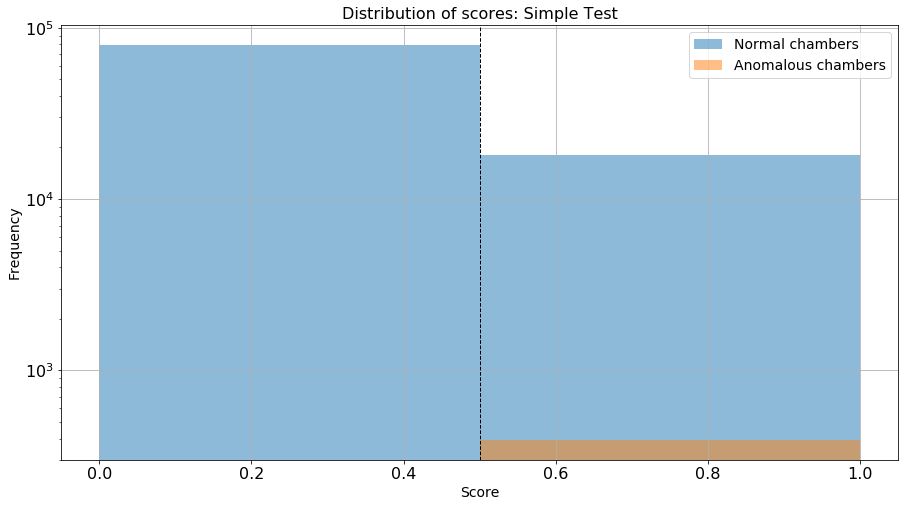

In [218]:
# Distribution of scores:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, +1, 3)
plt.hist(layers_test[layers_test["score"] < 0]["st_score"], bins=bins, alpha=0.5,\
         label="Normal chambers")
plt.hist(layers_test[layers_test["score"] > 0]["st_score"], bins=bins, alpha=0.5,\
         label="Anomalous chambers")
plt.title("Distribution of scores: Simple Test")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.5, color='k', linestyle='dashed', linewidth=1)
plt.show()

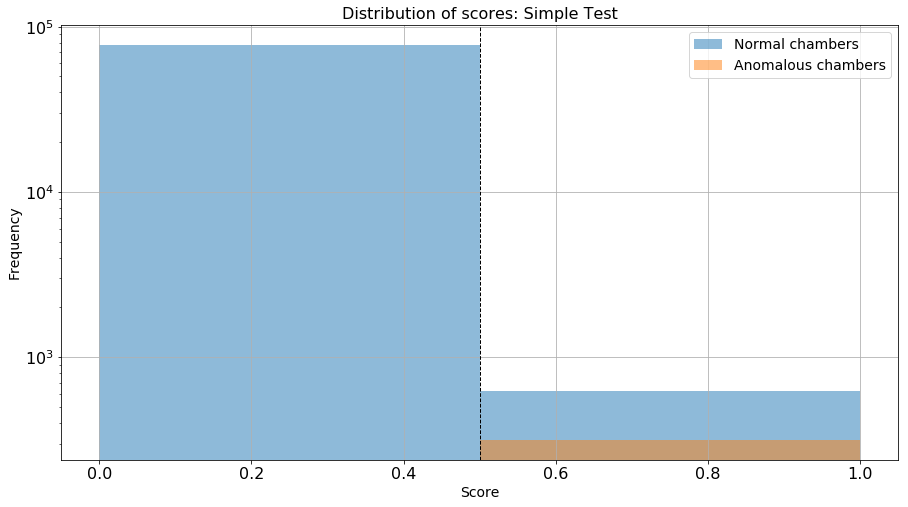

In [219]:
# Distribution of scores:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, +1, 3)
plt.hist(layers_test[(layers_test["score"] < 0) & (layers_test.run == 319579)]["st_score"],\
         bins=bins, alpha=0.5,\
         label="Normal chambers")
plt.hist(layers_test[(layers_test["score"] > 0) & (layers_test.run == 319579)]["st_score"],\
         bins=bins, alpha=0.5,\
         label="Anomalous chambers")
plt.title("Distribution of scores: Simple Test")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.5, color='k', linestyle='dashed', linewidth=1)
plt.show()

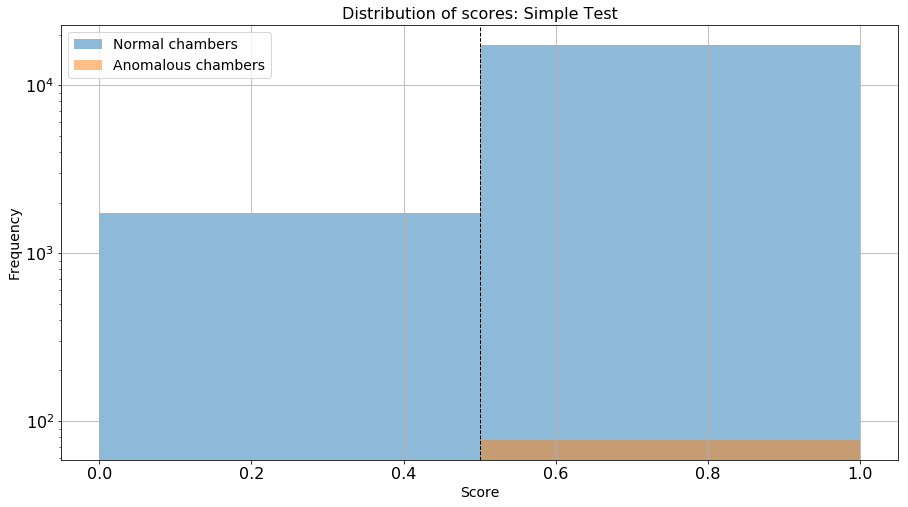

In [220]:
# Distribution of scores:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, +1, 3)
plt.hist(layers_test[(layers_test["score"] < 0) & (layers_test.run == 321312)]["st_score"],\
         bins=bins, alpha=0.5,\
         label="Normal chambers")
plt.hist(layers_test[(layers_test["score"] > 0) & (layers_test.run == 321312)]["st_score"],\
         bins=bins, alpha=0.5,\
         label="Anomalous chambers")
plt.title("Distribution of scores: Simple Test")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.5, color='k', linestyle='dashed', linewidth=1)
plt.show()

In [221]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Normalized confusion matrix
[[ 0.81498443  0.18501557]
 [ 0.          1.        ]]


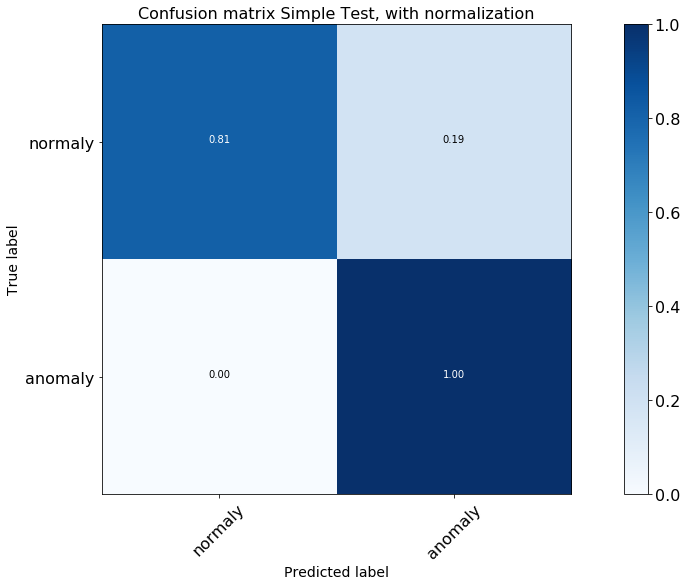

In [222]:
th_km = 0.0
y_pred = 2*(layers_test["st_score"] > th_km)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix Simple Test, with normalization')

In [223]:
def plotFpVsLs(run, wheel, sector, station, title, df, algo, threshold, log, bound):
    fig, ax = plt.subplots()
    if log:
        ax.set_yscale('log')
    bins = np.linspace(0, bound, int(bound/10)+10)
    (n, bins, patches) = plt.hist(df[(df["score"] == -1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="False positives")
    plt.hist(df[(df["score"] == 1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="True positives")
    plt.plot(df[(df["run"] == run)]["averageLS"],\
             df[(df["run"] == run)]["lumi"], "ro",\
             alpha=0.5, label="Inst. Lumi. $(x 10^{30} Hz/cm^2)$")
    plt.title(title+str(run))
    plt.legend(loc='best')
    plt.ylabel('Frequency')
    plt.xlabel('LS')
    plt.grid(True)
    #plt.plot([bound, bound], [0, 100], color='r', linestyle='--', linewidth=2)
    plt.show()
    return n

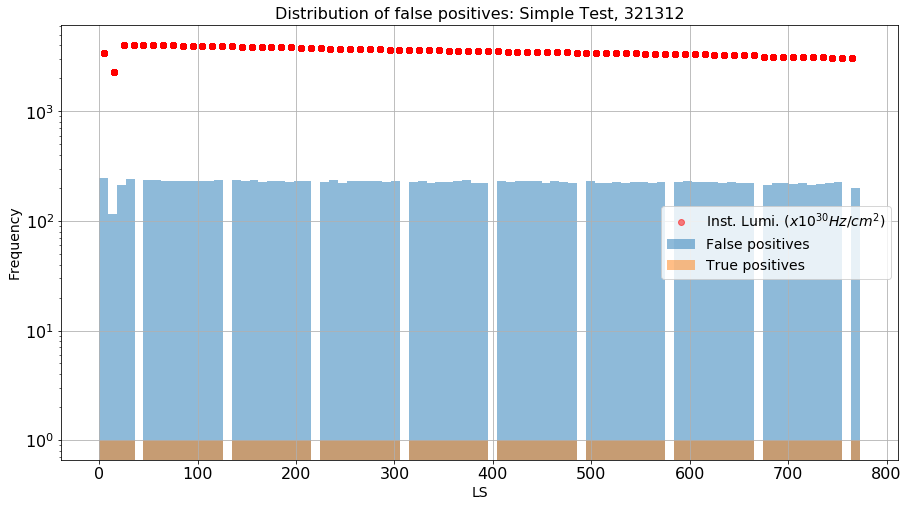

array([ 249.,  115.,  214.,  240.,    0.,  237.,  235.,  232.,  233.,
        234.,  231.,  233.,  234.,  238.,    0.,  235.,  231.,  239.,
        229.,  230.,  234.,  226.,  233.,  234.,    0.,  229.,  235.,
        224.,  233.,  234.,  230.,  234.,  225.,  230.,    0.,  225.,
        230.,  224.,  229.,  225.,  233.,  235.,  224.,  224.,    0.,
        231.,  229.,  234.,  234.,  230.,  224.,  232.,  228.,  221.,
          0.,  230.,  222.,  223.,  229.,  223.,  229.,  226.,  224.,
        228.,    0.,  225.,  231.,  228.,  226.,  227.,  220.,  227.,
        223.,  222.,    0.,  211.,  220.,  223.,  217.,  224.,  213.,
        216.,  220.,  226.,    0.,  199.])

In [224]:
layers_test["averageLS"] = layers_test["group"].apply(deduceLS)
threshold = 0.0
plotFpVsLs(321312, 0, 0, 0, "Distribution of false positives: Simple Test, ",\
           layers_test, "st_score",\
           threshold, True, boundaries[boundaries["run"] == 321312]["ls_end"])

## Inference

Making an inference using the model and the test sample:

In [225]:
sess = tf.Session()
sess.run(tf.global_variables_initializer())
K.set_session(sess)

In [226]:
def benchmark(y_true, y_score, treshold):
    y_pred = 2*(y_score > treshold)-1
    y_true = 2*(y_true > treshold)-1
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    sensitivity = round(float(tp)/(tp+fn), 4)
    specificity = round(float(tn)/(tn+fp), 4)

    print("Model accuracy: %s" % round(accuracy_score(y_true, y_pred), 4))
    print("Model sensitivity: %s" % sensitivity)
    print("Model specificity: %s" % specificity)

    return specificity, sensitivity

In [227]:
def get_roc_curve(test_df, models, working_point=None):
    """Generates ROC Curves for a given array"""
    fig, ax = plt.subplots()
    ax.grid()

    for legend_label, model_score in models:
        false_positive_rate, true_positive_rate, _ = roc_curve(test_df["score"],
                                                               test_df[model_score])
        #plt.xlim(0, 0.2)
        plt.plot(false_positive_rate, true_positive_rate, linewidth=2,
                 label=('%s, AUC: %s' % (legend_label,
                                         round(auc(false_positive_rate, true_positive_rate), 4))))
    if working_point:
        plt.plot(1-working_point[0],
                 working_point[1],
                 'o',
                 label="DNN working point")
    plt.title("ROC")
    plt.legend(loc='best')
    plt.ylabel('True positive rate')
    plt.xlabel('False positive rate')
    plt.show();

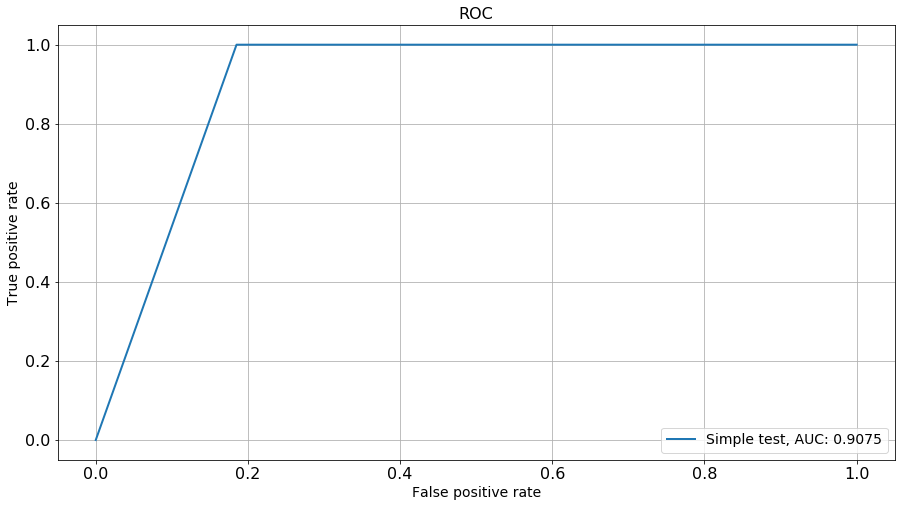

In [228]:
get_roc_curve(layers_test, 
              [
               #("AE", "cae_score"),
               #("SNN", "ann_score_1"),
               #("DNN (2 layers)", "ann_score_2"),
               #("DNN (3 layers)", "ann_score_3"),
               #("DNN (4 layers)", "ann_score_4"),
               ("Simple test", "st_score"),
               ], #(specificity_ann, sensitivity_ann)
             )

In [229]:
def get_matrix(df):
    x = np.zeros((5,12),dtype=int)
    for i in range(len(df)):
        a = int(5-df["station"].iloc[i])
        b = int(df["sector"].iloc[i]-1)
        x[a,b] = x[a,b] + 1
    return x

In [230]:
def plot_scatter(df, run, wheel, ls_min, ls_max):
    run_s = "All"
    wheel_s = "All"
    ls_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    if run != -1:
        temp = temp[(temp["run"] == run)]
        run_s = str(run)
    if ((ls_min != -1) & (ls_max == -1)):
        temp = temp[(temp["averageLS"] >= ls_min)]
        ls_s = "> "+str(ls_min)
    elif ((ls_min == -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] <= ls_max)]
        ls_s = "< "+str(ls_max)
    elif ((ls_min != -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] >= ls_min) & (temp["averageLS"] <= ls_max)]
        ls_s = " ["+str(ls_min)+", "+str(ls_max)+"]"
    mat = get_matrix(temp)
    #print mat
    #print mat.sum()

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, mat[i, j],\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Run: "+run_s+", Wheel: "+wheel_s+", LS: "+ls_s
    plt.title(title, loc="right")   
    plt.show()

In [231]:
def plot_scatter_2(df, arg, wheel):
    wheel_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    else:
        return 1
    
    mat = []
    for i in [5, 4, 3, 2, 1]:
        rule = (temp.station == i)
        vec = list(temp[rule][arg].values)
        if (i == 5):
            tmp = list(temp[rule][arg].values)
            vec = [0, 0, 0, tmp[0], 0, 0, 0, 0, 0, tmp[1], 0, 0]
        mat.append(vec)
        #print i, temp[rule]["ratio"].values
    #print mat

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, round(mat[i][j], 2),\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Wheel: "+wheel_s
    plt.title(title, loc="right")   
    plt.show()

Decrease in rate per station and sector in each wheel:

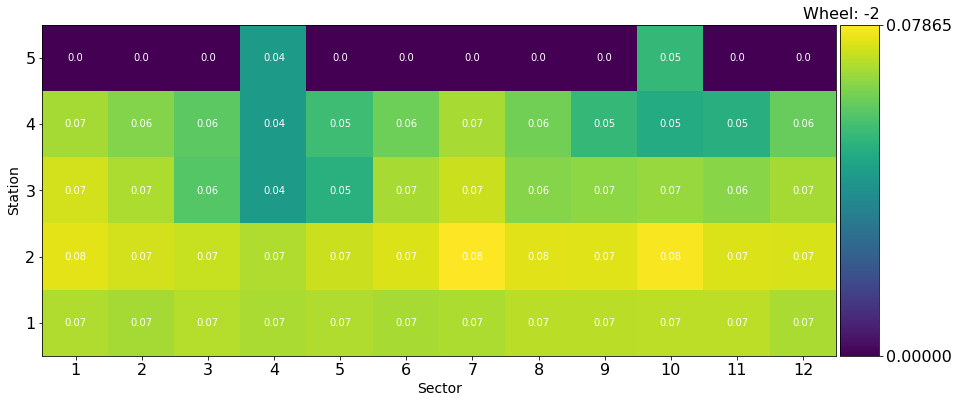

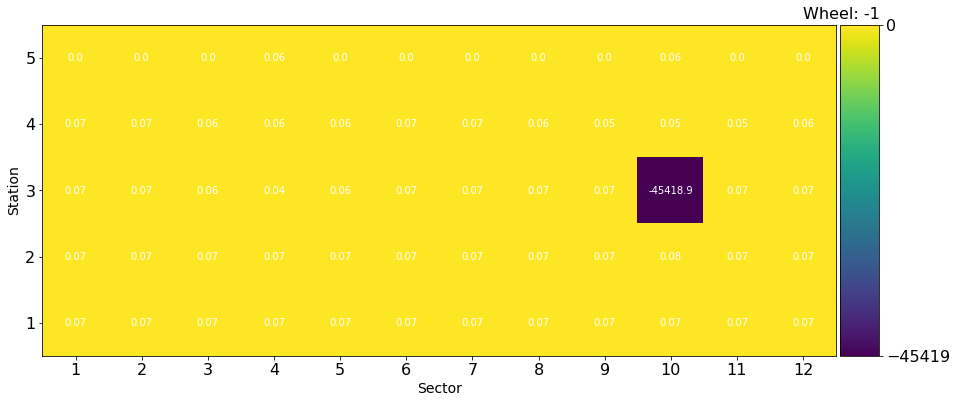

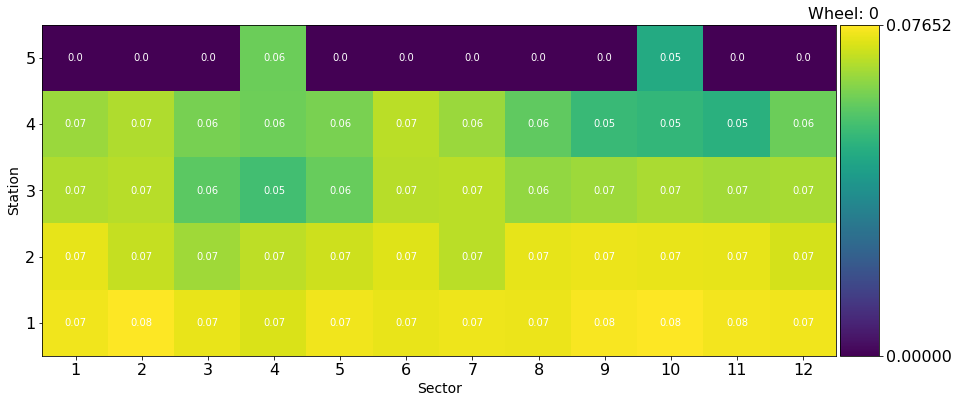

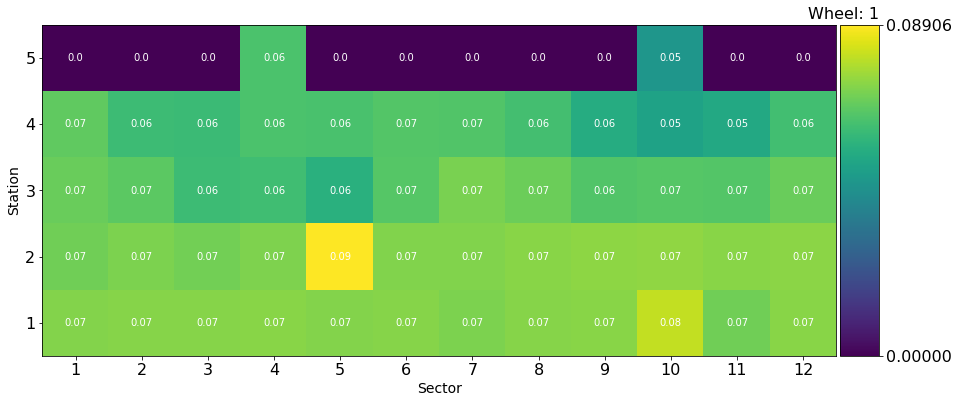

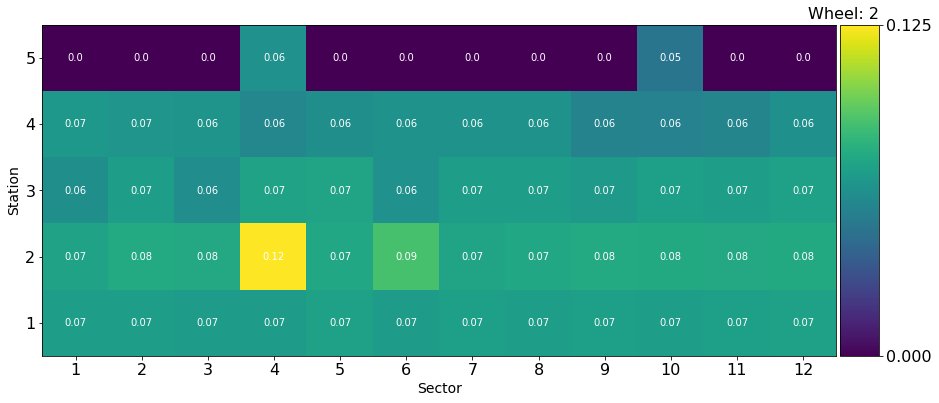

In [232]:
plot_scatter_2(ratio, "ratio", -2)
plot_scatter_2(ratio, "ratio", -1)
plot_scatter_2(ratio, "ratio", 0)
plot_scatter_2(ratio, "ratio", +1)
plot_scatter_2(ratio, "ratio", +2)

Cross-section per station and sector in each wheel for the reference run:

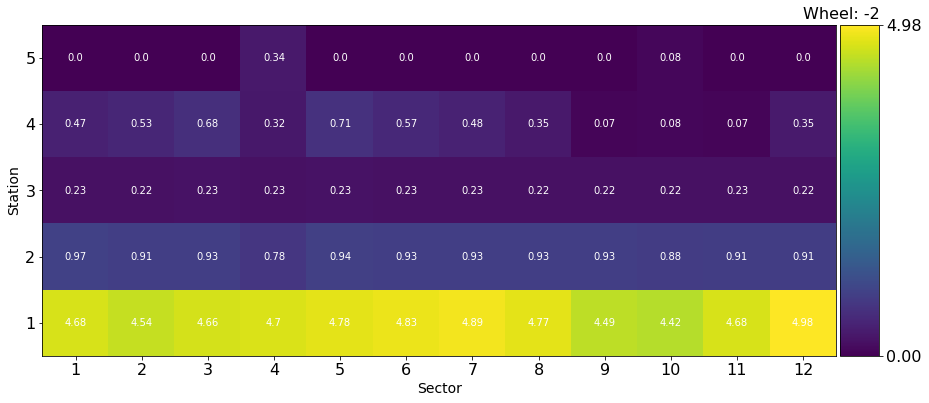

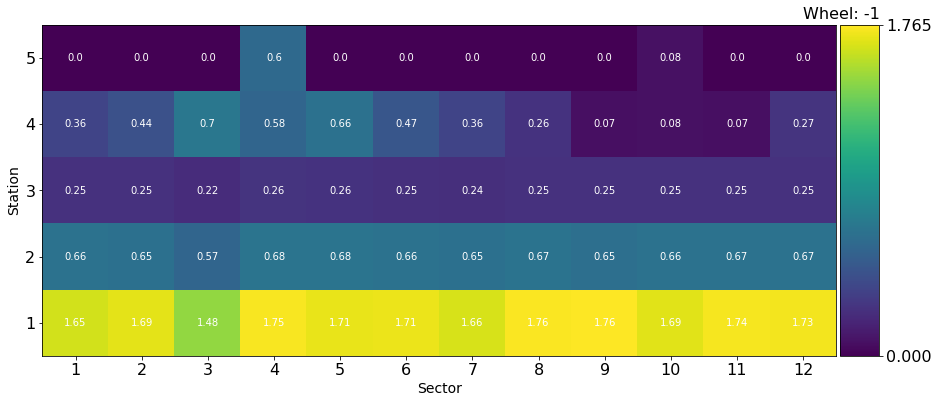

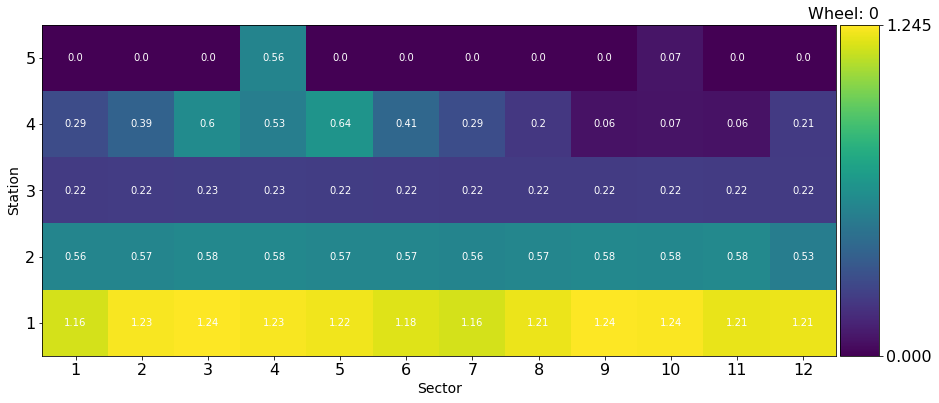

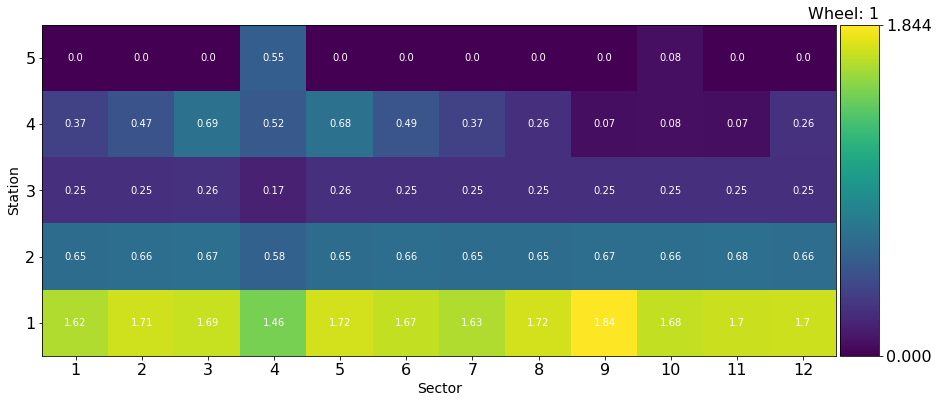

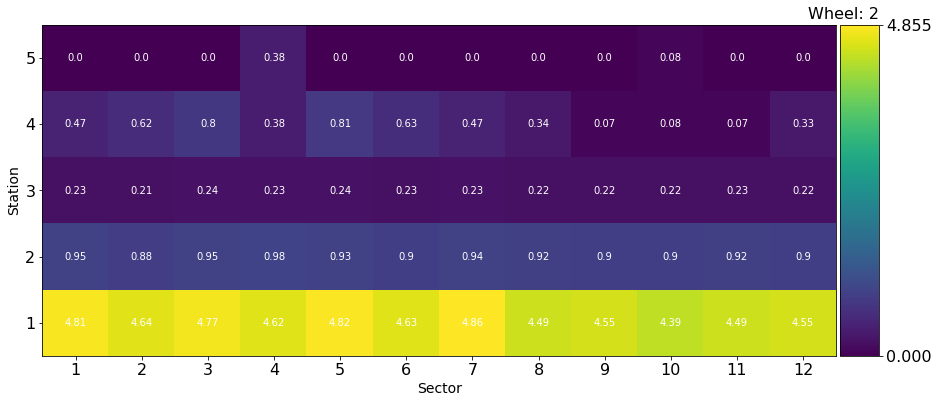

In [233]:
plot_scatter_2(ratio, "cs_norm", -2)
plot_scatter_2(ratio, "cs_norm", -1)
plot_scatter_2(ratio, "cs_norm", 0)
plot_scatter_2(ratio, "cs_norm", +1)
plot_scatter_2(ratio, "cs_norm", +2)

Cross-section per station and sector in each wheel for the anomalous run:

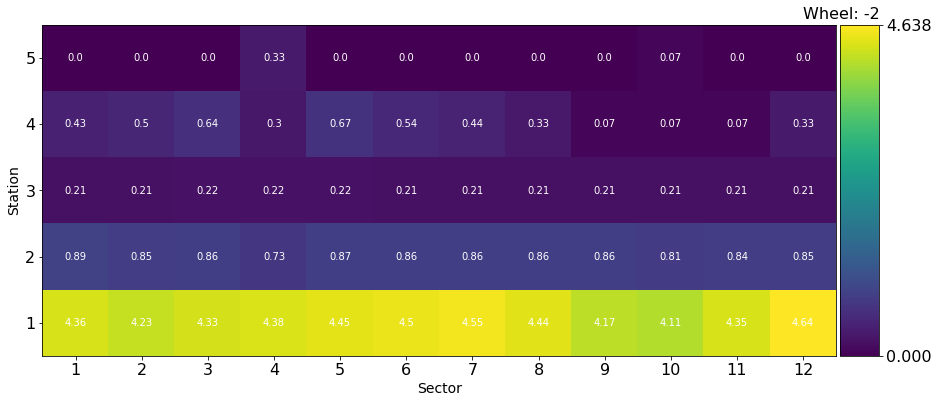

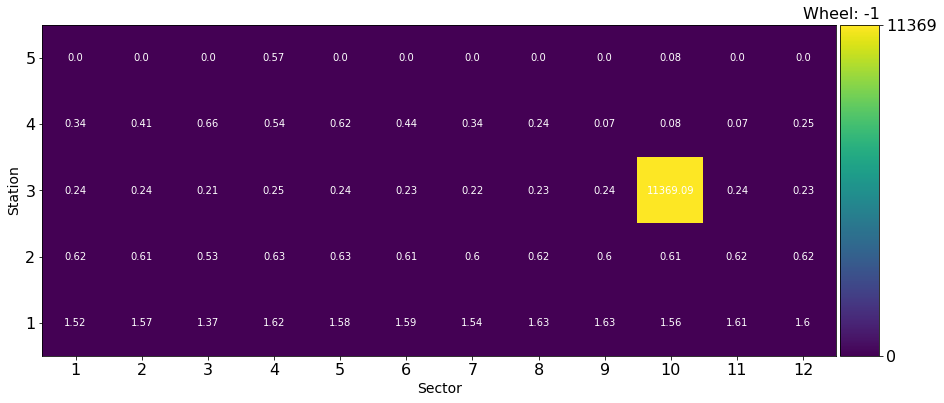

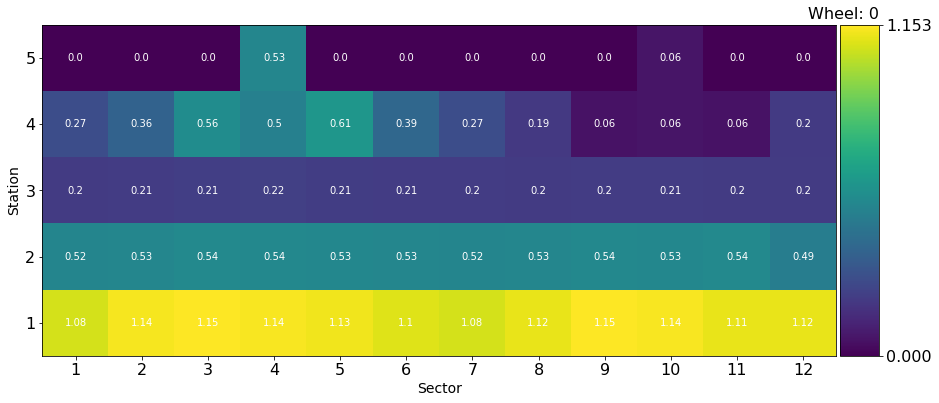

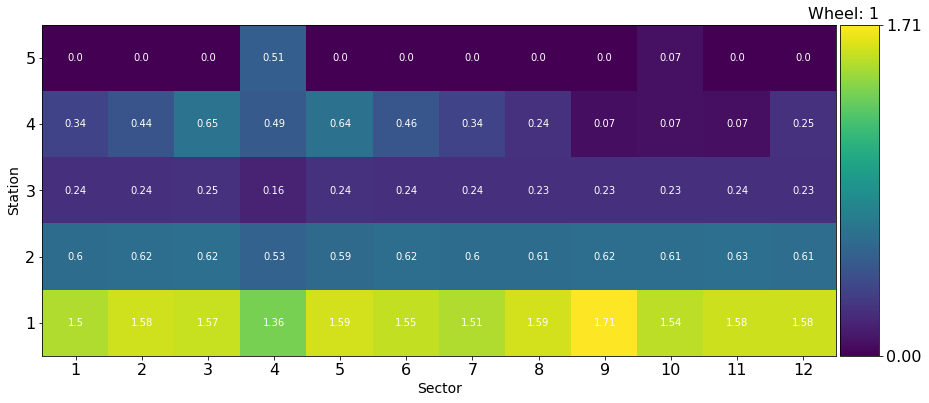

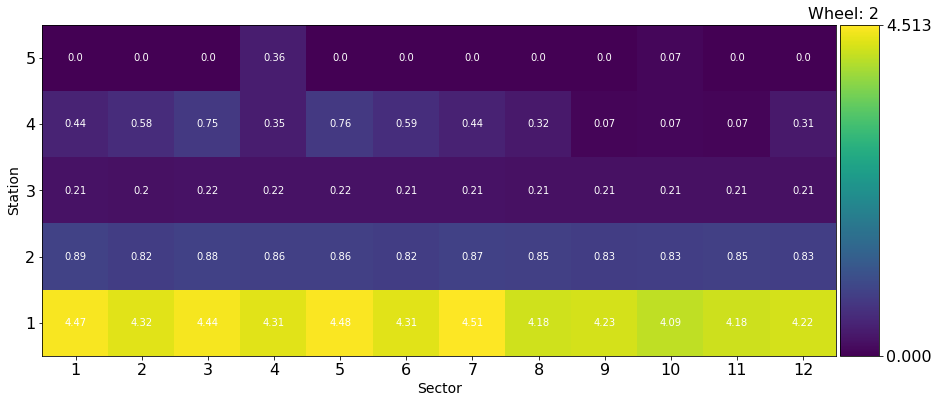

In [234]:
plot_scatter_2(ratio, "cs_anomal", -2)
plot_scatter_2(ratio, "cs_anomal", -1)
plot_scatter_2(ratio, "cs_anomal", 0)
plot_scatter_2(ratio, "cs_anomal", +1)
plot_scatter_2(ratio, "cs_anomal", +2)

Trying unsupervised algorithms:

In [235]:
# fit the model
from sklearn.neighbors import LocalOutlierFactor
lofclf = LocalOutlierFactor(n_neighbors=1201,
                            contamination=0.2
                           )#It has to be a odd number
layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_scaled"].values))

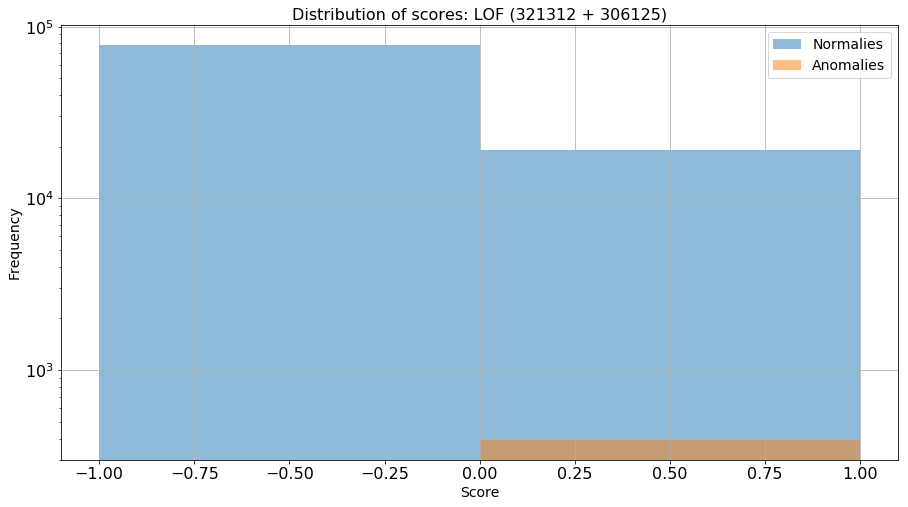

In [236]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(-1, +1, 3)
plt.hist(layers_test[layers_test["score"] < 0]["lof_score"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_test[layers_test["score"] > 0]["lof_score"], bins=bins, alpha=0.5, label="Anomalies")
plt.title("Distribution of scores: LOF (321312 + 306125)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.show()

Normalized confusion matrix
[[ 0.80321285  0.19678715]
 [ 0.          1.        ]]


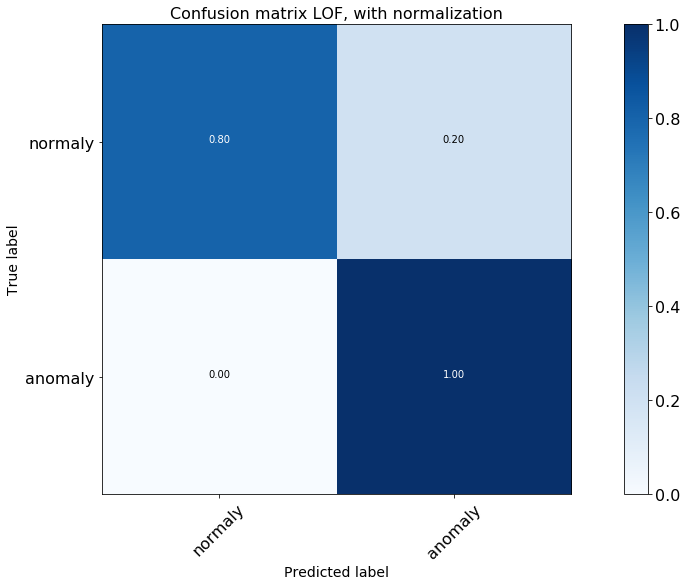

In [237]:
threshold = 0.0
y_pred = 2*(layers_test["lof_score"] > threshold)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix LOF, with normalization')

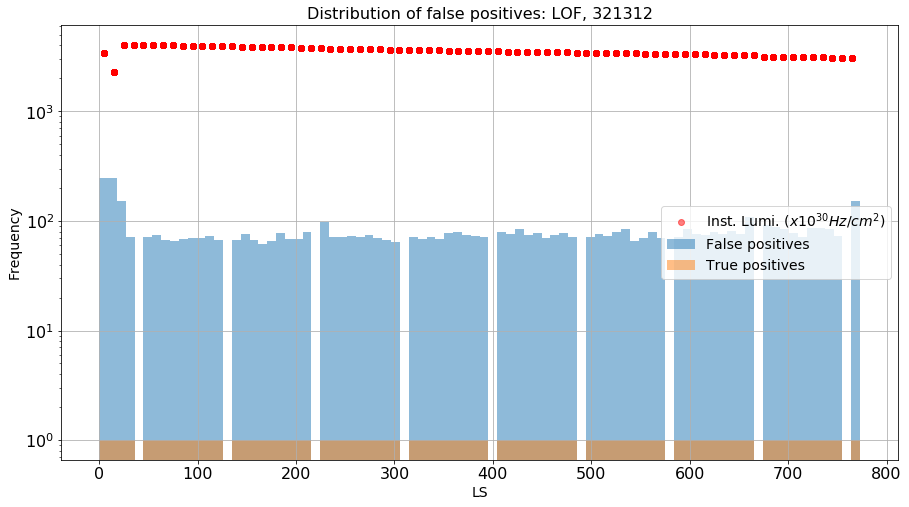

array([ 249.,  249.,  151.,   71.,    0.,   71.,   75.,   67.,   65.,
         68.,   70.,   70.,   73.,   67.,    0.,   67.,   76.,   67.,
         62.,   65.,   77.,   69.,   69.,   79.,    0.,   97.,   72.,
         71.,   73.,   72.,   75.,   70.,   67.,   64.,    0.,   72.,
         69.,   72.,   69.,   78.,   80.,   74.,   73.,   71.,    0.,
         79.,   76.,   84.,   74.,   78.,   70.,   74.,   77.,   71.,
          0.,   71.,   76.,   73.,   80.,   84.,   66.,   70.,   80.,
         70.,    0.,   71.,   84.,   76.,   75.,   79.,   76.,   81.,
         76.,  109.,    0.,   91.,   88.,   85.,   77.,   71.,   86.,
         87.,   85.,   73.,    0.,  153.])

In [238]:
layers_test["averageLS"] = layers_test["group"].apply(deduceLS)
threshold = 0.0
plotFpVsLs(321312, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
           threshold, True, boundaries[boundaries["run"] == 321312]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
            #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])

## K-Means clustering reduced

In [239]:
# 0.system, 1.wheel, 2.sector, 3.station, 4.lumi, 5.err, 6.rate, 7.err, 8.CS, 9.err
def removeItem(data):
    index = [0, 4, 5, 6, 7, 9] #leaving only position and CS
    #index = [0, 5, 7, 9] #removing system and errors
    temp = data.copy()
    temp = np.delete(temp, index)
    return temp

layers_test["content_red"] = layers_test["content"].apply(removeItem)
layers_test["content_red"] = layers_test["content_red"].apply(np.array)

In [240]:
#Reindex because otherwise anomalies and normalies have the same labels/indexes in W+3_S4_MB3
layers_test.index = pd.RangeIndex(len(layers_test.index))

def scale_cs(df, factors):
    for i in [-2, -1, 0, +1, +2]:
        for j in range(1, 13):
             for k in range(1, 6):
                rule = (df.wheel == i) & (df.sector == j) & (df.station == k)
                rule_f = (factors.wheel == i) & (factors.sector == j) & (factors.station == k)
                indexes = df[rule].index
                indexes_f = (factors[rule_f].index)
                if ((len(indexes) == 0) | (len(indexes_f) == 0)):
                    continue
                #print factors.loc[indexes_f[0], "factor"]
                for m in indexes:
                    #print i, j, k, m, df.loc[m, "content_red"]
                    content =  df.loc[m, "content_red"].copy()
                    #print i, j, k, m, df.loc[m, "content_red"], content
                    content[3] = content[3]*factors.loc[indexes_f[0], "factor"]
                    #print i, j, k, m, df.loc[m, "content_red"], content
                    df.at[m, "content_red"] = content

scale_cs(layers_test, factors)

In [241]:
#0.No rescaling
#1.RobustScaler
#2.MaxAbsScaler 
#3.QuantileTransformerUniform: NO
#4.QuantileTransformerNormal: NO
#5.Normalizer
#6.MinMaxScaler

scaler_type = 5
layers_test["content_red_scaled"] = layers_test["content_red"].apply(scale_data, args=[scaler_type])

In [242]:
print layers_test["content_red"].iloc[100]
print layers_test["content_red_scaled"].iloc[100]

[-2 -4 -2 6.002920605877816]
[[-0.25812349 -0.51624699 -0.25812349  0.77474742]]


In [243]:
def extract_cs(data):
    #print data[0][3]
    return data[3]

layers_test["CS_red"] = layers_test["content_red"].apply(extract_cs)

In [244]:
def plot_scatter_3(df, arg, wheel, range_ = False):
    wheel_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    else:
        return 1
    
    if (range_):
        temp = temp[temp.lumi > 10000]
    temp = temp.groupby(['run', 'board', 'wheel', 'sector', 'system', 'station'])\
    [[arg]].mean().reset_index()
    #print temp
    
    mat = []
    for i in [5, 4, 3, 2, 1]:
        rule = (temp.station == i)
        temp2 = temp[rule].sort_values(["sector"], ascending=True)
        vec = list(temp2[arg].values)
        if (i == 5):
            tmp = list(temp2[arg].values)
            vec = [0, 0, 0, tmp[0], 0, 0, 0, 0, 0, tmp[1], 0, 0]
        mat.append(vec)
        #print i, temp[rule][arg].values
    #print mat

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, round(mat[i][j], 2),\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Wheel: "+wheel_s
    plt.title(title, loc="right")   
    plt.show()

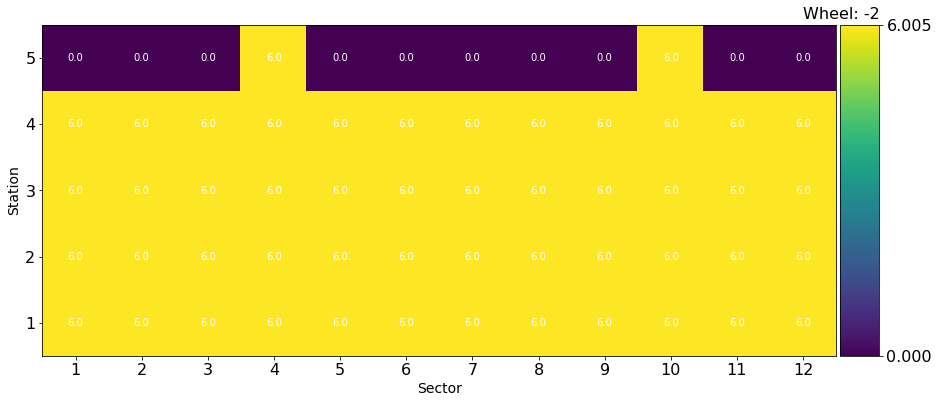

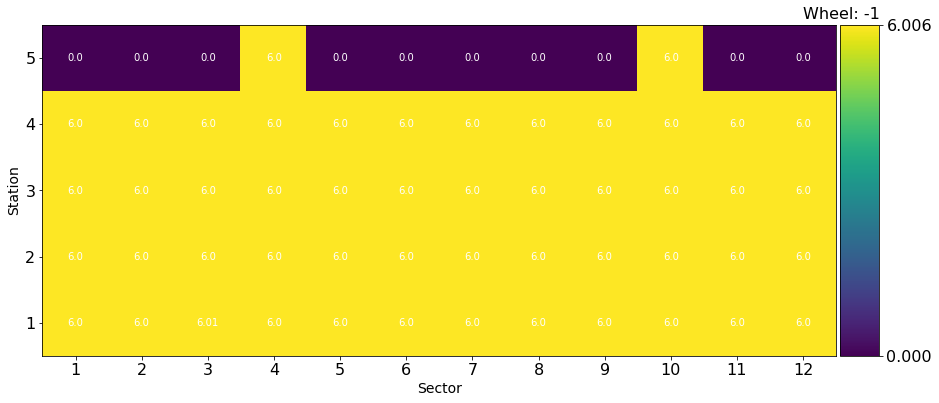

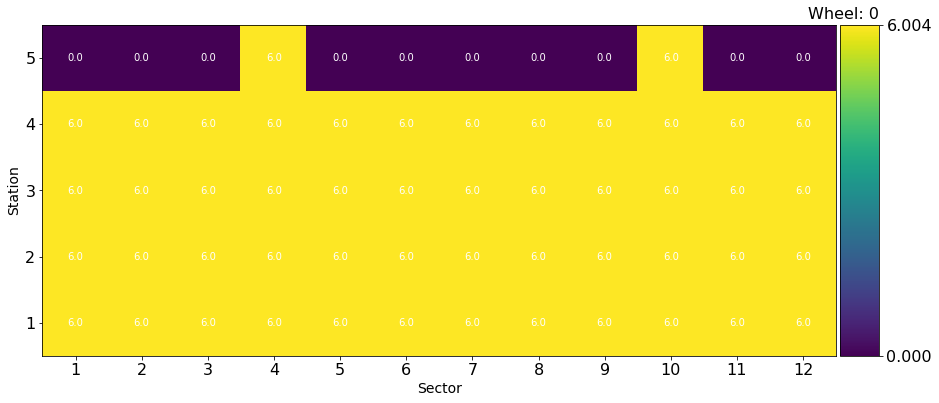

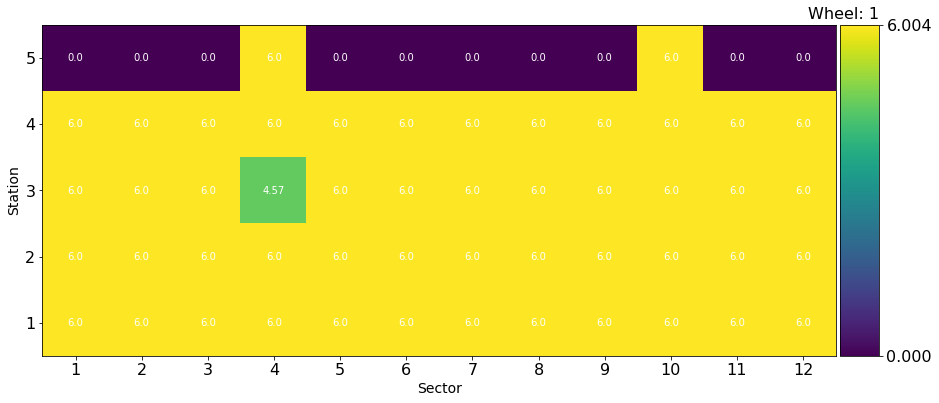

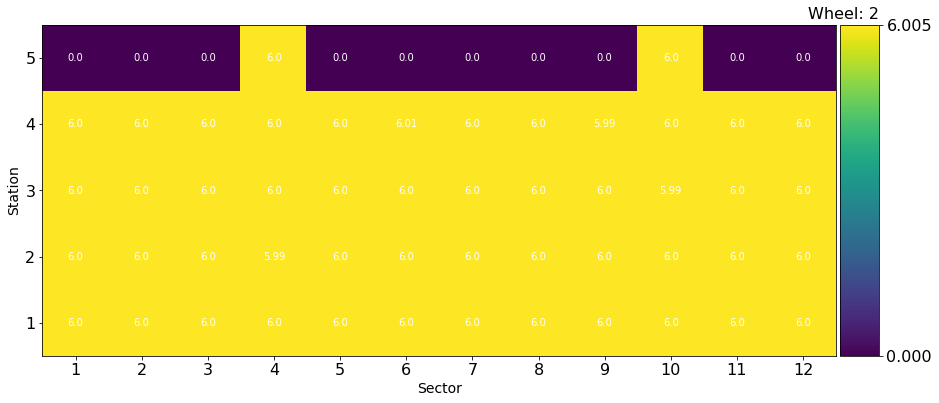

In [245]:
plot_scatter_3(layers_test[layers_test.run == 319579], "CS_red", -2, True)
plot_scatter_3(layers_test[layers_test.run == 319579], "CS_red", -1, True)
plot_scatter_3(layers_test[layers_test.run == 319579], "CS_red", 0, True)
plot_scatter_3(layers_test[layers_test.run == 319579], "CS_red", +1, True)
plot_scatter_3(layers_test[layers_test.run == 319579], "CS_red", +2, True)

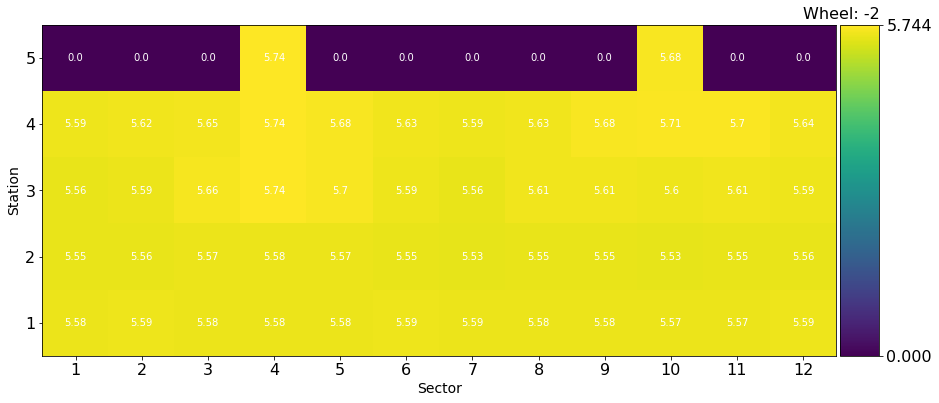

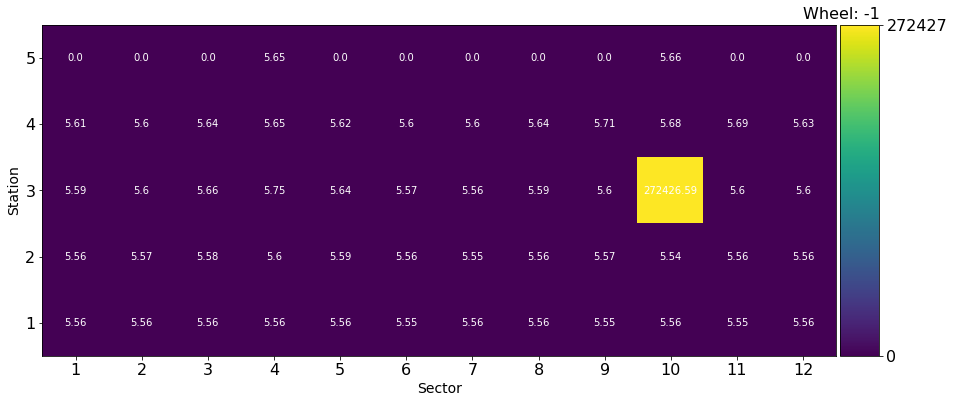

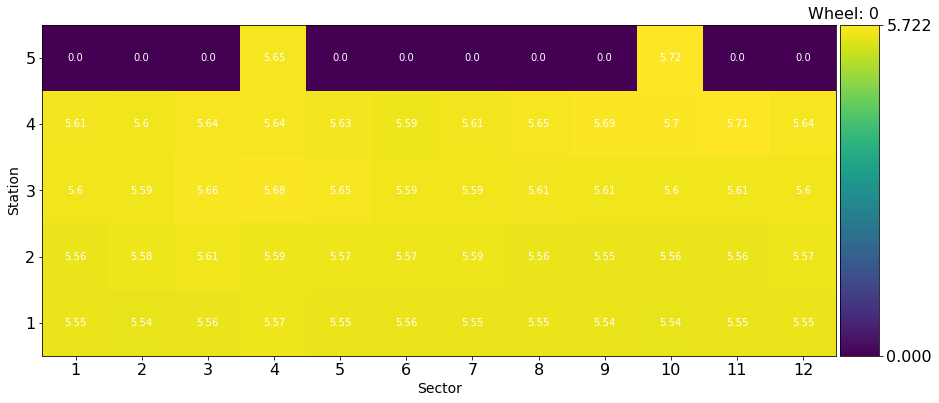

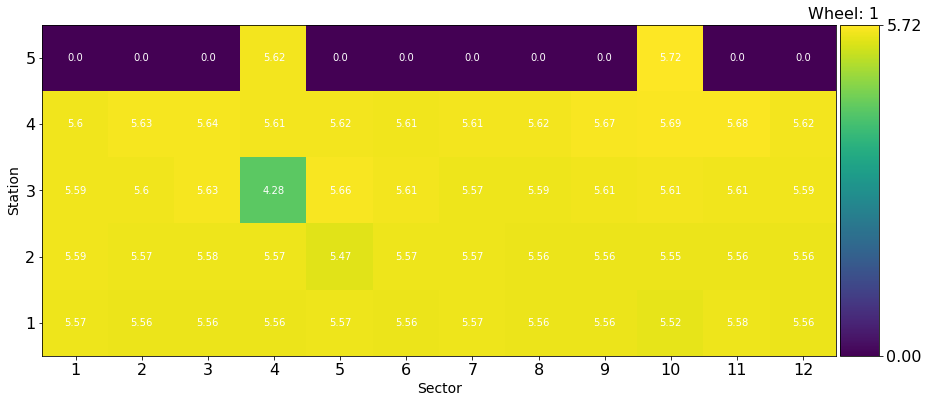

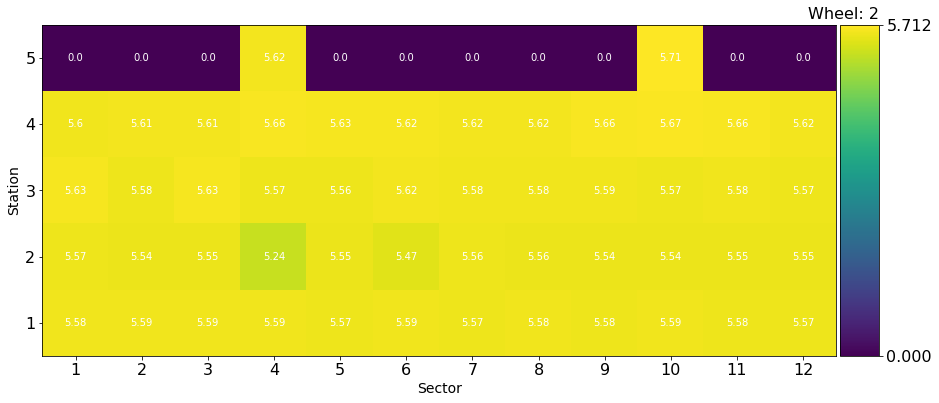

In [246]:
plot_scatter_3(layers_test[layers_test.run == 321312], "CS_red", -2)
plot_scatter_3(layers_test[layers_test.run == 321312], "CS_red", -1)
plot_scatter_3(layers_test[layers_test.run == 321312], "CS_red", 0)
plot_scatter_3(layers_test[layers_test.run == 321312], "CS_red", +1)
plot_scatter_3(layers_test[layers_test.run == 321312], "CS_red", +2)

In [247]:
#n_cls = 150
#from sklearn import cluster, datasets
#k_means = cluster.KMeans(n_clusters=n_cls)
#distances = k_means.fit_transform(np.vstack(layers_test["content_red"].values))
#layers_test["kmeans_score"] = k_means.labels_

In [248]:
# load the model from disk
from sklearn.externals import joblib
filename = './model_sktlearn/kmeans_red_2018.sav'
k_means = joblib.load(filename)

Removing the lumi oscillations:

In [280]:
rule = (layers_test.run == 321312) & (layers_test.ls > 50)
#& (layers_test.score == 1)
reduced_anom = layers_test[rule].copy()

In [281]:
distances_test = k_means.transform(np.vstack(reduced_anom["content_red"].values))
minim = []
for i in range(0, len(distances_test)):
    #print  min(distances_test[i])
    minim.append(min(distances_test[i]))
reduced_anom["dist"] = minim

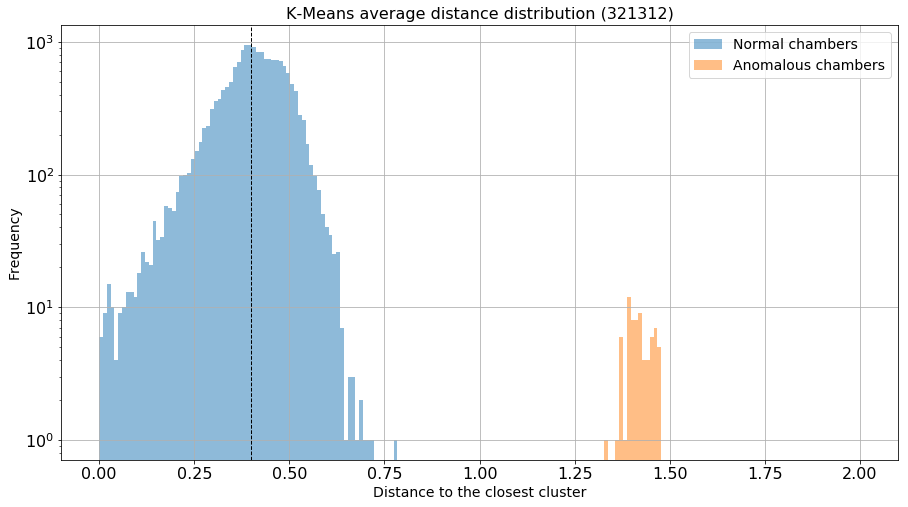

In [282]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 2.0, 200)
plt.hist(reduced_anom[reduced_anom["score"] < 0]["dist"], bins=bins,\
         alpha=0.5, label="Normal chambers")
plt.hist(reduced_anom[reduced_anom["score"] > 0]["dist"], bins=bins,\
         alpha=0.5, label="Anomalous chambers")
plt.axvline(0.4, color='k', linestyle='dashed', linewidth=1)
plt.title("K-Means average distance distribution (321312)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Distance to the closest cluster')
plt.show()

Normalized confusion matrix
[[ 0.45124944  0.54875056]
 [ 0.          1.        ]]


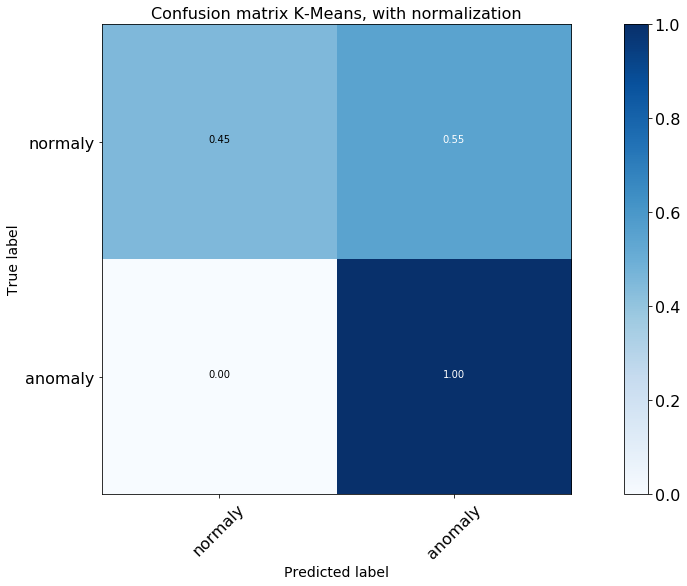

In [283]:
th_km = 0.4
y_pred = 2*(reduced_anom["dist"] > th_km)-1
cnf_matrix = confusion_matrix(reduced_anom["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix K-Means, with normalization')

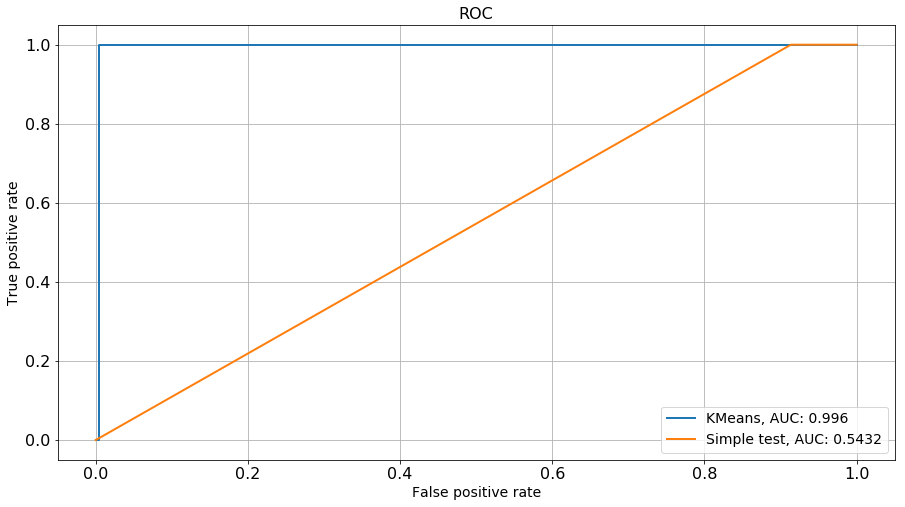

In [284]:
get_roc_curve(reduced_anom,[
                           #("Variance", "variance_score"),
                           #("IF", "if_score"),
                           #("SVM", "svm_score"),
                           #("AE", "cae_score"),
                           ("KMeans", "dist"),
                           #("DNN", "ann_score_4"),
                           ("Simple test", "st_score"),
                          ]
             )

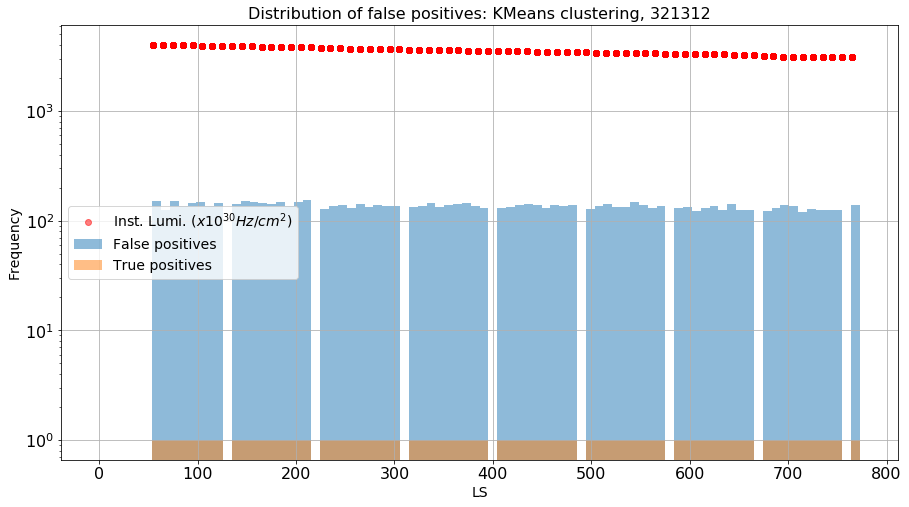

array([   0.,    0.,    0.,    0.,    0.,    0.,  150.,  125.,  152.,
        137.,  144.,  148.,  136.,  144.,    0.,  141.,  151.,  148.,
        144.,  143.,  147.,  137.,  148.,  156.,    0.,  128.,  136.,
        140.,  132.,  142.,  133.,  138.,  137.,  135.,    0.,  134.,
        137.,  145.,  134.,  139.,  141.,  144.,  137.,  132.,    0.,
        132.,  134.,  140.,  141.,  139.,  132.,  138.,  137.,  139.,
          0.,  128.,  135.,  143.,  133.,  134.,  147.,  138.,  132.,
        137.,    0.,  130.,  134.,  122.,  132.,  137.,  125.,  141.,
        126.,  125.,    0.,  123.,  131.,  138.,  135.,  121.,  127.,
        126.,  126.,  125.,    0.,  140.])

In [285]:
threshold = th_km
plotFpVsLs(321312, 0, 0, 0, "Distribution of false positives: KMeans clustering, ", reduced_anom, "dist",\
           threshold, True, boundaries[boundaries["run"] == 321312]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
            #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])

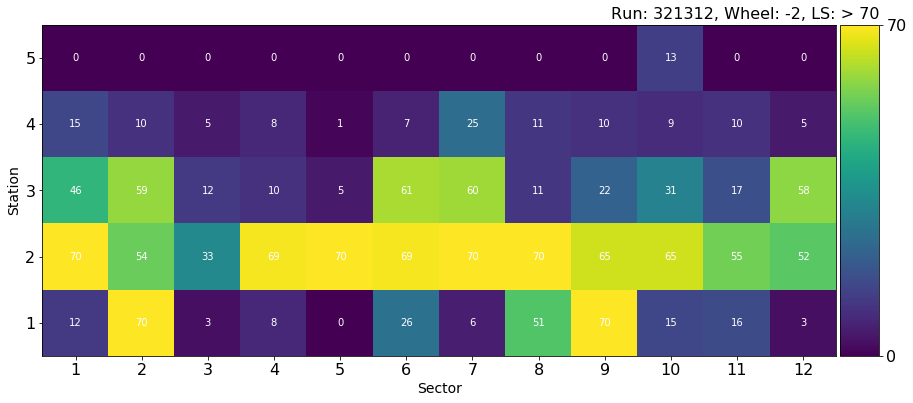

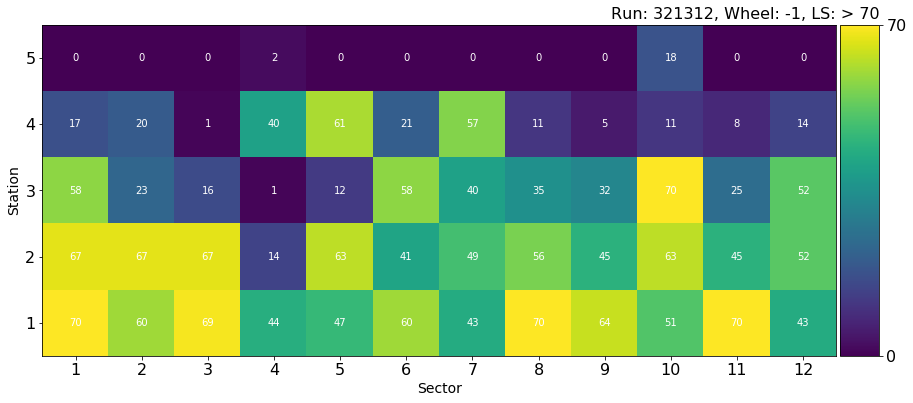

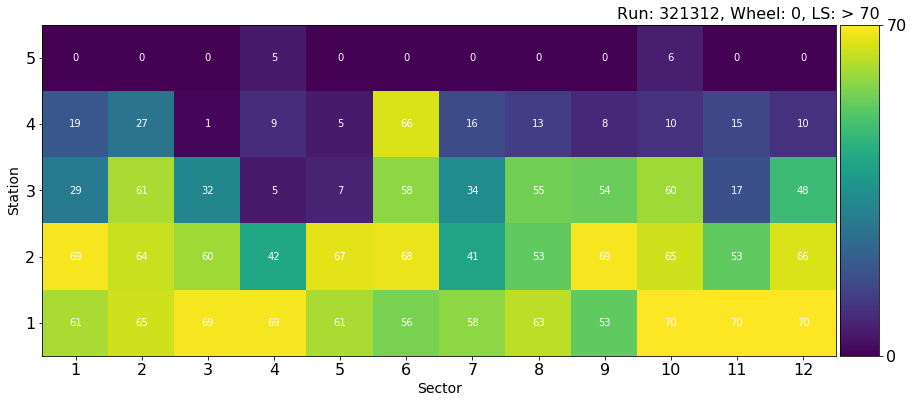

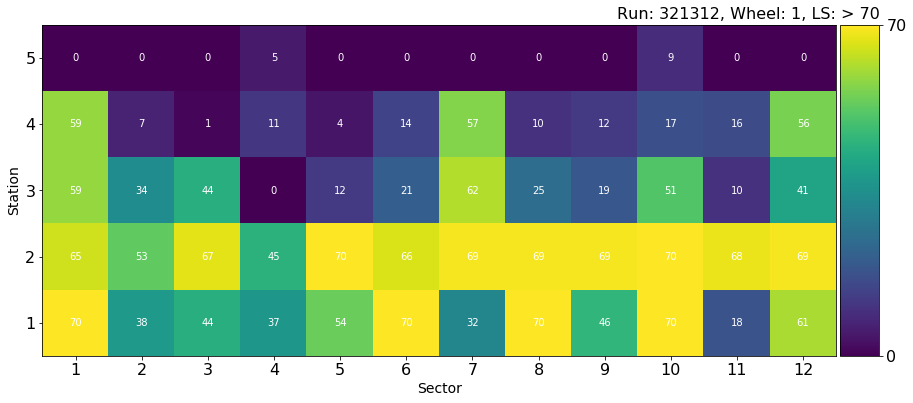

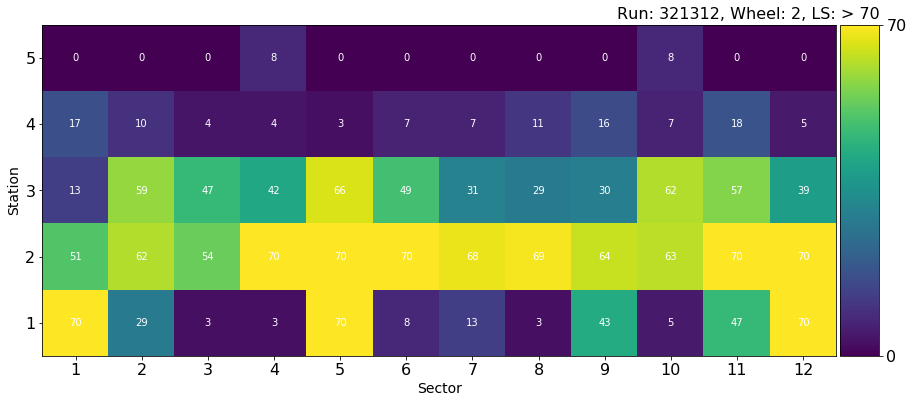

In [286]:
dis_nn = "dist"
rule = (reduced_anom["score"] == -1) & (reduced_anom[dis_nn] > th_km)

plot_scatter(reduced_anom[rule], 321312, -2, 70, -1)
plot_scatter(reduced_anom[rule], 321312, -1, 70, -1)
plot_scatter(reduced_anom[rule], 321312, 0, 70, -1)
plot_scatter(reduced_anom[rule], 321312, +1, 70, -1)
plot_scatter(reduced_anom[rule], 321312, +2, 70, -1)

## LOF reduced

Removing the lumi oscillations:

In [287]:
rule1 = (layers_test.run == 321312) & ((layers_test.ls > 50))
rule2 = (layers_test.run == 319579) & ((layers_test.ls > 50)) & ((layers_test.ls < 3000))
reduced_anom_2 = layers_test[rule1 | rule2].copy()

In [296]:
# fit the model
lofclf = LocalOutlierFactor(n_neighbors=1201, contamination=0.2)#It has to be a odd number
reduced_anom_2["lof_score_red"] = -lofclf.fit_predict(np.vstack(reduced_anom_2["content_red"].values))

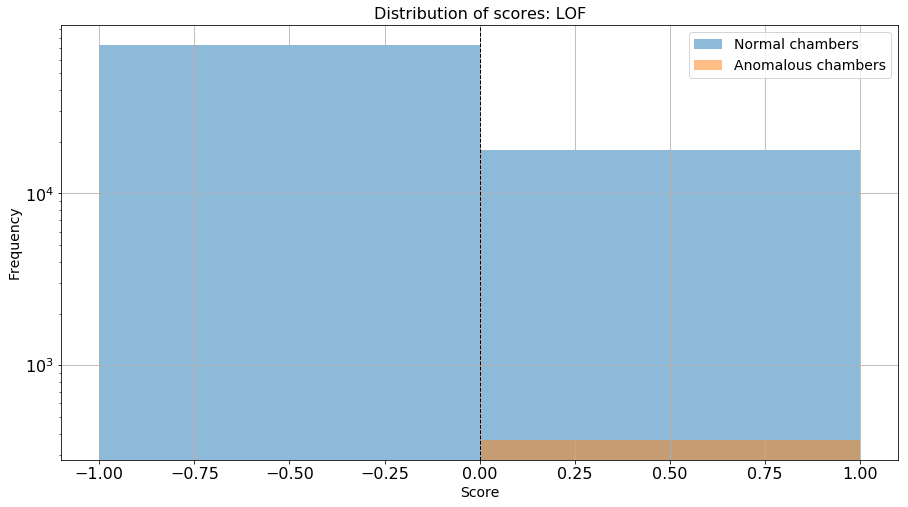

In [297]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(-1, +1, 3)
plt.hist(reduced_anom_2[reduced_anom_2["score"] < 0]["lof_score_red"],\
         bins=bins, alpha=0.5, label="Normal chambers")
plt.hist(reduced_anom_2[reduced_anom_2["score"] > 0]["lof_score_red"],\
         bins=bins, alpha=0.5, label="Anomalous chambers")
plt.title("Distribution of scores: LOF")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.0, color='k', linestyle='dashed', linewidth=1)
plt.show()

Normalized confusion matrix
[[ 0.80321285  0.19678715]
 [ 0.          1.        ]]


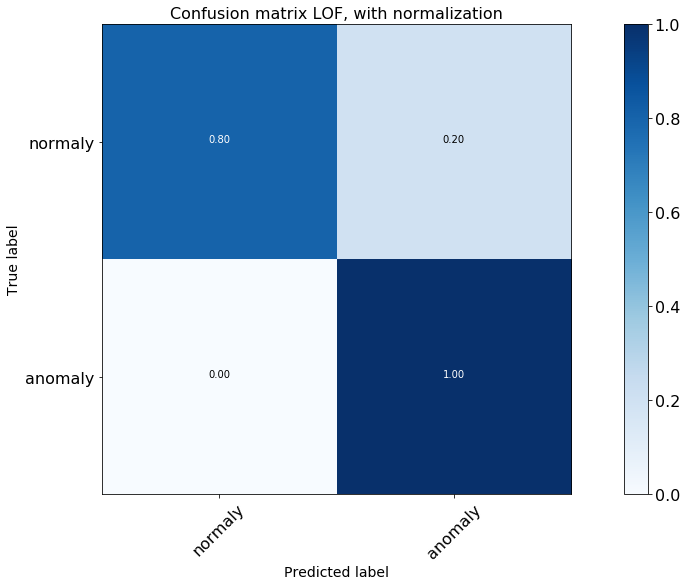

In [298]:
threshold = 0.0
y_pred = 2*(reduced_anom_2["lof_score_red"] > threshold)-1
cnf_matrix = confusion_matrix(reduced_anom_2["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix LOF, with normalization')

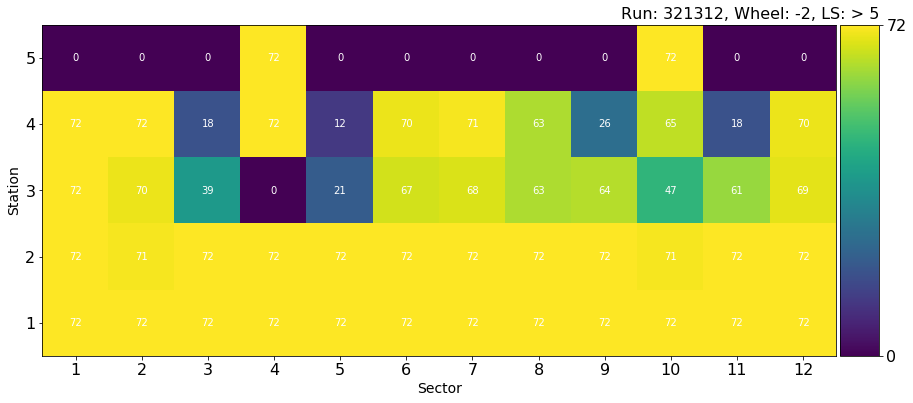

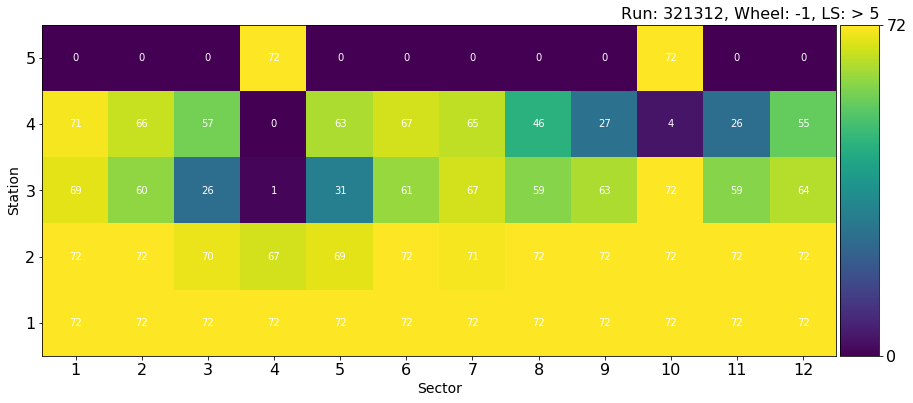

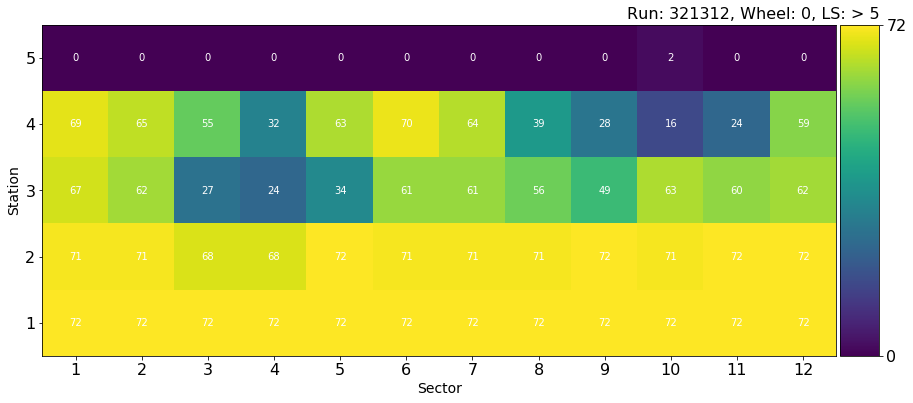

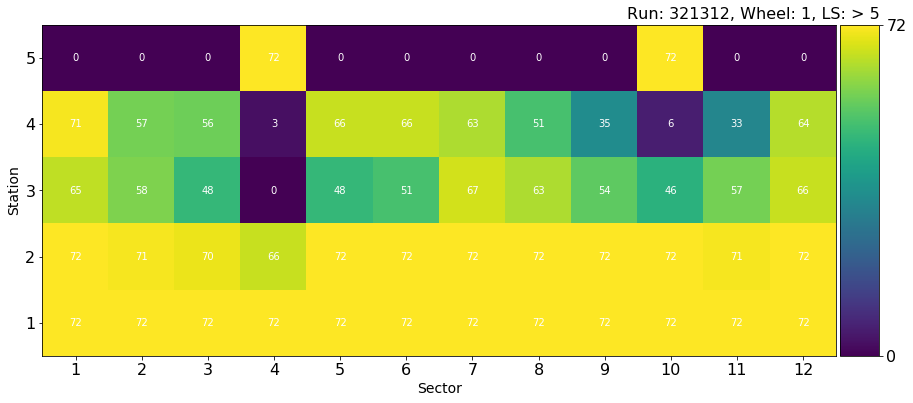

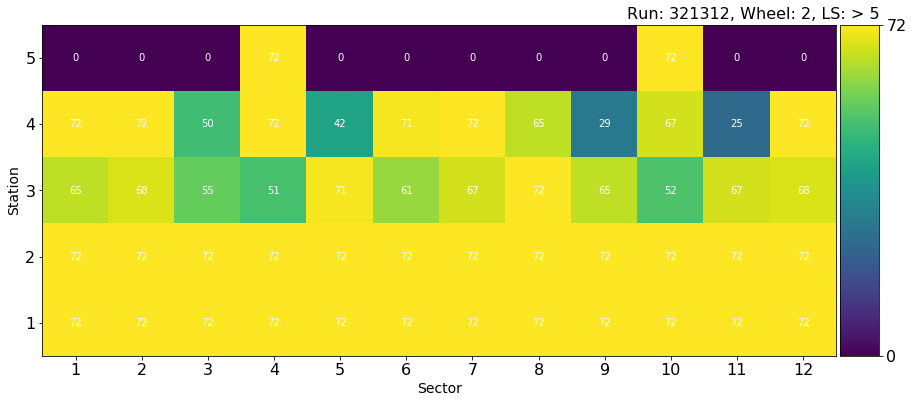

In [291]:
dis_nn = "lof_score_red"
rule = (reduced_anom_2["score"] == -1) & (reduced_anom_2[dis_nn] > th_km)

plot_scatter(reduced_anom_2[rule], 321312, -2, 5, -1)
plot_scatter(reduced_anom_2[rule], 321312, -1, 5, -1)
plot_scatter(reduced_anom_2[rule], 321312, 0, 5, -1)
plot_scatter(reduced_anom_2[rule], 321312, +1, 5, -1)
plot_scatter(reduced_anom_2[rule], 321312, +2, 5, -1)

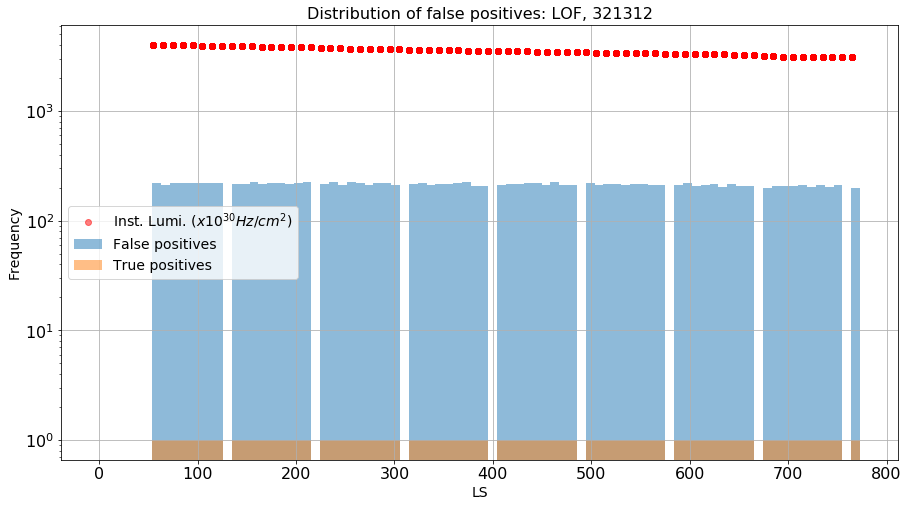

array([   0.,    0.,    0.,    0.,    0.,    0.,  223.,  214.,  220.,
        220.,  219.,  222.,  220.,  223.,    0.,  218.,  216.,  225.,
        217.,  221.,  219.,  218.,  222.,  225.,    0.,  216.,  226.,
        213.,  224.,  222.,  213.,  219.,  221.,  211.,    0.,  215.,
        222.,  210.,  218.,  215.,  222.,  226.,  209.,  209.,    0.,
        212.,  215.,  218.,  221.,  219.,  214.,  225.,  214.,  214.,
          0.,  221.,  213.,  217.,  216.,  212.,  218.,  215.,  211.,
        211.,    0.,  211.,  220.,  209.,  212.,  216.,  205.,  215.,
        209.,  207.,    0.,  199.,  206.,  206.,  208.,  212.,  204.,
        211.,  204.,  213.,    0.,  199.])

In [292]:
reduced_anom_2["averageLS"] = reduced_anom_2["group"].apply(deduceLS)
threshold = 0.0
plotFpVsLs(321312, 0, 0, 0, "Distribution of false positives: LOF, ", reduced_anom_2, "lof_score_red",\
           threshold, True, boundaries[boundaries["run"] == 321312]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
            #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])